# Invariant Slot Attention

**Goal:** I sort of thad this intuition for awhile that I want to be able to encode "circleness" into the slot representations that we're learning.

This idea from the SA follow-up paper is not _exactly_ the same as this, but I think it's going in this direction!

**Other optimization tricks included in this paper:**
- Cosine decay (instead of exponential decay)
- Use ResNet-34 as the image feature extractor model for 
    * They did modify the base block of this model to have stride 1 instead of 3
- They do also add a $\delta$ division with the positional embedding (they set $\delta = 5$).
   

In [1]:
import torch
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mlp
from mpl_toolkits.axes_grid1 import make_axes_locatable

import json, yaml, os
os.sys.path.append('code')

from plotting import plot_kslots, plot_kslots_iters
from data import make_batch
from model import SoftPositionalEmbed, build_grid
from torch.nn import init
#from train import hungarian_matching

import torch
import torch.nn.functional as F

%load_ext autoreload
%autoreload 2

In [2]:
def hungarian_matching(att, mask,bs, k_slots,max_n_rings,nPixels_x,nPixels_y):
    '''
    Hungarian section Translated from the TensorFlow loss function (from 2006.15055 code):
    https://github.com/nhartman94/google-research/blob/master/slot_attention/utils.py#L26-L57
    '''
    
    flat_mask = mask.reshape(-1,max_n_rings, nPixels_x*nPixels_y)[:,None,:,:]
    
    att_ext  = torch.tile(att.unsqueeze(2),  dims=(1,1,max_n_rings,1)) #.reshape(bs * k_slots * max_n_rings , nPixels**2)
    mask_ext = torch.tile(flat_mask,dims=(1,k_slots,1,1)) #.reshape(bs * k_slots * max_n_rings , nPixels**2)
    
    pairwise_cost = F.binary_cross_entropy(att_ext,mask_ext,reduction='none').mean(axis=-1)
    #pairwise_cost = pairwise_cost.reshape(bs, k_slots, max_n_rings)
    
    indices = list(map(linear_sum_assignment, pairwise_cost.cpu()))
    indices = torch.LongTensor(indices)
    
    loss = 0
    for pi,(ri,ci) in zip(pairwise_cost,indices):
        loss += pi[ri,ci].sum()
    
    return indices 

In [3]:
#device = 'cuda:0'
#tj
device = 'cpu'

In [4]:
hps = {
    'hidden_dim': 16,
    'k_slots':4,
    'query_dim':10,
    'pixel_mult':0.2,
    'device':device
}

**How was the data generator initialized?**
- $x,y \sim \text{Unif}(-0.5, 0.5)$
- $r \sim \text{Unif}(0.01, 0.05)$

In [5]:
stdlow,stdhigh = 0.01, 0.05
from copy import copy

In [6]:
class InvariantSlotAttention(torch.nn.Module):
    def __init__(self, 
                 resolution=(27,112),
                 xlow=-0.5,
                 xhigh=0.5,
                 k_slots=4, 
                 num_conv_layers=3,
                 hidden_dim=16, 
                 final_cnn_relu=False,
                 query_dim=32, 
                 n_iter=2,
                 pixel_mult=1,
                 device='cpu' 
                 ):
        '''
        Slot attention encoder block with positional embedding

        Inputs:
        - resolution 
        - k_slots (default 3): number of slots (note, can vary between training and test time)
        - num_conv_layers: # of convolutional layers to apply (google paper has 4)
        - hidden_dim (default 32): The hidden dimension for the CNN (currently single layer w/ no non-linearities)
        - final_cnn_relu: Whether to apply the final cnn relu for these experiments (use true to mimic google repo)
        - query_dim (default 32): The latent space dimension that the slots and the queries get computed in
        - n_iter (default  2): Number of slot attention steps to apply (defualt 2)
        - T (str): Softmax temperature for scaling the logits 
            * default: 1/sqrt(query_dim)
        - device (str): Which device to put the model on.
            Options: cpu (default), mps, cuda:{i}
            Also used when drawing random samples for the query points 
            and the grid generation for the positional encoding
        '''
        super().__init__()

        self.k_slots = k_slots
        self.hidden_dim = hidden_dim
        self.query_dim = query_dim
        self.n_iter = n_iter

        self.resolution = resolution
        self.xlow, self.xhigh = xlow, xhigh
        
        self.device=device
         
        self.softmax_T = 1/np.sqrt(query_dim)
        
        self.dataN = torch.nn.LayerNorm(self.hidden_dim)
        self.queryN = torch.nn.LayerNorm(self.query_dim)
        
        self.toK = torch.nn.Linear(self.hidden_dim, self.query_dim)
        self.toV = torch.nn.Linear(self.hidden_dim, self.query_dim)
        self.gru = torch.nn.GRUCell(self.query_dim, self.query_dim)

        kwargs = {'out_channels': hidden_dim,'kernel_size': 5, 'padding':2 }
        cnn_layers = [torch.nn.Conv2d(1,**kwargs)]
        for i in range(num_conv_layers-1):
            cnn_layers += [torch.nn.ReLU(), torch.nn.Conv2d(hidden_dim,**kwargs)] 
            
        if final_cnn_relu:
            cnn_layers.append(torch.nn.ReLU())

        self.CNN_encoder = torch.nn.Sequential(*cnn_layers)
            
        '''
        Positional embedding inputs
        '''
        self.abs_grid = self.build_grid()
        
        self.dense = torch.nn.Linear(2, query_dim) 
        self.pixel_mult = pixel_mult # LH's proposal... but almost same as 1/delta in ISA

        # Apply after the data normalization
        self.init_mlp = torch.nn.Sequential(
            torch.nn.Linear(query_dim,query_dim),
            torch.nn.ReLU(),
            torch.nn.Linear(query_dim,query_dim)
        )
           
        '''
        Slot initialization setup
        '''
        self.slots_mu = torch.nn.Parameter(torch.randn(1, 1, self.query_dim,device=device))
        self.slots_logsigma = torch.nn.Parameter(torch.zeros(1, 1, self.query_dim,device=device))
        init.xavier_uniform_(self.slots_logsigma)

        self.init_slots = self.init_slots

    def build_grid(self):
        '''
        From google slot attention repo:
        https://github.com/nhartman94/google-research/blob/master/slot_attention/model.py#L357C1-L364C53
        '''
        resolution = self.resolution
        xlow, xhigh = self.xlow, self.xhigh
           
        ranges = [np.linspace(xlow, xhigh, num=res) for res in resolution]
        grid = np.meshgrid(*ranges, sparse=False, indexing="ij")
        grid = np.stack(grid, axis=-1)
        grid = np.reshape(grid, [resolution[0], resolution[1], -1])
        grid = np.expand_dims(grid, axis=0)
        # grid = grid.astype(np.float32)
        
        # Now make it a pytorch tensor
        grid = torch.FloatTensor( grid ).to(device)
        grid = torch.flatten(grid,1,2)
    
        return grid
        
    def init_slots(self,Nbatch):
        '''
        Slot init taken from
        https://github.com/lucidrains/slot-attention/blob/master/slot_attention/slot_attention.py
        '''
        mu = self.slots_mu.expand(Nbatch, self.k_slots, -1)
        sigma = self.slots_logsigma.exp().expand(Nbatch, self.k_slots, -1)
    
        queries = mu + sigma * torch.randn(mu.shape,device=device)
    
        # Add the position and scale initialization for the local ref frame
        ref_frame_dim = 3
        pos_scale = torch.rand(Nbatch, self.k_slots, ref_frame_dim,device=device)

        pos_scale[:,:2] -= 0.5
        pos_scale[:,-1]  = (stdhigh - stdlow) * pos_scale[:,-1] + stdlow
        
        return queries, pos_scale
    
    def get_keys_vals(self, encoded_data, pos_scale):

        # Get the relative position embedding
        rel_grid = self.abs_grid.unsqueeze(1) - pos_scale[:,:,:2].unsqueeze(2)
        rel_grid /= pos_scale[:,:,-1].unsqueeze(2).unsqueeze(-1)
        
        # Embed it in the same space as the query dimension 
        embed_grid = self.pixel_mult * self.dense( rel_grid )
        
        # keys, vals: (bs, img_dim, query_dim)
        keys = m.toK(encoded_data).unsqueeze(1) + embed_grid
        vals = m.toV(encoded_data).unsqueeze(1) + embed_grid
        
        keys = self.init_mlp(self.queryN(keys))
        vals = self.init_mlp(self.queryN(vals))
        
        return keys, vals
                
    def attention_and_weights(self,queries,keys):
        
        logits = torch.einsum('bse,bsde->bsd',queries,keys) * self.softmax_T
        
        att = torch.nn.functional.softmax(logits, dim = 1)
        
        div = torch.sum(att, dim = -1, keepdims = True)
        wts = att/div + 1e-8
        return att,wts

    def update_frames(self,wts):
        '''
        Update the relative frame position
        '''
        
        # expand to include the batch dim
        grid_exp = self.abs_grid.expand(wts.shape[0],-1,2)
        
        new_pos = torch.einsum('bsd,bde->bse',wts,grid_exp)
        
        new_scale = torch.sum(torch.pow(grid_exp.unsqueeze(1) - new_pos.unsqueeze(2),2),dim=-1)
        
        new_scale = torch.einsum('bsd,bsd->bs', wts, new_scale)
        new_scale = torch.sqrt(new_scale)
        
        return torch.cat([new_pos,new_scale.unsqueeze(-1)],axis=-1)
        
    def iterate(self, queries, pos_scale, encoded_data):
        
        # Get the keys and values in the ref ref frame
        keys, vals = self.get_keys_vals(encoded_data,pos_scale)
        
        # att,wts: (bs, k_slots, img_dim)
        att,wts = self.attention_and_weights(self.queryN(queries),keys)   
        
        new_pos_scale = self.update_frames(wts)
        
        # Update the queries with the recurrent block
        updates = torch.einsum('bsd,bsde->bse',wts,vals) # bs, n_slots, query_dim
        
        updates = self.gru(
            updates.reshape(-1,self.query_dim),
            queries.reshape(-1,self.query_dim),
        )
        
        return updates.reshape(queries.shape), new_pos_scale
        
    def forward(self, data, return_init=False):
    
        '''
        Step 1: Extract the CNN features
        '''
        encoded_data = self.CNN_encoder(data) # Apply the CNN encoder
        encoded_data = torch.permute(encoded_data,(0,2,3,1)) # Put channel dim at the end
        encoded_data = torch.flatten(encoded_data,1,2) # flatten pixel dims
        encoded_data = self.dataN(encoded_data)
        
        '''
        Step 2: Initialize the slots
        '''
        Nbatch = data.shape[0]
        
        # Initialize the queries and pos_scale
        queries, pos_scale = self.init_slots(Nbatch) # Shape (Nbatch, k_slots, query_dim)
        
        init_queries = copy(queries)
        init_pos = copy(pos_scale)
        
        '''
        Step 3: Iterate through the reconstruction
        '''
        for i in range(self.n_iter):
            queries, pos_scale = self.iterate(queries, pos_scale, encoded_data)    
            
        # With the final query vector, calc the attn, weights, + rel ref frames
        keys, vals = self.get_keys_vals(encoded_data,pos_scale)
        att, wts = self.attention_and_weights(self.queryN(queries),keys)   
        new_pos_scale = self.update_frames(wts)
        
        if return_init:
            return queries, new_pos_scale, att, wts, init_queries, init_pos 
        else:
            return queries, new_pos_scale, att, wts

In [7]:
m = InvariantSlotAttention(**hps).to(device)

In [8]:
# m.load_state_dict(torch.load('code/models/test-isa/m_161.pt'))

In [9]:
nPixels_x=27
nPixels_y=112
from scipy.optimize import linear_sum_assignment

In [10]:
def train_ISA(model, 
          Ntrain = 5000, 
          bs=32, 
          lr=3e-4,
          warmup_steps=5_000,
          losses = [],
          kwargs={'isRing': True, 'N_clusters':3},
          device='cpu',
          plot_every=250, 
          save_every=1000,
          color='C0',cmap='Blues',
          modelDir='.',figDir='',showImg=True):
    '''
    Same arg as train, rn just modifying for more outputs
    '''

    # Learning rate schedule config
    base_learning_rate = lr
    opt = torch.optim.Adam(model.parameters(), lr)
    
    model.train()
    
    k_slots = model.k_slots
    print("these are the number of slots:\t",k_slots)
    resolution = model.resolution
    kwargs['device'] = device

    max_n_rings = kwargs['N_clusters']
    isRing = kwargs["isRing"]
    print(f'Training model with {k_slots} slots on {max_n_rings}'+ ("rings" if isRing else "blobs"))

    start = len(losses)
    for i in range(start,start+Ntrain):
           
        learning_rate = base_learning_rate * 0.5 * (1 + np.cos(np.pi * i / Ntrain))
        if i < warmup_steps:
            learning_rate *= (i / warmup_steps)
        
        opt.param_groups[0]['lr'] = learning_rate
            
        X,mask = make_batch(N_events=bs, **kwargs)
        #print(mask.shape)
        #print(X.shape)
        
        opt.zero_grad()
        out = model(X,return_init=True)
        queries, pos_scale, att, wts, init_q, init_pos = out
        if torch.isnan(init_q).sum() > 0 :
            print('init_q is nan')
        
        if torch.isnan(att).sum() > 0 :
        
            print('# nan',torch.isnan(att).sum())
            print('att',att)
            print('try 2',torch.isnan(model(X)[2]).sum())
            
            # DEBUG: Save all sources of randomness
            ks = ['queries', 'pos_scale', 'att', 'wts', 'init_q', 'init_pos']
            data = {k: v.tolist() for k,v in zip(ks,out)}
            with open() as f:
                json.dump(data, f)
            
            return model, X,Y,mask, init_q, init_pos
            
        with torch.no_grad():
            indices = hungarian_matching(att,mask,bs,k_slots,max_n_rings,resolution[0],resolution[1])
        
        # Apply the sorting to the predict
        bis=torch.arange(bs).to(device)
        indices=indices.to(device)

        slots_sorted = torch.cat([att[bis,indices[:,0,ri]].unsqueeze(1) for ri in range(max_n_rings)],dim=1)
        
        flat_mask = mask.reshape(-1,max_n_rings, np.prod(resolution))
        rings_sorted = torch.cat([flat_mask[bis,indices[:,1,ri]].unsqueeze(1) for ri in range(max_n_rings)],dim=1)

        # Calculate the loss
        loss = F.binary_cross_entropy(slots_sorted,rings_sorted,reduction='none').sum(axis=1).mean()
        
        # DEBUG: Save model before update
        torch.save(model.state_dict(), f'{modelDir}/m_-2.pt')
        
        loss.backward()
        opt.step()
        
        # DEBUG: Save model after update
        torch.save(model.state_dict(), f'{modelDir}/m_-1.pt')
        
        losses.append(float(loss))
            
        if i % plot_every == 0:
            
            print('iter',i,', loss',loss.detach().cpu().numpy(),', lr',opt.param_groups[0]['lr'])
            
            iEvt = 0
            att_img = att[iEvt].reshape(k_slots,*resolution)
            plot_kslots(losses, 
                        mask[iEvt].sum(axis=0).detach().cpu().numpy(), 
                        att_img.detach().cpu().numpy(),
                        k_slots, color=color,cmap=cmap,
                        figname=f'{figDir}/loss-slots-iter{i}-evt{iEvt}.jpg',showImg=showImg)
#             plot_kslots_iters(model, X, iEvt=0, color=color,cmap=cmap, 
#                               figname=f'{figDir}/slots-unroll-iter{i}-evt{iEvt}.jpg',showImg=showImg)
            
        if i % save_every == 0:
            torch.save(model.state_dict(), f'{modelDir}/m_{i}.pt')
            with open(f'{modelDir}/loss.json','w') as f:
                json.dump(losses, f)
                
    model.eval()
    return model,losses

In [11]:
cID = 'califa_machine_learning'

modelDir = f'code/models/{cID}'
figDir = f'code/figures/{cID}'

# for d in [modelDir,figDir]:
#     os.mkdir(d)

In [12]:
bs=10
max_n_rings=3

these are the number of slots:	 4
Training model with 4 slots on 3rings


/tmp/ipykernel_26474/1766764300.py:16: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  indices = torch.LongTensor(indices)


iter 0 , loss 0.7624885 , lr 0.0


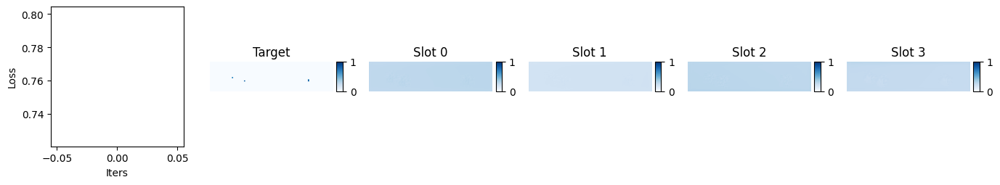

iter 50 , loss 0.7620132 , lr 2.999988434072206e-06


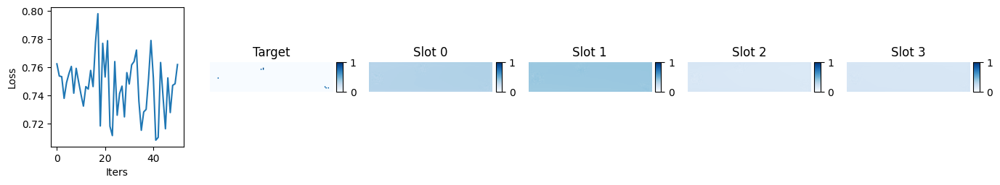

iter 100 , loss 0.7375597 , lr 5.999907472934369e-06


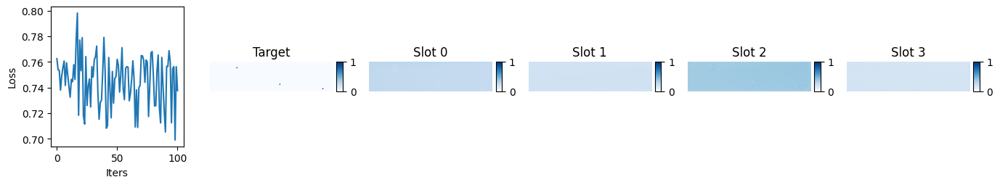

iter 150 , loss 0.7335304 , lr 8.999687723160046e-06


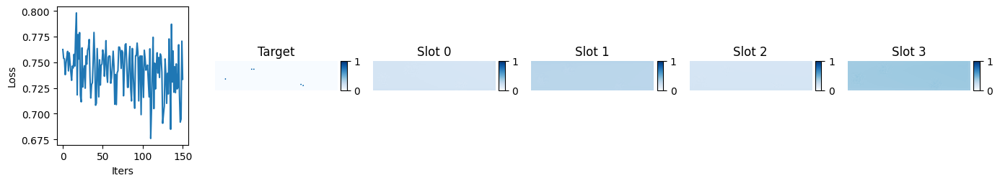

iter 200 , loss 0.6724782 , lr 1.1999259794889963e-05


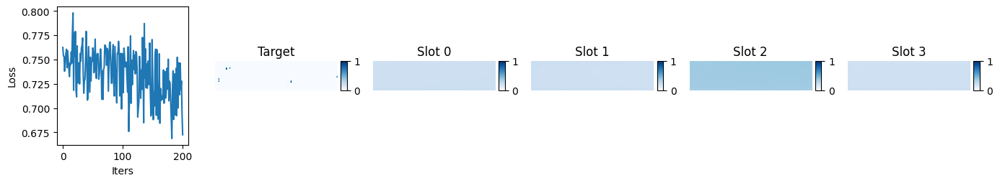

iter 250 , loss 0.6759763 , lr 1.4998554303615487e-05


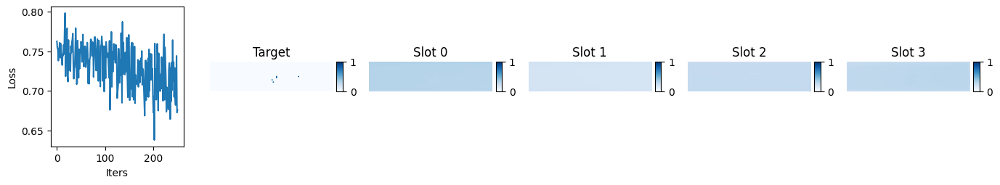

iter 300 , loss 0.67440736 , lr 1.7997501871962002e-05


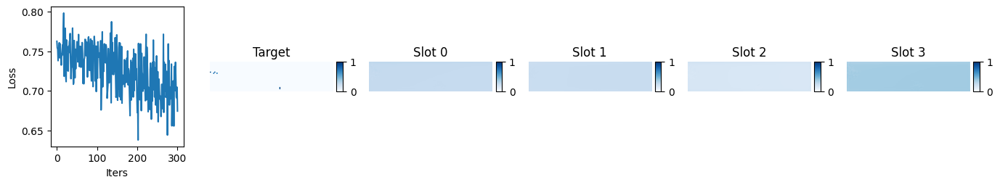

iter 350 , loss 0.63120145 , lr 2.0996033131472145e-05


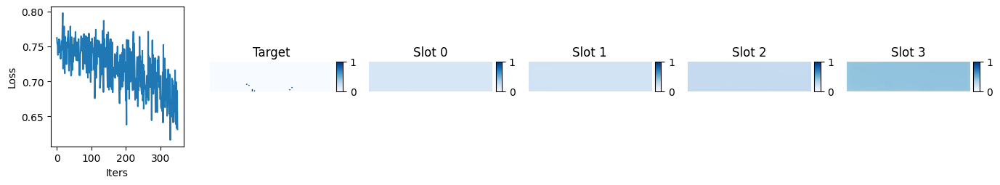

iter 400 , loss 0.63420725 , lr 2.3994078724388778e-05


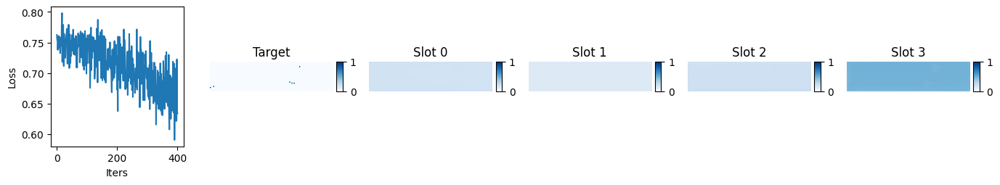

iter 450 , loss 0.5898746 , lr 2.6991569305437837e-05


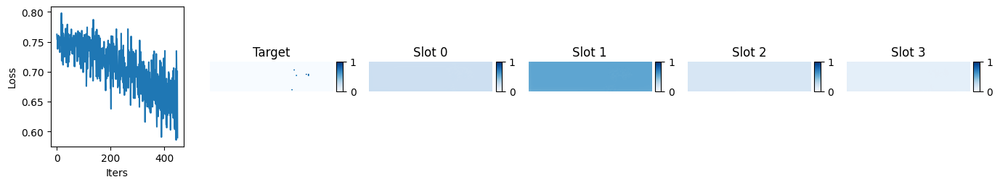

iter 500 , loss 0.63701665 , lr 2.9988435543610846e-05


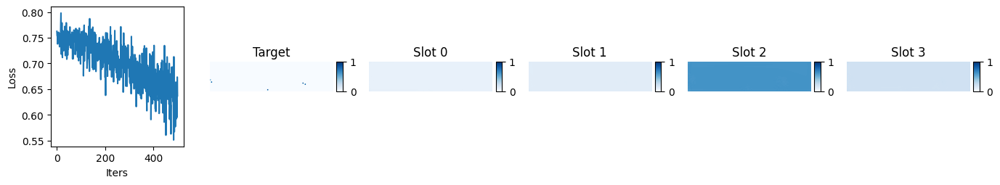

iter 550 , loss 0.6455474 , lr 3.298460812394707e-05


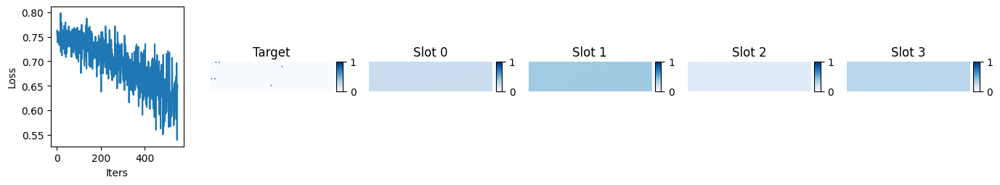

iter 600 , loss 0.67838293 , lr 3.5980017749315456e-05


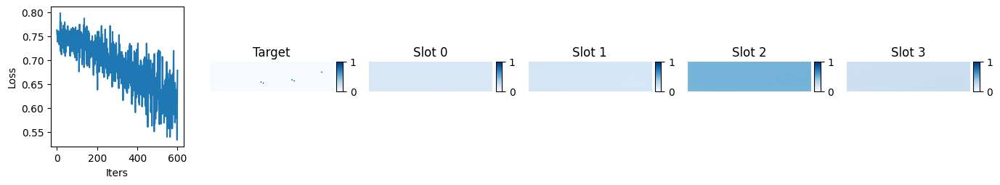

iter 650 , loss 0.57747835 , lr 3.897459514219611e-05


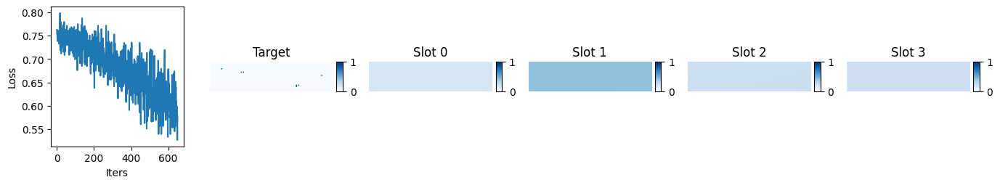

iter 700 , loss 0.5378018 , lr 4.19682710464613e-05


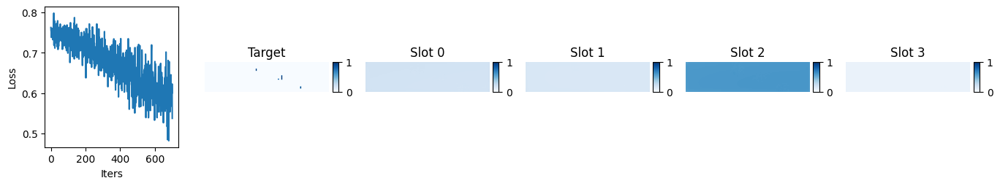

iter 750 , loss 0.5621345 , lr 4.4960976229156103e-05


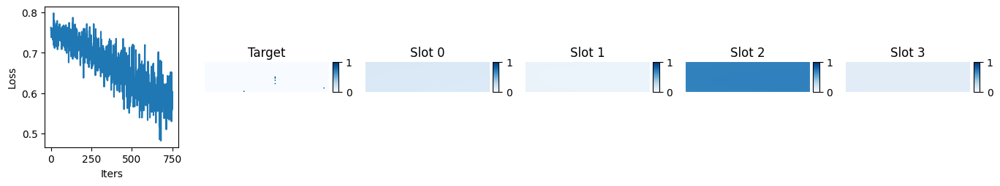

iter 800 , loss 0.4237922 , lr 4.7952641482278515e-05


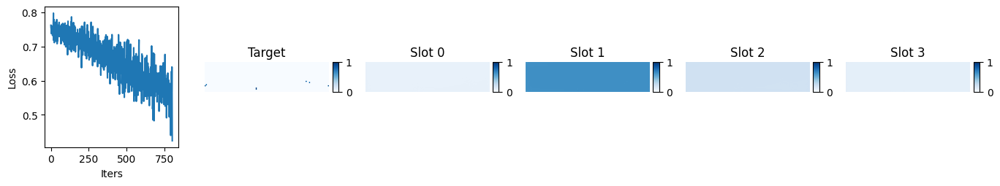

iter 850 , loss 0.6012976 , lr 5.094319762455895e-05


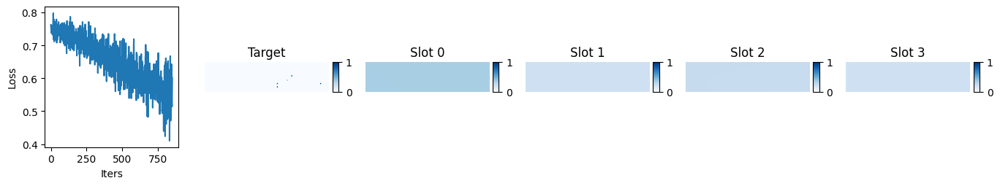

iter 900 , loss 0.5991539 , lr 5.393257550323929e-05


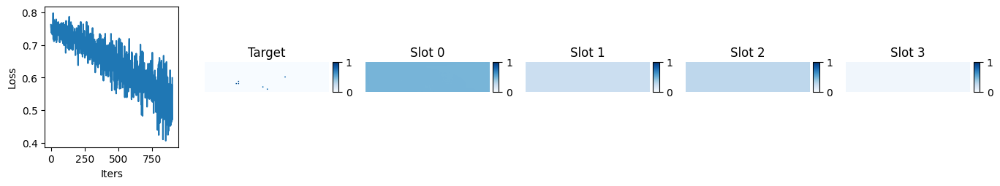

iter 950 , loss 0.5566819 , lr 5.692070599585119e-05


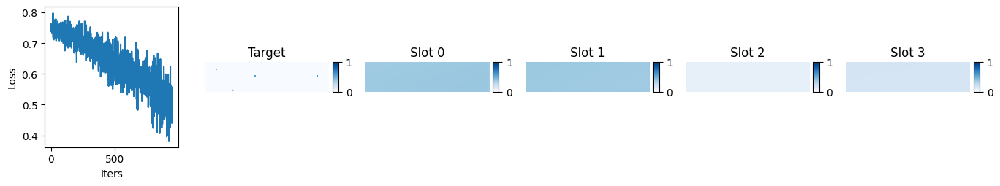

iter 1000 , loss 0.51282126 , lr 5.9907520011993834e-05


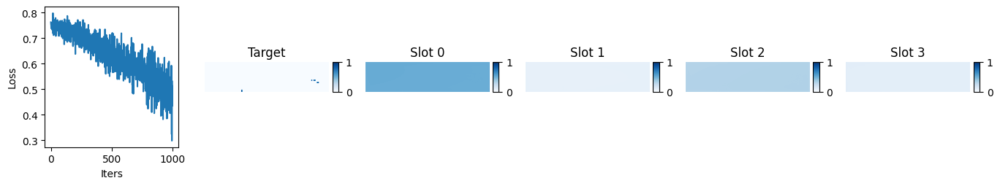

iter 1050 , loss 0.45839146 , lr 6.289294849511095e-05


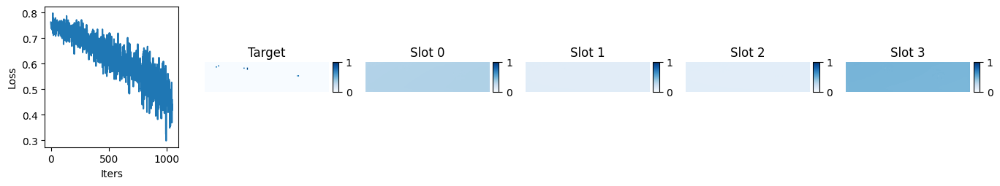

iter 1100 , loss 0.42101616 , lr 6.587692242426705e-05


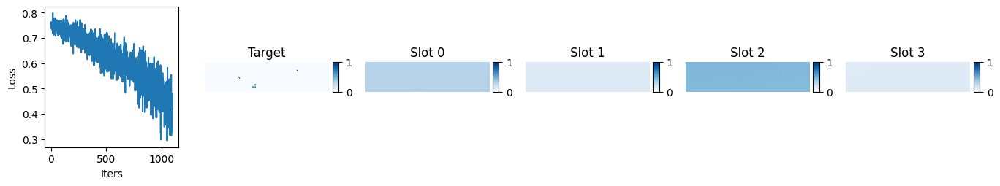

iter 1150 , loss 0.3819604 , lr 6.885937281592306e-05


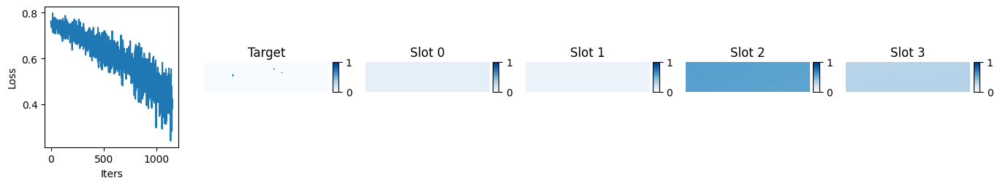

iter 1200 , loss 0.3431986 , lr 7.184023072571087e-05


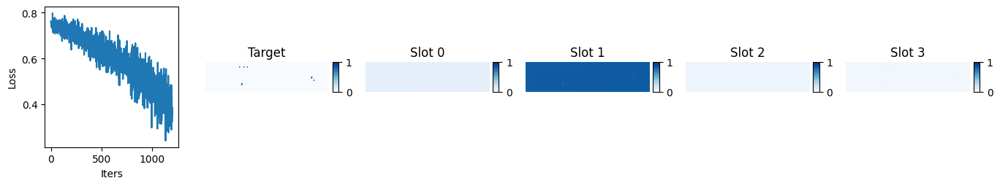

iter 1250 , loss 0.40962693 , lr 7.481942725020738e-05


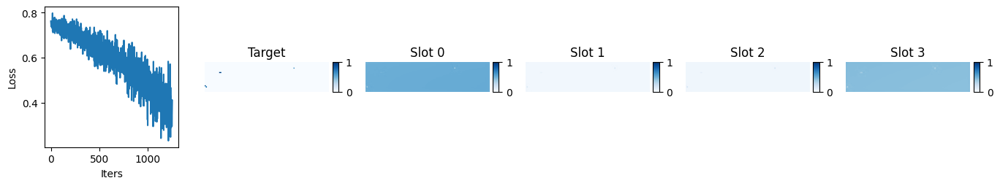

iter 1300 , loss 0.38168567 , lr 7.779689352870732e-05


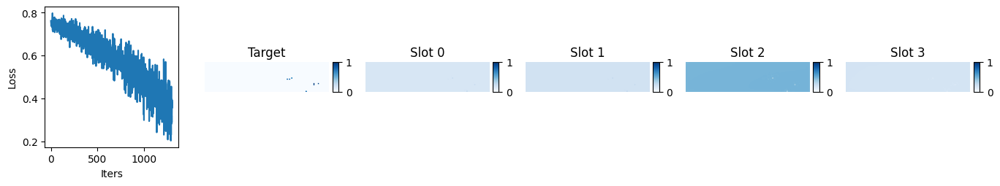

iter 1350 , loss 0.26825058 , lr 8.077256074499546e-05


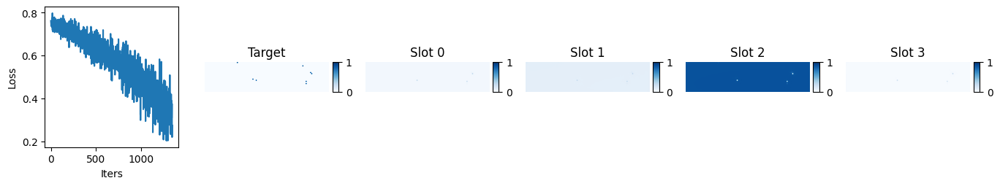

iter 1400 , loss 0.36484233 , lr 8.374636012911756e-05


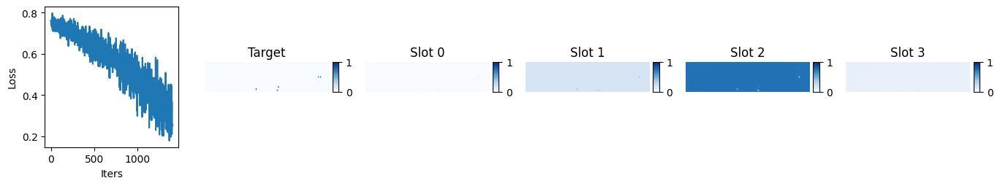

iter 1450 , loss 0.30834344 , lr 8.671822295915055e-05


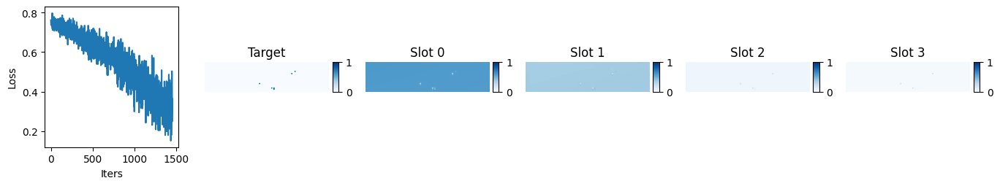

iter 1500 , loss 0.3884992 , lr 8.968808056297168e-05


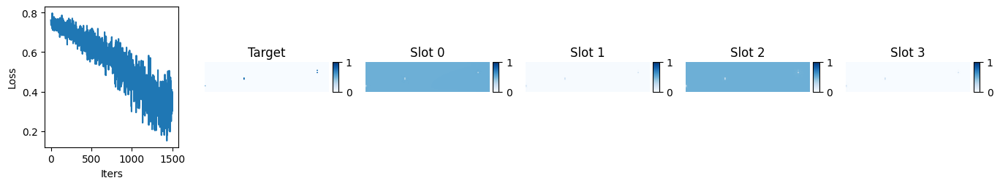

iter 1550 , loss 0.22895502 , lr 9.26558643200263e-05


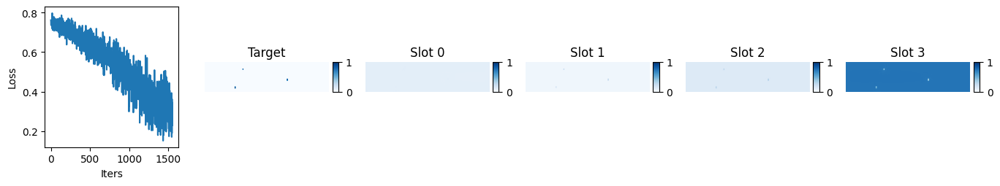

iter 1600 , loss 0.38659543 , lr 9.562150566309494e-05


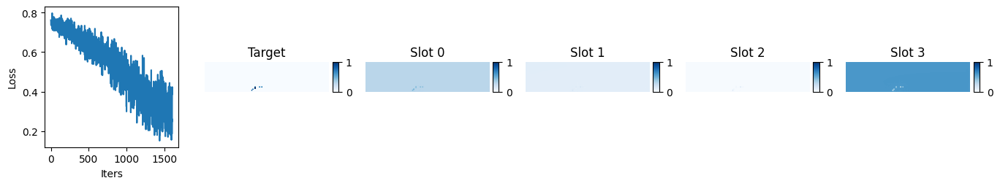

iter 1650 , loss 0.35530677 , lr 9.858493608005883e-05


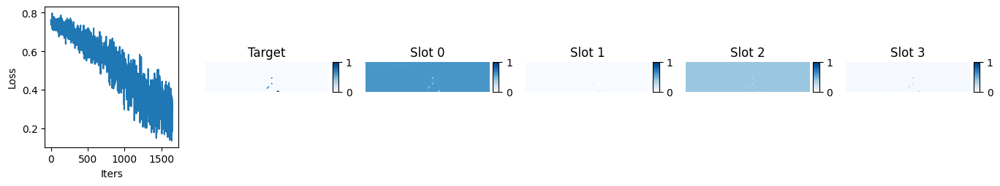

iter 1700 , loss 0.24051404 , lr 0.00010154608711566472


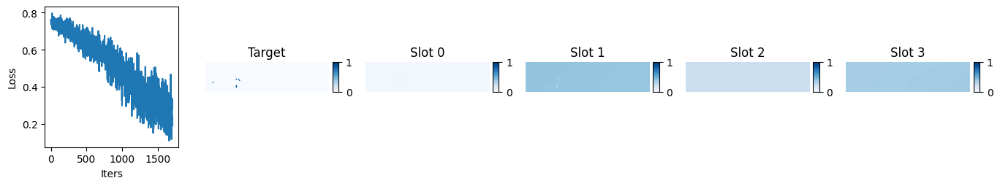

iter 1750 , loss 0.20108941 , lr 0.0001045048903732878


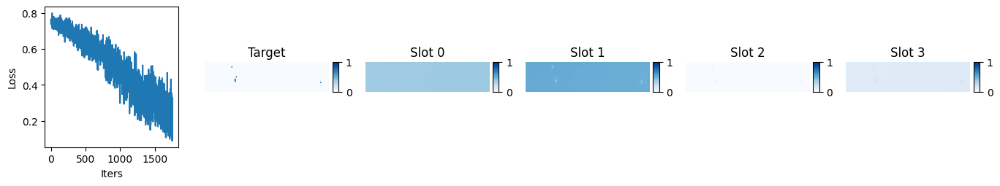

iter 1800 , loss 0.19774657 , lr 0.00010746127751669408


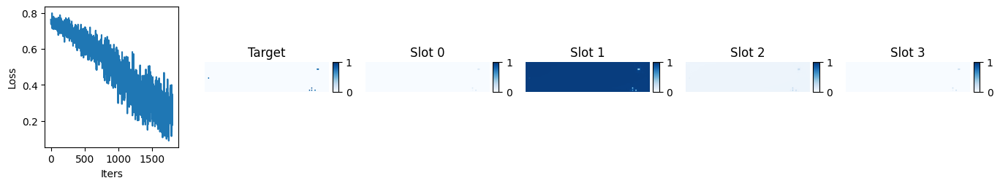

iter 1850 , loss 0.17865814 , lr 0.000110415180271801


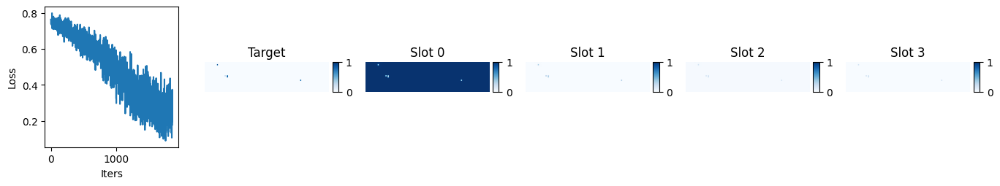

iter 1900 , loss 0.28025836 , lr 0.00011336653042843675


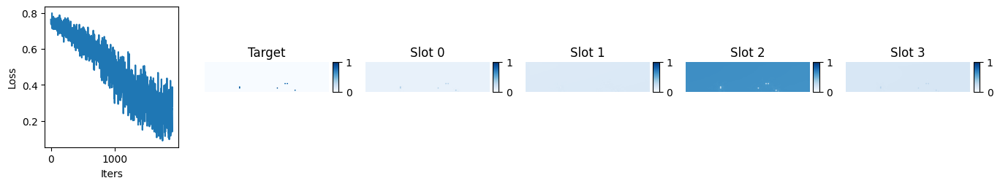

iter 1950 , loss 0.26756987 , lr 0.00011631525984209833


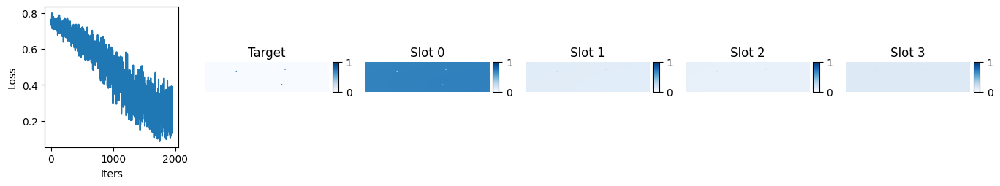

iter 2000 , loss 0.21927086 , lr 0.00011926130043570826


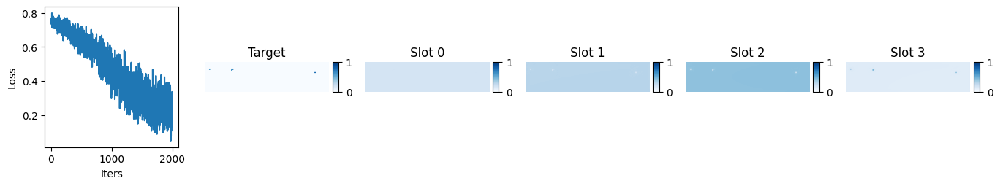

iter 2050 , loss 0.16018139 , lr 0.00012220458420136946


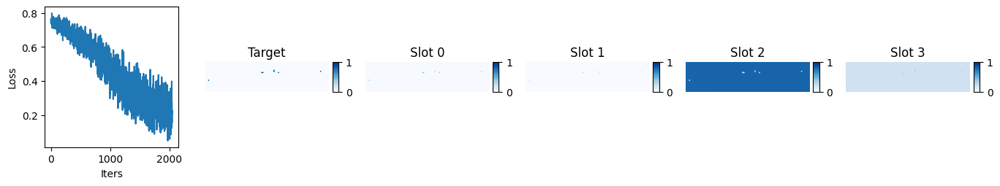

iter 2100 , loss 0.16973904 , lr 0.0001251450432021192


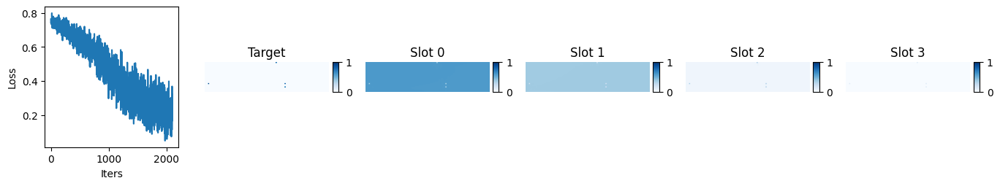

iter 2150 , loss 0.22545241 , lr 0.00012808260957368096


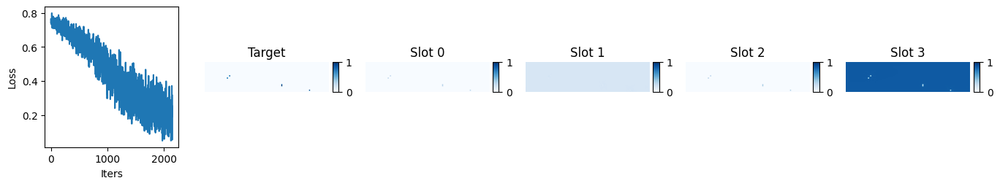

iter 2200 , loss 0.16673411 , lr 0.00013101721552621508


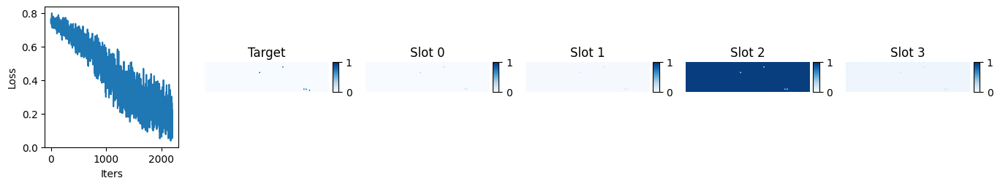

iter 2250 , loss 0.19765496 , lr 0.00013394879334606766


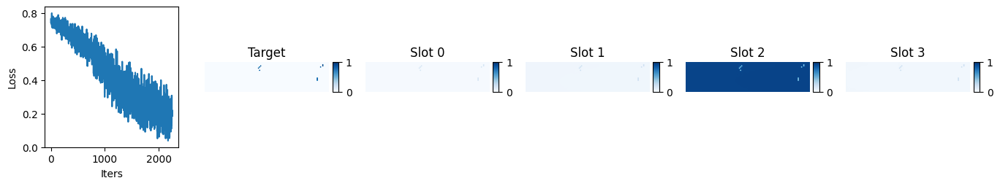

iter 2300 , loss 0.17921674 , lr 0.00013687727539751795


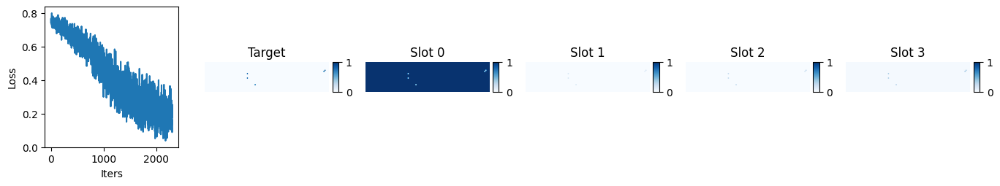

iter 2350 , loss 0.24803545 , lr 0.0001398025941245238


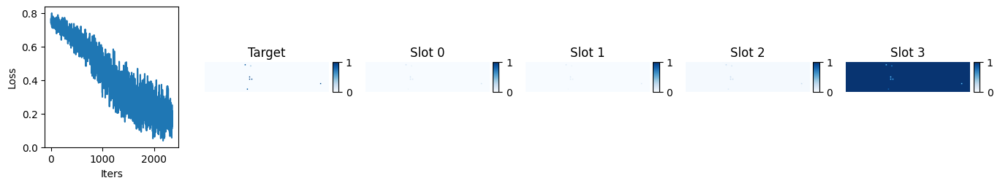

iter 2400 , loss 0.17441875 , lr 0.00014272468205246558


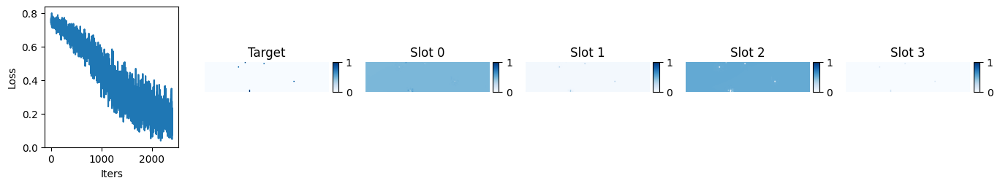

iter 2450 , loss 0.18676293 , lr 0.0001456434717898884


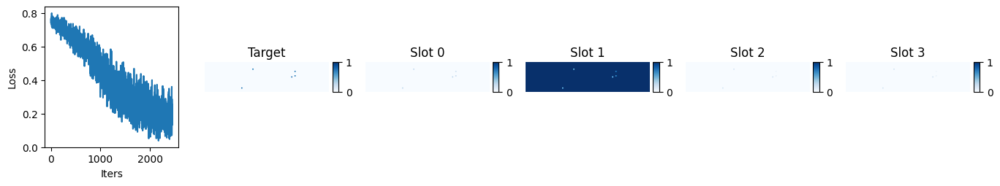

iter 2500 , loss 0.056941222 , lr 0.00014855889603024227


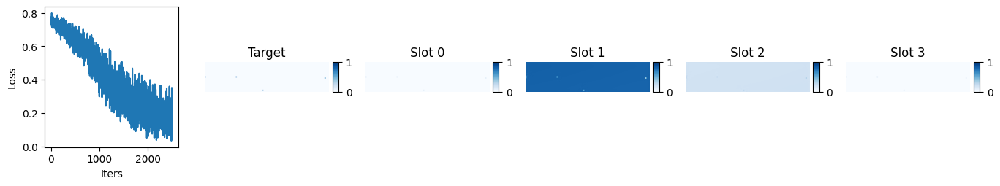

iter 2550 , loss 0.07458944 , lr 0.00015147088755362083


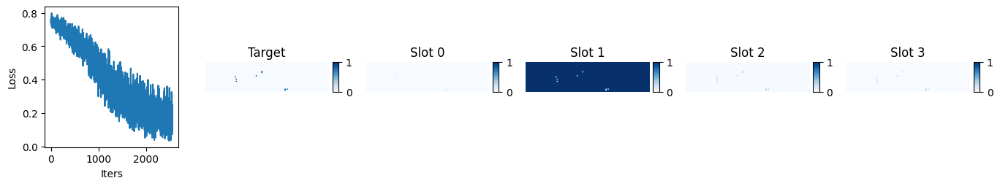

iter 2600 , loss 0.19736321 , lr 0.0001543793792284977


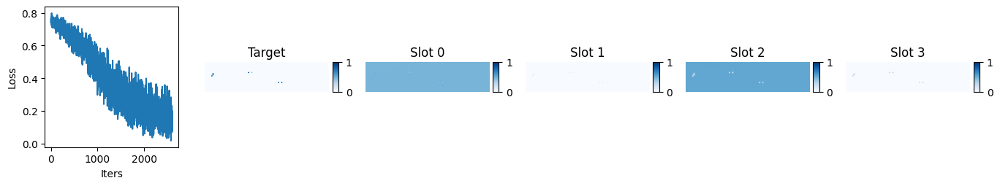

iter 2650 , loss 0.06989489 , lr 0.00015728430401346143


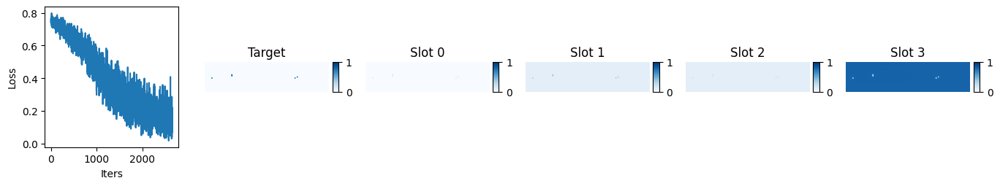

iter 2700 , loss 0.12620074 , lr 0.00016018559495894805


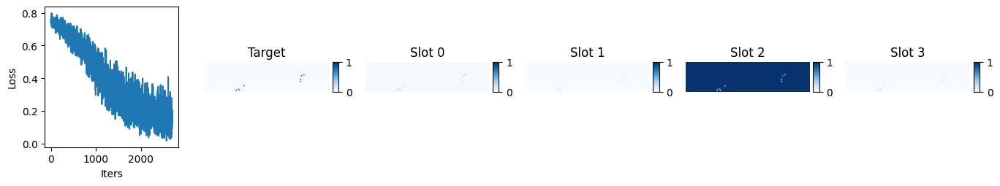

iter 2750 , loss 0.17968228 , lr 0.00016308318520897198


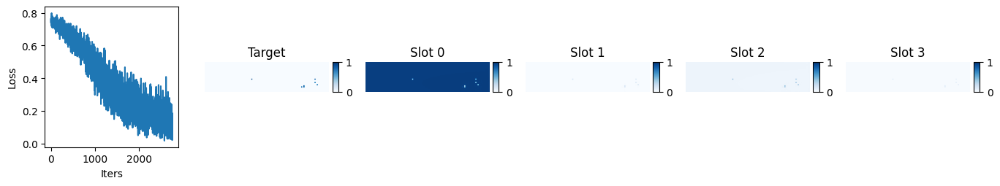

iter 2800 , loss 0.19740216 , lr 0.0001659770080028548


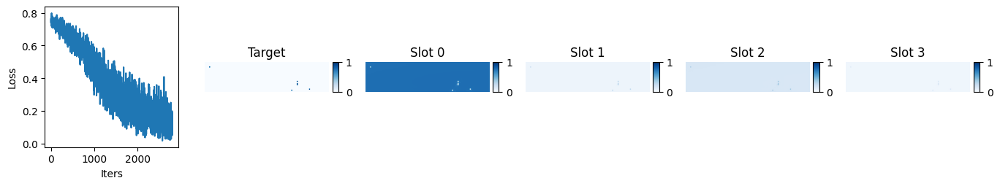

iter 2850 , loss 0.037062444 , lr 0.00016886699667695182


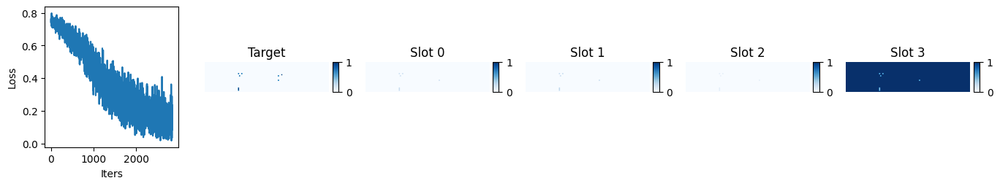

iter 2900 , loss 0.09756085 , lr 0.00017175308466637688


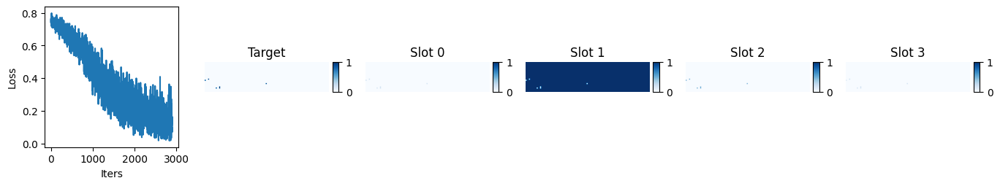

iter 2950 , loss 0.12710738 , lr 0.00017463520550672462


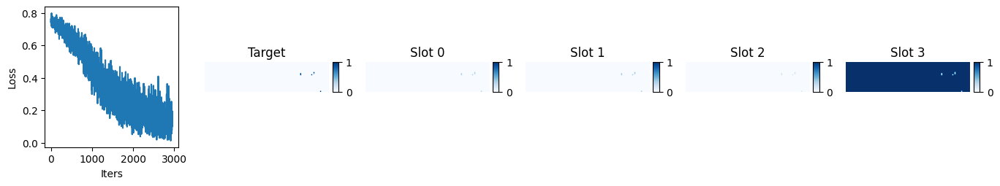

iter 3000 , loss 0.1115267 , lr 0.00017751329283579087


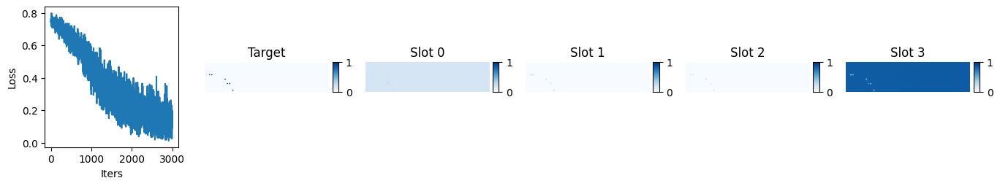

iter 3050 , loss 0.061952274 , lr 0.00018038728039529076


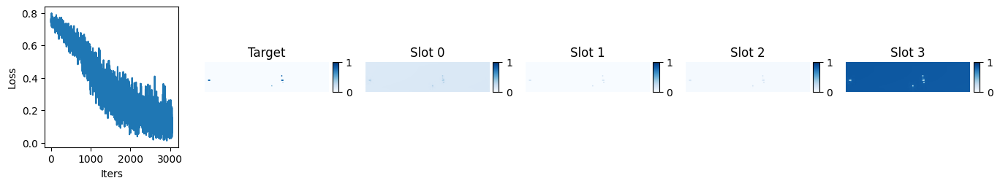

iter 3100 , loss 0.09741039 , lr 0.00018325710203257443


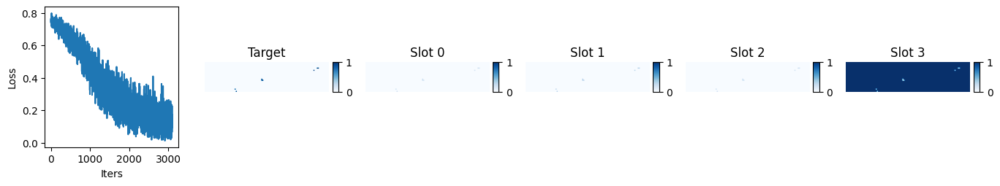

iter 3150 , loss 0.09898226 , lr 0.0001861226917023408


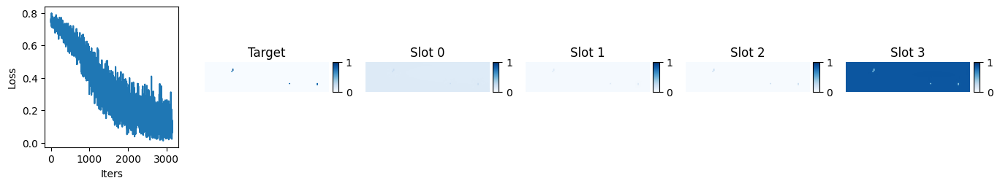

iter 3200 , loss 0.13569222 , lr 0.00018898398346834858


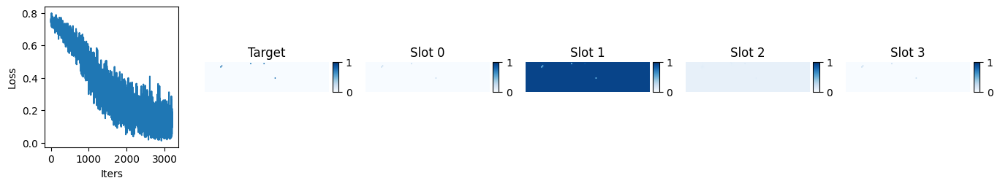

iter 3250 , loss 0.102191135 , lr 0.00019184091150512532


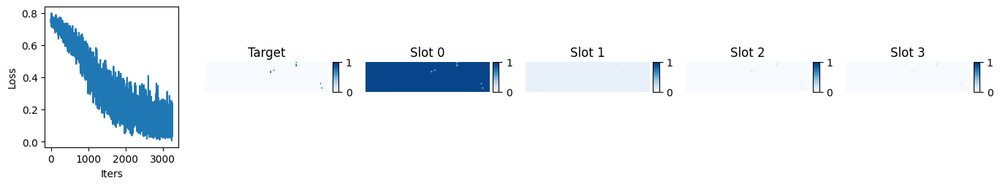

iter 3300 , loss 0.1038545 , lr 0.0001946934100996738


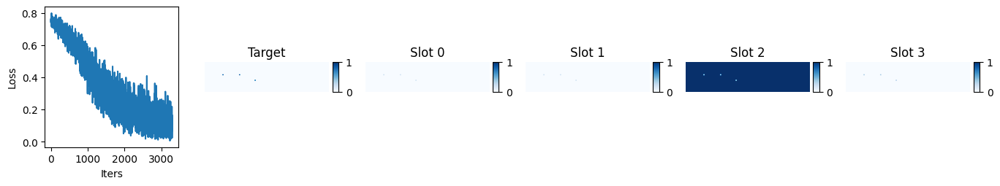

iter 3350 , loss 0.096657515 , lr 0.0001975414136531762


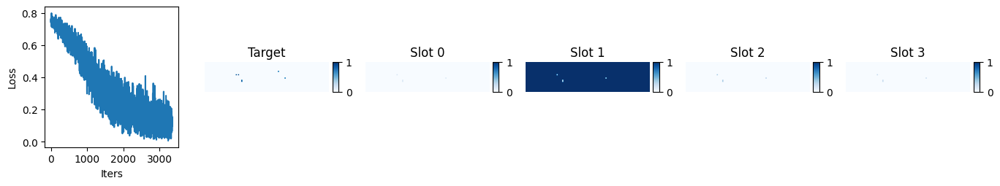

iter 3400 , loss 0.054938238 , lr 0.00020038485668269542


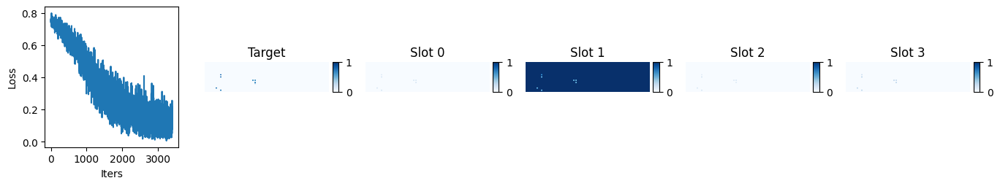

iter 3450 , loss 0.092173934 , lr 0.00020322367382287444


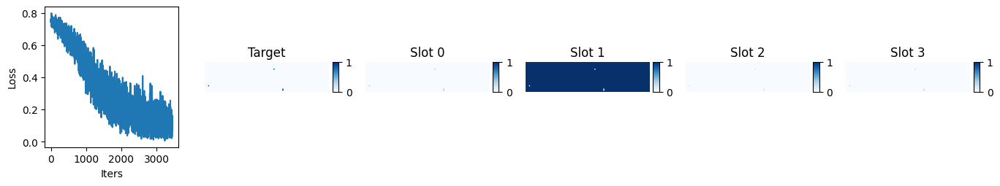

iter 3500 , loss 0.02622702 , lr 0.0002060577998276329


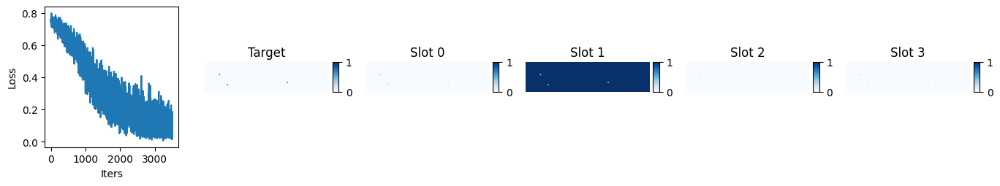

iter 3550 , loss 0.10733676 , lr 0.0002088871695718608


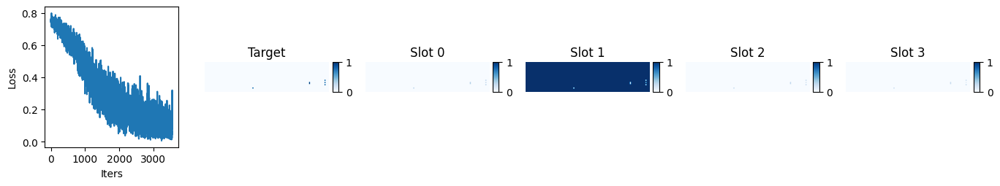

iter 3600 , loss 0.150324 , lr 0.00021171171805310982


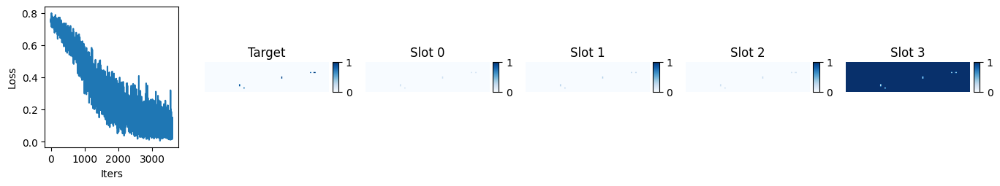

iter 3650 , loss 0.053316694 , lr 0.00021453138039328242


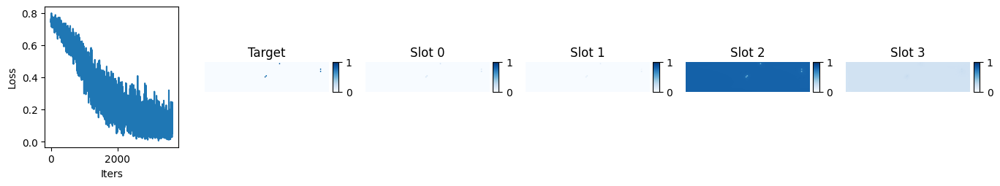

iter 3700 , loss 0.024975099 , lr 0.0002173460918403174


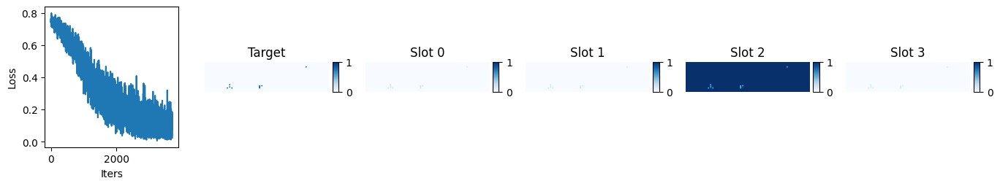

iter 3750 , loss 0.027167203 , lr 0.00022015578776987346


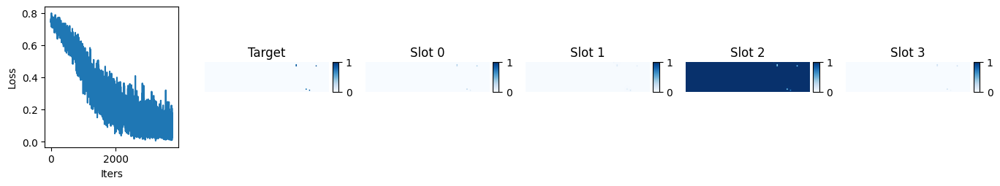

iter 3800 , loss 0.03715825 , lr 0.0002229604036870096


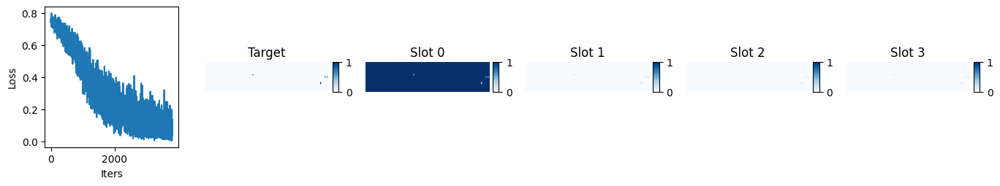

iter 3850 , loss 0.040727895 , lr 0.00022575987522786283


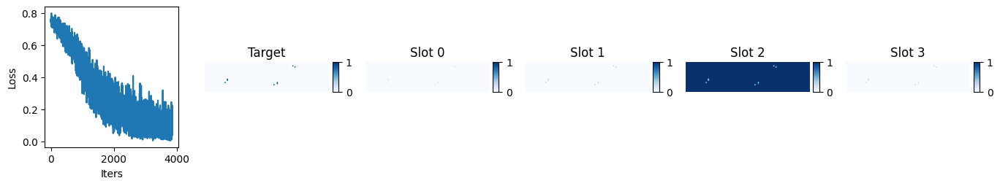

iter 3900 , loss 0.1372559 , lr 0.0002285541381613231


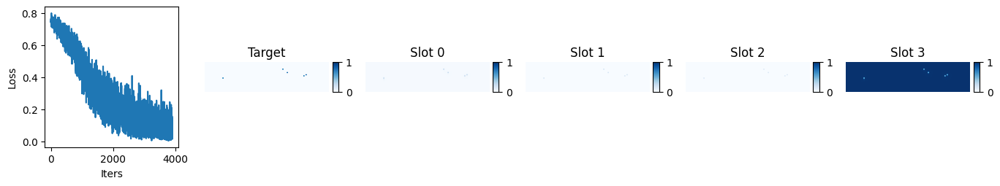

iter 3950 , loss 0.106273055 , lr 0.00023134312839070533


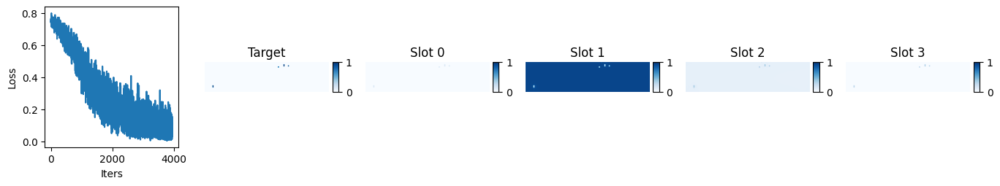

iter 4000 , loss 0.11436099 , lr 0.00023412678195541844


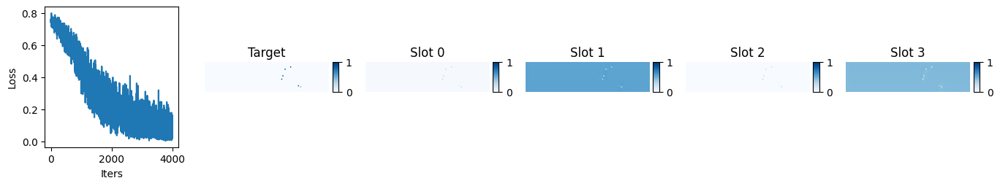

iter 4050 , loss 0.02796347 , lr 0.00023690503503263148


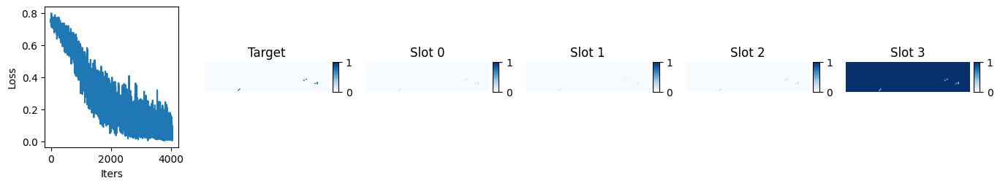

iter 4100 , loss 0.020169357 , lr 0.000239677823938937


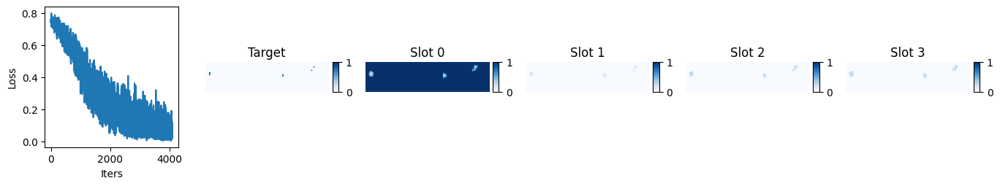

iter 4150 , loss 0.11196597 , lr 0.00024244508513201118


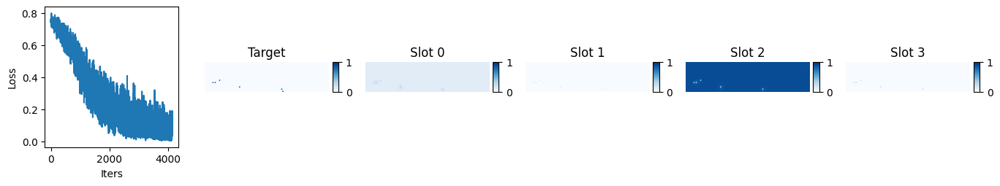

iter 4200 , loss 0.01866865 , lr 0.0002452067552122707


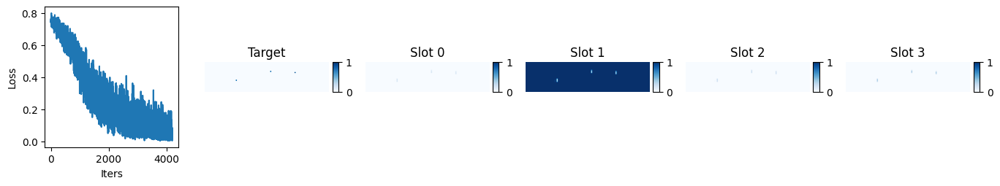

iter 4250 , loss 0.067108996 , lr 0.00024796277092452697


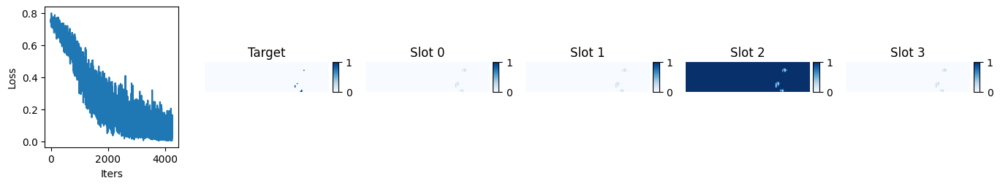

iter 4300 , loss 0.035143867 , lr 0.0002507130691596369


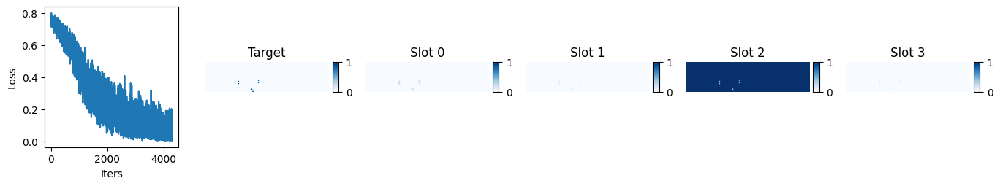

iter 4350 , loss 0.08575031 , lr 0.0002534575869561511


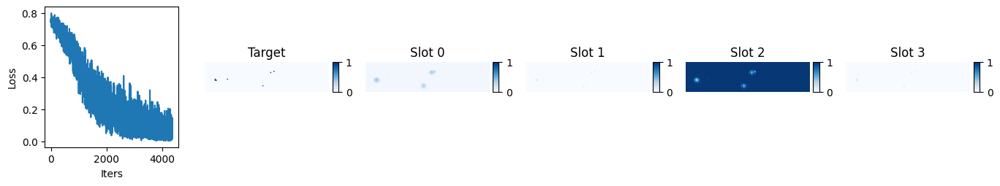

iter 4400 , loss 0.09574299 , lr 0.00025619626150195777


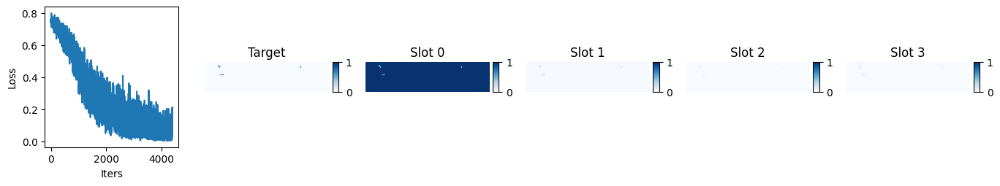

iter 4450 , loss 0.063640215 , lr 0.0002589290301359243


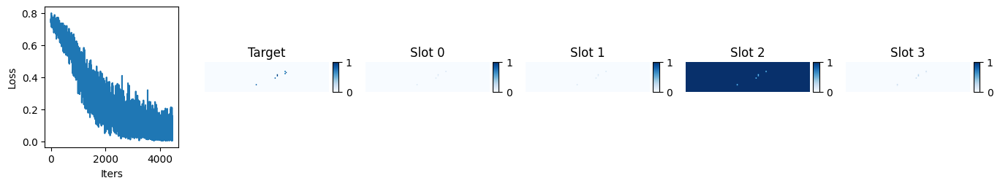

iter 4500 , loss 0.035677984 , lr 0.00026165583034953535


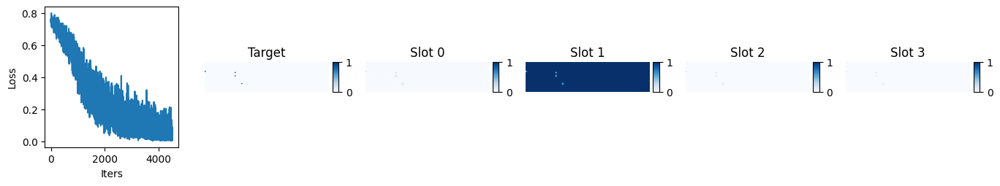

iter 4550 , loss 0.057981145 , lr 0.0002643765997885278


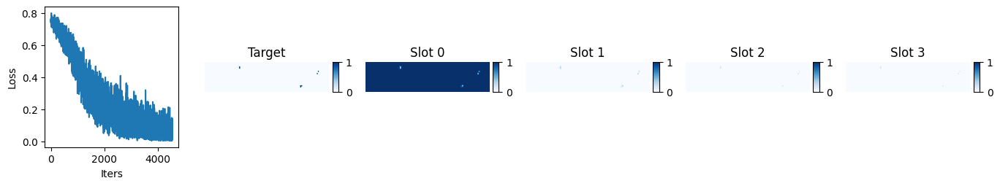

iter 4600 , loss 0.009881123 , lr 0.0002670912762545217


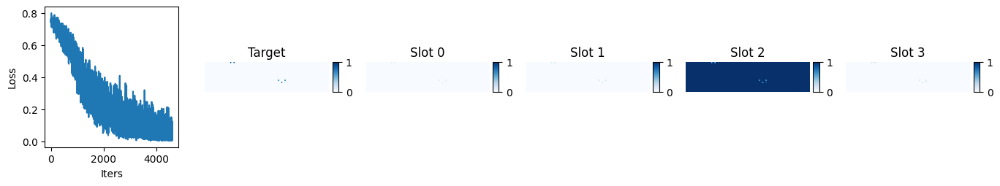

iter 4650 , loss 0.111898705 , lr 0.0002697997977066486


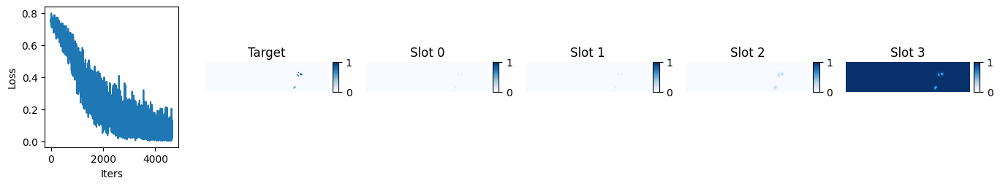

iter 4700 , loss 0.0066020014 , lr 0.00027250210226317627


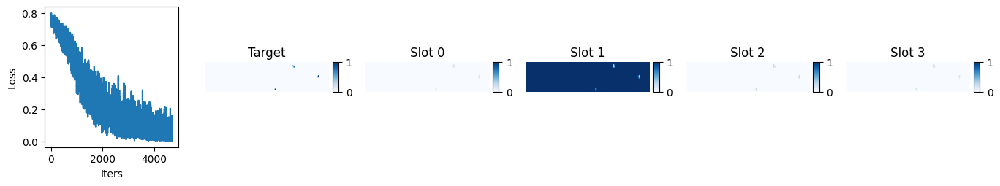

iter 4750 , loss 0.062170036 , lr 0.00027519812820312947


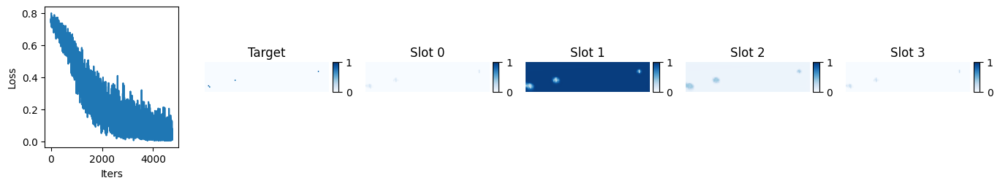

iter 4800 , loss 0.102672 , lr 0.00027788781396790815


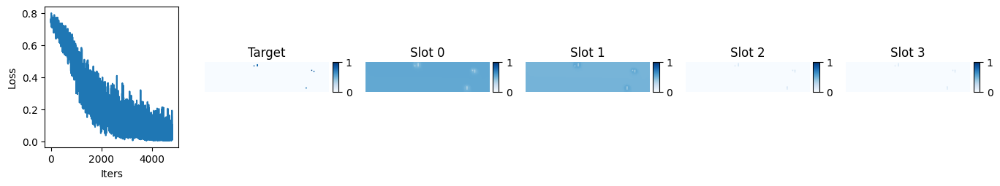

iter 4850 , loss 0.00620623 , lr 0.00028057109816290133


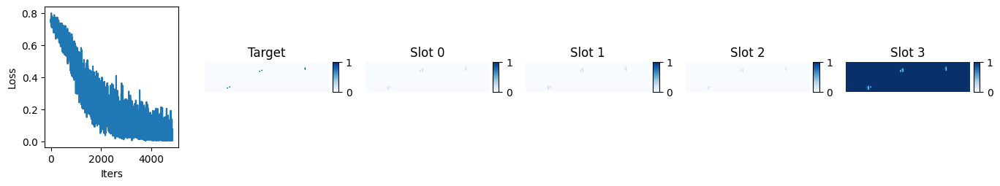

iter 4900 , loss 0.057698984 , lr 0.0002832479195590977


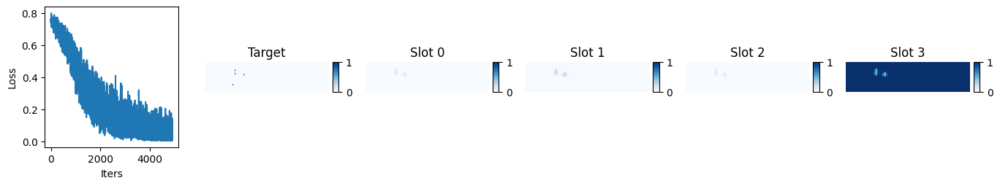

iter 4950 , loss 0.054541387 , lr 0.000285918217094693


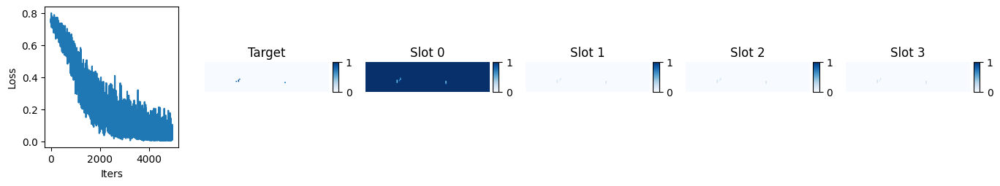

iter 5000 , loss 0.00830131 , lr 0.000288581929876693


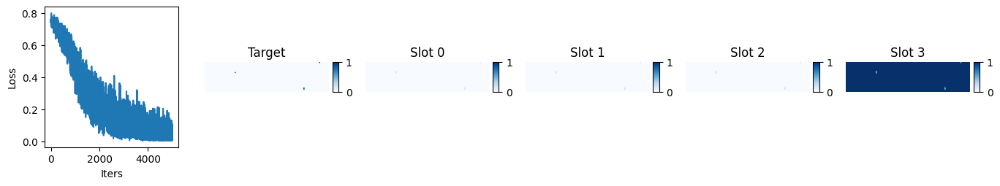

iter 5050 , loss 0.058269512 , lr 0.000288355442754964


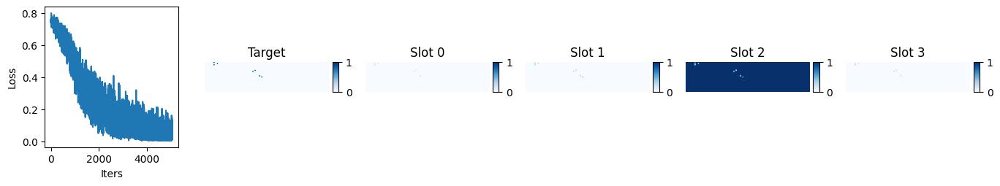

iter 5100 , loss 0.07650797 , lr 0.00028812682202115393


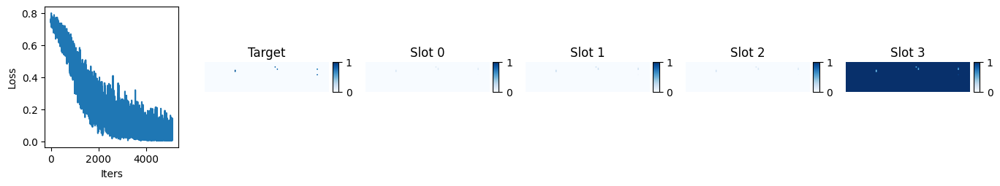

iter 5150 , loss 0.024387961 , lr 0.0002878960712008773


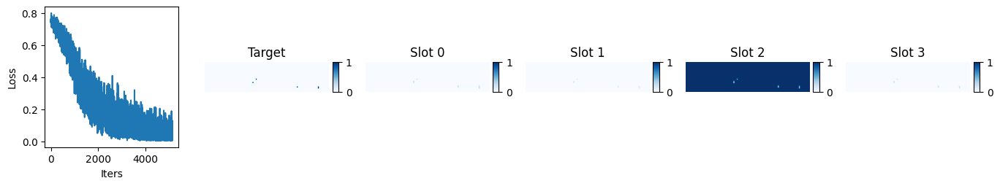

iter 5200 , loss 0.011524485 , lr 0.00028766319385259713


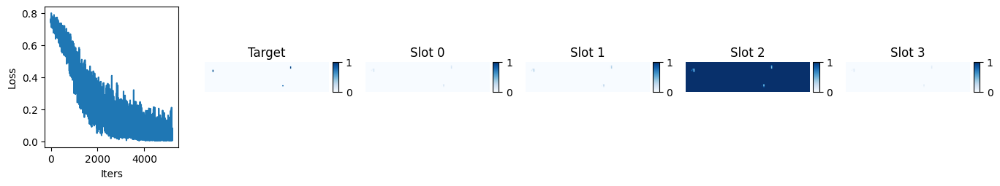

iter 5250 , loss 0.018136045 , lr 0.0002874281935675704


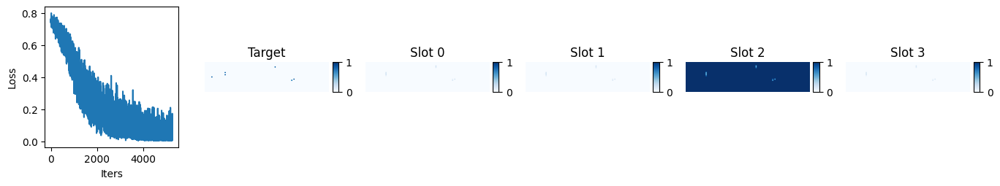

iter 5300 , loss 0.03286629 , lr 0.000287191073969792


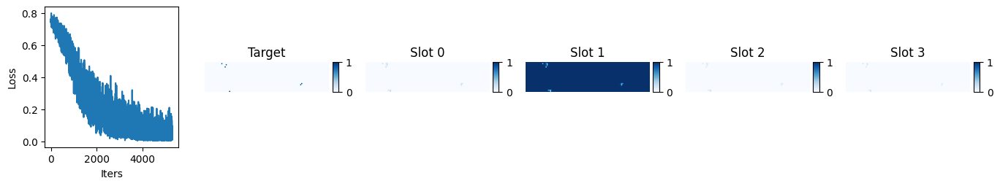

iter 5350 , loss 0.07142614 , lr 0.0002869518387159396


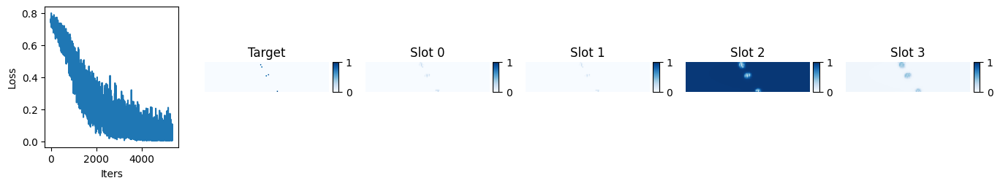

iter 5400 , loss 0.016727183 , lr 0.00028671049149531675


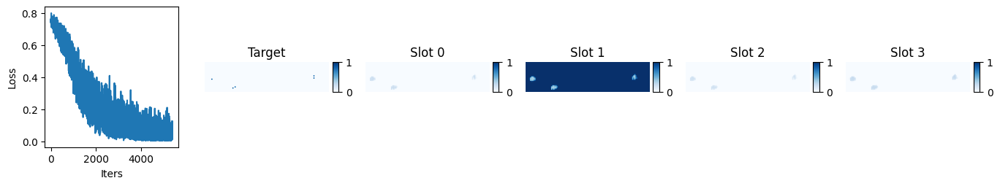

iter 5450 , loss 0.008087405 , lr 0.0002864670360297961


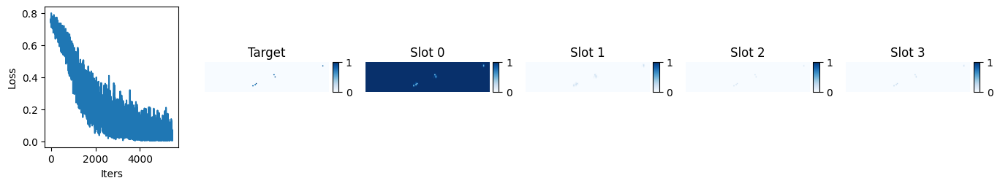

iter 5500 , loss 0.005940784 , lr 0.0002862214760737622


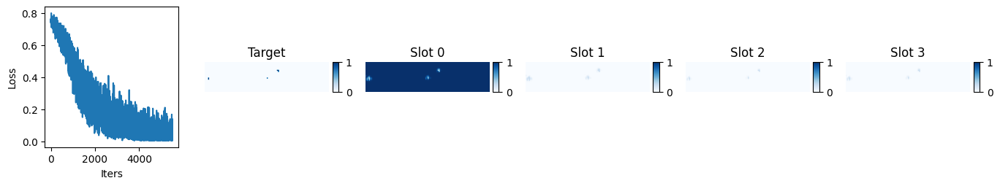

iter 5550 , loss 0.008079152 , lr 0.0002859738154140532


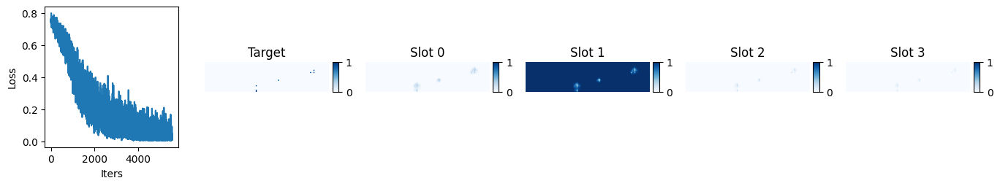

iter 5600 , loss 0.008964555 , lr 0.00028572405786990294


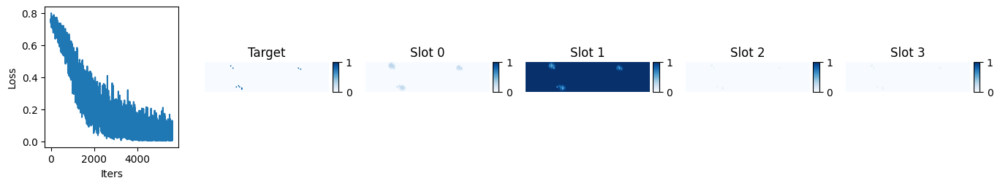

iter 5650 , loss 0.009562049 , lr 0.00028547220729288164


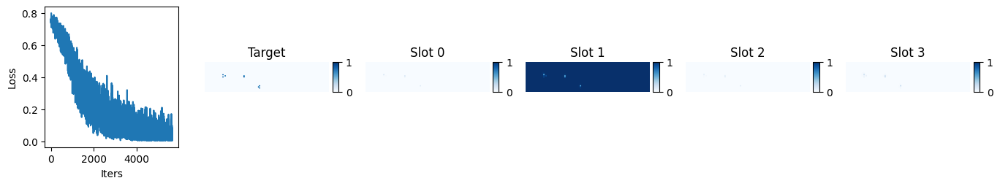

iter 5700 , loss 0.018585036 , lr 0.0002852182675668368


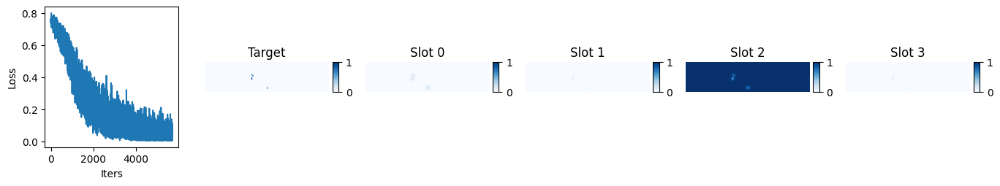

iter 5750 , loss 0.004225791 , lr 0.0002849622426078332


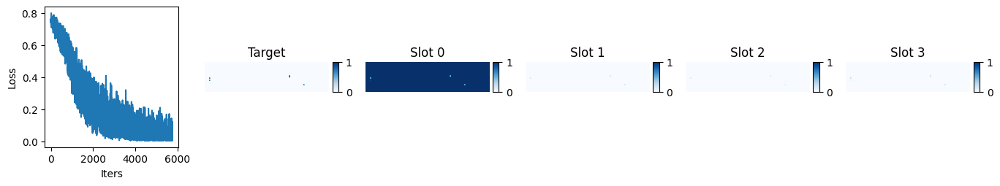

iter 5800 , loss 0.0061628167 , lr 0.0002847041363640923


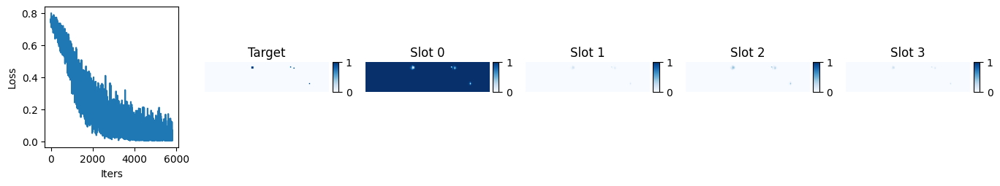

iter 5850 , loss 0.007057642 , lr 0.0002844439528159318


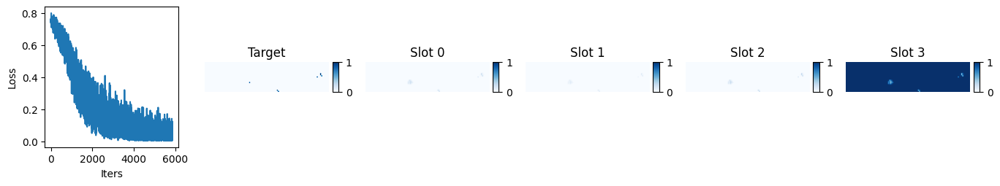

iter 5900 , loss 0.0050373585 , lr 0.0002841816959757037


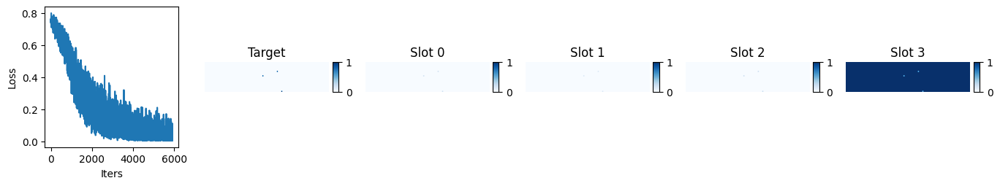

iter 5950 , loss 0.1058566 , lr 0.0002839173698877331


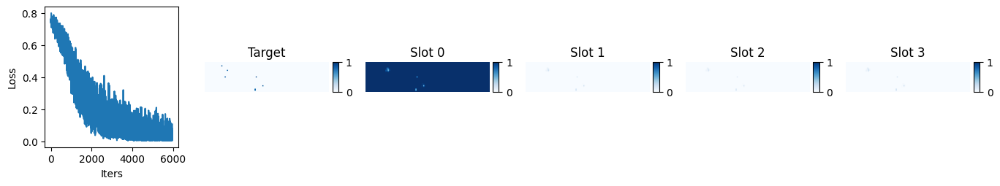

iter 6000 , loss 0.010578344 , lr 0.00028365097862825513


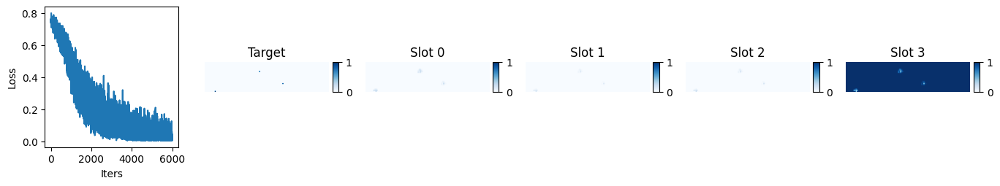

iter 6050 , loss 0.0061223893 , lr 0.00028338252630535264


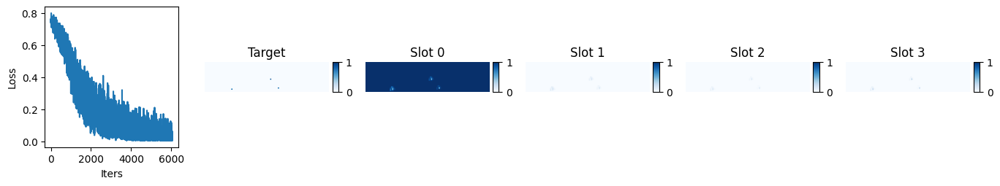

iter 6100 , loss 0.011420239 , lr 0.00028311201705889246


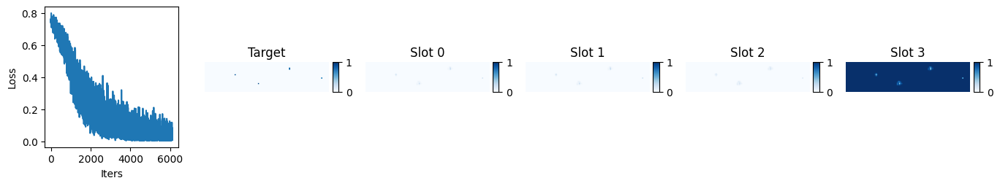

iter 6150 , loss 0.028477047 , lr 0.0002828394550604618


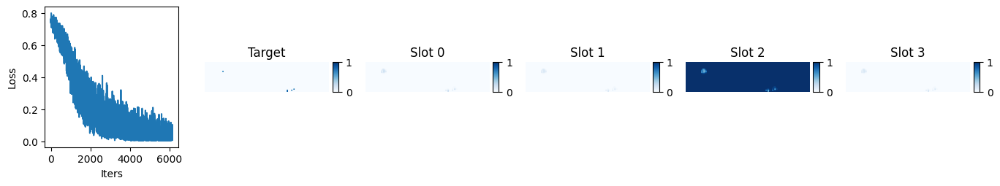

iter 6200 , loss 0.0077454266 , lr 0.00028256484451330403


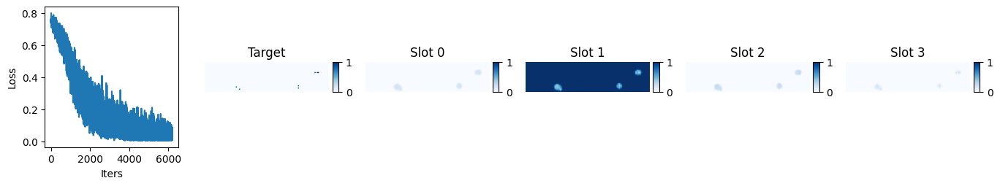

iter 6250 , loss 0.013228048 , lr 0.0002822881896522532


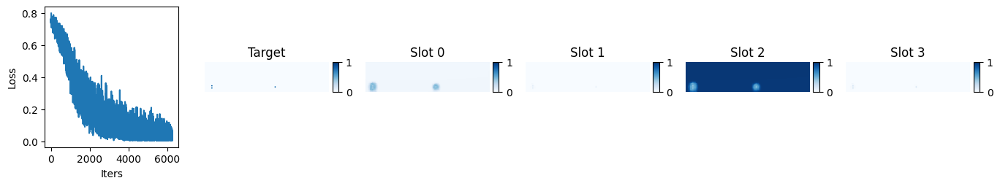

iter 6300 , loss 0.10796112 , lr 0.0002820094947436698


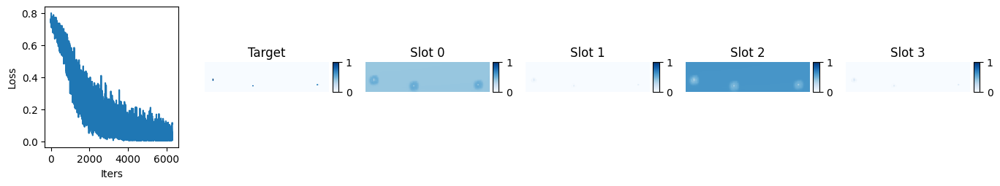

iter 6350 , loss 0.016961202 , lr 0.0002817287640853738


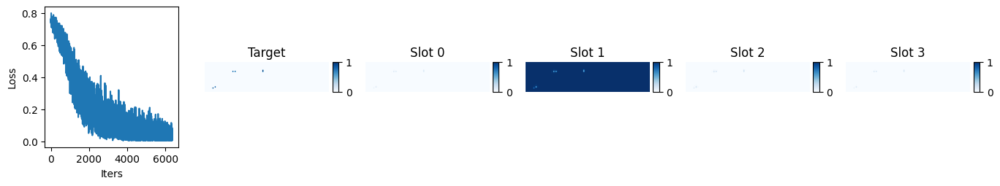

iter 6400 , loss 0.024365623 , lr 0.0002814460020065795


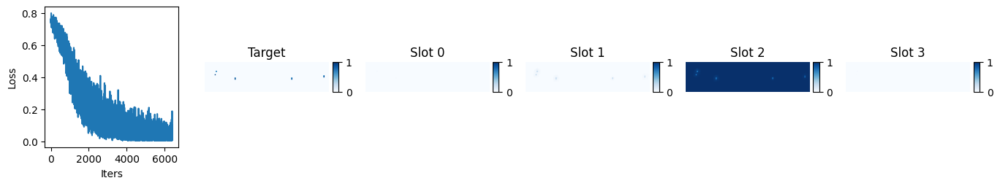

iter 6450 , loss 0.03871711 , lr 0.00028116121286782784


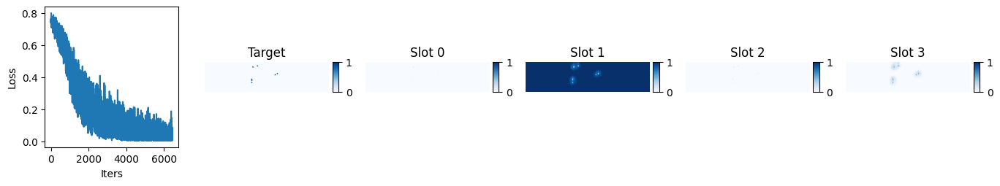

iter 6500 , loss 0.052334044 , lr 0.0002808744010609196


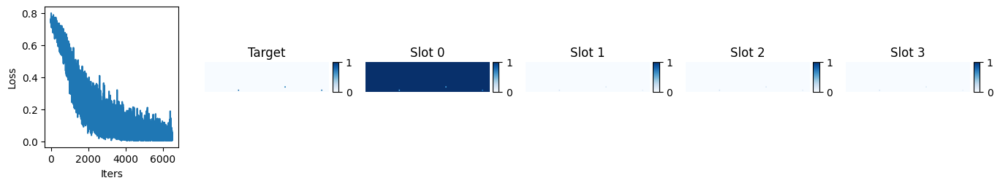

iter 6550 , loss 0.010039554 , lr 0.0002805855710088476


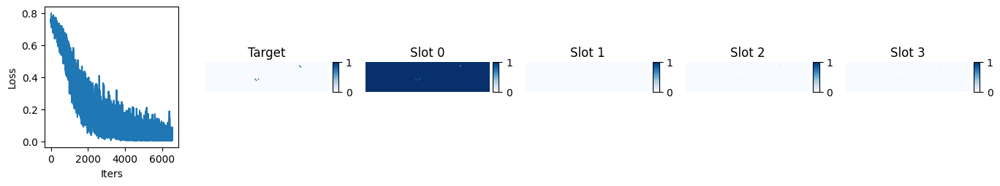

iter 6600 , loss 0.02660455 , lr 0.00028029472716572867


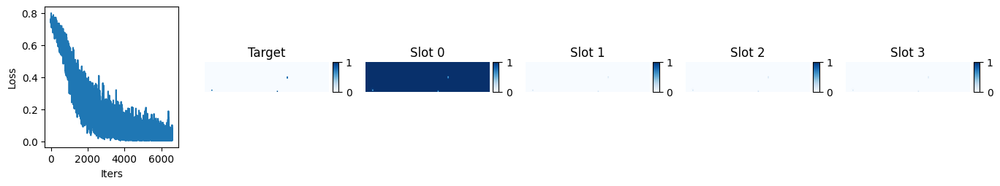

iter 6650 , loss 0.013444851 , lr 0.0002800018740167346


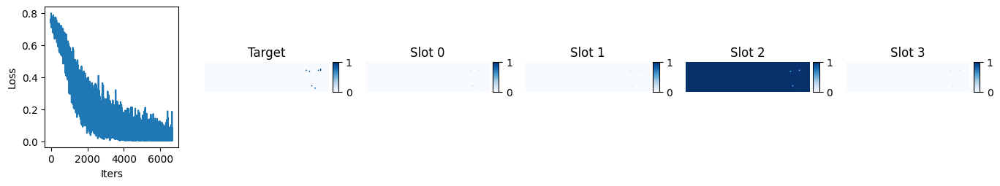

iter 6700 , loss 0.0064356434 , lr 0.0002797070160780232


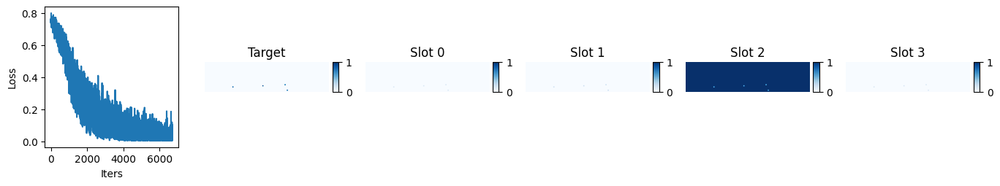

iter 6750 , loss 0.08617688 , lr 0.00027941015789666873


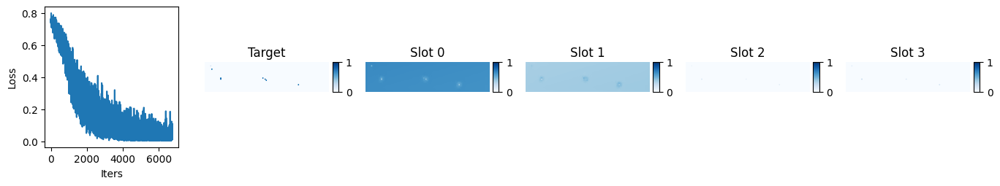

iter 6800 , loss 0.01129812 , lr 0.0002791113040505915


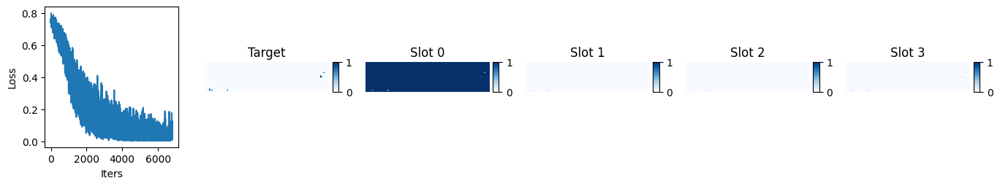

iter 6850 , loss 0.008836116 , lr 0.00027881045914848756


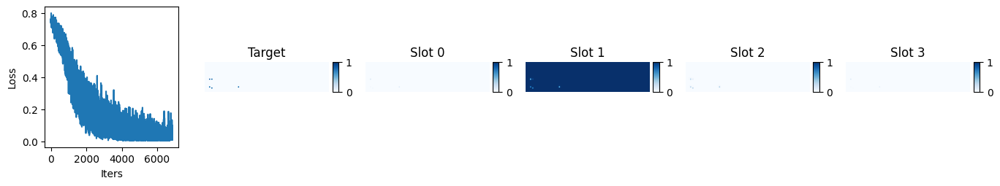

iter 6900 , loss 0.028968344 , lr 0.0002785076278297574


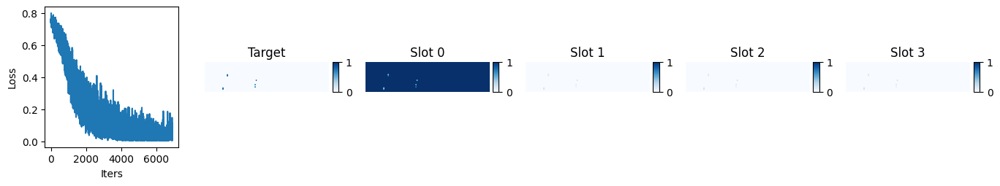

iter 6950 , loss 0.0063156052 , lr 0.00027820281476443465


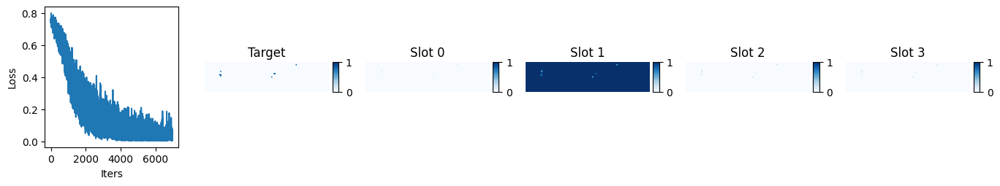

iter 7000 , loss 0.00922592 , lr 0.0002778960246531138


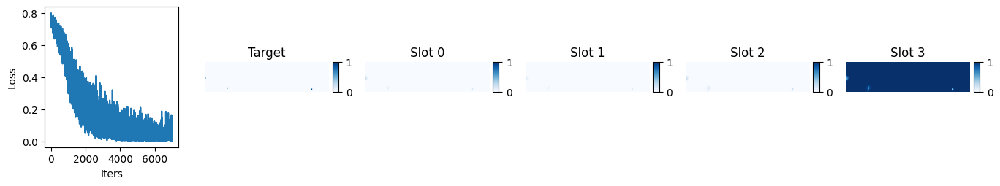

iter 7050 , loss 0.014924591 , lr 0.0002775872622268779


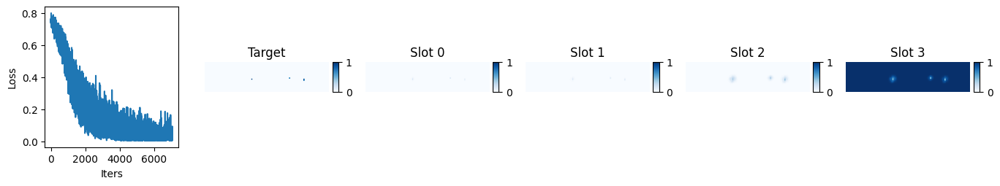

iter 7100 , loss 0.02412533 , lr 0.00027727653224722553


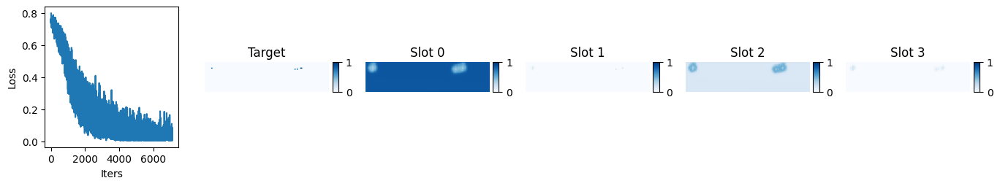

iter 7150 , loss 0.059735388 , lr 0.0002769638395059973


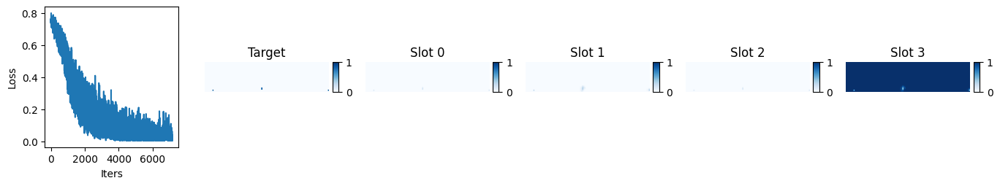

iter 7200 , loss 0.0075250585 , lr 0.00027664918882530225


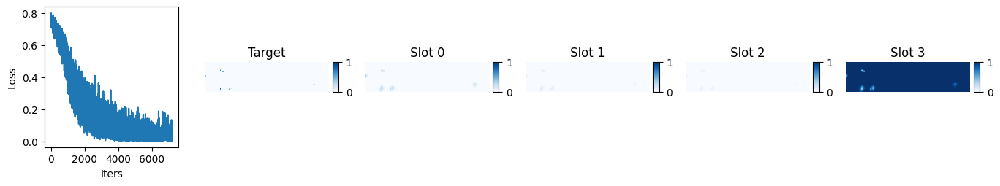

iter 7250 , loss 0.019284746 , lr 0.00027633258505744293


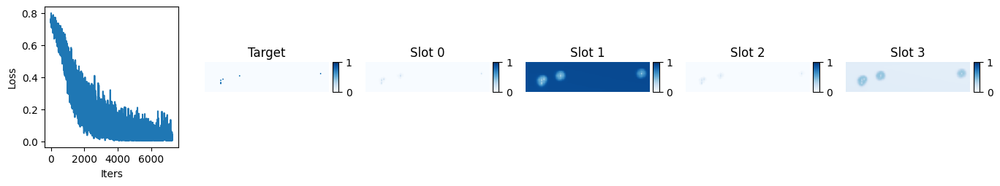

iter 7300 , loss 0.05746711 , lr 0.0002760140330848412


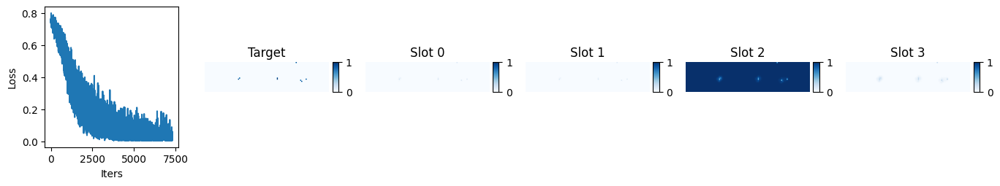

iter 7350 , loss 0.006000012 , lr 0.00027569353781996264


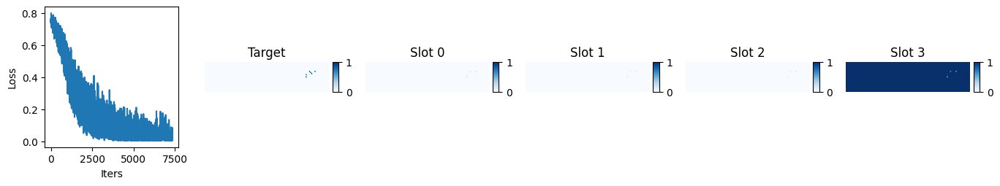

iter 7400 , loss 0.019727206 , lr 0.0002753711042052405


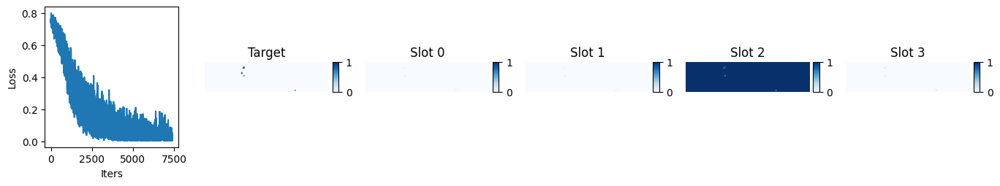

iter 7450 , loss 0.006615915 , lr 0.00027504673721300015


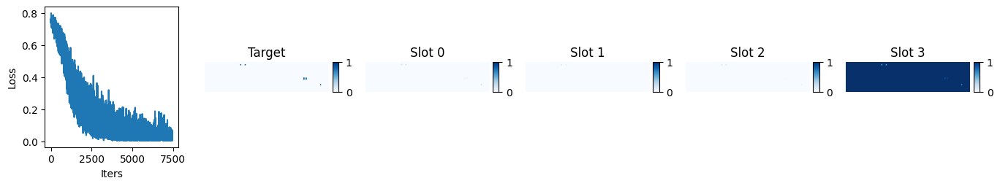

iter 7500 , loss 0.07448323 , lr 0.0002747204418453818


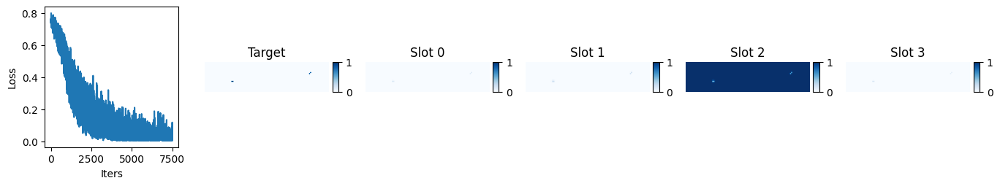

iter 7550 , loss 0.059908018 , lr 0.0002743922231342636


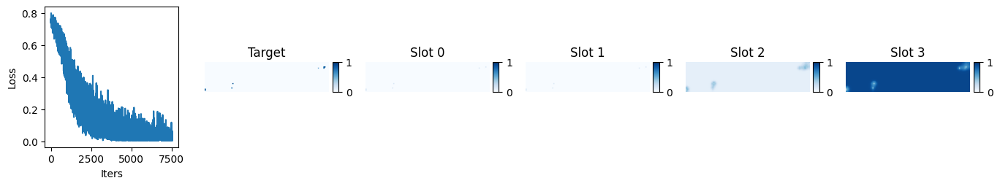

iter 7600 , loss 0.0636869 , lr 0.00027406208614118424


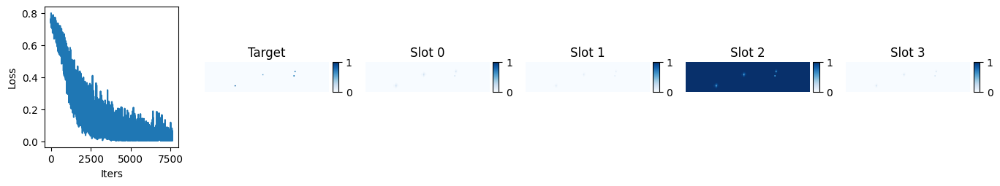

iter 7650 , loss 0.006561155 , lr 0.0002737300359572645


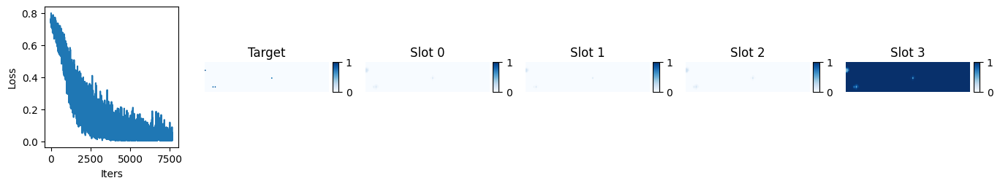

iter 7700 , loss 0.005001259 , lr 0.00027339607770312895


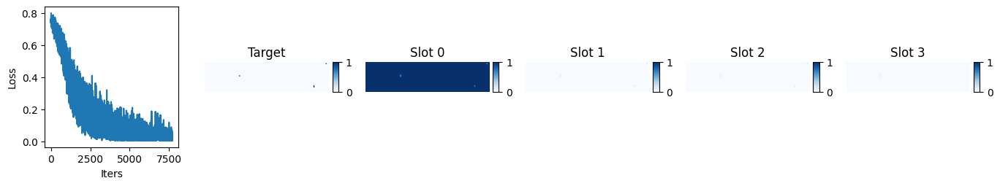

iter 7750 , loss 0.0049628974 , lr 0.00027306021652882703


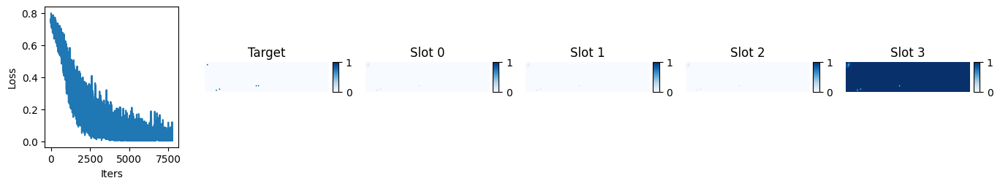

iter 7800 , loss 0.0061384337 , lr 0.0002727224576137535


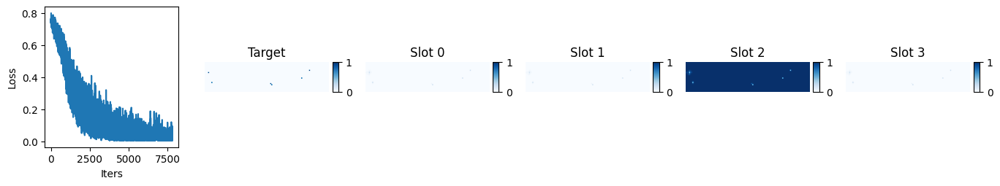

iter 7850 , loss 0.018976064 , lr 0.00027238280616656866


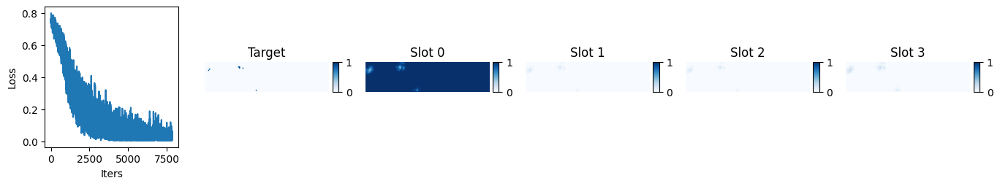

iter 7900 , loss 0.008492201 , lr 0.00027204126742511807


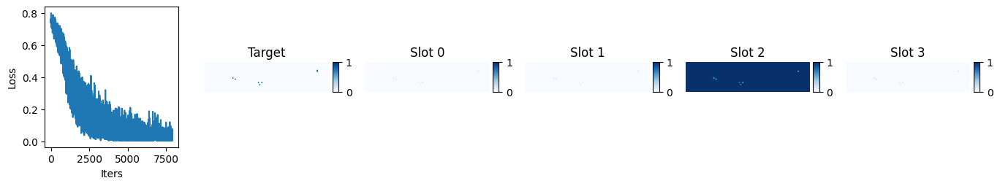

iter 7950 , loss 0.010313334 , lr 0.00027169784665635147


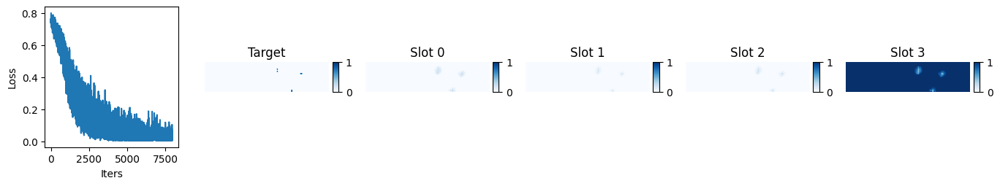

iter 8000 , loss 0.0072434926 , lr 0.0002713525491562421


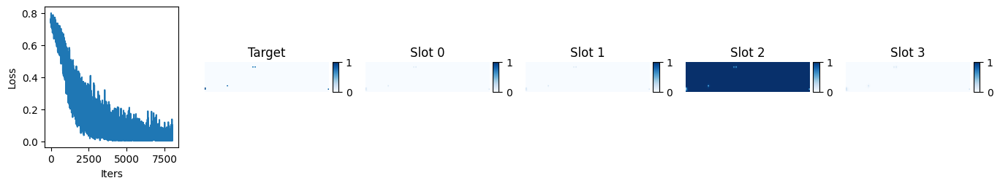

iter 8050 , loss 0.056659624 , lr 0.00027100538024970444


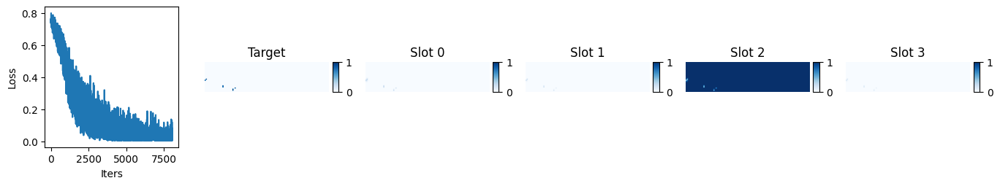

iter 8100 , loss 0.034341004 , lr 0.00027065634529051263


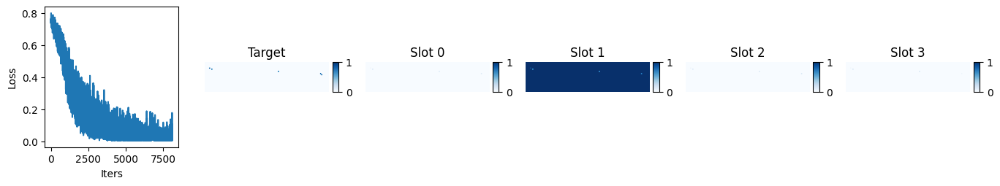

iter 8150 , loss 0.056887414 , lr 0.0002703054496612174


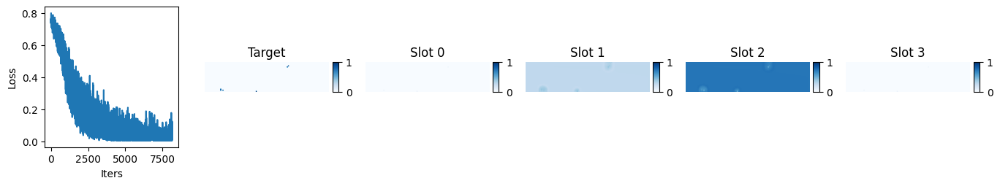

iter 8200 , loss 0.015401469 , lr 0.00026995269877306356


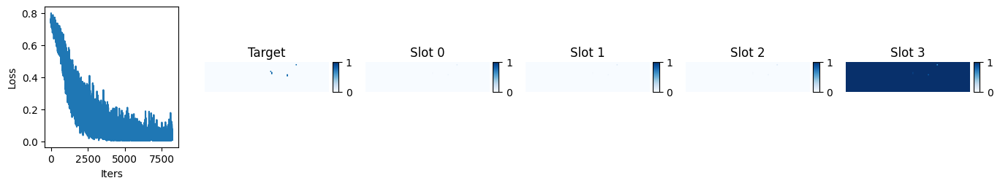

iter 8250 , loss 0.014800151 , lr 0.00026959809806590605


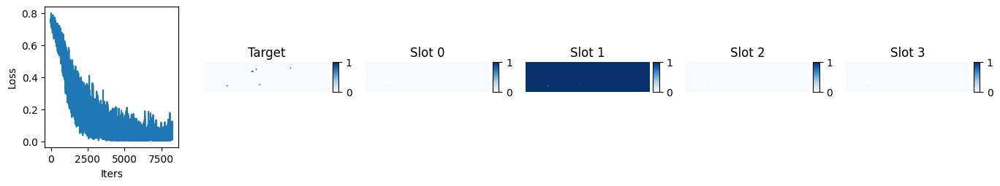

iter 8300 , loss 0.032333754 , lr 0.0002692416530081265


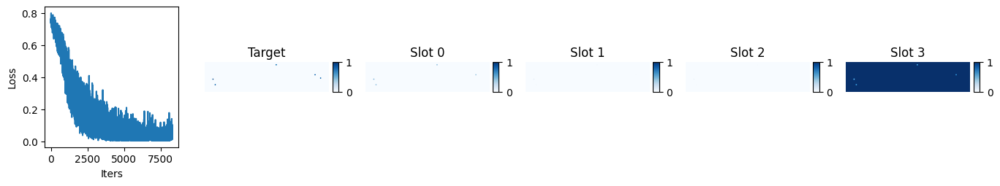

iter 8350 , loss 0.015450184 , lr 0.0002688833690965486


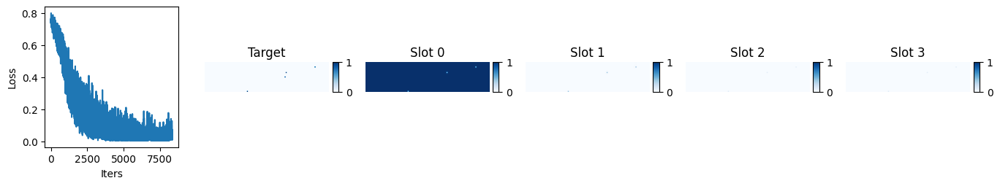

iter 8400 , loss 0.00583875 , lr 0.0002685232518563535


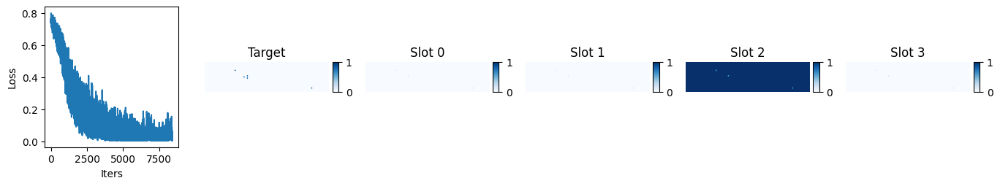

iter 8450 , loss 0.0065526715 , lr 0.0002681613068409946


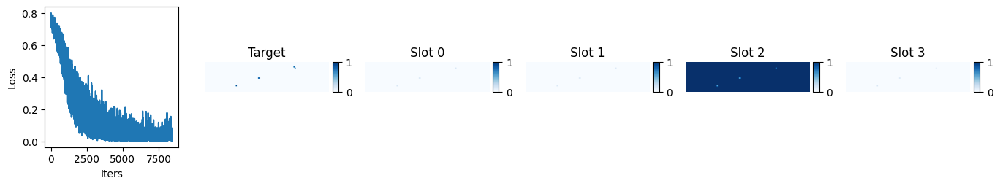

iter 8500 , loss 0.0071693906 , lr 0.0002677975396321117


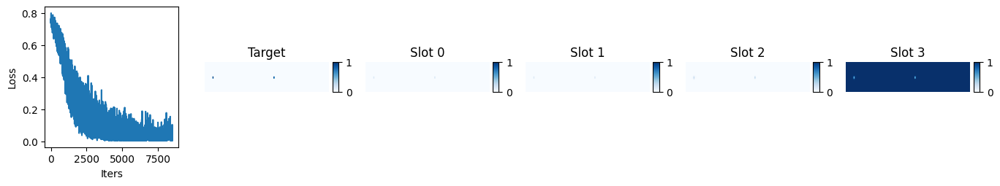

iter 8550 , loss 0.0061005154 , lr 0.00026743195583944524


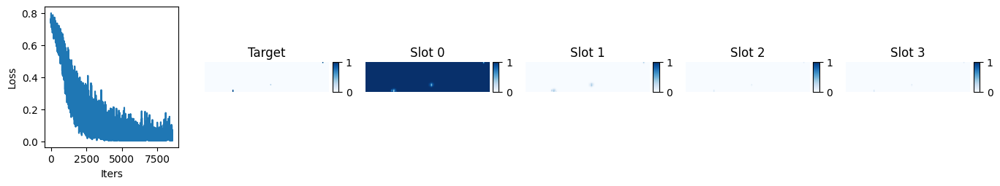

iter 8600 , loss 0.10575404 , lr 0.00026706456110074943


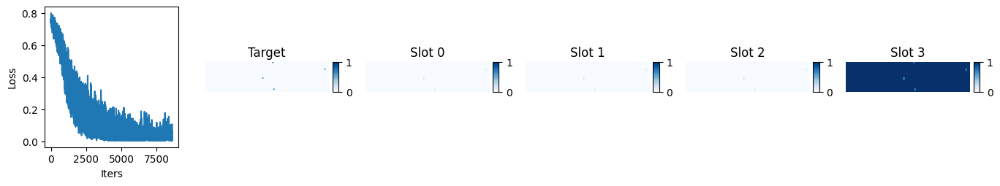

iter 8650 , loss 0.009847455 , lr 0.0002666953610817058


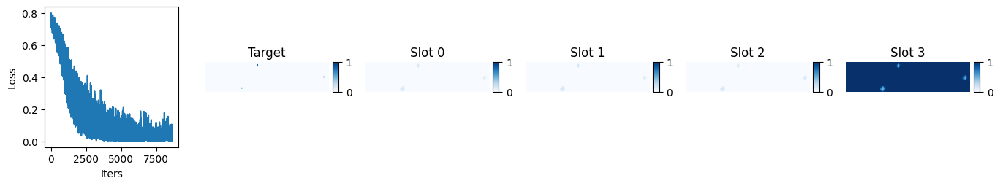

iter 8700 , loss 0.011998435 , lr 0.0002663243614758351


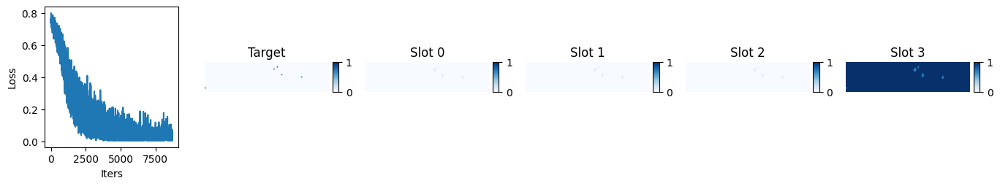

iter 8750 , loss 0.02041045 , lr 0.0002659515680044105


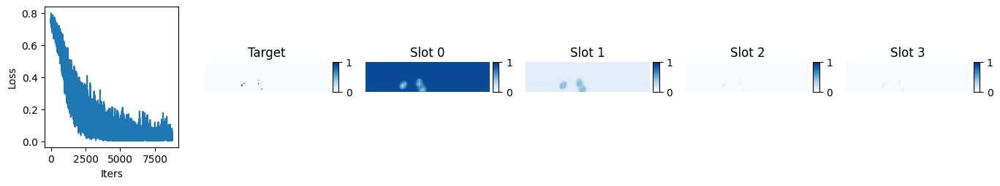

iter 8800 , loss 0.009132287 , lr 0.00026557698641636835


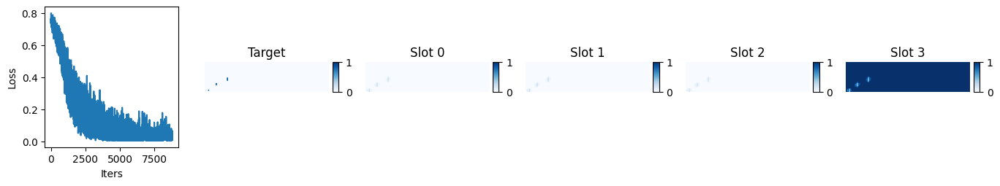

iter 8850 , loss 0.043105256 , lr 0.00026520062248822014


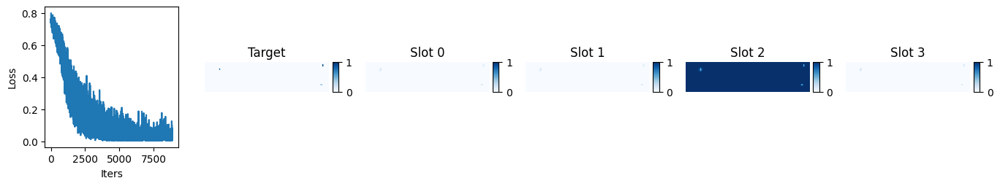

iter 8900 , loss 0.074521035 , lr 0.00026482248202396323


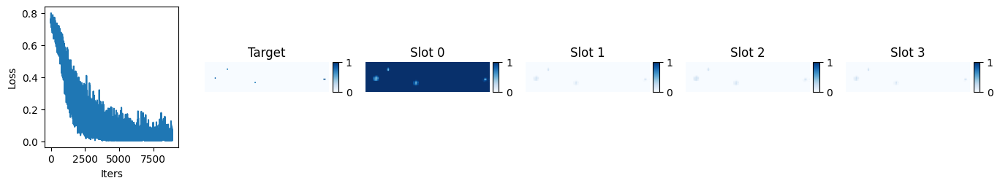

iter 8950 , loss 0.005666607 , lr 0.0002644425708549913


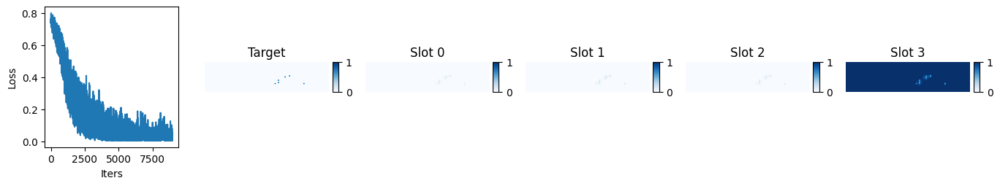

iter 9000 , loss 0.0064465874 , lr 0.00026406089484000466


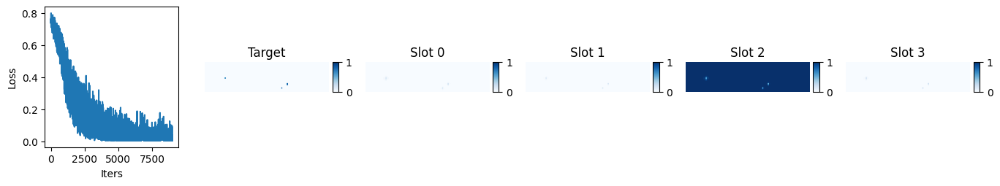

iter 9050 , loss 0.013182322 , lr 0.0002636774598649195


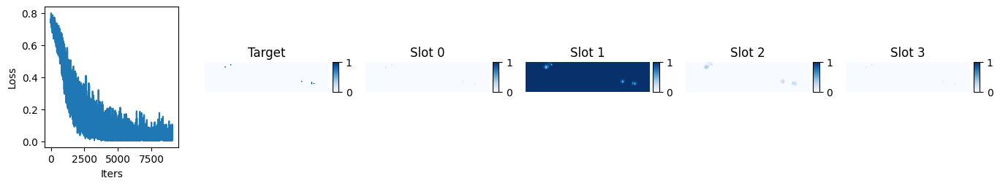

iter 9100 , loss 0.074345164 , lr 0.00026329227184277755


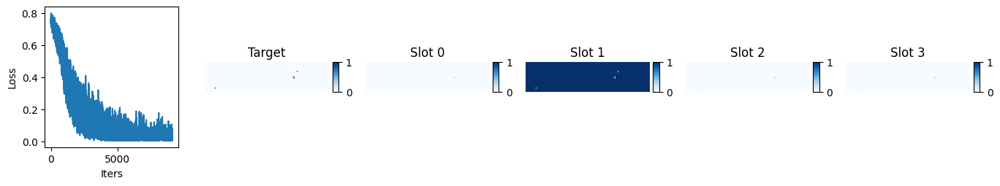

iter 9150 , loss 0.087971084 , lr 0.00026290533671365454


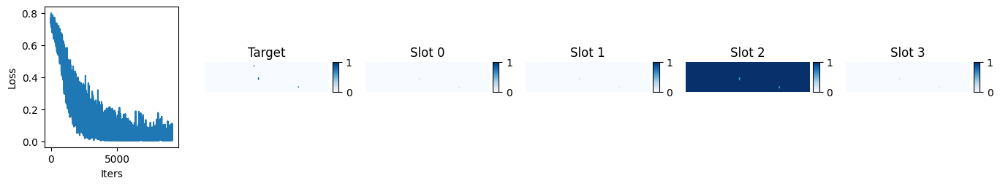

iter 9200 , loss 0.008697276 , lr 0.0002625166604445689


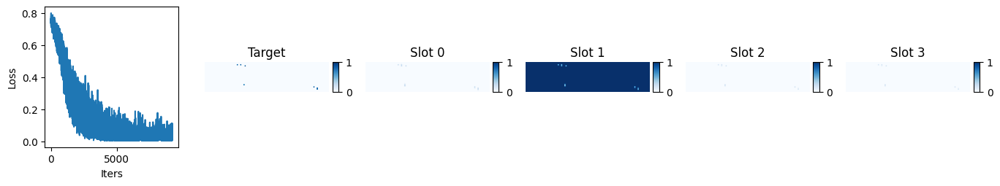

iter 9250 , loss 0.006753344 , lr 0.0002621262490293895


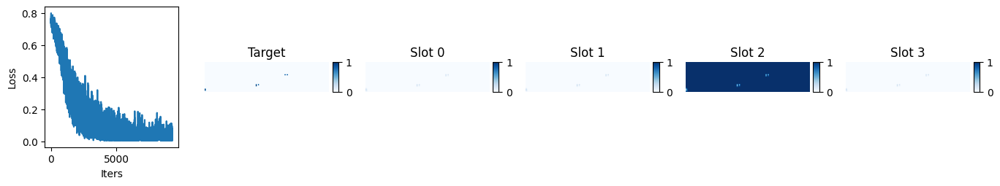

iter 9300 , loss 0.015836203 , lr 0.0002617341084887433


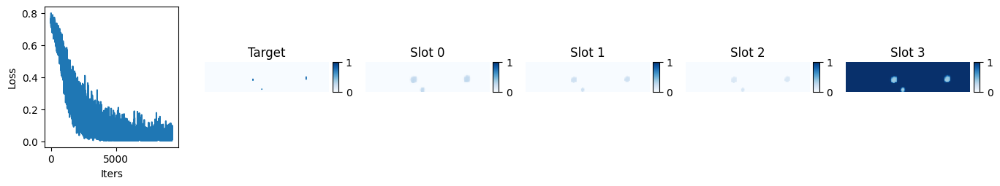

iter 9350 , loss 0.019921064 , lr 0.0002613402448699225


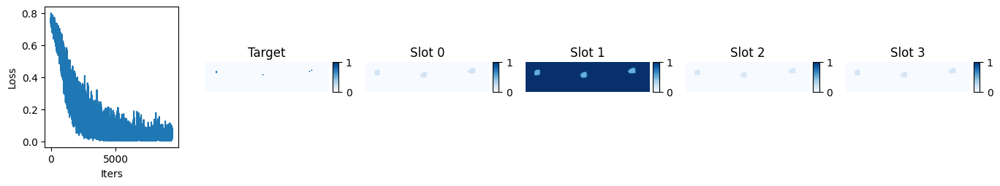

iter 9400 , loss 0.01694329 , lr 0.00026094466424679146


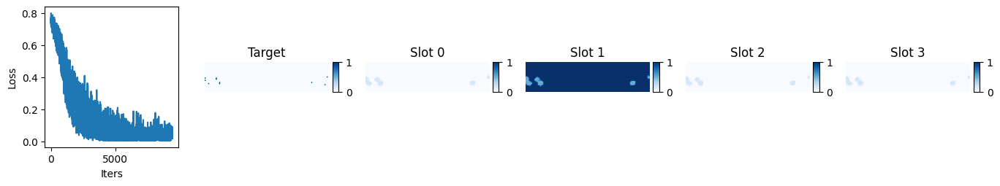

iter 9450 , loss 0.014120653 , lr 0.0002605473727196926


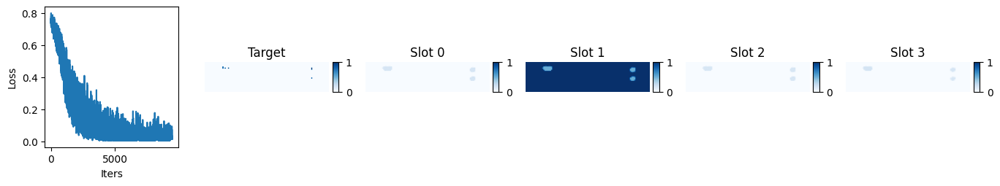

iter 9500 , loss 0.018185772 , lr 0.0002601483764153528


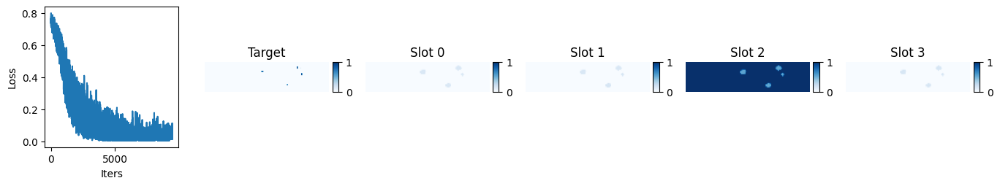

iter 9550 , loss 0.016177652 , lr 0.0002597476814867887


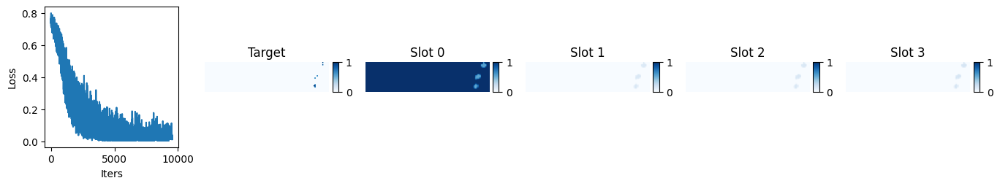

iter 9600 , loss 0.02737214 , lr 0.0002593452941132117


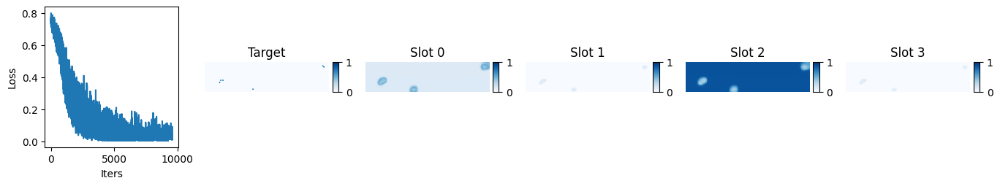

iter 9650 , loss 0.008155978 , lr 0.000258941220499933


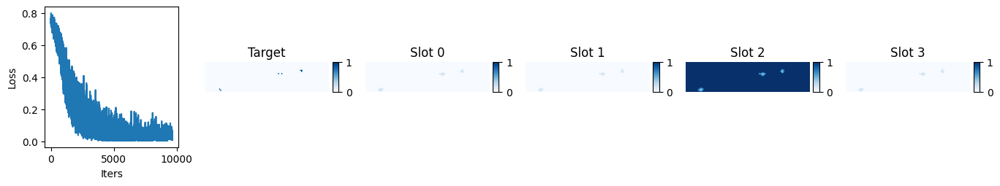

iter 9700 , loss 0.00879101 , lr 0.0002585354668782674


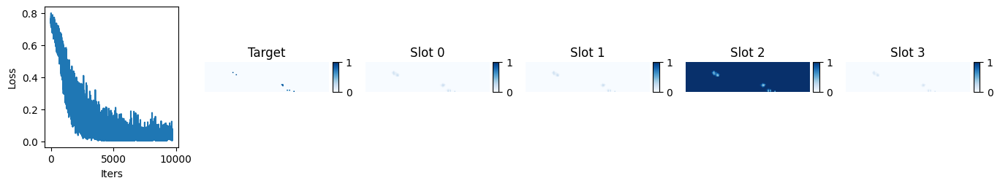

iter 9750 , loss 0.014530047 , lr 0.0002581280395054378


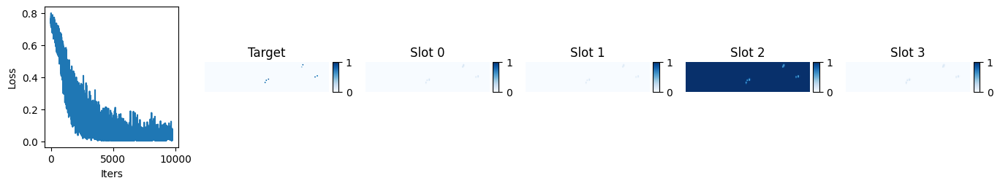

iter 9800 , loss 0.040527843 , lr 0.0002577189446644783


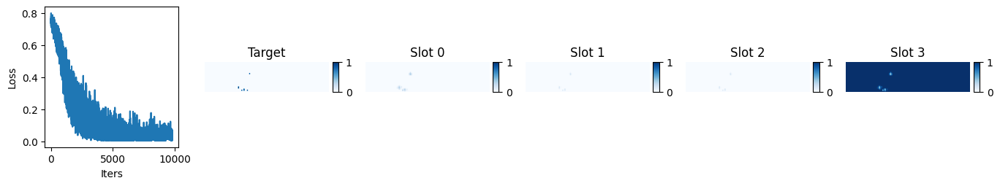

iter 9850 , loss 0.0149940895 , lr 0.0002573081886641374


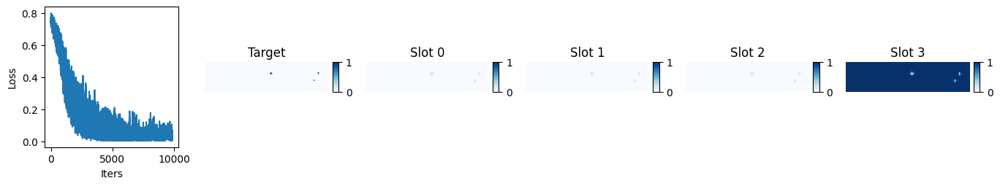

iter 9900 , loss 0.005884366 , lr 0.0002568957778387808


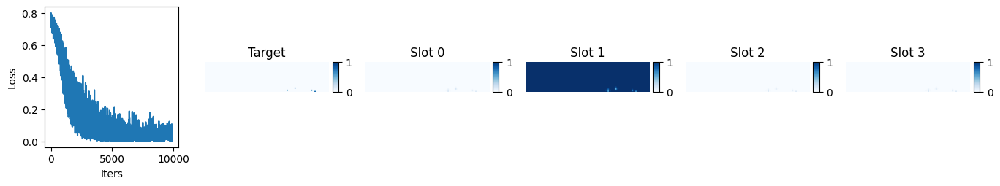

iter 9950 , loss 0.006067616 , lr 0.00025648171854829354


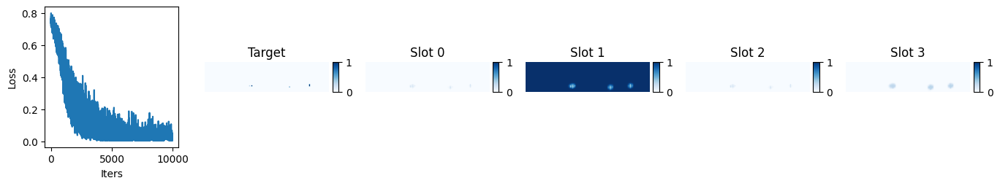

iter 10000 , loss 0.06689559 , lr 0.00025606601717798207


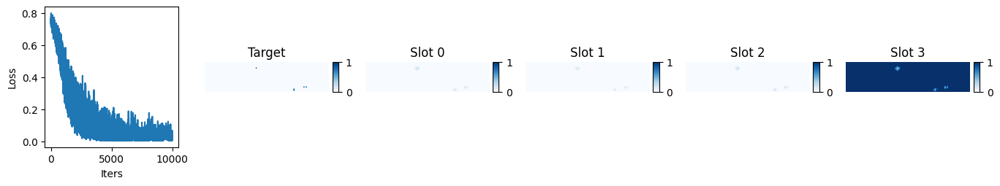

iter 10050 , loss 0.009555991 , lr 0.00025564868013847595


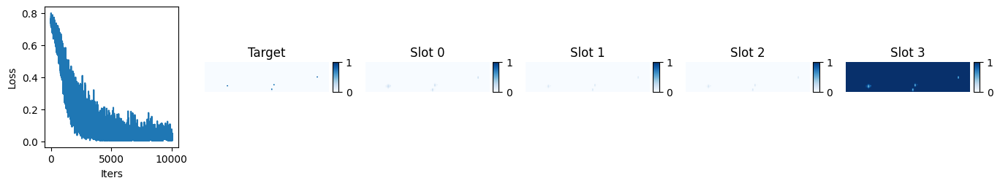

iter 10100 , loss 0.005567976 , lr 0.00025522971386562833


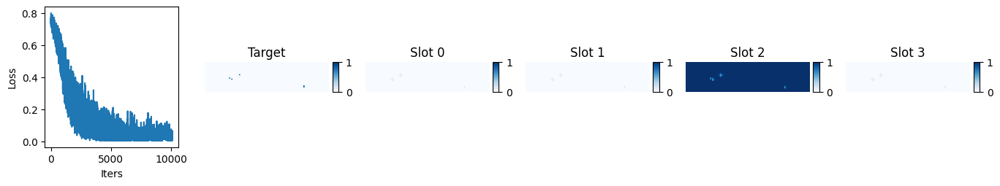

iter 10150 , loss 0.0056244726 , lr 0.0002548091248204176


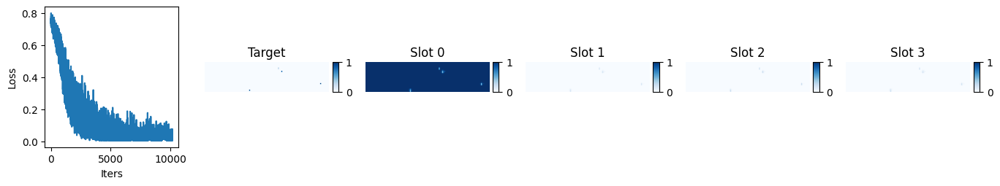

iter 10200 , loss 0.0064633307 , lr 0.0002543869194888471


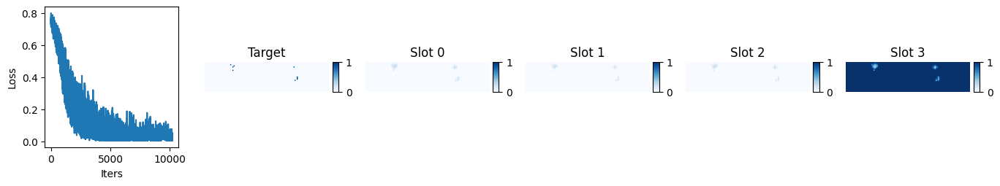

iter 10250 , loss 0.009536724 , lr 0.00025396310438184535


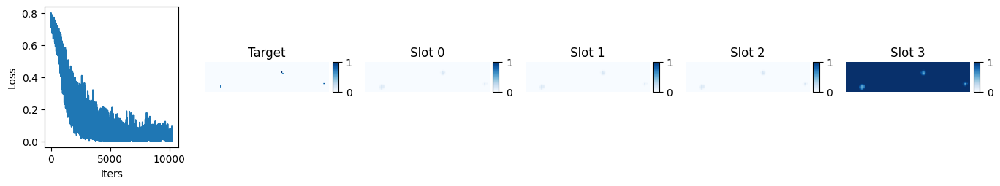

iter 10300 , loss 0.030561384 , lr 0.00025353768603516555


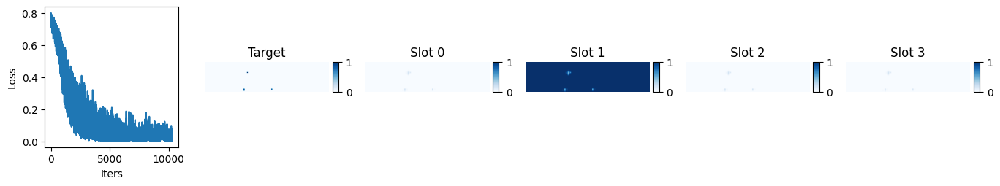

iter 10350 , loss 0.06377158 , lr 0.0002531106710092849


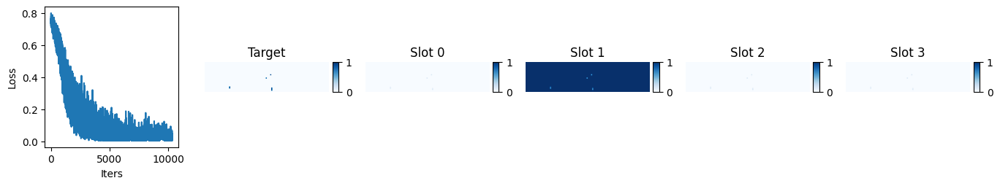

iter 10400 , loss 0.006371175 , lr 0.0002526820658893033


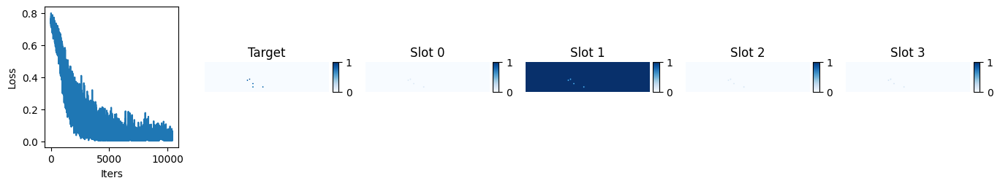

iter 10450 , loss 0.006205469 , lr 0.00025225187728484193


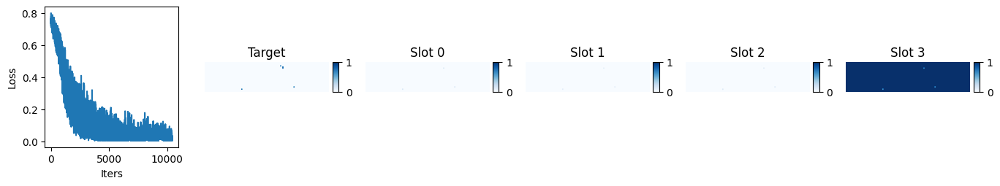

iter 10500 , loss 0.0097253295 , lr 0.0002518201118299413


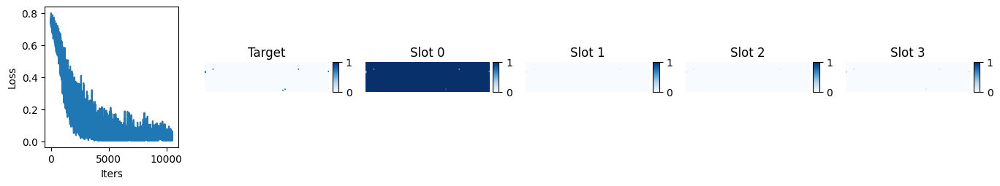

iter 10550 , loss 0.024316946 , lr 0.0002513867761829587


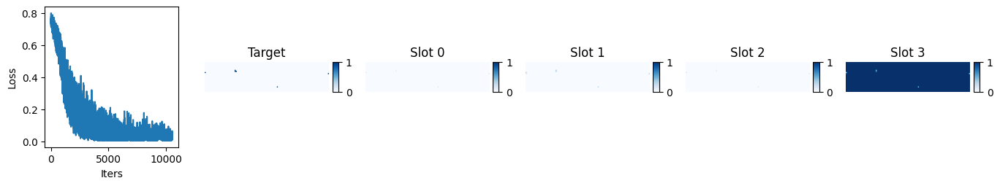

iter 10600 , loss 0.029309023 , lr 0.00025095187702646595


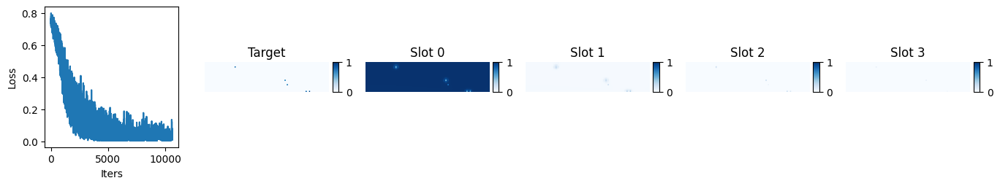

iter 10650 , loss 0.0069605615 , lr 0.00025051542106714614


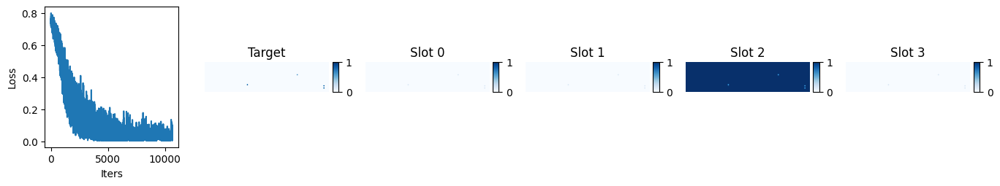

iter 10700 , loss 0.021220105 , lr 0.0002500774150356899


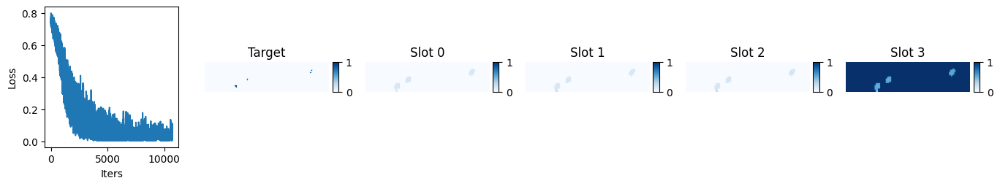

iter 10750 , loss 0.059386984 , lr 0.00024963786568669223


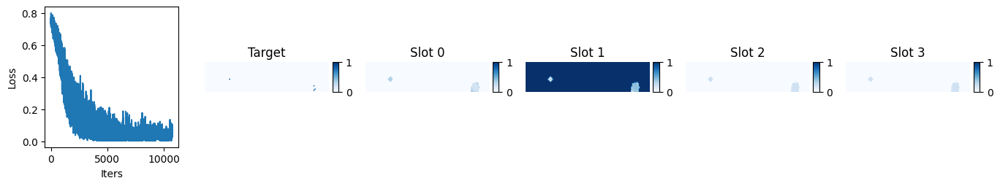

iter 10800 , loss 0.018282365 , lr 0.00024919677979854776


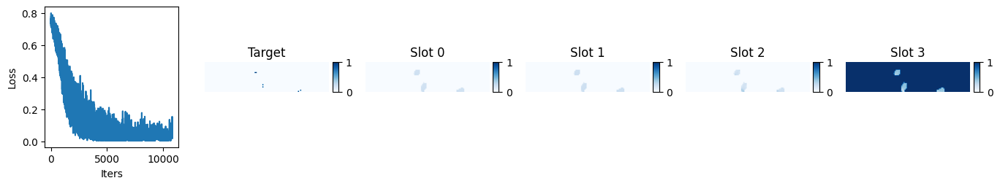

iter 10850 , loss 0.030261336 , lr 0.00024875416417334653


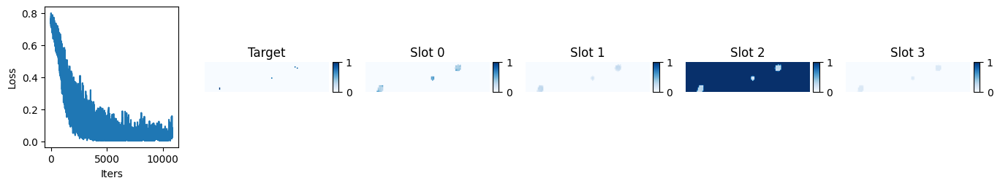

iter 10900 , loss 0.042393837 , lr 0.00024831002563676903


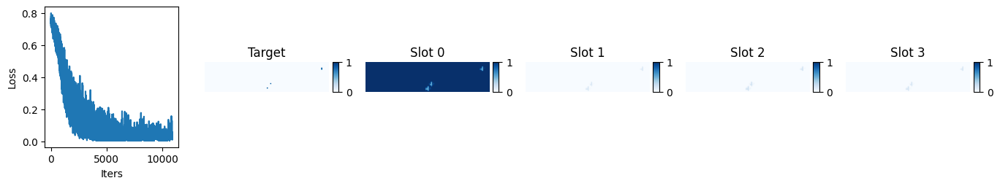

iter 10950 , loss 0.022578616 , lr 0.00024786437103798103


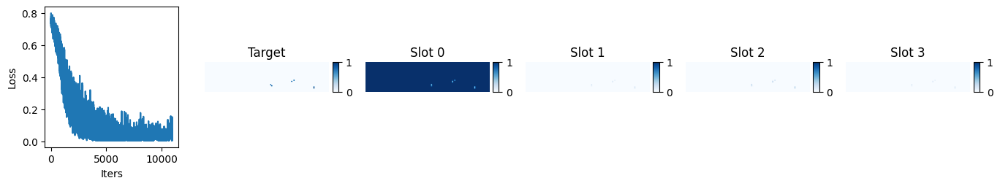

iter 11000 , loss 0.056655332 , lr 0.00024741720724952754


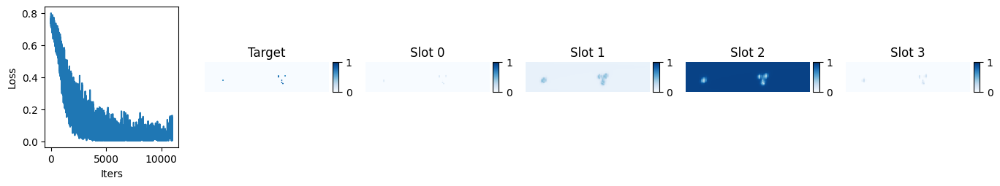

iter 11050 , loss 0.0058662 , lr 0.00024696854116722743


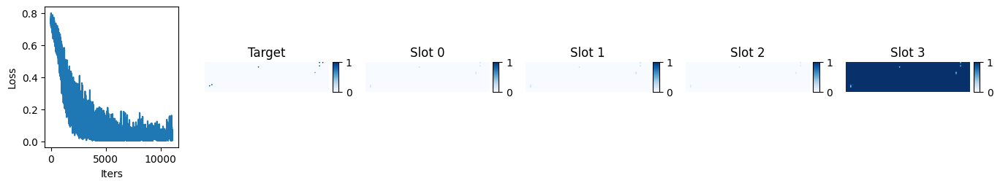

iter 11100 , loss 0.0075938664 , lr 0.00024651837971006687


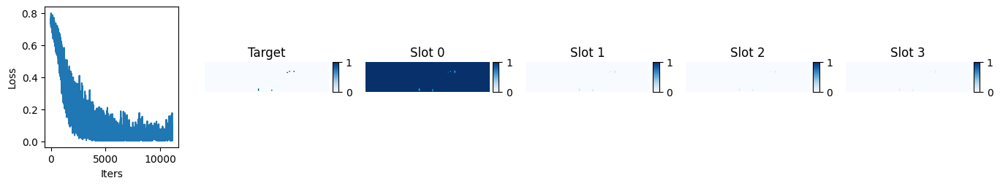

iter 11150 , loss 0.083959475 , lr 0.00024606672982009214


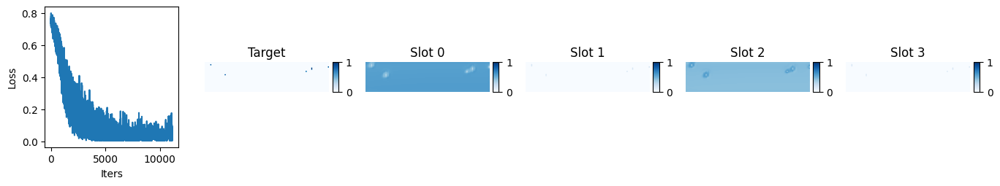

iter 11200 , loss 0.00611337 , lr 0.0002456135984623034


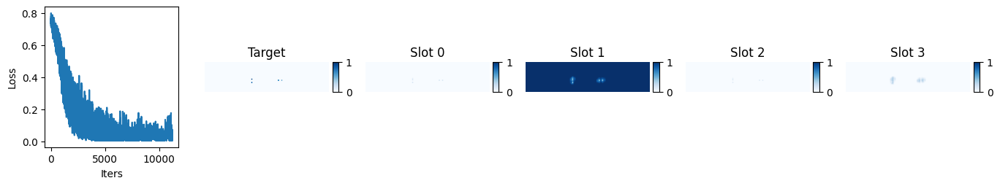

iter 11250 , loss 0.007463181 , lr 0.0002451589926245468


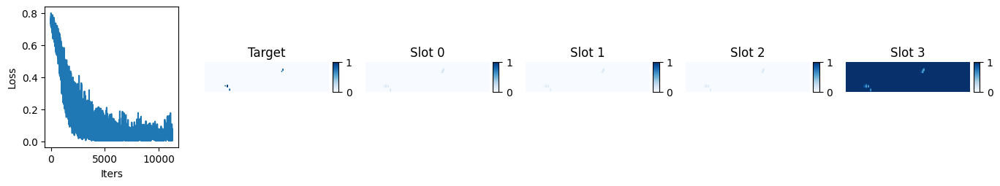

iter 11300 , loss 0.04333304 , lr 0.0002447029193174066


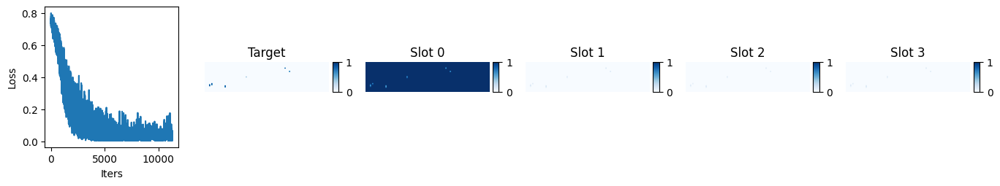

iter 11350 , loss 0.05609579 , lr 0.00024424538557409753


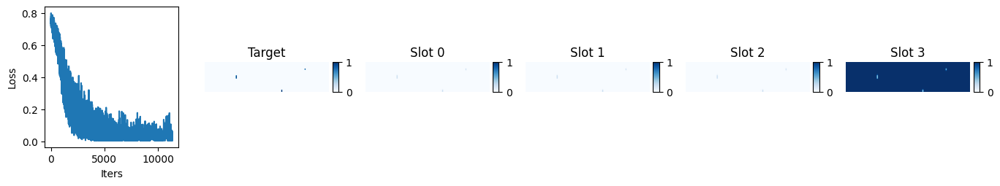

iter 11400 , loss 0.005569591 , lr 0.00024378639845035579


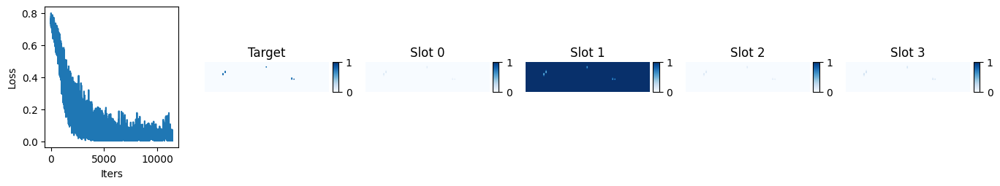

iter 11450 , loss 0.011691741 , lr 0.00024332596502433057


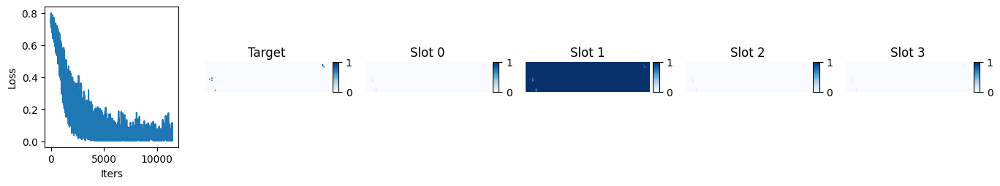

iter 11500 , loss 0.023078911 , lr 0.00024286409239647507


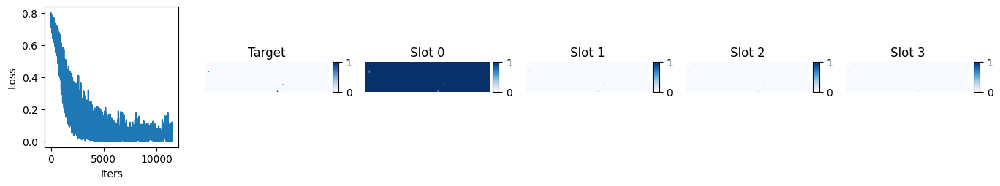

iter 11550 , loss 0.0056215585 , lr 0.00024240078768943647


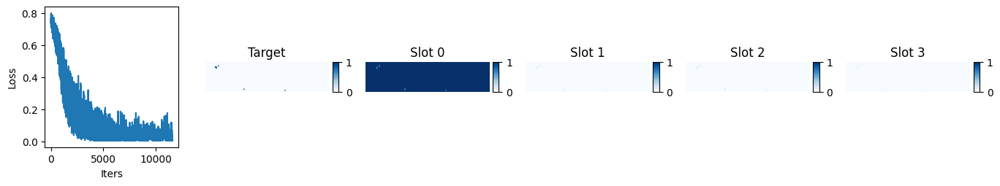

iter 11600 , loss 0.04208578 , lr 0.00024193605804794646


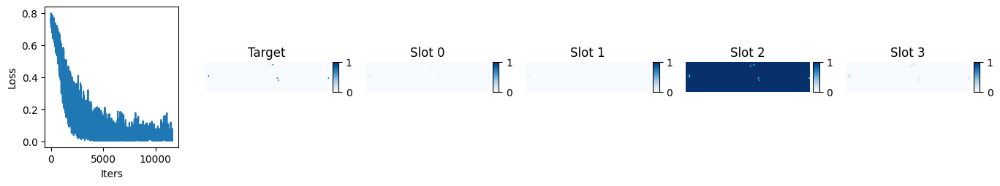

iter 11650 , loss 0.0080951955 , lr 0.00024146991063871107


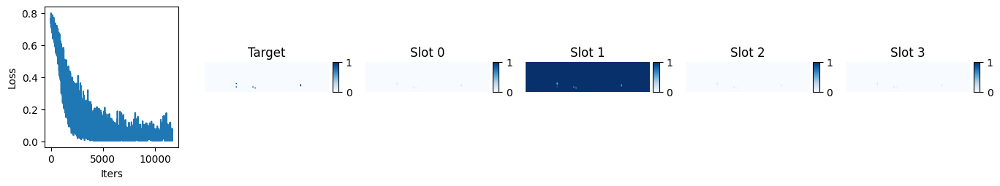

iter 11700 , loss 0.045662537 , lr 0.00024100235265029992


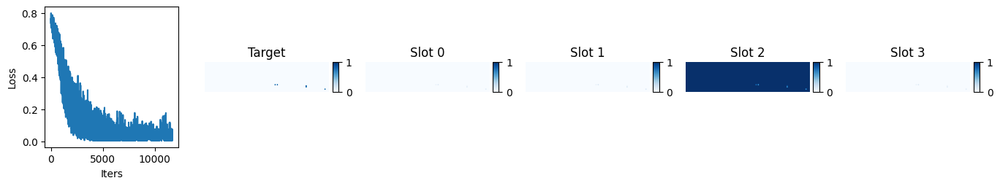

iter 11750 , loss 0.007899364 , lr 0.0002405333912930357


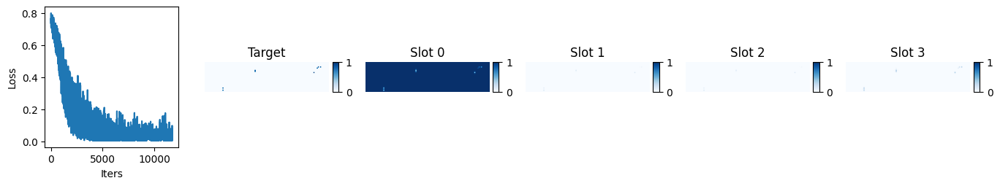

iter 11800 , loss 0.0076633547 , lr 0.0002400630337988826


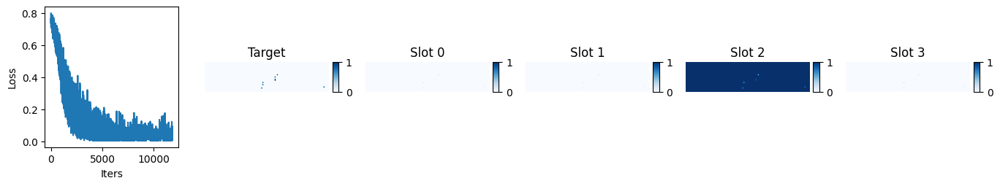

iter 11850 , loss 0.0057680956 , lr 0.00023959128742133504


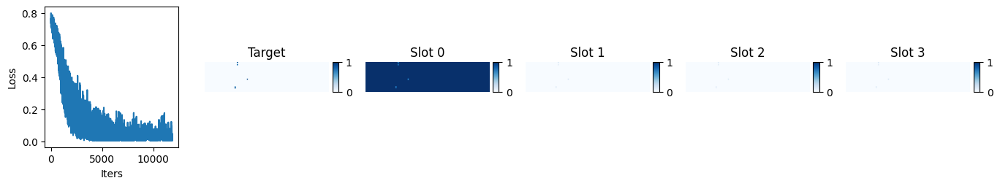

iter 11900 , loss 0.0070190853 , lr 0.00023911815943530577


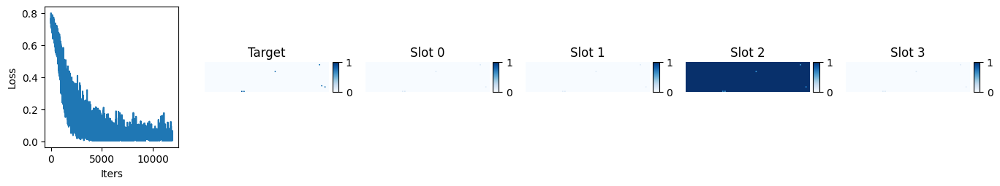

iter 11950 , loss 0.00813063 , lr 0.00023864365713701356


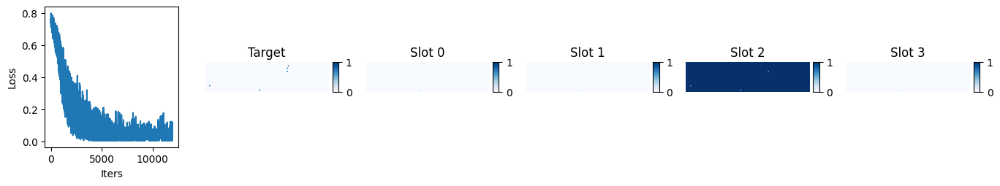

iter 12000 , loss 0.01060404 , lr 0.00023816778784387094


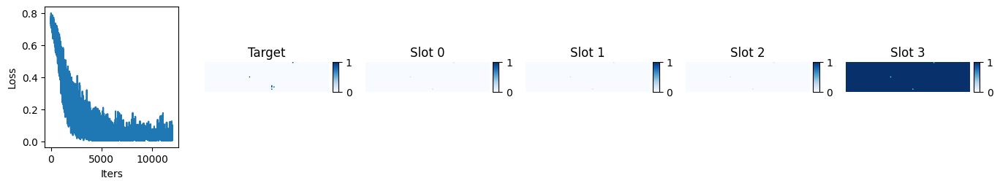

iter 12050 , loss 0.008998062 , lr 0.00023769055889437103


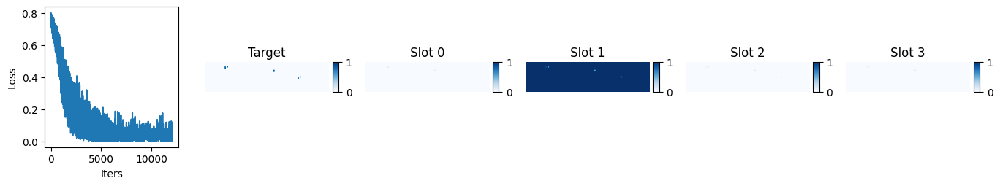

iter 12100 , loss 0.05092125 , lr 0.00023721197764797454


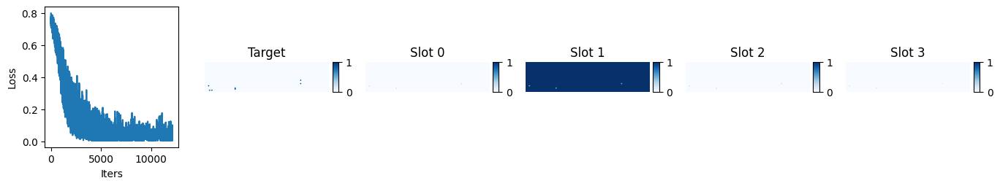

iter 12150 , loss 0.005321786 , lr 0.00023673205148499644


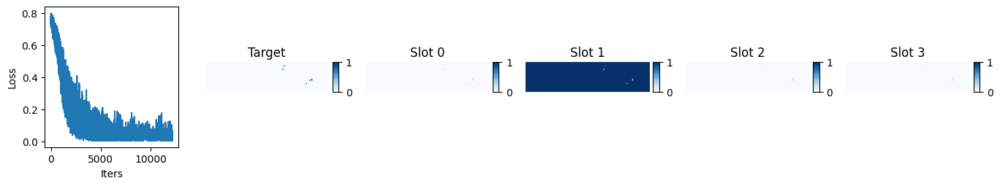

iter 12200 , loss 0.005193067 , lr 0.00023625078780649178


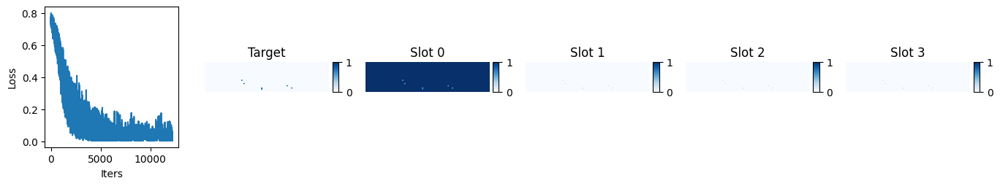

iter 12250 , loss 0.012854581 , lr 0.0002357681940341418


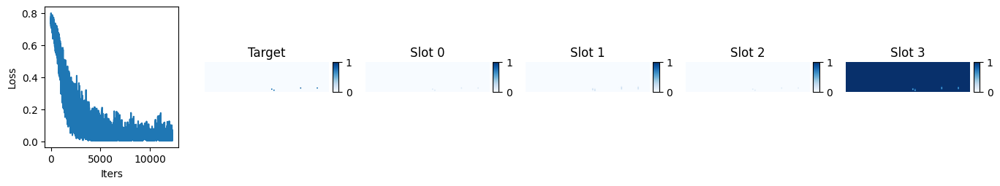

iter 12300 , loss 0.012029452 , lr 0.00023528427761013962


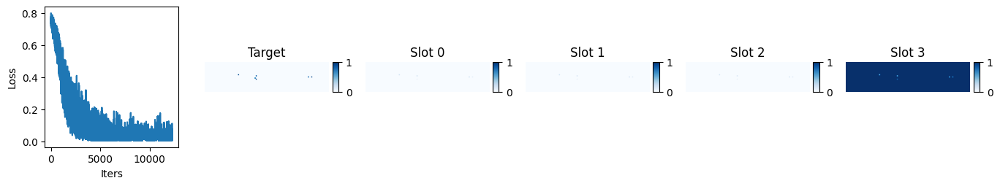

iter 12350 , loss 0.011188471 , lr 0.0002347990459970749


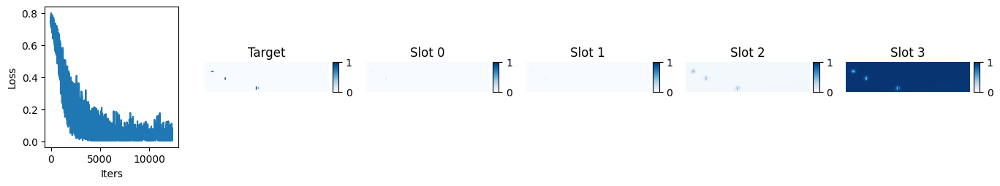

iter 12400 , loss 0.056536496 , lr 0.00023431250667781958


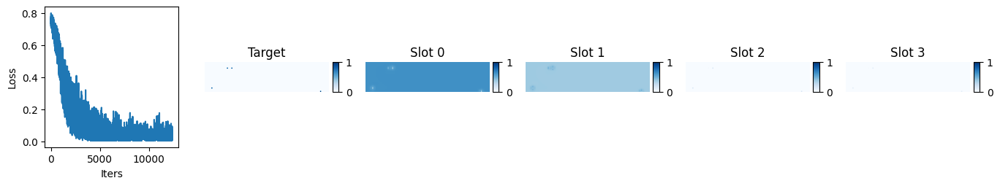

iter 12450 , loss 0.011944452 , lr 0.00023382466715541174


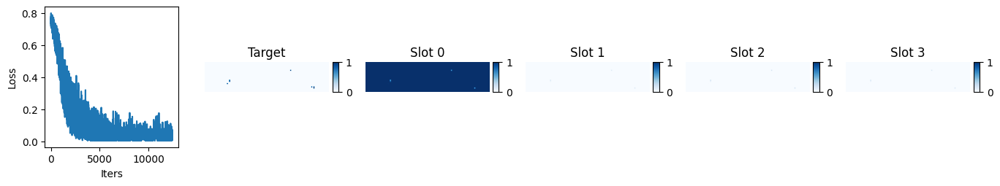

iter 12500 , loss 0.0059809512 , lr 0.00023333553495294033


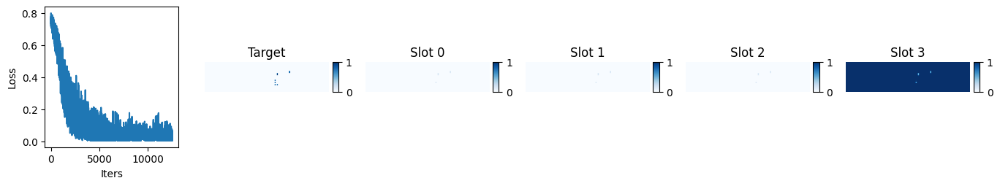

iter 12550 , loss 0.005832549 , lr 0.00023284511761342895


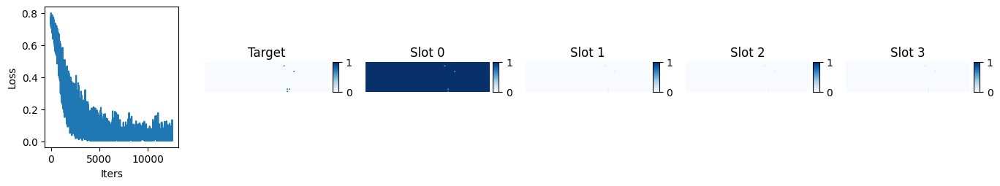

iter 12600 , loss 0.051186007 , lr 0.00023235342269971974


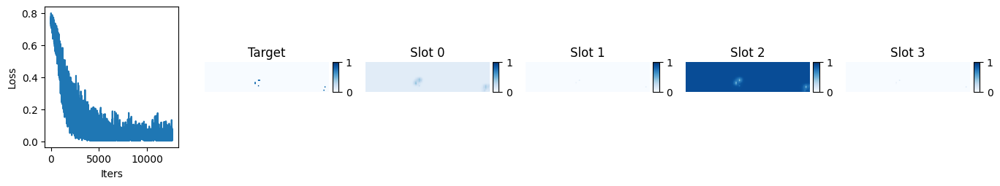

iter 12650 , loss 0.011150858 , lr 0.00023186045779435648


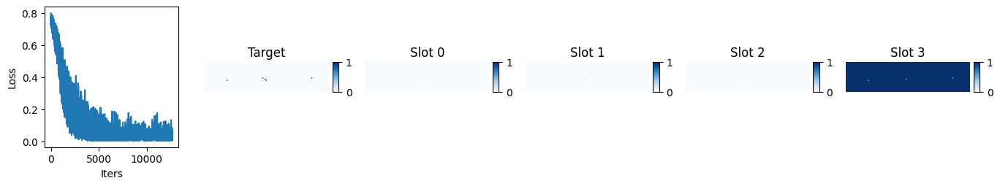

iter 12700 , loss 0.013224757 , lr 0.00023136623049946784


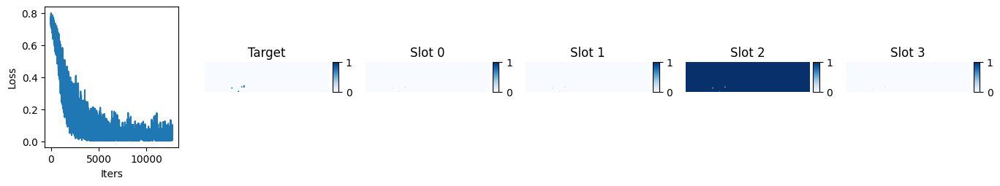

iter 12750 , loss 0.00686202 , lr 0.00023087074843665


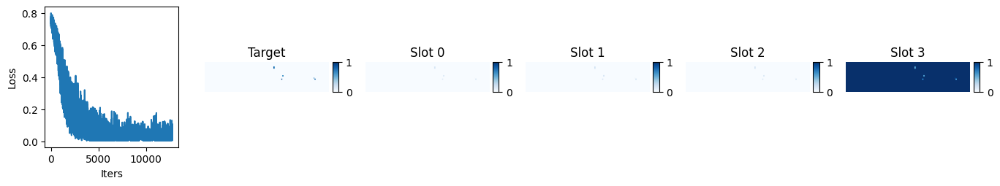

iter 12800 , loss 0.050074674 , lr 0.00023037401924684946


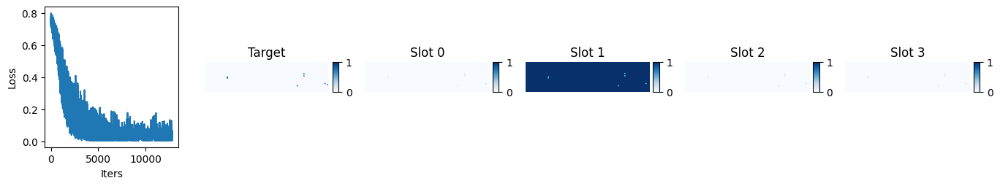

iter 12850 , loss 0.014608587 , lr 0.00022987605059024475


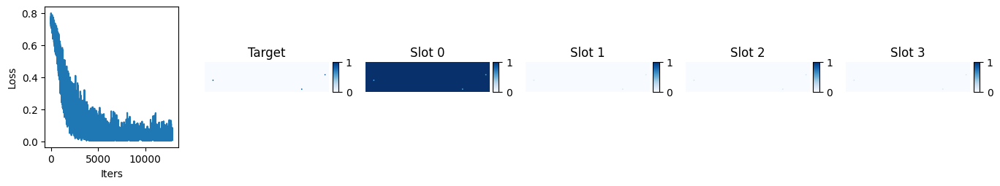

iter 12900 , loss 0.012152474 , lr 0.00022937685014612856


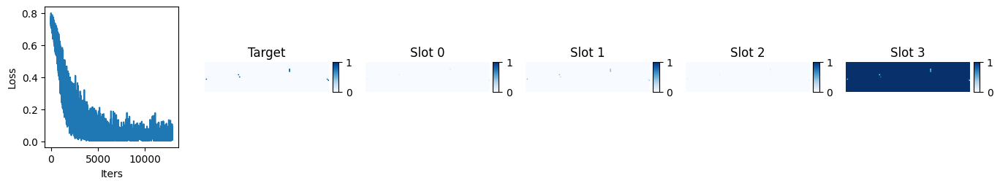

iter 12950 , loss 0.01015803 , lr 0.0002288764256127893


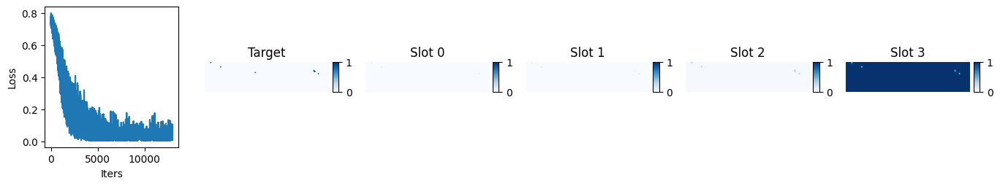

iter 13000 , loss 0.008337272 , lr 0.0002283747847073923


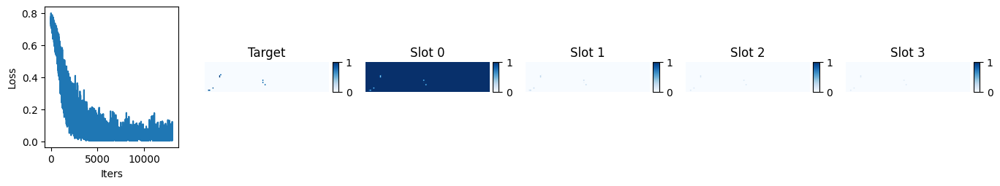

iter 13050 , loss 0.006807128 , lr 0.00022787193516586091


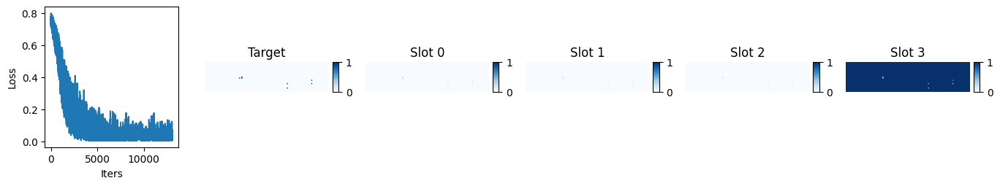

iter 13100 , loss 0.026303202 , lr 0.00022736788474275708


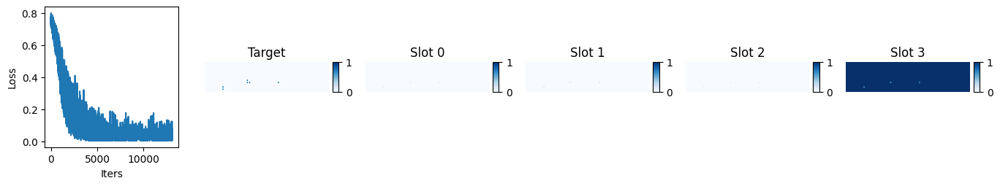

iter 13150 , loss 0.01749128 , lr 0.00022686264121116195


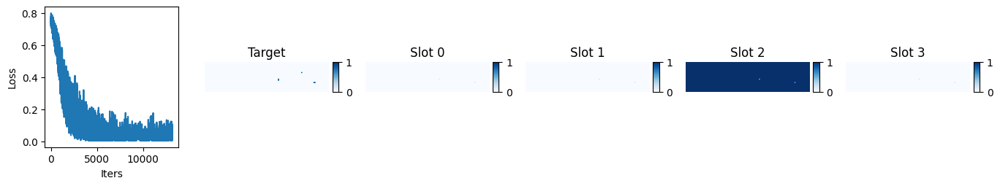

iter 13200 , loss 0.0095478725 , lr 0.00022635621236255567


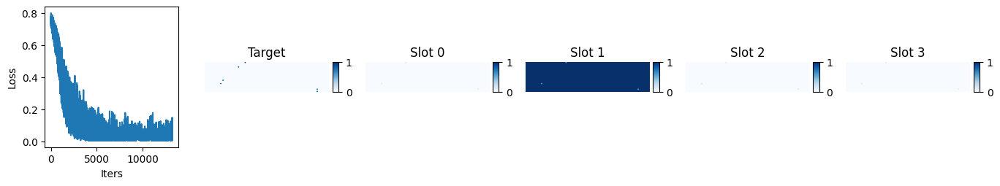

iter 13250 , loss 0.0077164704 , lr 0.00022584860600669766


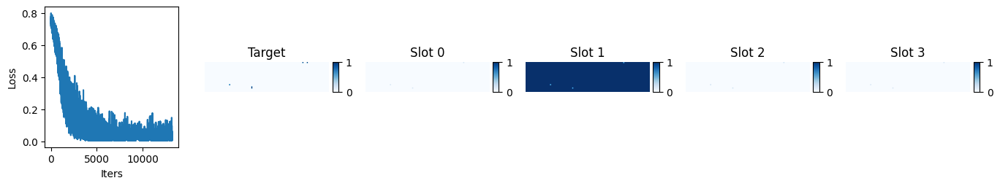

iter 13300 , loss 0.0087778075 , lr 0.00022533982997150585


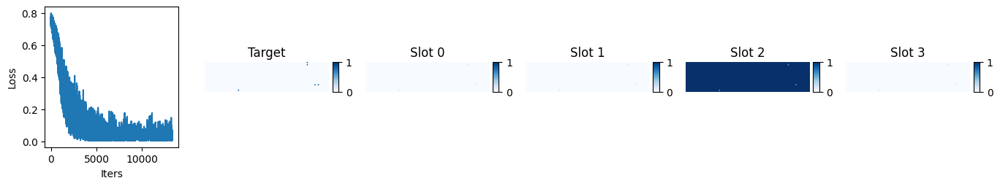

iter 13350 , loss 0.0071788942 , lr 0.0002248298921029361


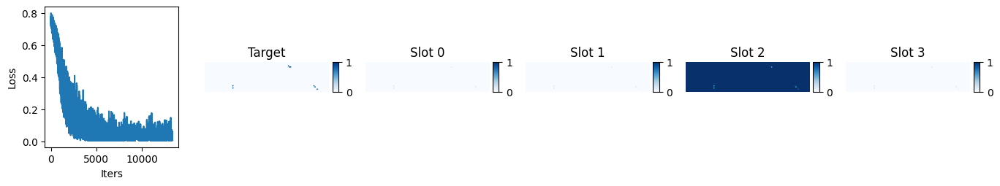

iter 13400 , loss 0.011118996 , lr 0.00022431880026486112


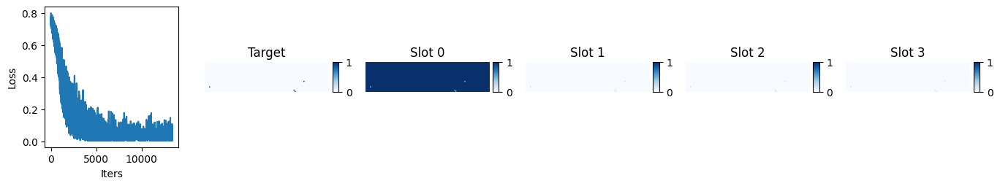

iter 13450 , loss 0.004691013 , lr 0.00022380656233894934


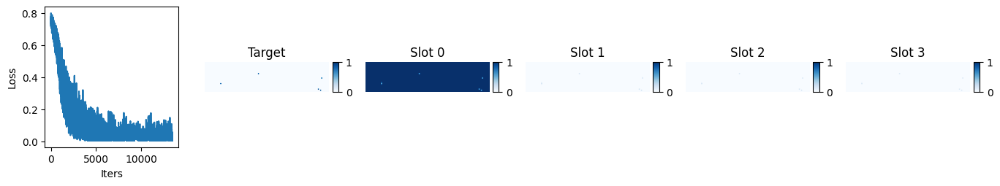

iter 13500 , loss 0.009889583 , lr 0.00022329318622454325


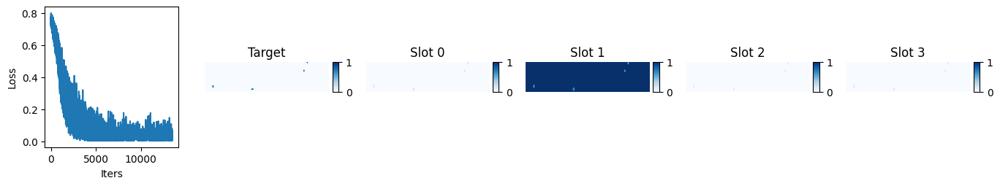

iter 13550 , loss 0.028170025 , lr 0.00022277867983853754


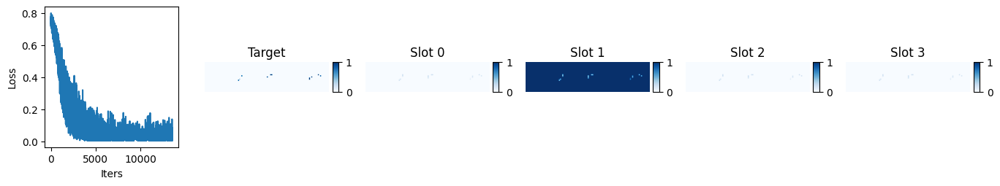

iter 13600 , loss 0.031514198 , lr 0.00022226305111525726


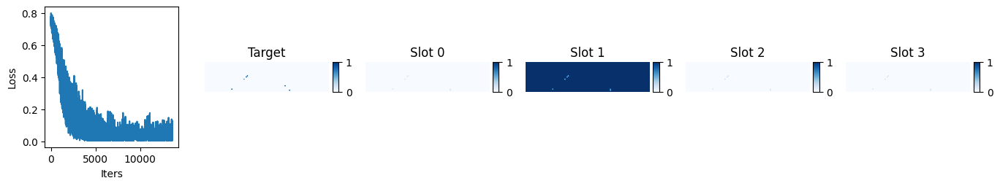

iter 13650 , loss 0.03644051 , lr 0.00022174630800633516


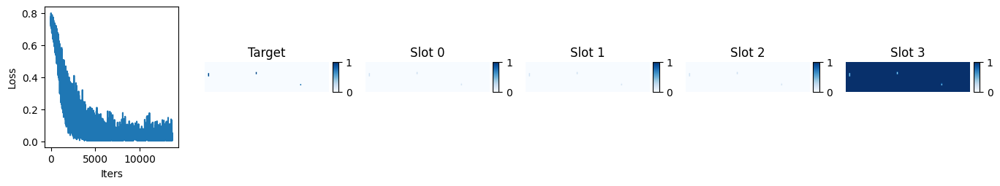

iter 13700 , loss 0.007832942 , lr 0.00022122845848058918


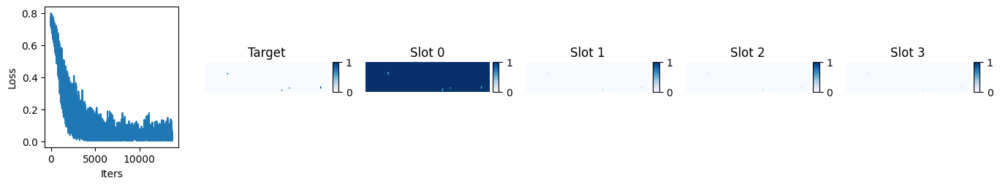

iter 13750 , loss 0.0045562927 , lr 0.00022070951052389966


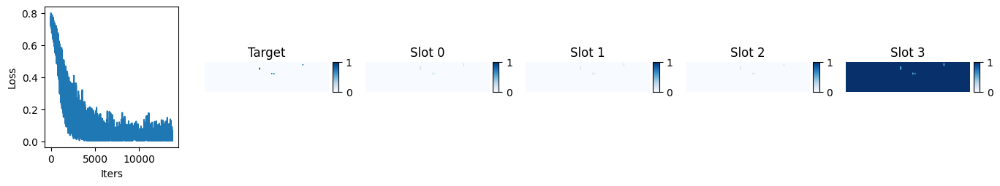

iter 13800 , loss 0.0056978953 , lr 0.000220189472139086


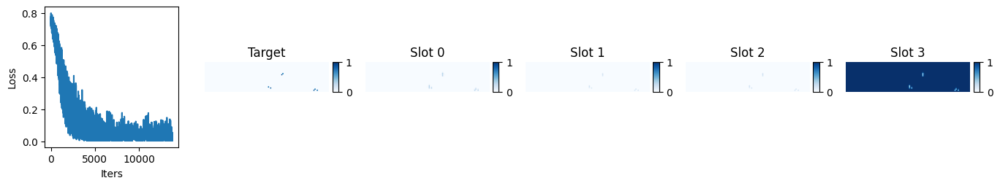

iter 13850 , loss 0.005881483 , lr 0.00021966835134578345


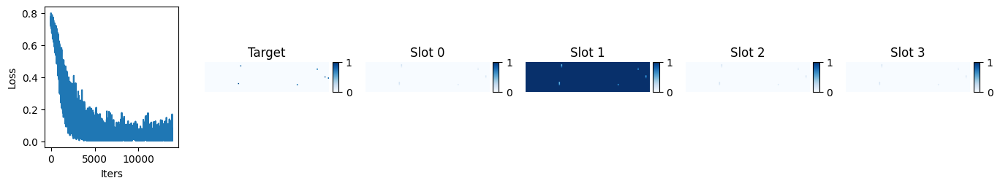

iter 13900 , loss 0.094262965 , lr 0.00021914615618031933


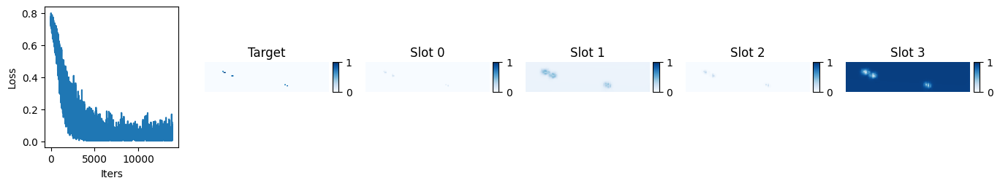

iter 13950 , loss 0.013239029 , lr 0.00021862289469558904


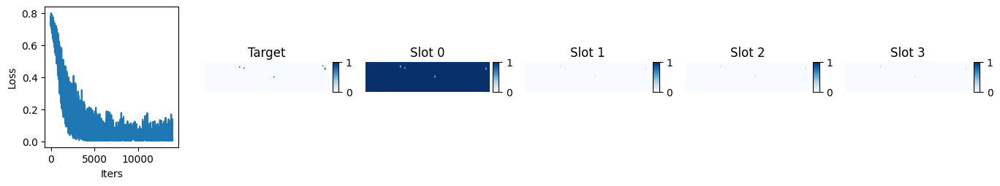

iter 14000 , loss 0.0050588246 , lr 0.00021809857496093199


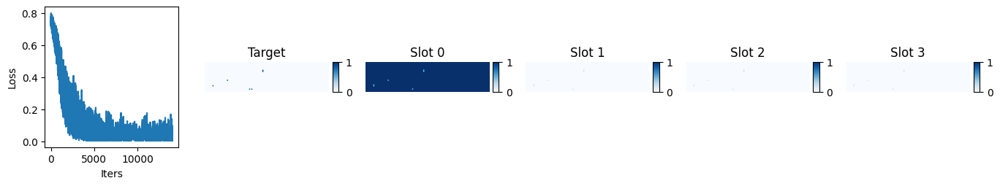

iter 14050 , loss 0.010312246 , lr 0.00021757320506200713


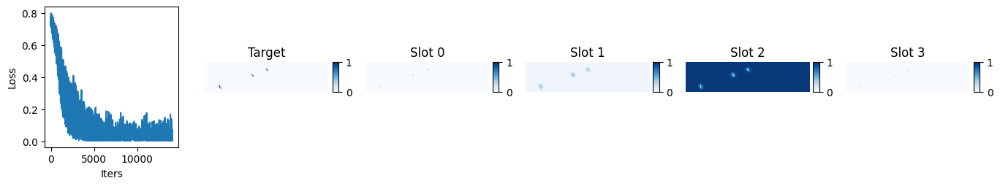

iter 14100 , loss 0.037488796 , lr 0.00021704679310066818


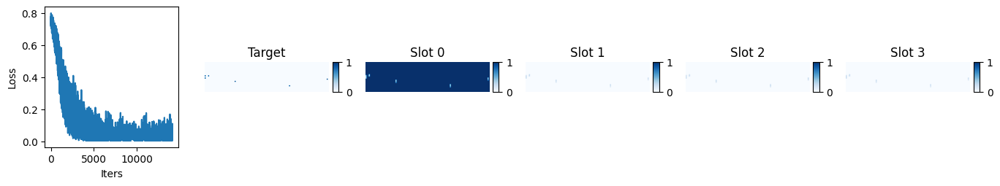

iter 14150 , loss 0.0067601562 , lr 0.00021651934719483875


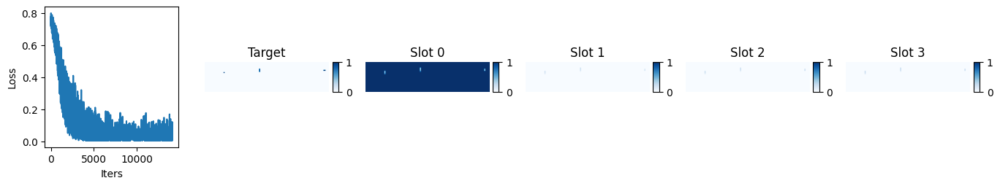

iter 14200 , loss 0.010662128 , lr 0.00021599087547838727


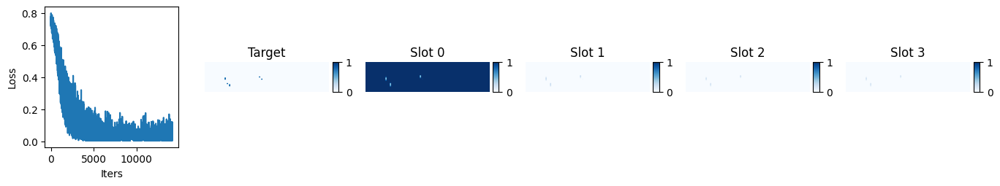

iter 14250 , loss 0.04513181 , lr 0.0002154613861010013


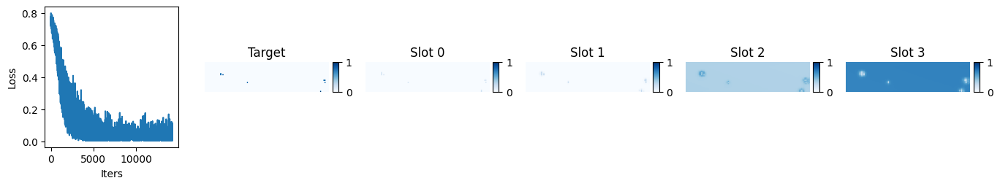

iter 14300 , loss 0.0058665876 , lr 0.00021493088722806207


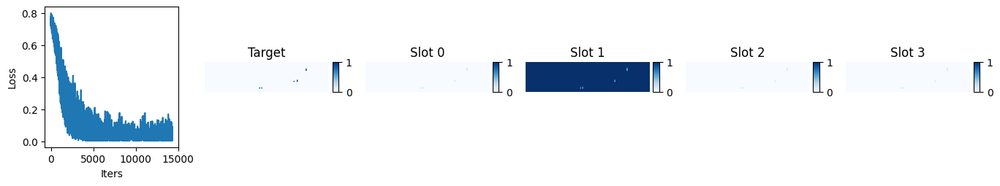

iter 14350 , loss 0.0658071 , lr 0.00021439938704051847


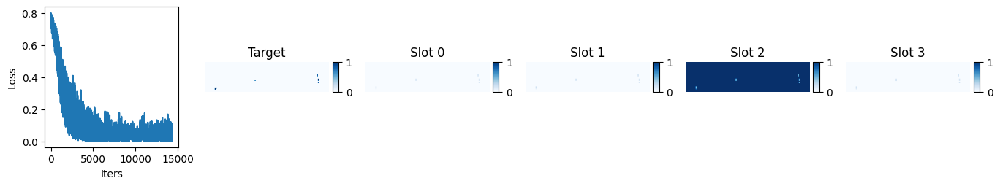

iter 14400 , loss 0.0041337814 , lr 0.00021386689373476087


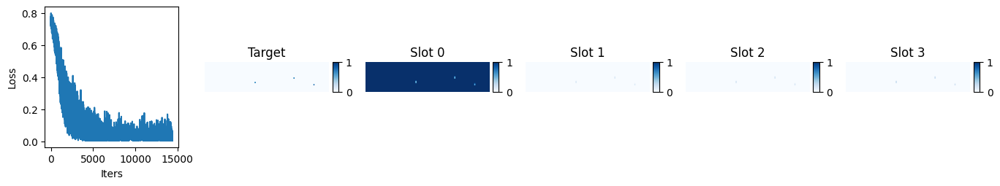

iter 14450 , loss 0.04762008 , lr 0.0002133334155224948


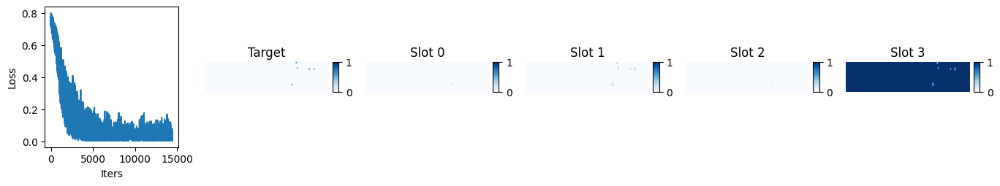

iter 14500 , loss 0.0047427085 , lr 0.0002127989606306142


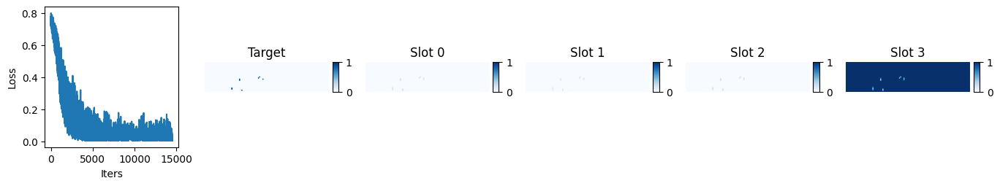

iter 14550 , loss 0.005048181 , lr 0.00021226353730107467


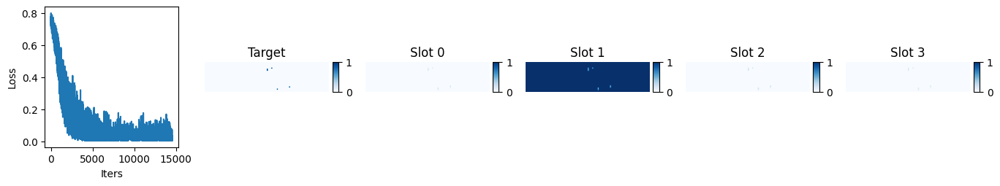

iter 14600 , loss 0.0057647876 , lr 0.00021172715379076632


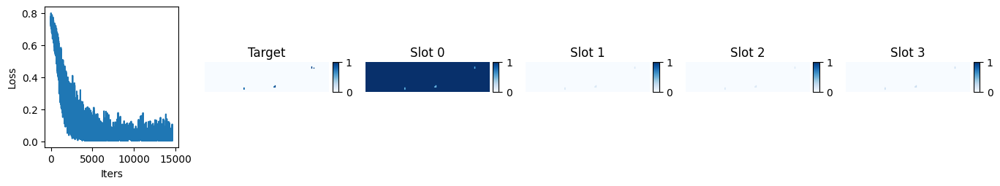

iter 14650 , loss 0.040834036 , lr 0.00021118981837138636


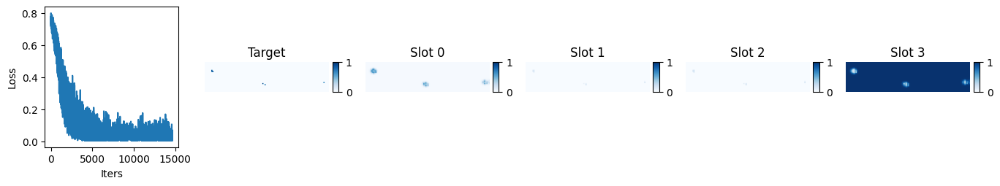

iter 14700 , loss 0.013513334 , lr 0.00021065153932931175


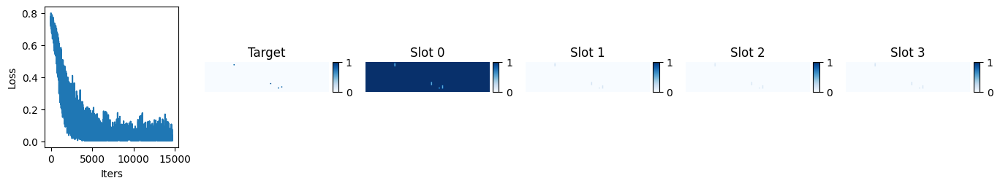

iter 14750 , loss 0.006560025 , lr 0.0002101123249654711


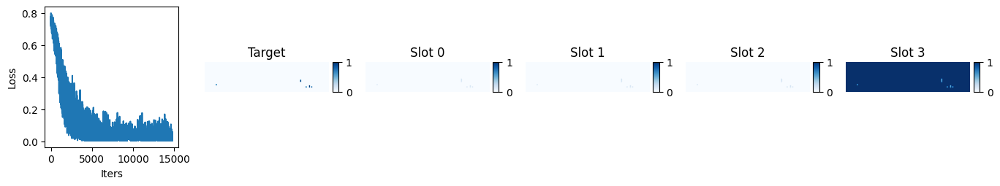

iter 14800 , loss 0.059360325 , lr 0.00020957218359521706


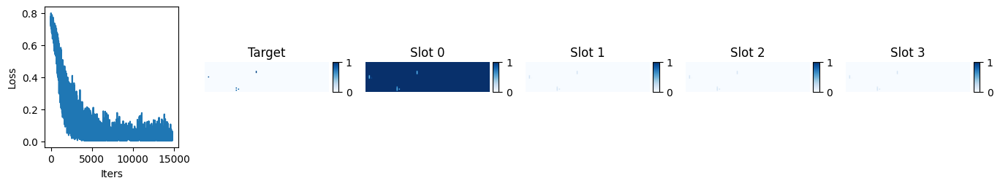

iter 14850 , loss 0.005246347 , lr 0.0002090311235481977


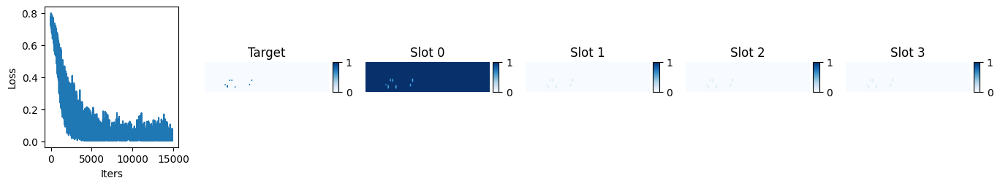

iter 14900 , loss 0.06640943 , lr 0.00020848915316822825


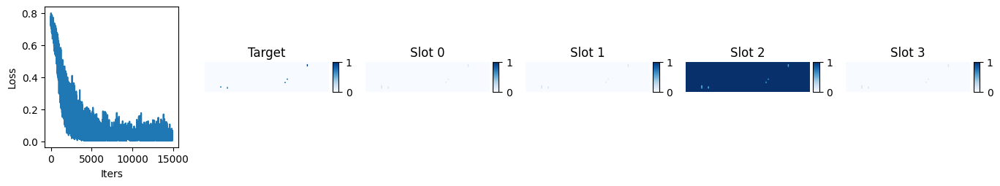

iter 14950 , loss 0.11436719 , lr 0.0002079462808131624


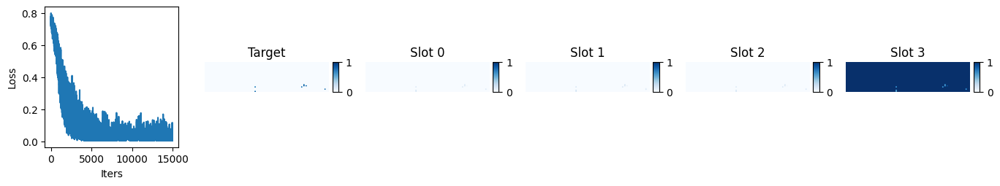

iter 15000 , loss 0.0040492704 , lr 0.00020740251485476345


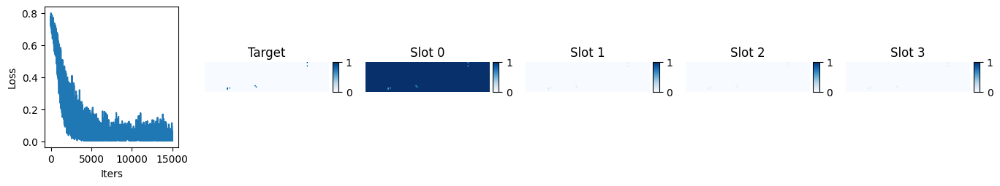

iter 15050 , loss 0.0048419903 , lr 0.00020685786367857518


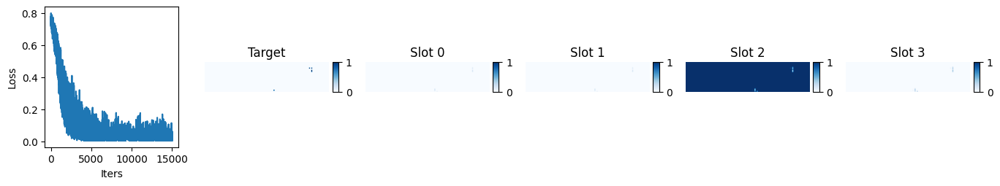

iter 15100 , loss 0.016136395 , lr 0.00020631233568379245


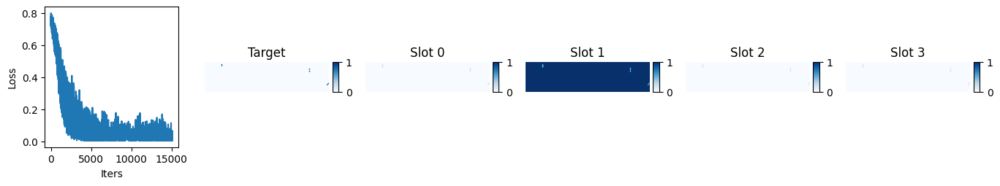

iter 15150 , loss 0.043399263 , lr 0.0002057659392831318


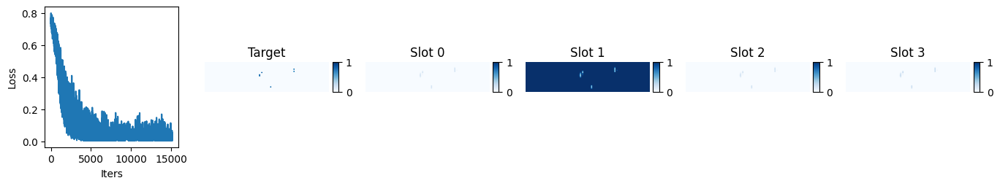

iter 15200 , loss 0.0048315995 , lr 0.00020521868290270166


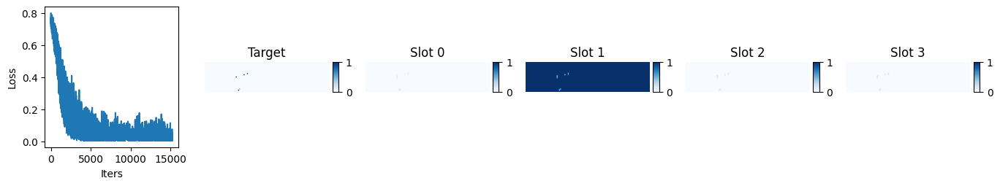

iter 15250 , loss 0.0044421125 , lr 0.0002046705749818724


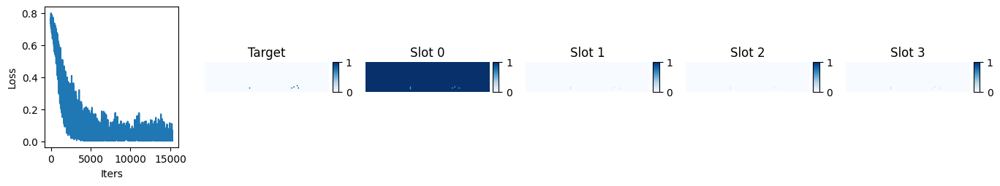

iter 15300 , loss 0.006463649 , lr 0.00020412162397314627


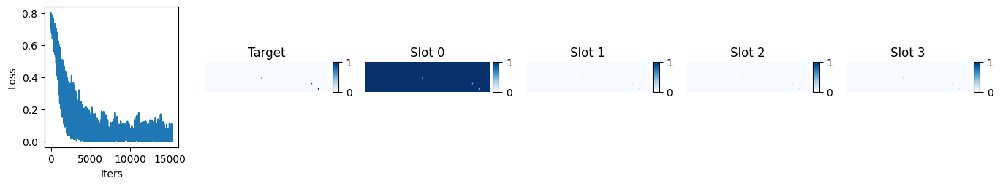

iter 15350 , loss 0.0060681454 , lr 0.00020357183834202681


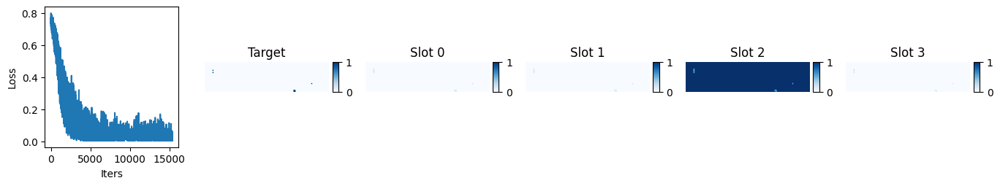

iter 15400 , loss 0.0053656697 , lr 0.00020302122656688858


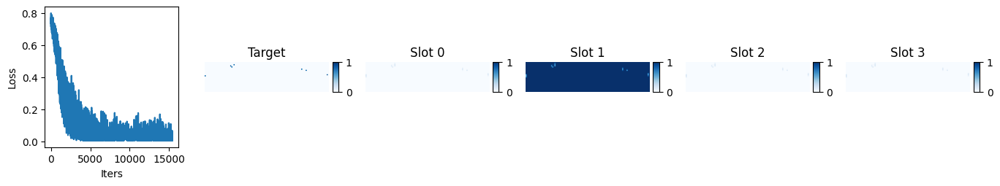

iter 15450 , loss 0.0077949716 , lr 0.0002024697971388463


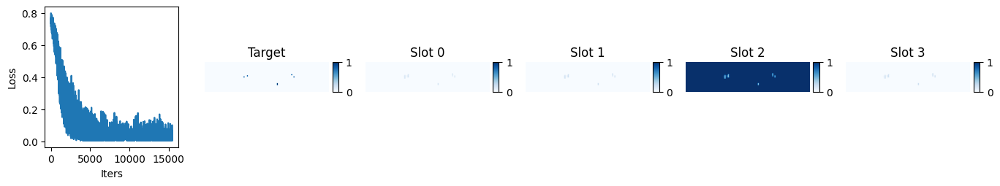

iter 15500 , loss 0.007898142 , lr 0.00020191755856162393


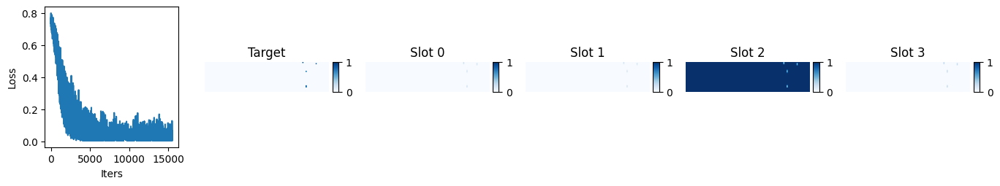

iter 15550 , loss 0.008197821 , lr 0.00020136451935142349


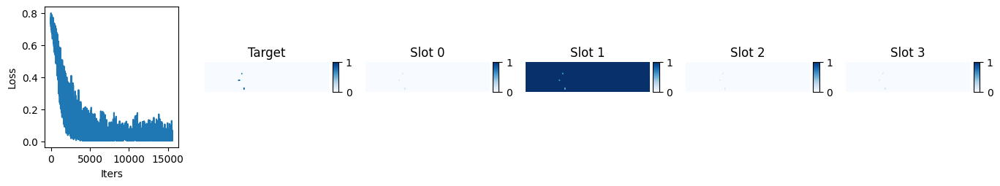

iter 15600 , loss 0.06860783 , lr 0.00020081068803679366


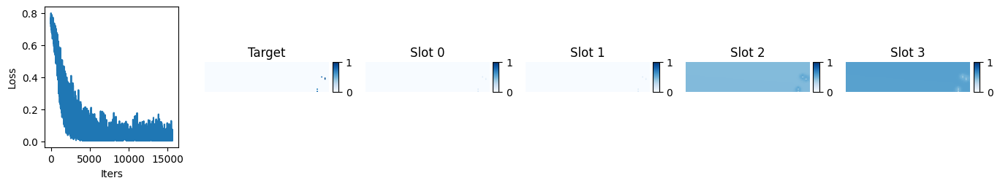

iter 15650 , loss 0.005071271 , lr 0.00020025607315849858


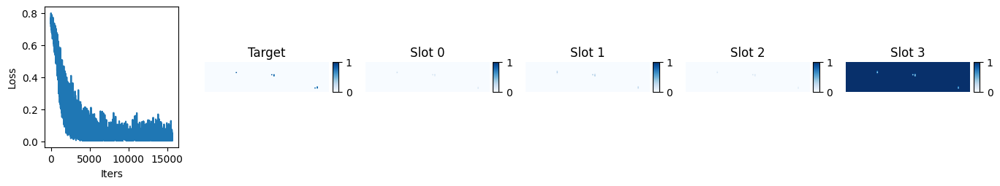

iter 15700 , loss 0.0042987065 , lr 0.00019970068326938565


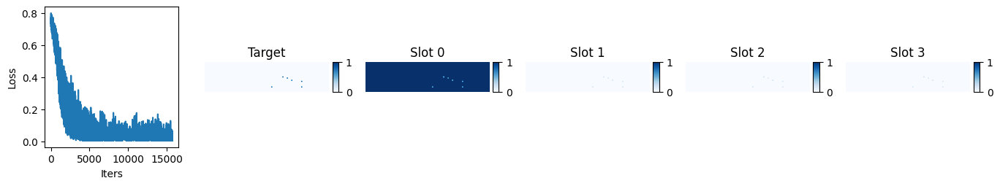

iter 15750 , loss 0.012069902 , lr 0.00019914452693425402


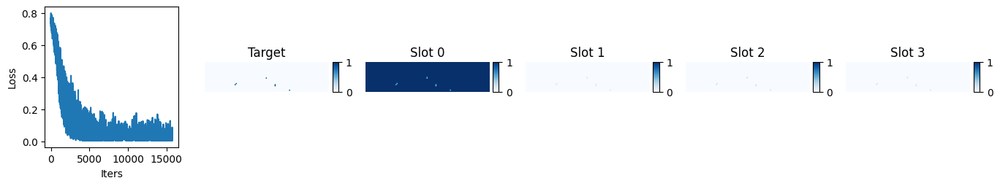

iter 15800 , loss 0.0041780467 , lr 0.0001985876127297224


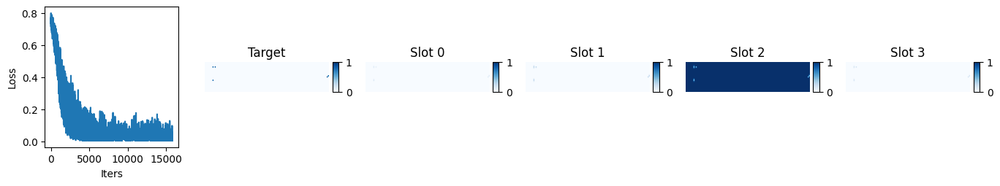

iter 15850 , loss 0.0046047745 , lr 0.00019802994924409675


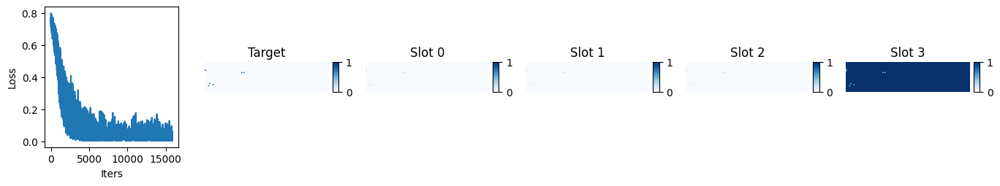

iter 15900 , loss 0.0051833 , lr 0.0001974715450772379


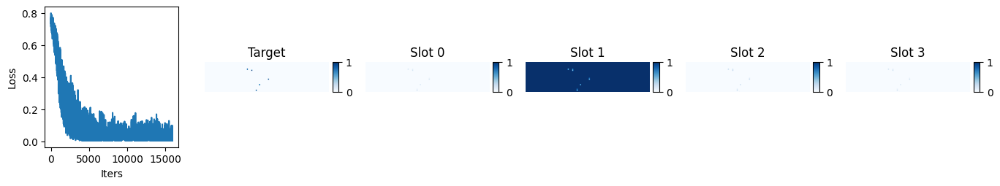

iter 15950 , loss 0.009152642 , lr 0.00019691240884042887


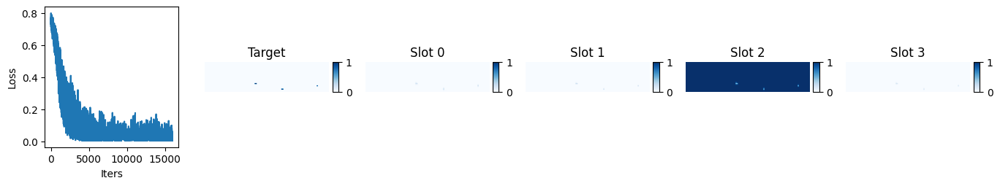

iter 16000 , loss 0.00461903 , lr 0.0001963525491562421


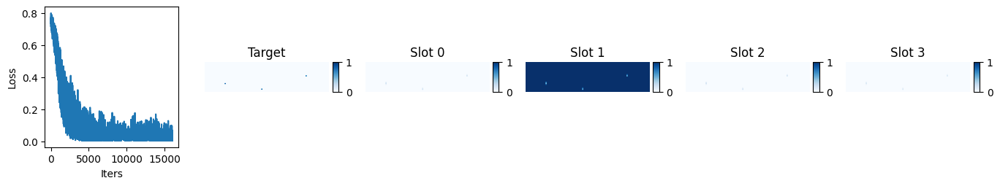

iter 16050 , loss 0.004580751 , lr 0.00019579197465840654


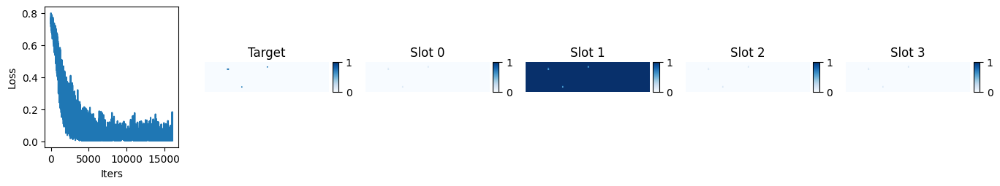

iter 16100 , loss 0.0040463647 , lr 0.00019523069399167436


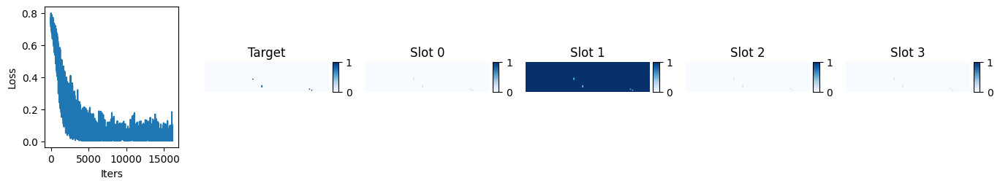

iter 16150 , loss 0.016693152 , lr 0.0001946687158116878


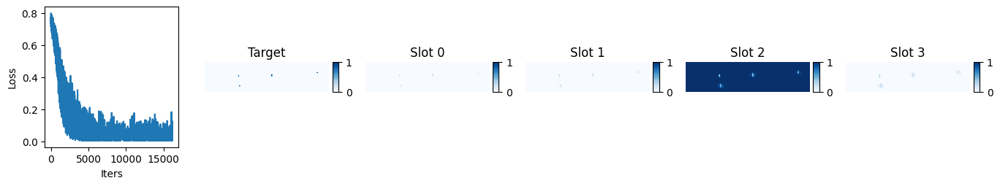

iter 16200 , loss 0.053942047 , lr 0.0001941060487848456


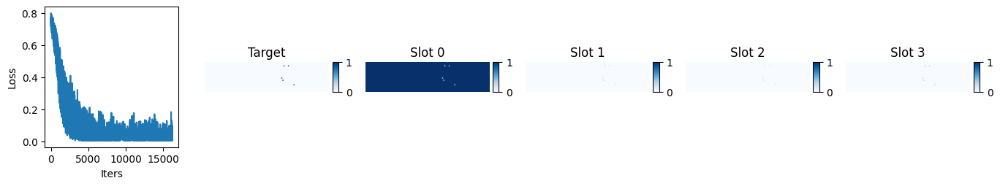

iter 16250 , loss 0.087024905 , lr 0.0001935427015881693


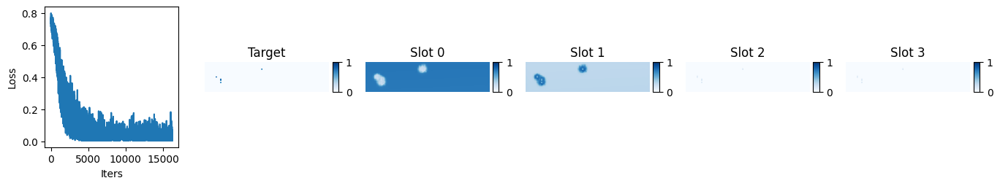

iter 16300 , loss 0.019740792 , lr 0.0001929786829091697


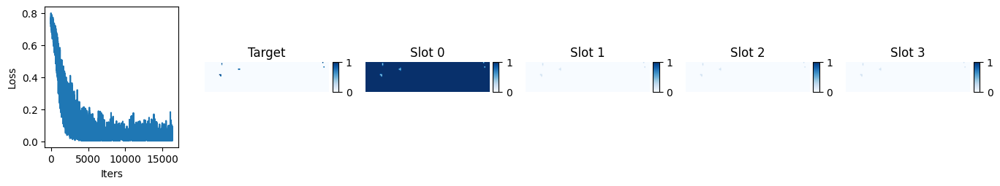

iter 16350 , loss 0.004744882 , lr 0.0001924140014457125


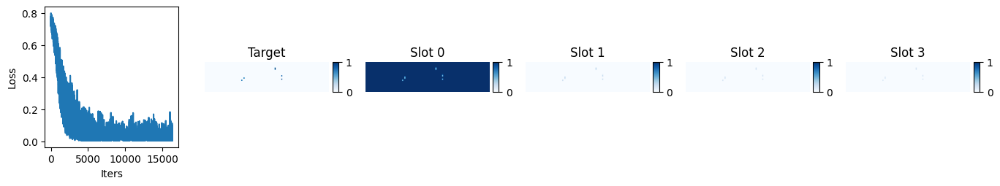

iter 16400 , loss 0.0059743403 , lr 0.00019184866590588439


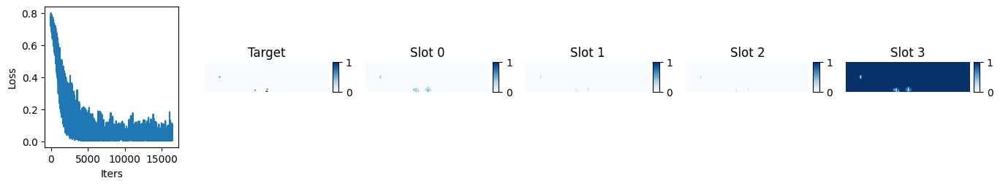

iter 16450 , loss 0.0068729455 , lr 0.0001912826850078587


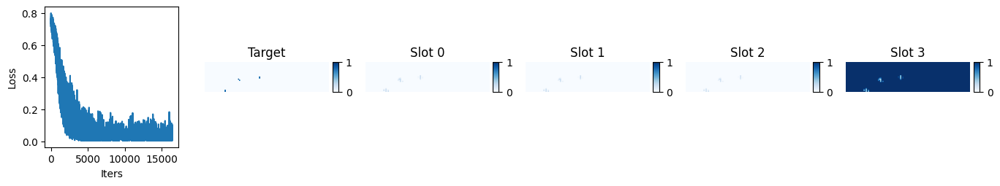

iter 16500 , loss 0.06341109 , lr 0.00019071606747976113


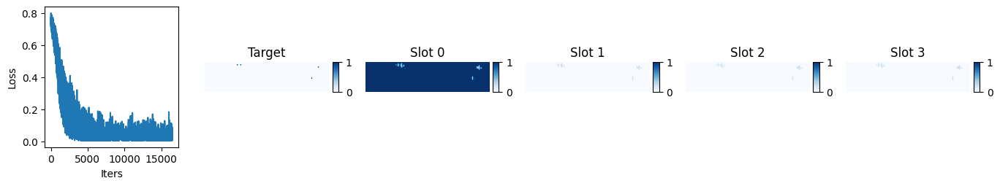

iter 16550 , loss 0.011745902 , lr 0.00019014882205953485


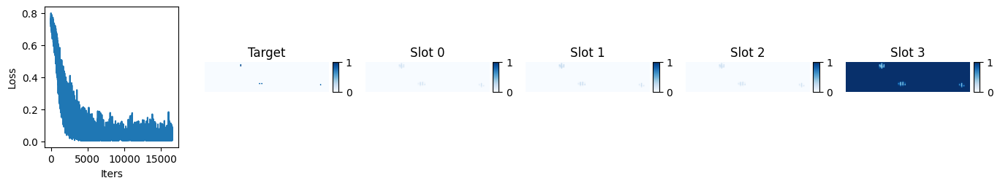

iter 16600 , loss 0.022193994 , lr 0.00018958095749480592


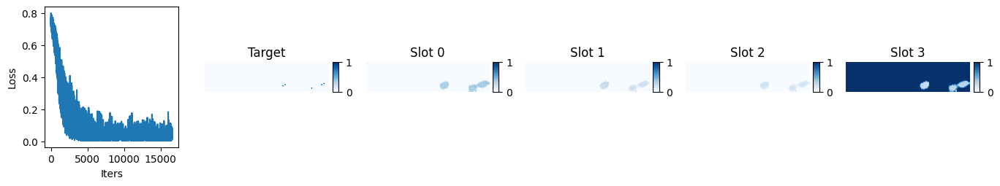

iter 16650 , loss 0.019963231 , lr 0.0001890124825427485


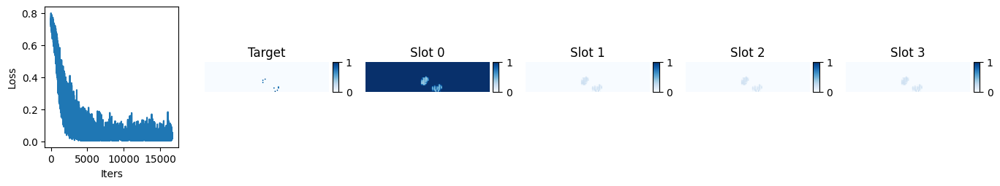

iter 16700 , loss 0.015062369 , lr 0.00018844340596994947


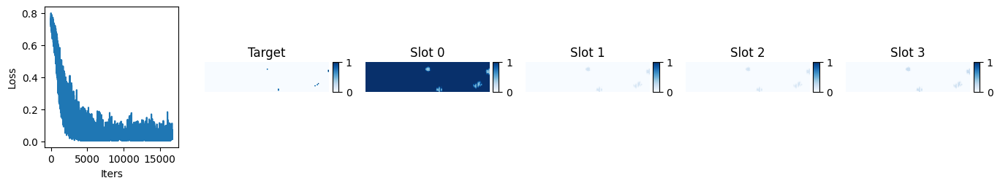

iter 16750 , loss 0.008888501 , lr 0.00018787373655227368


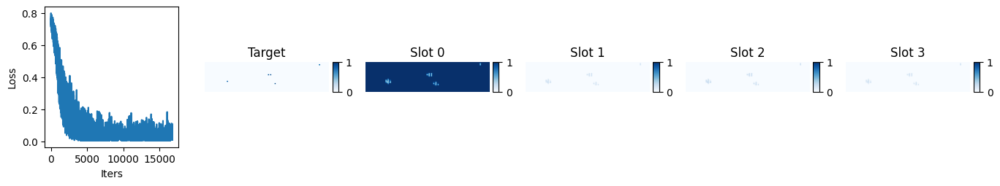

iter 16800 , loss 0.016345646 , lr 0.0001873034830747282


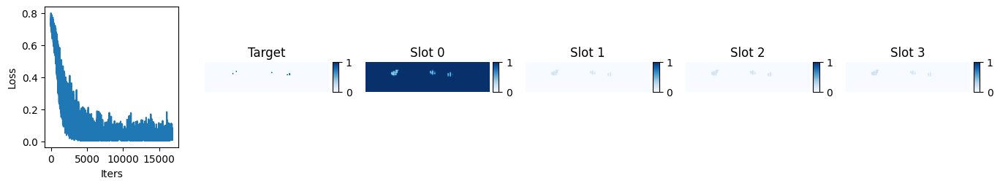

iter 16850 , loss 0.011605673 , lr 0.00018673265433132713


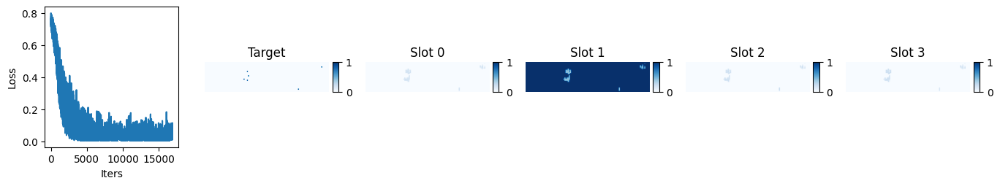

iter 16900 , loss 0.11185353 , lr 0.0001861612591249558


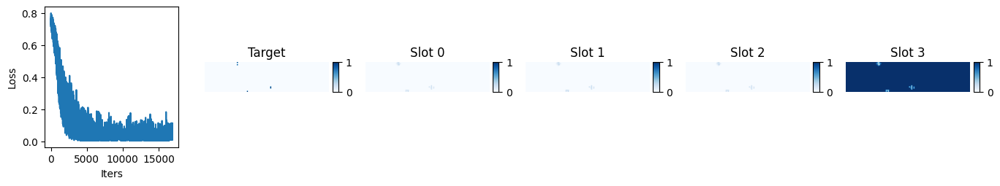

iter 16950 , loss 0.040890668 , lr 0.00018558930626723515


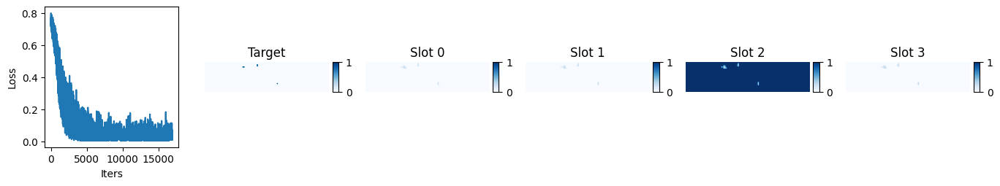

iter 17000 , loss 0.011426083 , lr 0.0001850168045783858


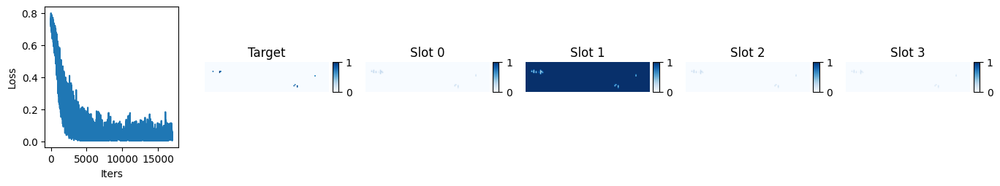

iter 17050 , loss 0.006158816 , lr 0.000184443762887092


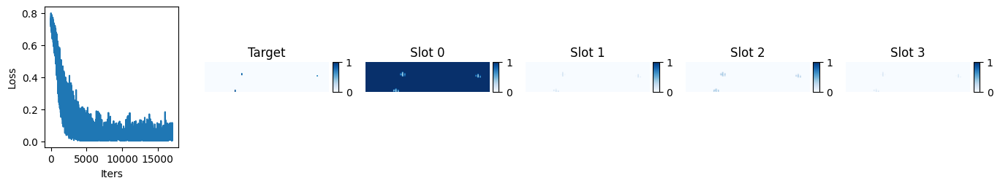

iter 17100 , loss 0.006902373 , lr 0.00018387019003036556


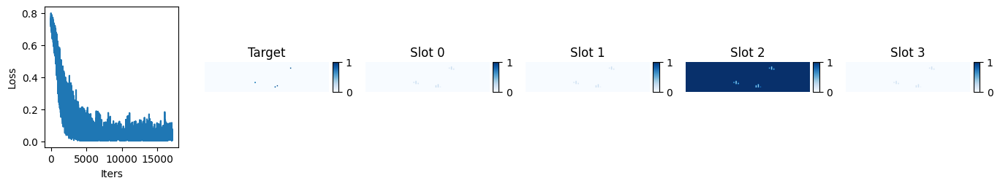

iter 17150 , loss 0.009993877 , lr 0.0001832960948534094


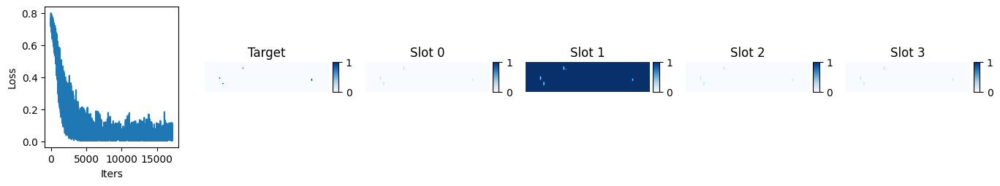

iter 17200 , loss 0.010650559 , lr 0.0001827214862094814


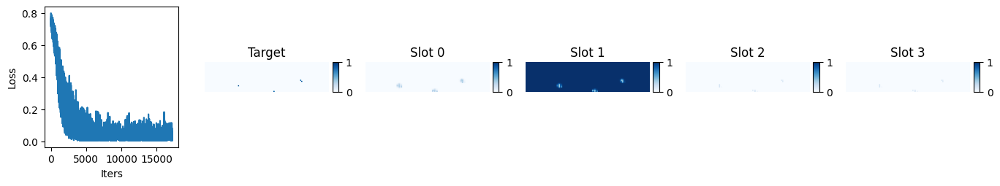

iter 17250 , loss 0.0049394276 , lr 0.00018214637295975761


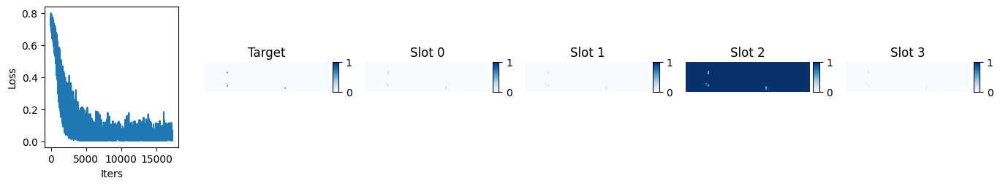

iter 17300 , loss 0.006107642 , lr 0.0001815707639731959


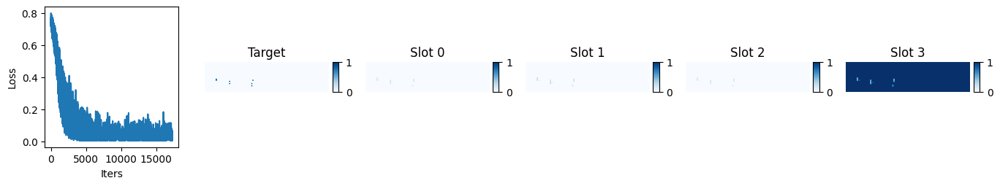

iter 17350 , loss 0.043592166 , lr 0.0001809946681263987


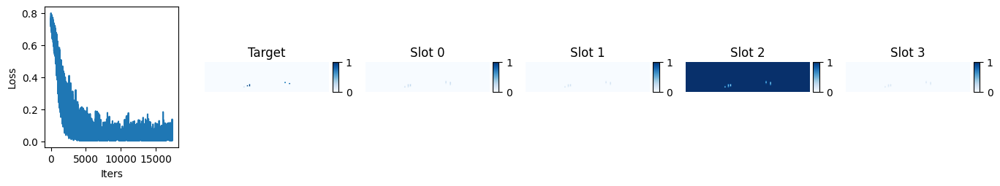

iter 17400 , loss 0.07044892 , lr 0.00018041809430347684


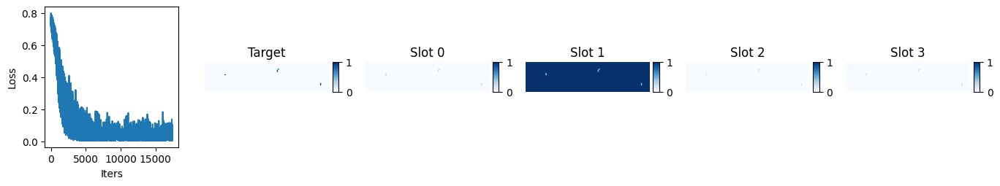

iter 17450 , loss 0.0057969354 , lr 0.00017984105139591186


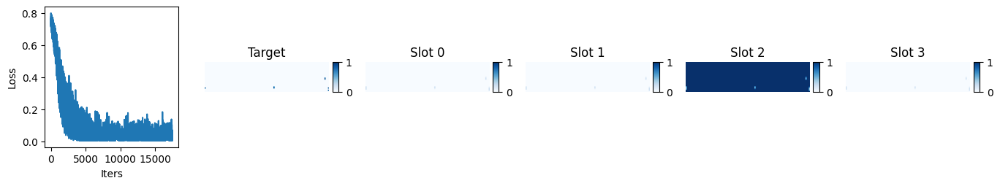

iter 17500 , loss 0.0046212375 , lr 0.00017926354830241924


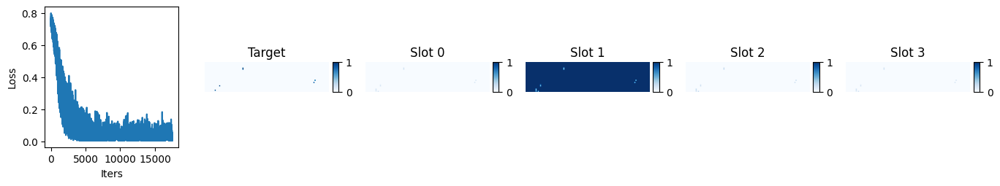

iter 17550 , loss 0.009214414 , lr 0.00017868559392881107


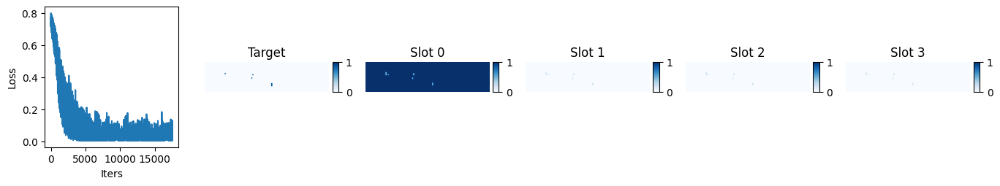

iter 17600 , loss 0.00597891 , lr 0.0001781071971878587


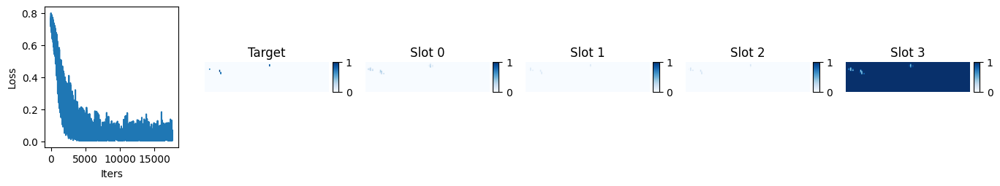

iter 17650 , loss 0.078128226 , lr 0.00017752836699915547


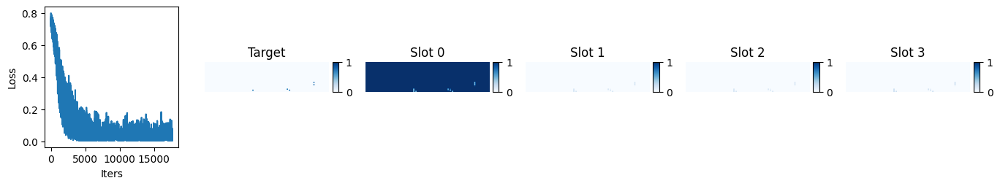

iter 17700 , loss 0.031307828 , lr 0.0001769491122889789


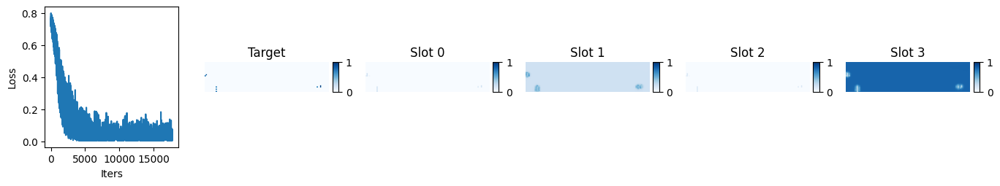

iter 17750 , loss 0.06665132 , lr 0.0001763694419901532


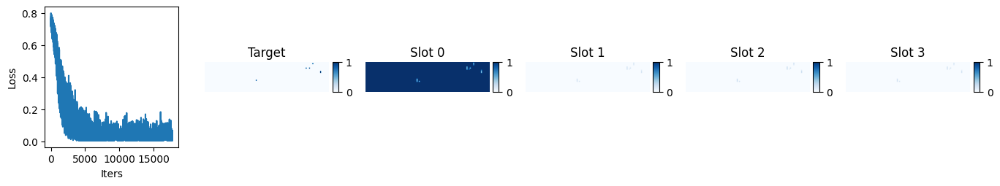

iter 17800 , loss 0.0069043553 , lr 0.0001757893650419114


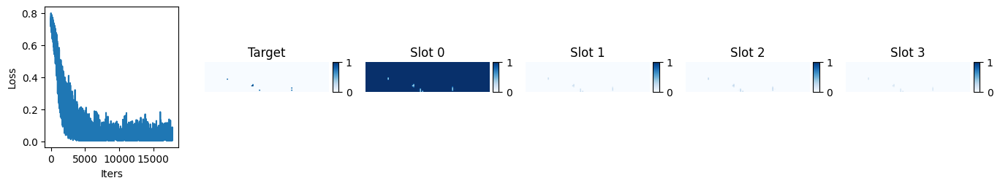

iter 17850 , loss 0.0127018895 , lr 0.00017520889038975774


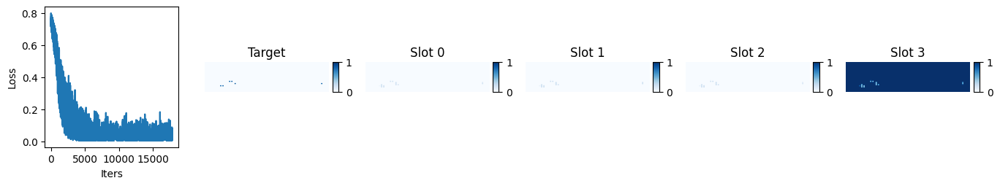

iter 17900 , loss 0.0070102117 , lr 0.00017462802698532944


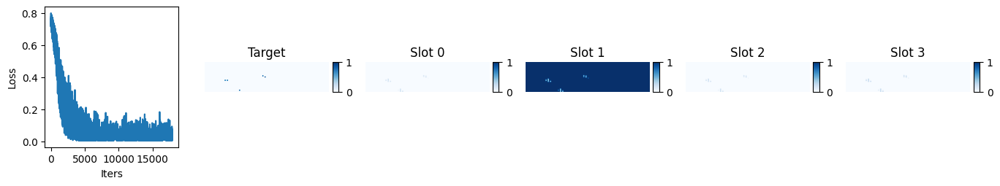

iter 17950 , loss 0.005136314 , lr 0.00017404678378625868


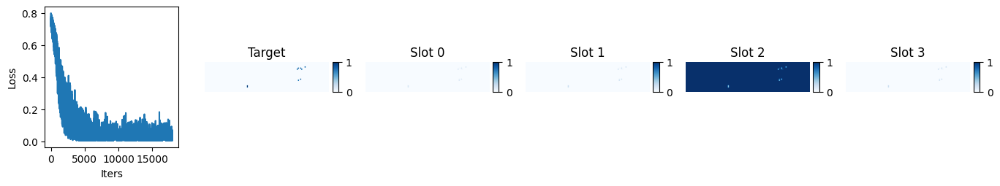

iter 18000 , loss 0.029730057 , lr 0.00017346516975603462


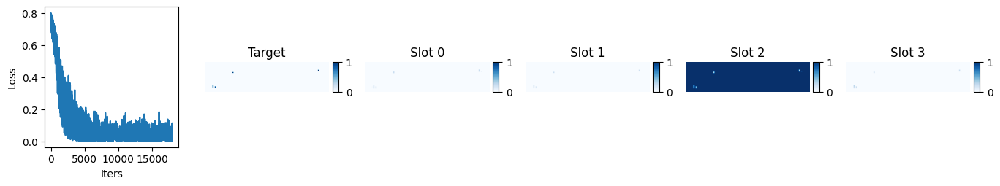

iter 18050 , loss 0.02183842 , lr 0.00017288319386386515


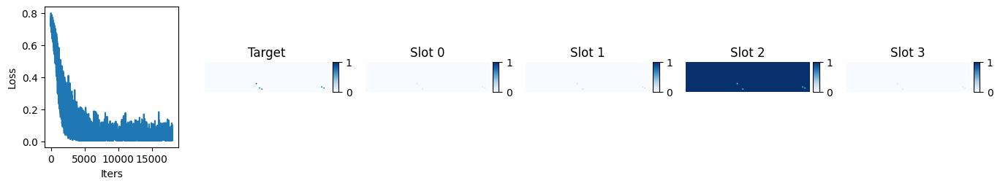

iter 18100 , loss 0.10055445 , lr 0.00017230086508453847


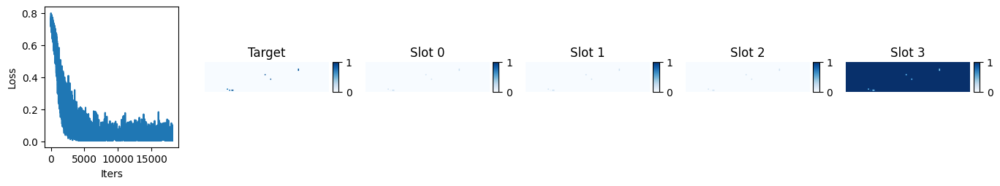

iter 18150 , loss 0.0050988393 , lr 0.00017171819239828465


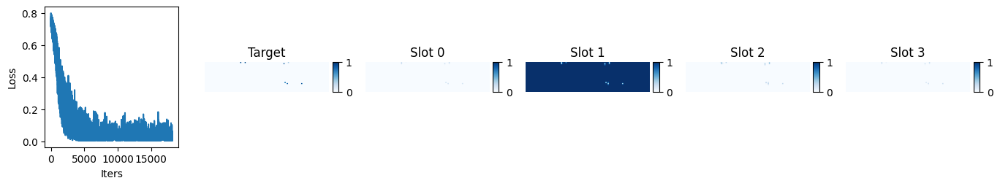

iter 18200 , loss 0.033006705 , lr 0.00017113518479063738


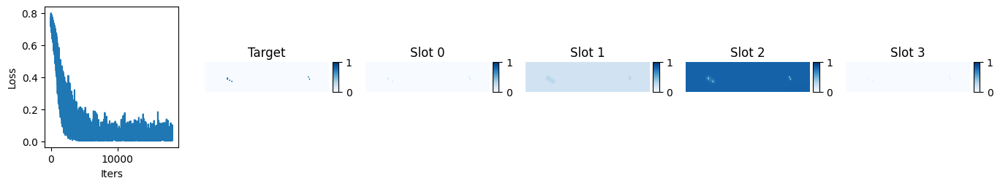

iter 18250 , loss 0.022189558 , lr 0.00017055185125229518


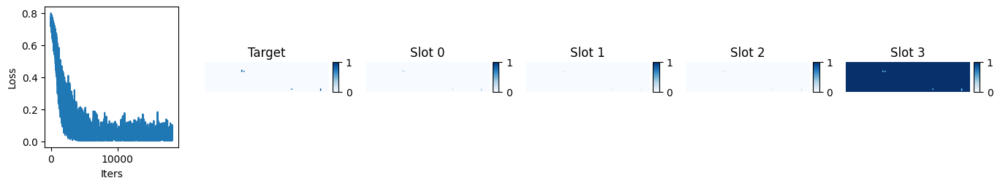

iter 18300 , loss 0.011591425 , lr 0.00016996820077898285


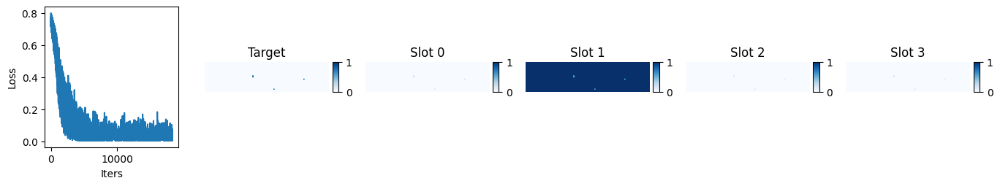

iter 18350 , loss 0.01055467 , lr 0.00016938424237131263


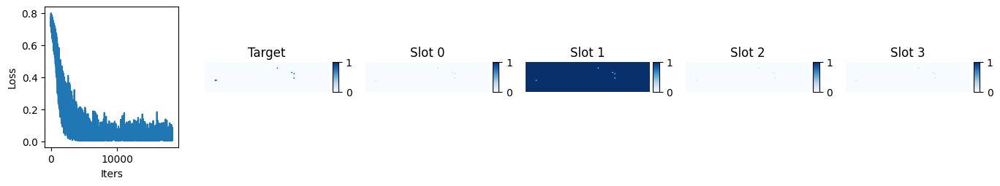

iter 18400 , loss 0.069320664 , lr 0.00016879998503464567


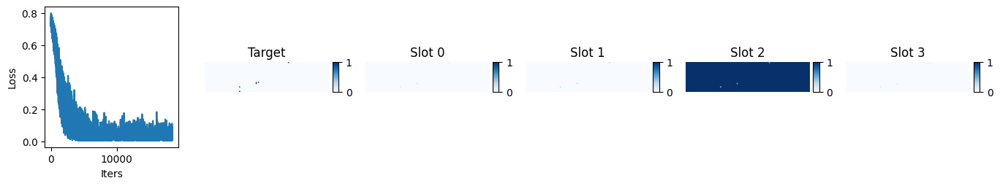

iter 18450 , loss 0.014613112 , lr 0.0001682154377789527


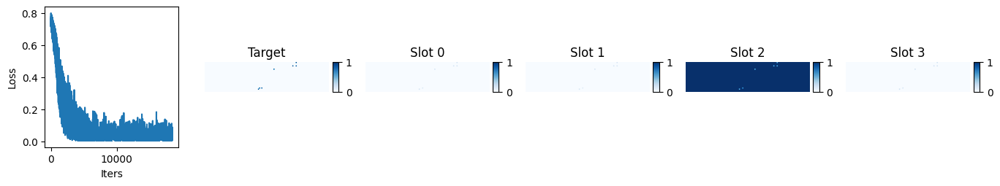

iter 18500 , loss 0.007616599 , lr 0.00016763060961867566


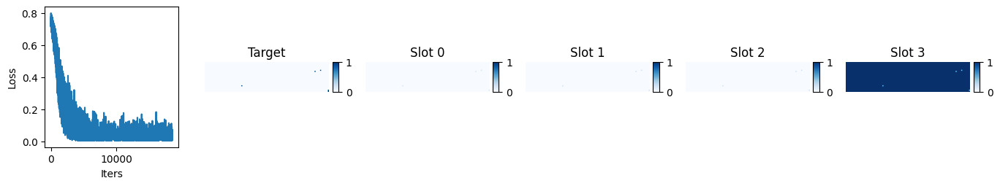

iter 18550 , loss 0.008081247 , lr 0.00016704550957258817


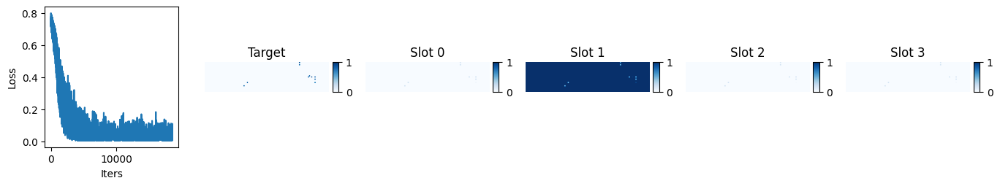

iter 18600 , loss 0.042578995 , lr 0.00016646014666365678


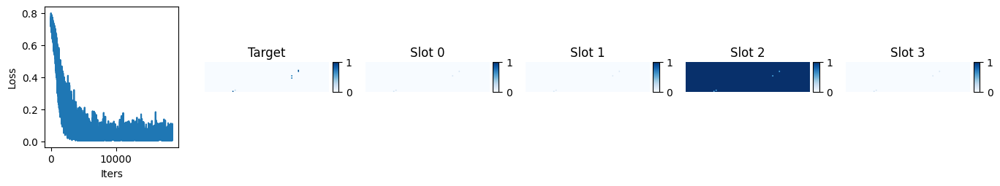

iter 18650 , loss 0.017240021 , lr 0.00016587452991890166


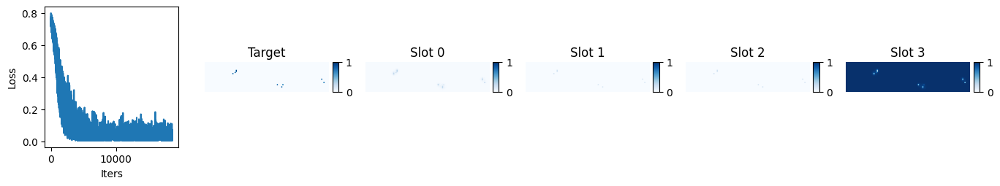

iter 18700 , loss 0.11032116 , lr 0.0001652886683692575


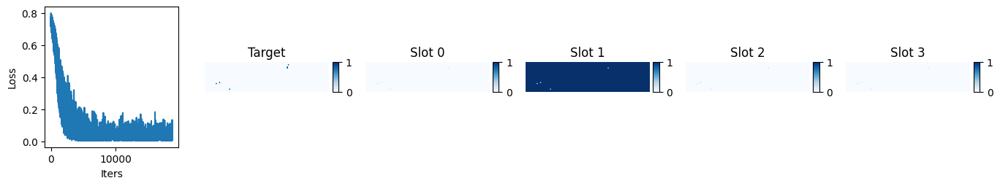

iter 18750 , loss 0.012353314 , lr 0.0001647025710494341


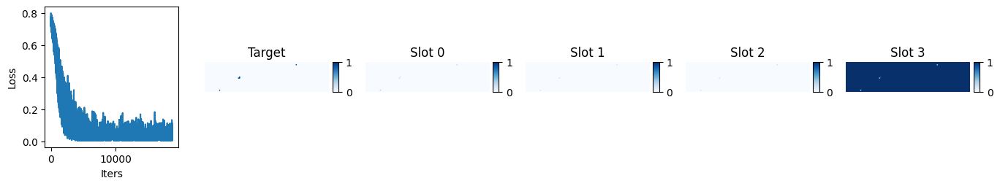

iter 18800 , loss 0.010335903 , lr 0.00016411624699777717


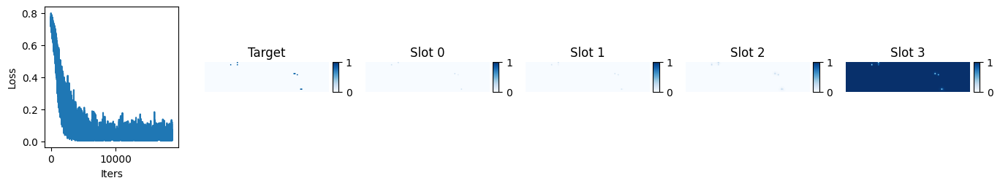

iter 18850 , loss 0.0044434075 , lr 0.00016352970525612885


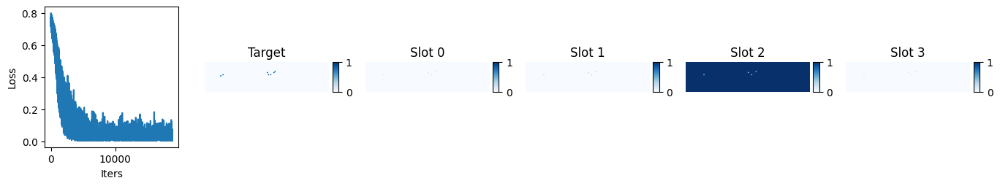

iter 18900 , loss 0.059771847 , lr 0.00016294295486968849


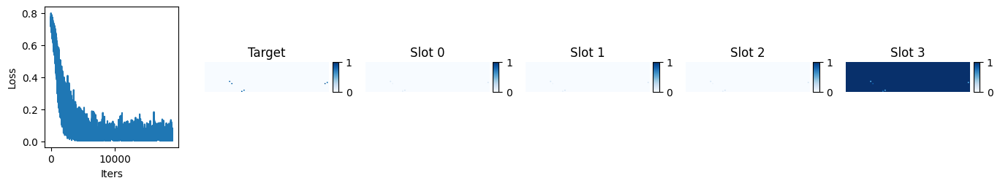

iter 18950 , loss 0.011821643 , lr 0.00016235600488687284


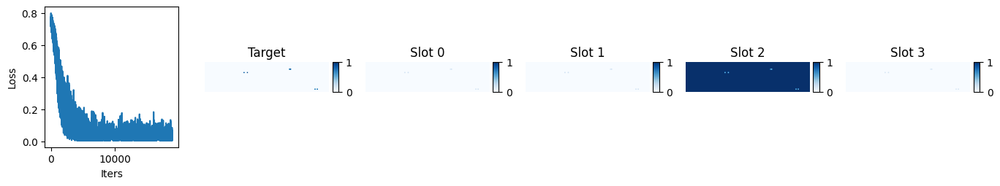

iter 19000 , loss 0.005141951 , lr 0.00016176886435917675


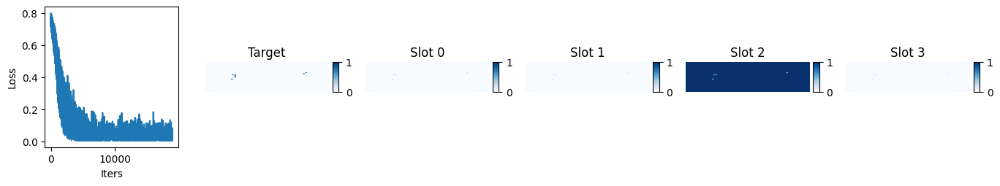

iter 19050 , loss 0.026793027 , lr 0.00016118154234103345


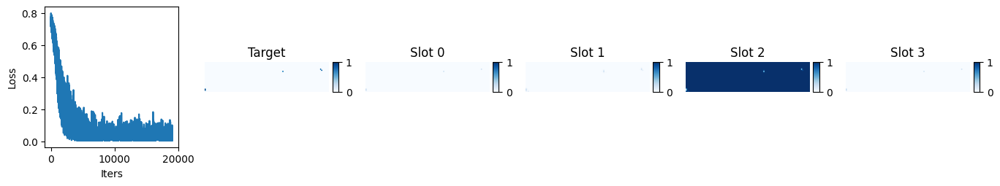

iter 19100 , loss 0.006873989 , lr 0.00016059404788967501


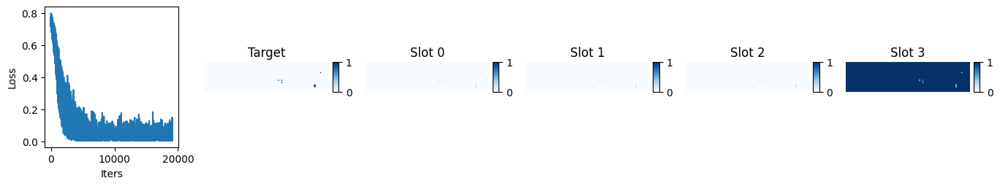

iter 19150 , loss 0.0777918 , lr 0.00016000639006499267


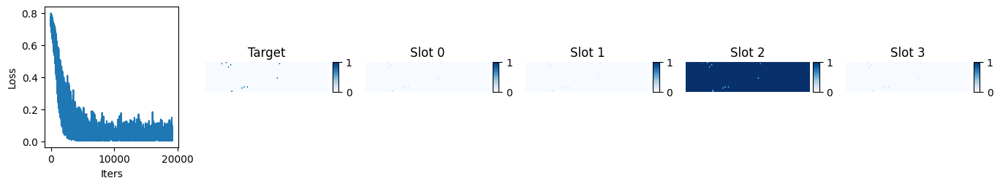

iter 19200 , loss 0.011374082 , lr 0.000159418577929397


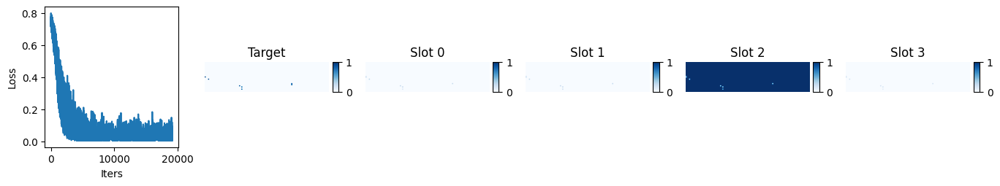

iter 19250 , loss 0.027067939 , lr 0.00015883062054767834


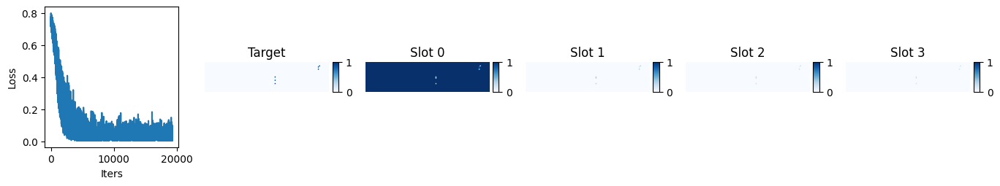

iter 19300 , loss 0.044920318 , lr 0.00015824252698686683


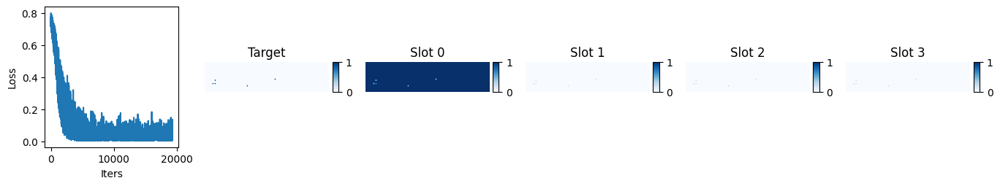

iter 19350 , loss 0.05102142 , lr 0.00015765430631609274


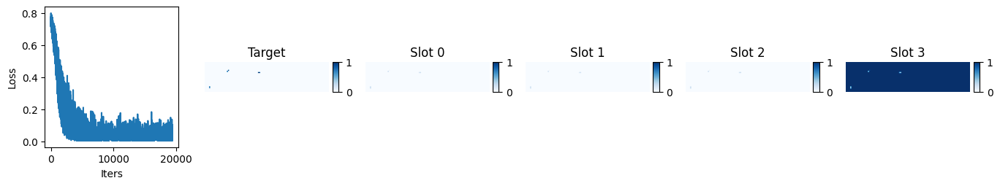

iter 19400 , loss 0.058122177 , lr 0.00015706596760644637


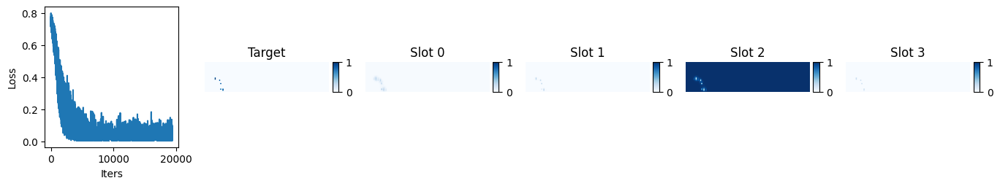

iter 19450 , loss 0.006464491 , lr 0.00015647751993083854


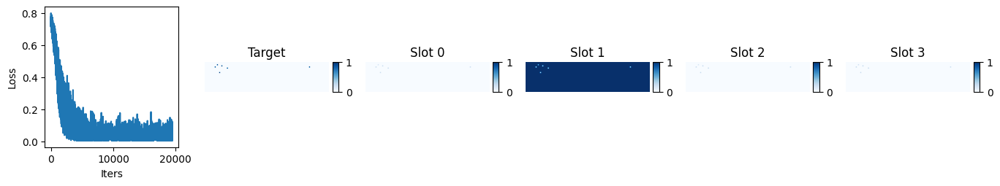

iter 19500 , loss 0.0044745556 , lr 0.0001558889723638603


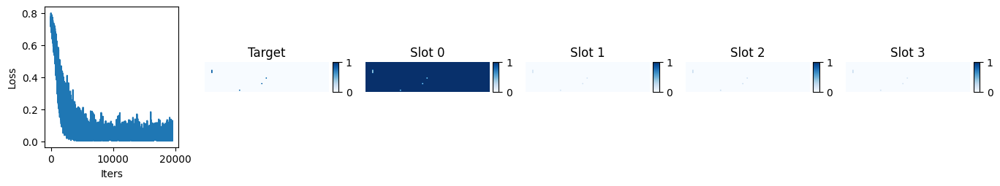

iter 19550 , loss 0.0054470184 , lr 0.00015530033398164318


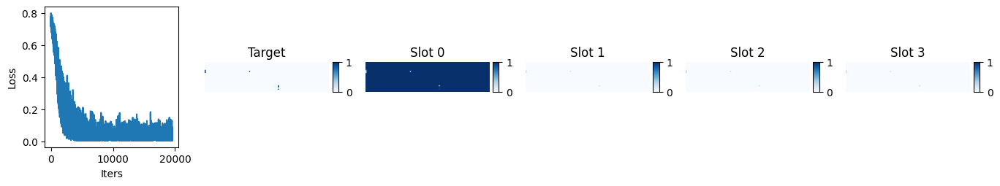

iter 19600 , loss 0.07491237 , lr 0.00015471161386171922


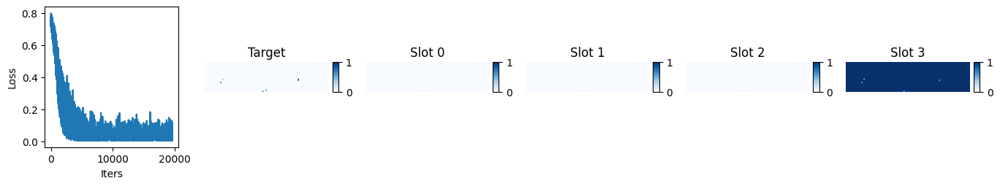

iter 19650 , loss 0.022110041 , lr 0.00015412282108288102


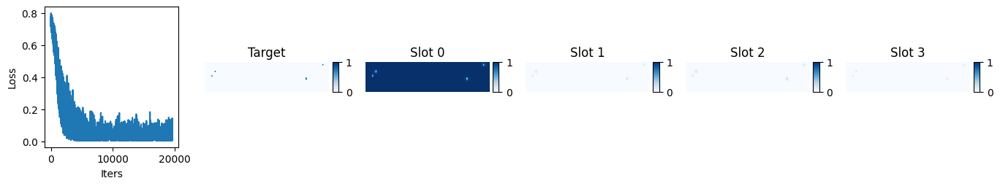

iter 19700 , loss 0.00936703 , lr 0.00015353396472504155


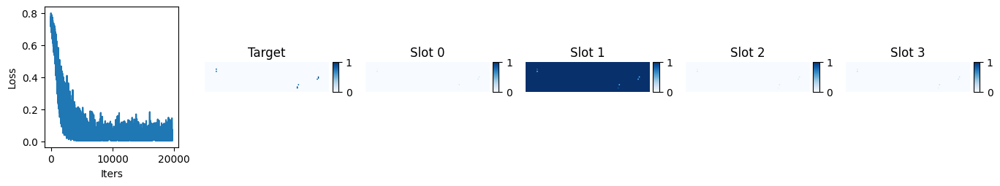

iter 19750 , loss 0.05459979 , lr 0.00015294505386909422


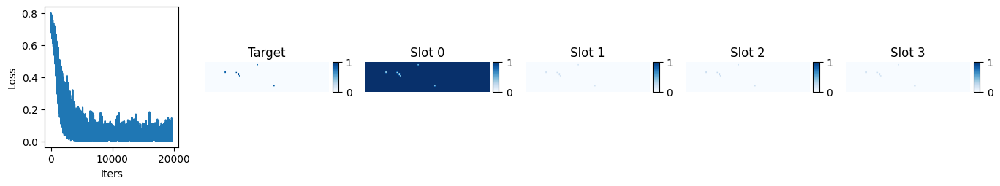

iter 19800 , loss 0.009148081 , lr 0.0001523560975967731


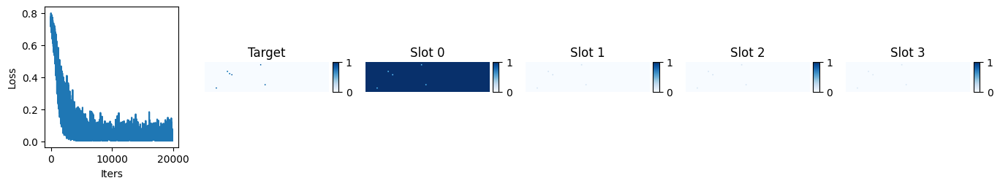

iter 19850 , loss 0.0042357272 , lr 0.00015176710499051235


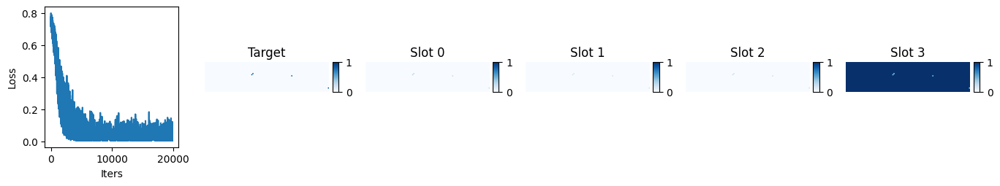

iter 19900 , loss 0.0063957255 , lr 0.00015117808513330668


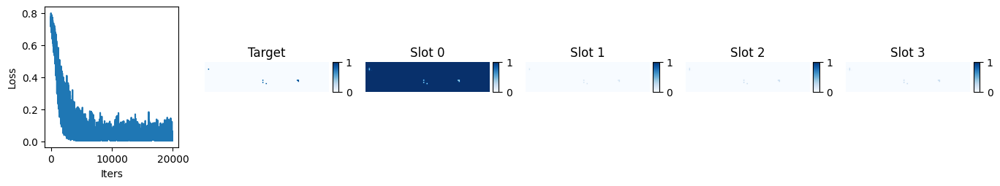

iter 19950 , loss 0.007107717 , lr 0.0001505890471085709


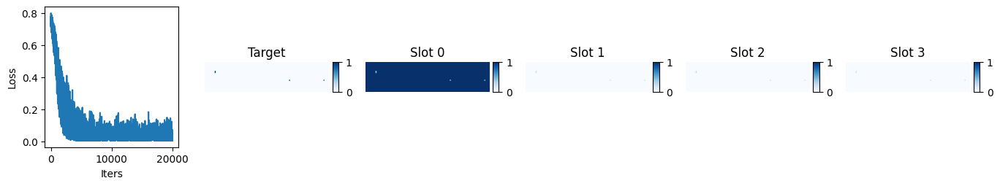

iter 20000 , loss 0.03293592 , lr 0.00015


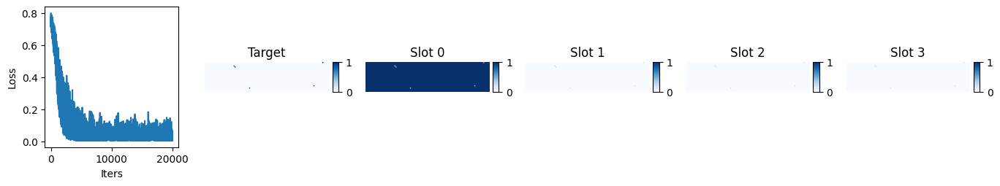

iter 20050 , loss 0.0045513185 , lr 0.0001494109528914291


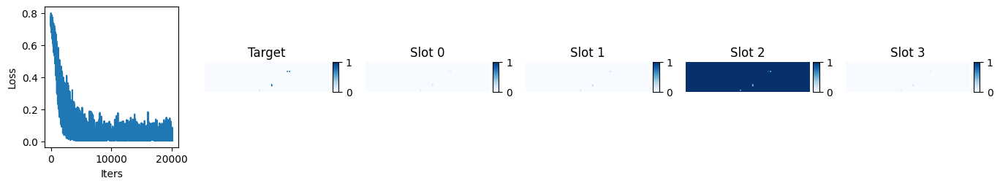

iter 20100 , loss 0.0054467362 , lr 0.0001488219148666933


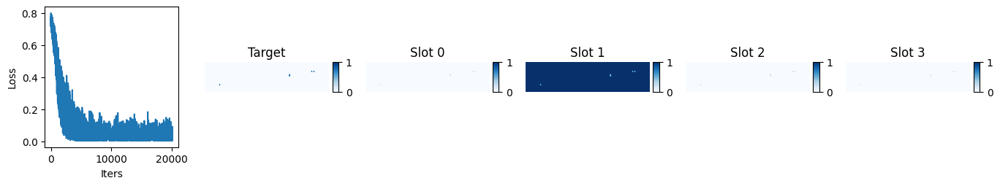

iter 20150 , loss 0.00576887 , lr 0.00014823289500948762


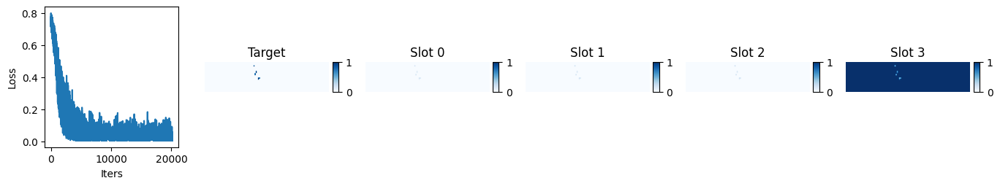

iter 20200 , loss 0.004795271 , lr 0.0001476439024032269


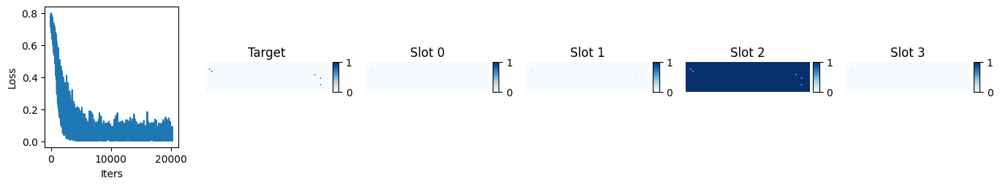

iter 20250 , loss 0.0048441845 , lr 0.00014705494613090572


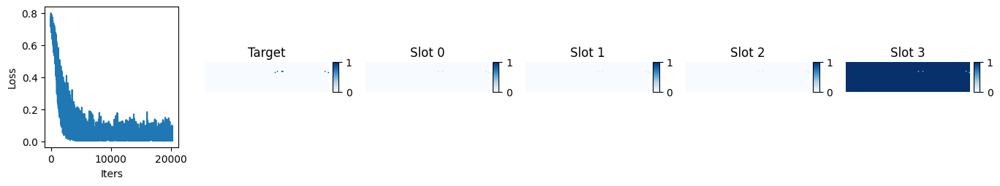

iter 20300 , loss 0.008139994 , lr 0.00014646603527495848


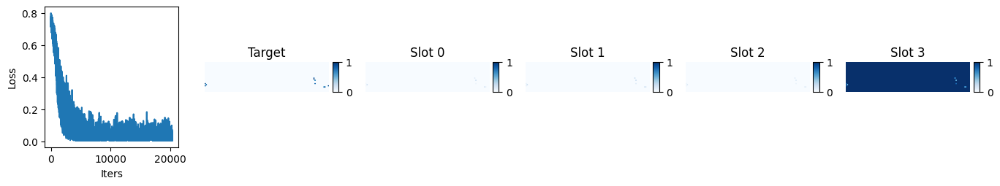

iter 20350 , loss 0.007893728 , lr 0.000145877178917119


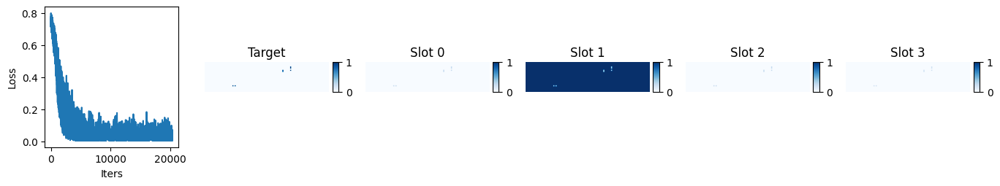

iter 20400 , loss 0.003723524 , lr 0.00014528838613828076


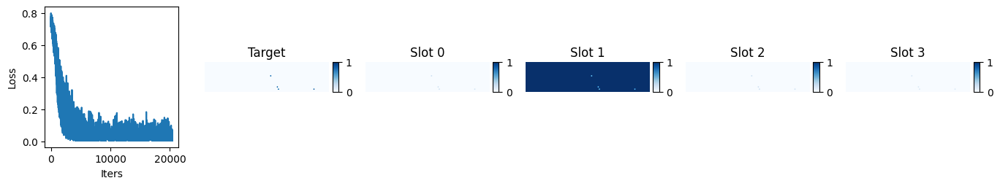

iter 20450 , loss 0.0053030085 , lr 0.00014469966601835682


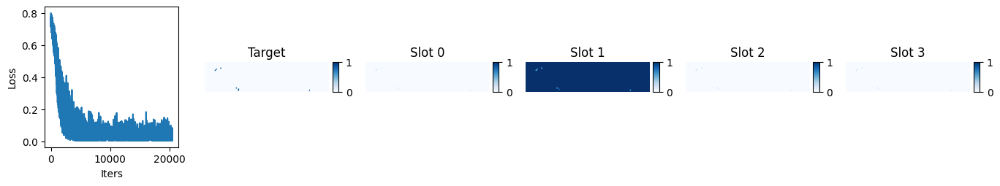

iter 20500 , loss 0.0035801795 , lr 0.0001441110276361397


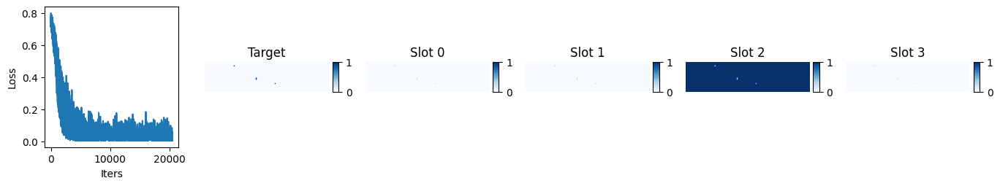

iter 20550 , loss 0.01467378 , lr 0.00014352248006916147


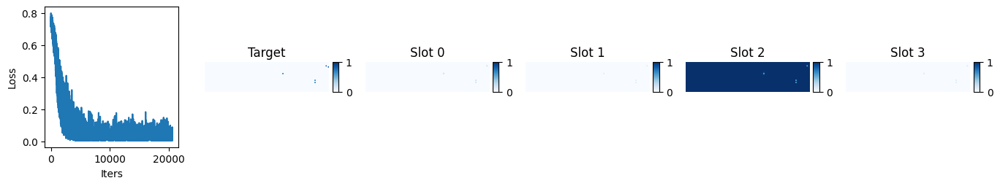

iter 20600 , loss 0.0058516064 , lr 0.00014293403239355358


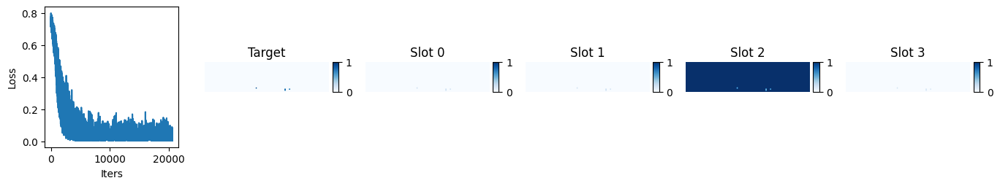

iter 20650 , loss 0.0039624902 , lr 0.00014234569368390727


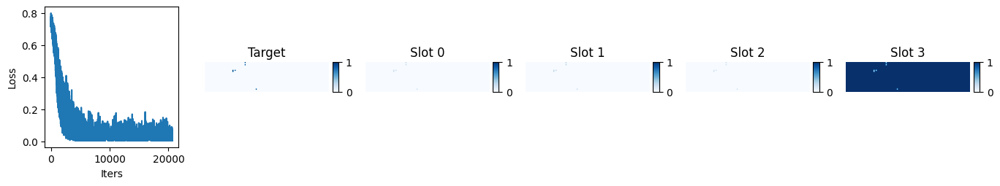

iter 20700 , loss 0.050275687 , lr 0.00014175747301313314


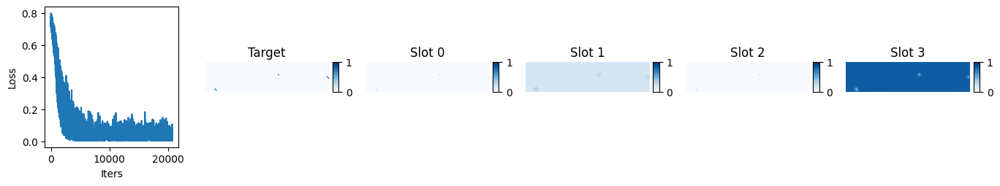

iter 20750 , loss 0.011434857 , lr 0.00014116937945232166


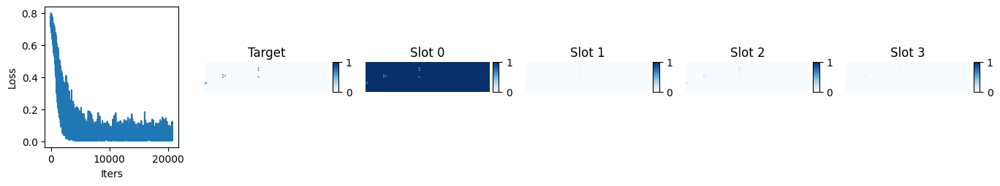

iter 20800 , loss 0.02799011 , lr 0.00014058142207060302


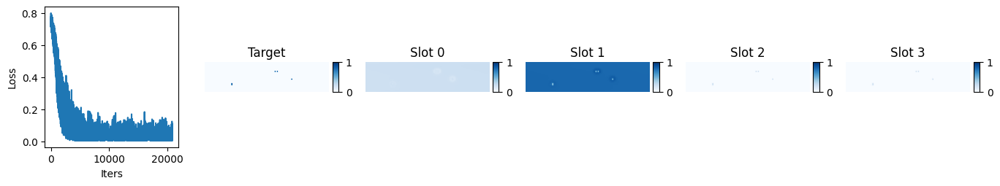

iter 20850 , loss 0.12752686 , lr 0.00013999360993500735


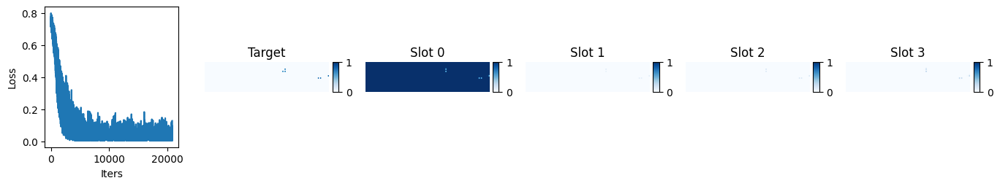

iter 20900 , loss 0.030971227 , lr 0.00013940595211032499


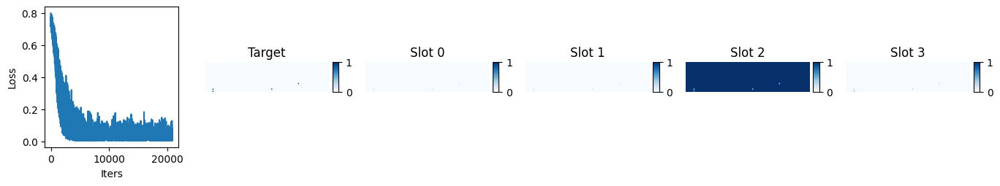

iter 20950 , loss 0.0049787513 , lr 0.00013881845765896652


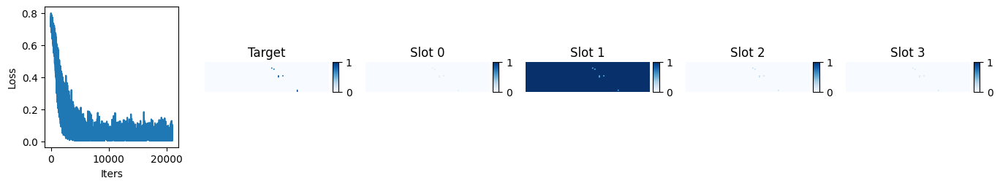

iter 21000 , loss 0.028296912 , lr 0.00013823113564082325


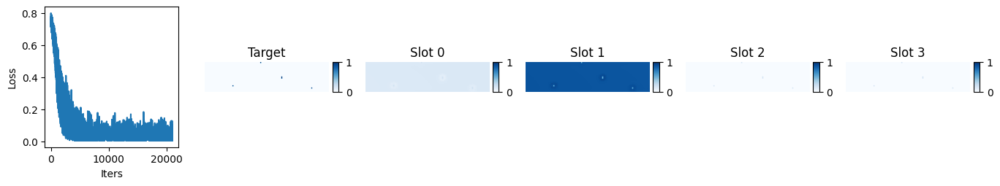

iter 21050 , loss 0.005634228 , lr 0.00013764399511312716


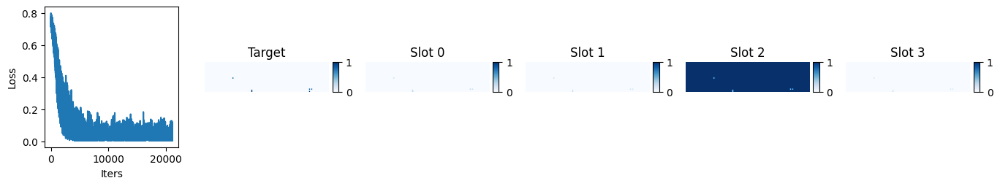

iter 21100 , loss 0.003987028 , lr 0.0001370570451303115


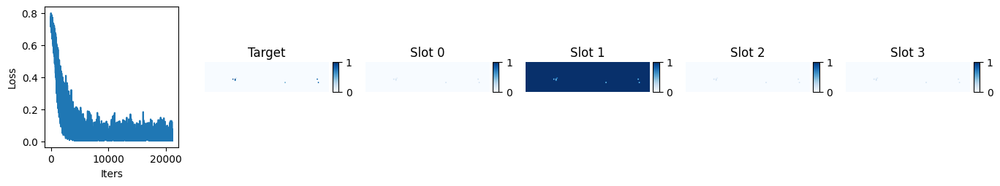

iter 21150 , loss 0.004357531 , lr 0.00013647029474387113


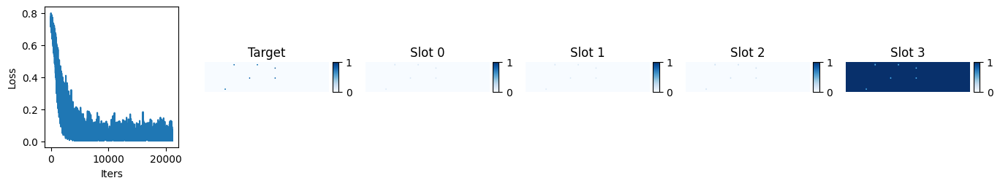

iter 21200 , loss 0.0041765706 , lr 0.00013588375300222283


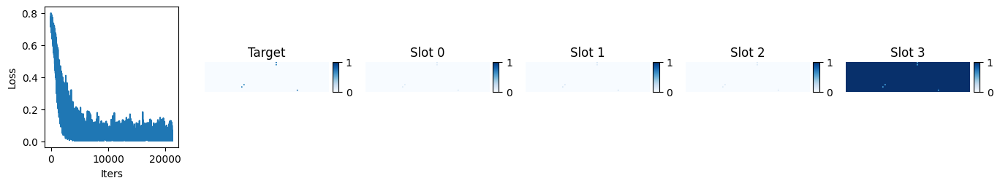

iter 21250 , loss 0.004856125 , lr 0.00013529742895056592


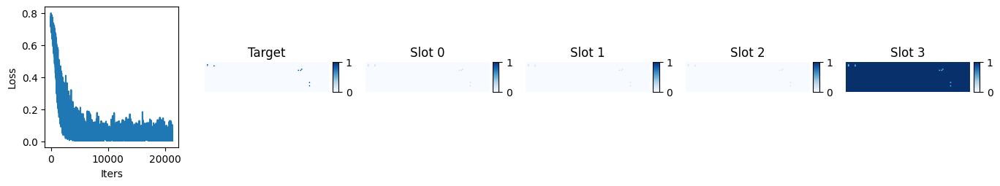

iter 21300 , loss 0.08938359 , lr 0.00013471133163074248


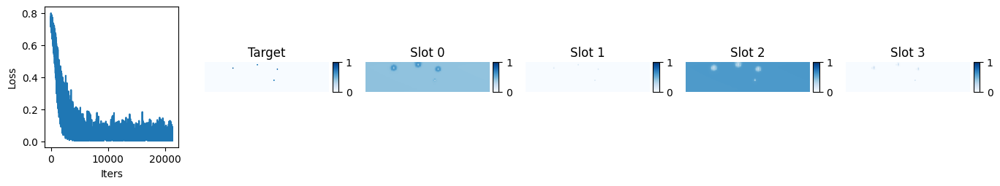

iter 21350 , loss 0.0071562477 , lr 0.00013412547008109834


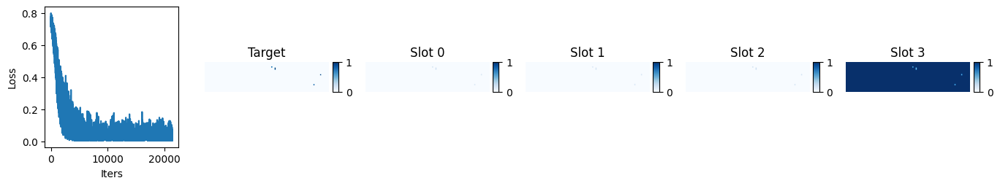

iter 21400 , loss 0.055620093 , lr 0.0001335398533363432


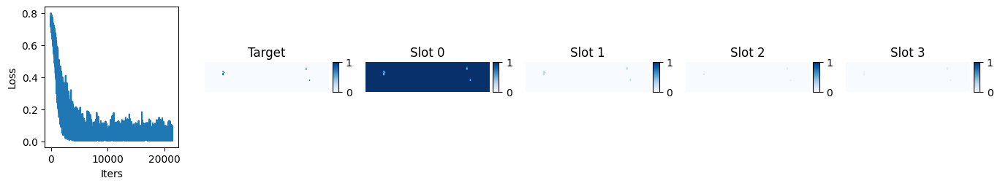

iter 21450 , loss 0.009432601 , lr 0.00013295449042741183


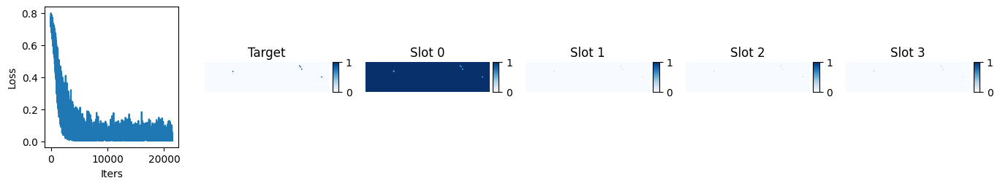

iter 21500 , loss 0.017833406 , lr 0.0001323693903813244


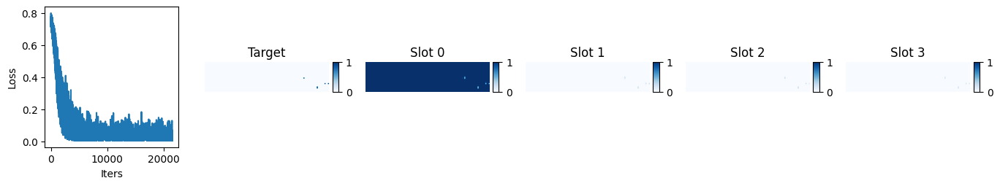

iter 21550 , loss 0.0296907 , lr 0.0001317845622210473


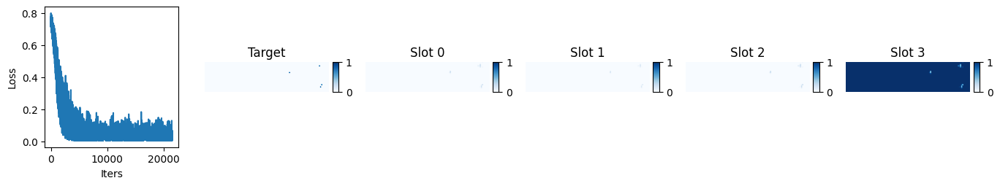

iter 21600 , loss 0.00808047 , lr 0.00013120001496535433


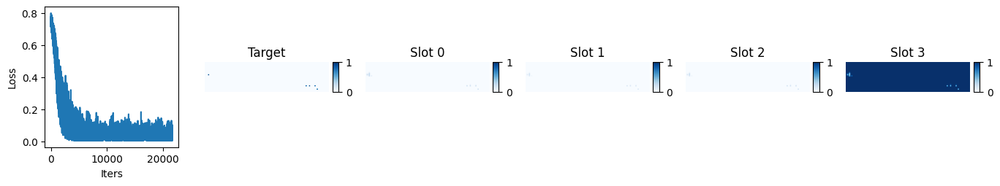

iter 21650 , loss 0.015621448 , lr 0.00013061575762868738


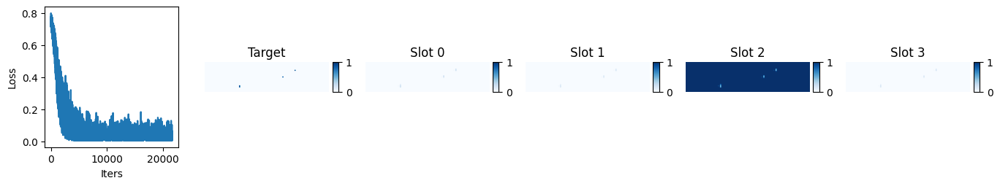

iter 21700 , loss 0.005846605 , lr 0.00013003179922101713


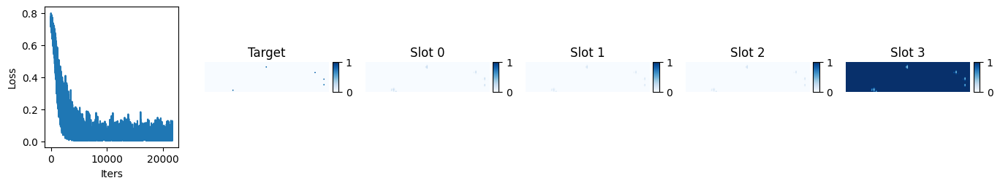

iter 21750 , loss 0.07157747 , lr 0.0001294481487477048


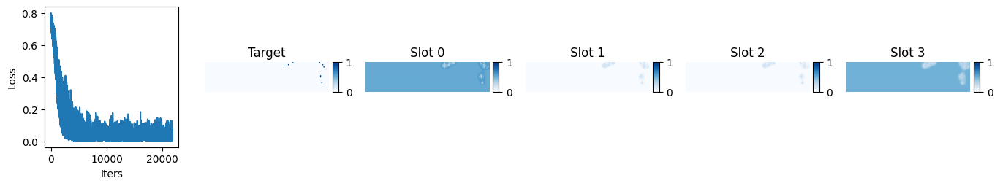

iter 21800 , loss 0.008316357 , lr 0.0001288648152093626


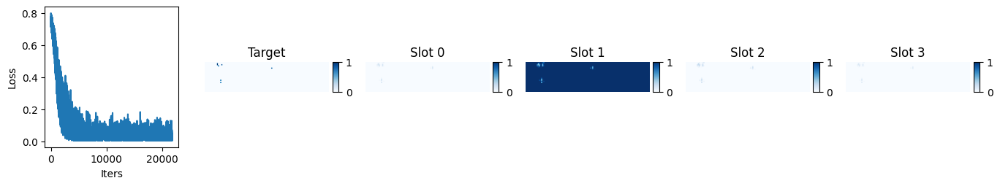

iter 21850 , loss 0.01054163 , lr 0.00012828180760171532


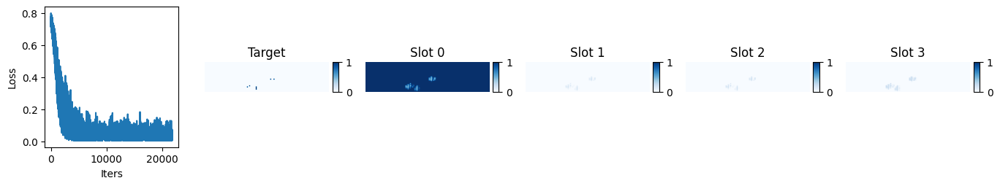

iter 21900 , loss 0.05164487 , lr 0.00012769913491546159


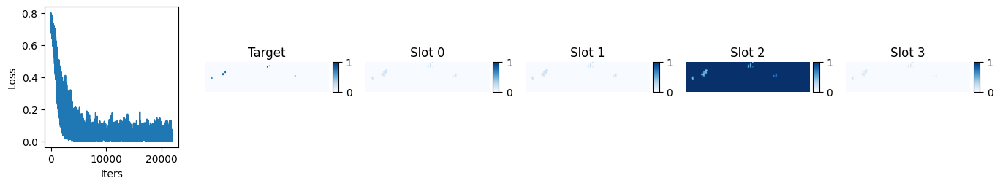

iter 21950 , loss 0.009471067 , lr 0.00012711680613613482


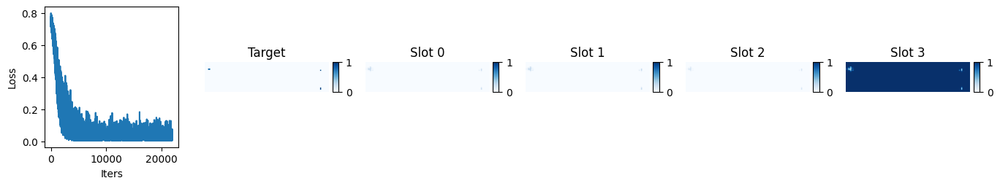

iter 22000 , loss 0.012622527 , lr 0.0001265348302439654


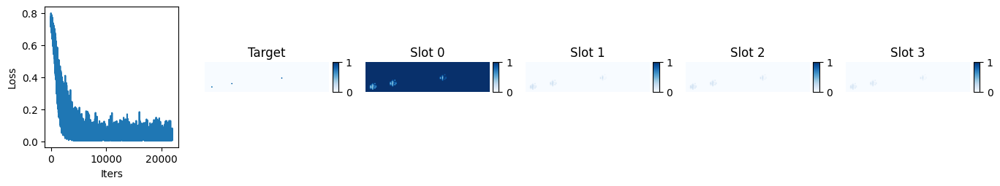

iter 22050 , loss 0.015070738 , lr 0.00012595321621374135


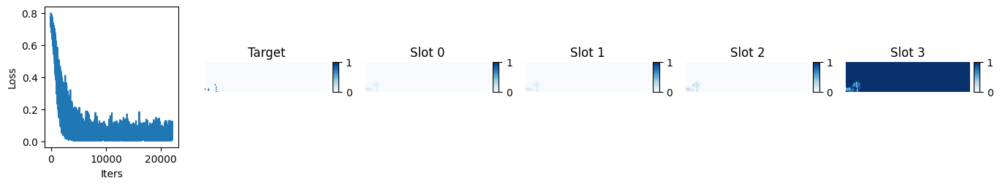

iter 22100 , loss 0.0057129576 , lr 0.00012537197301467053


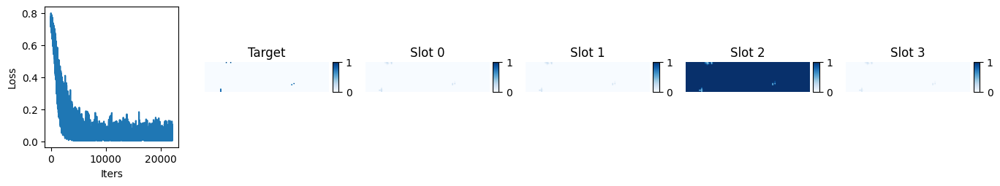

iter 22150 , loss 0.0065785116 , lr 0.00012479110961024223


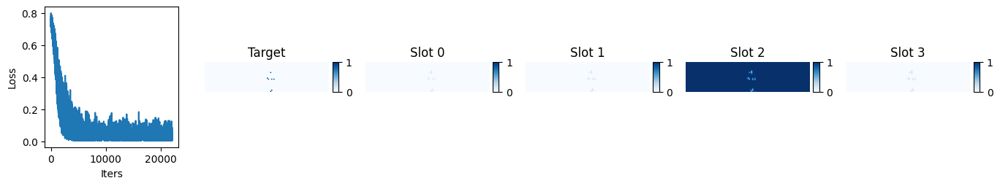

iter 22200 , loss 0.010086936 , lr 0.00012421063495808858


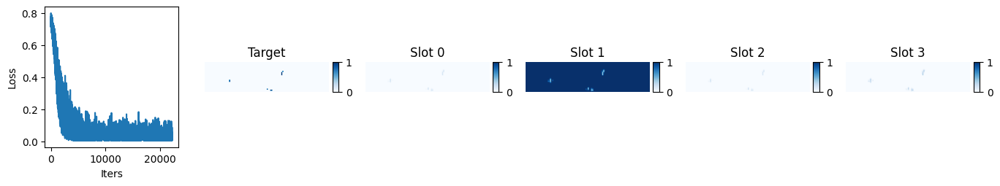

iter 22250 , loss 0.005510269 , lr 0.0001236305580098468


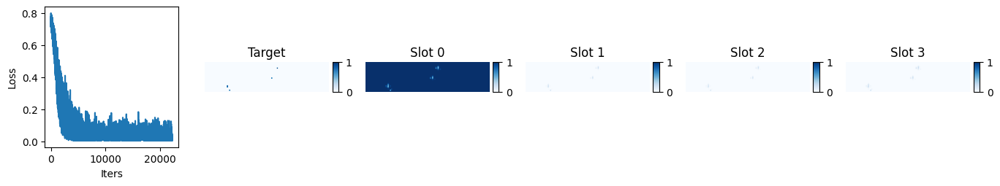

iter 22300 , loss 0.005369957 , lr 0.00012305088771102113


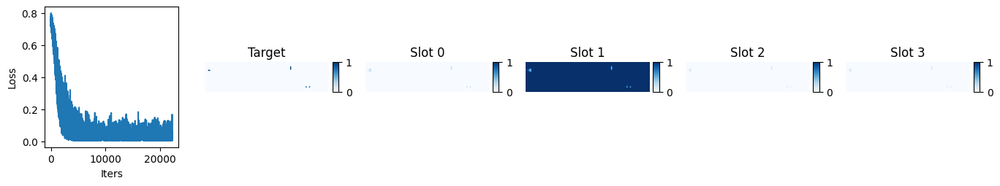

iter 22350 , loss 0.005784151 , lr 0.00012247163300084453


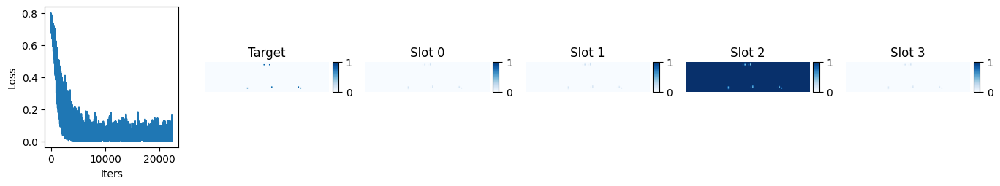

iter 22400 , loss 0.012398363 , lr 0.00012189280281214133


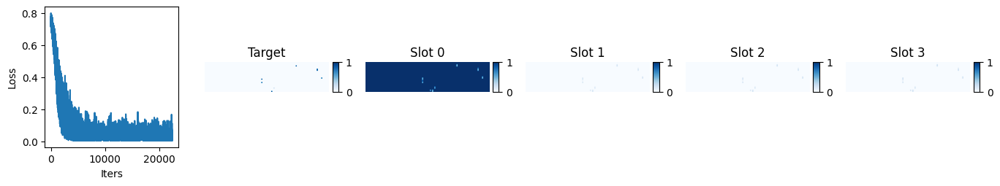

iter 22450 , loss 0.004501052 , lr 0.00012131440607118895


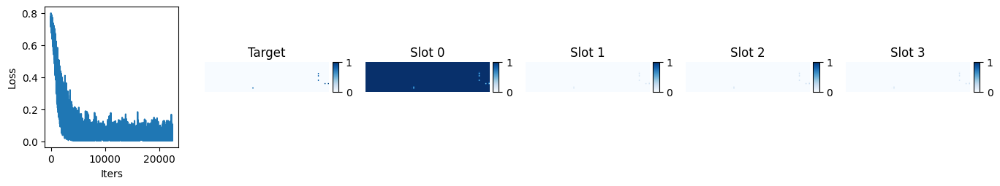

iter 22500 , loss 0.0040210537 , lr 0.00012073645169758072


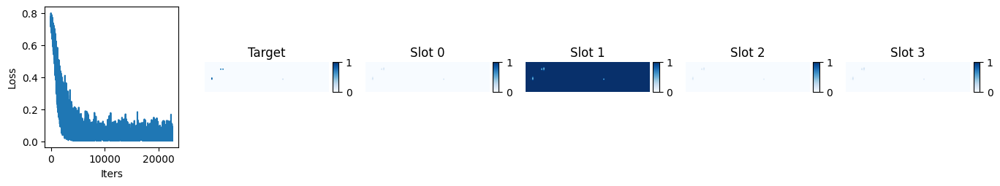

iter 22550 , loss 0.042613924 , lr 0.00012015894860408811


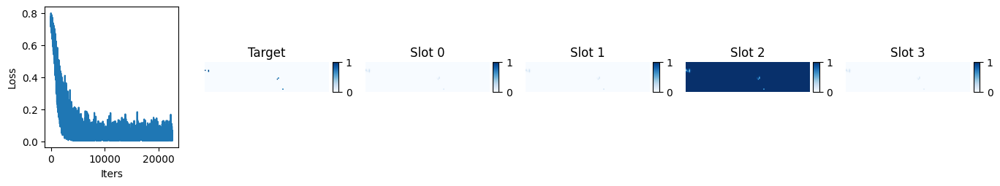

iter 22600 , loss 0.005069704 , lr 0.00011958190569652313


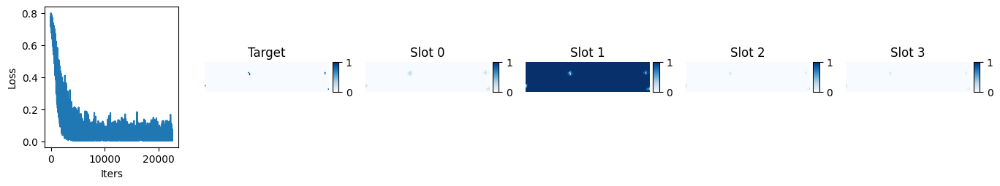

iter 22650 , loss 0.0063513396 , lr 0.00011900533187360128


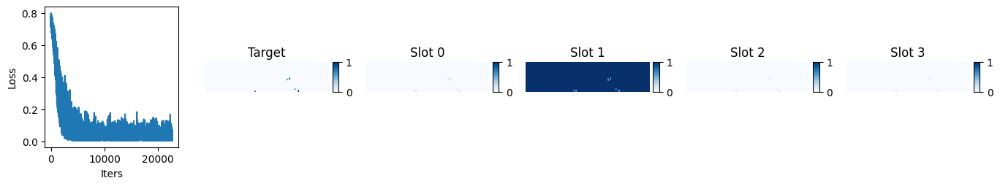

iter 22700 , loss 0.0050448426 , lr 0.00011842923602680417


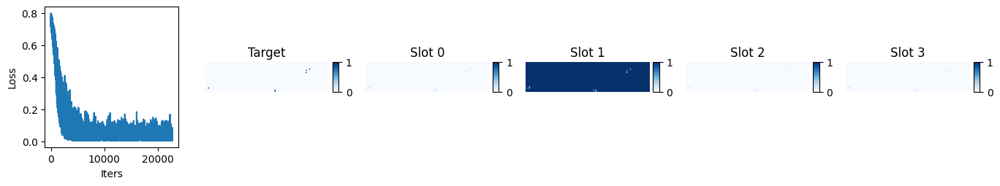

iter 22750 , loss 0.0053514754 , lr 0.00011785362704024236


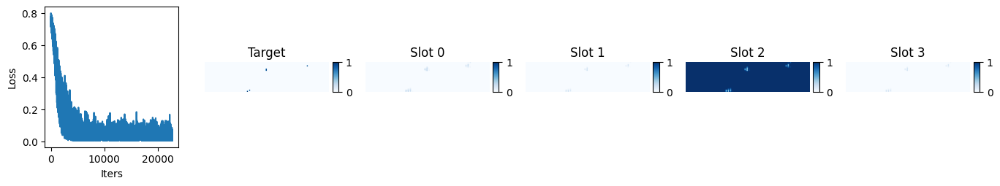

iter 22800 , loss 0.005514924 , lr 0.00011727851379051865


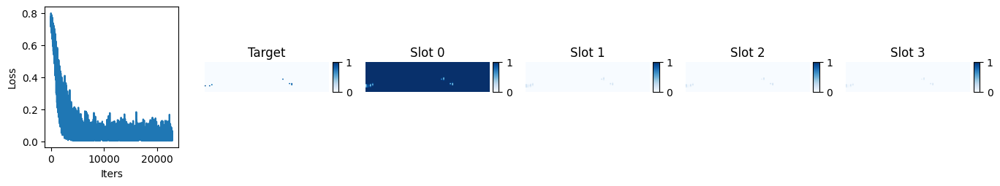

iter 22850 , loss 0.005738646 , lr 0.0001167039051465906


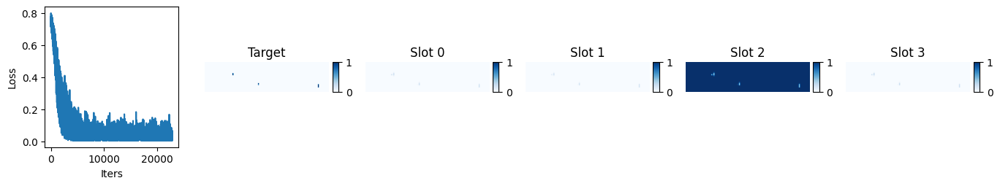

iter 22900 , loss 0.017124059 , lr 0.00011612980996963441


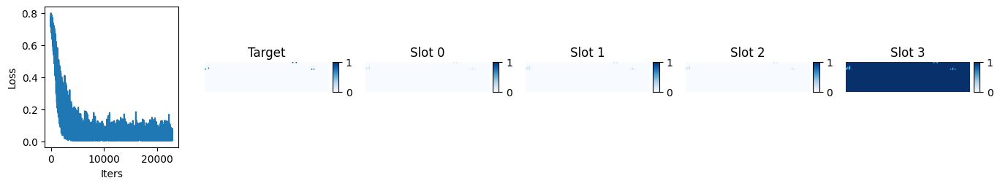

iter 22950 , loss 0.053615987 , lr 0.00011555623711290797


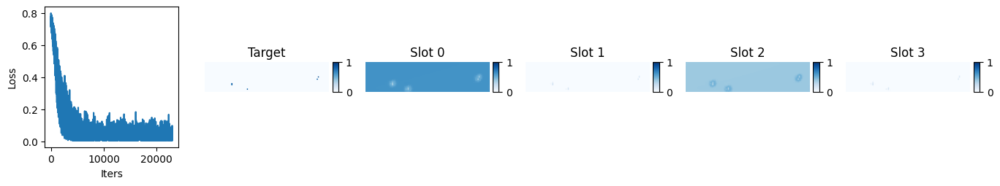

iter 23000 , loss 0.0066678775 , lr 0.0001149831954216142


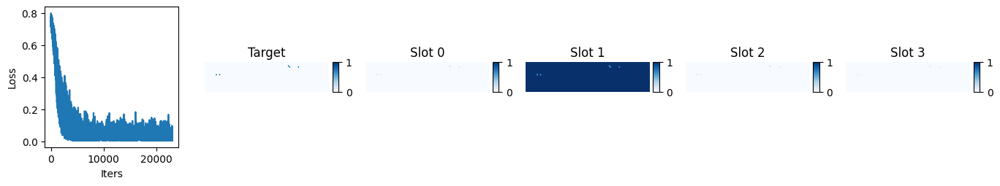

iter 23050 , loss 0.0046141613 , lr 0.00011441069373276488


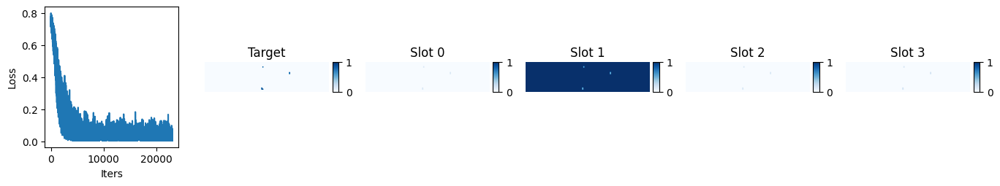

iter 23100 , loss 0.07970884 , lr 0.0001138387408750442


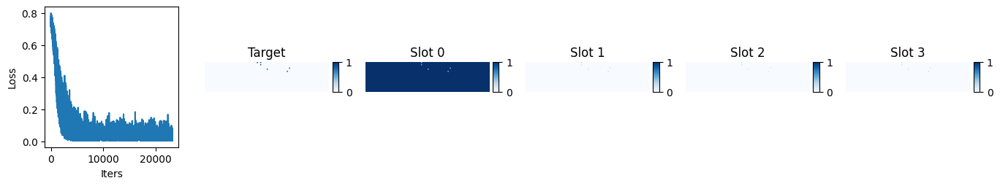

iter 23150 , loss 0.067148924 , lr 0.00011326734566867286


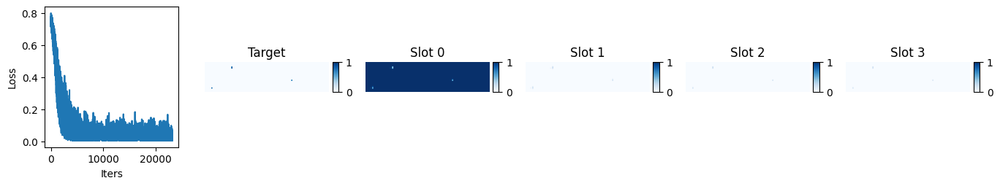

iter 23200 , loss 0.004802379 , lr 0.0001126965169252718


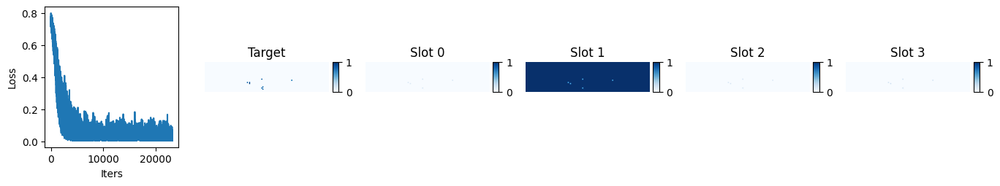

iter 23250 , loss 0.004527571 , lr 0.00011212626344772628


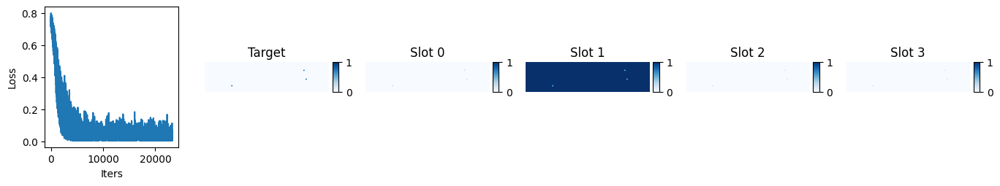

iter 23300 , loss 0.006244709 , lr 0.00011155659403005052


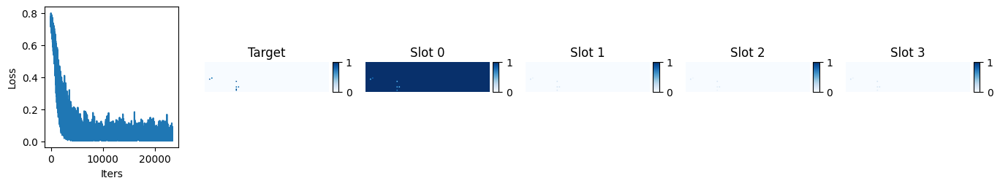

iter 23350 , loss 0.07487895 , lr 0.0001109875174572515


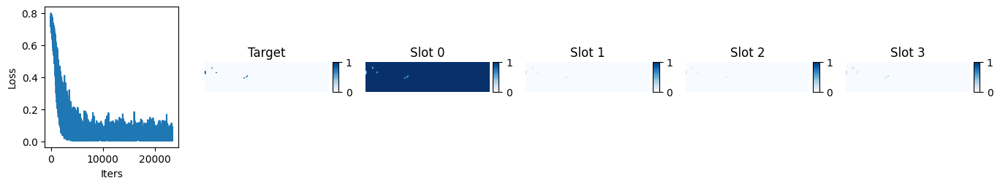

iter 23400 , loss 0.004430748 , lr 0.00011041904250519405


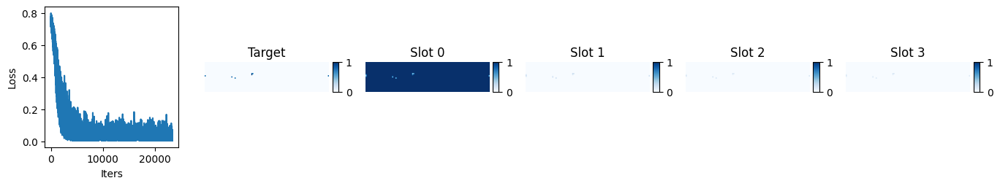

iter 23450 , loss 0.005222844 , lr 0.00010985117794046518


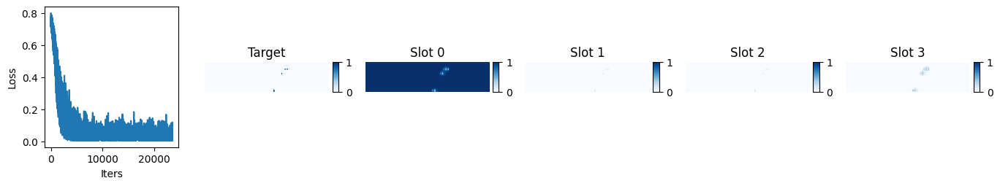

iter 23500 , loss 0.004797557 , lr 0.00010928393252023886


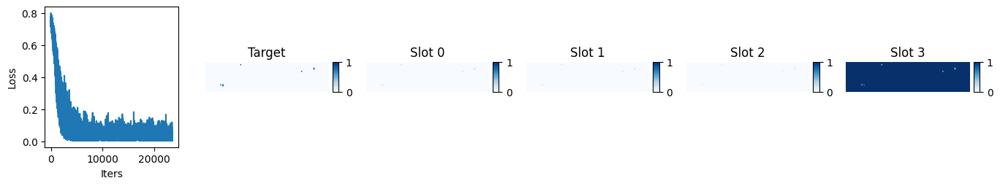

iter 23550 , loss 0.003494668 , lr 0.00010871731499214124


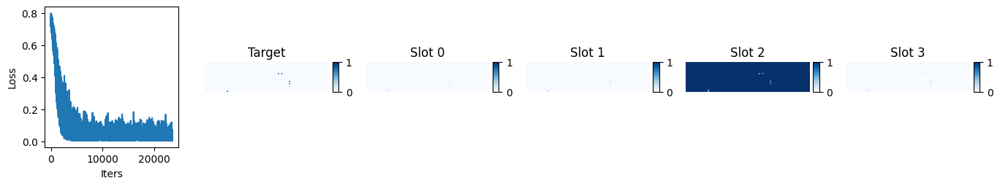

iter 23600 , loss 0.01791192 , lr 0.00010815133409411562


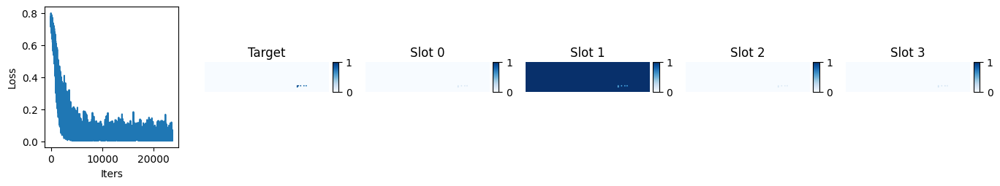

iter 23650 , loss 0.0077506686 , lr 0.00010758599855428746


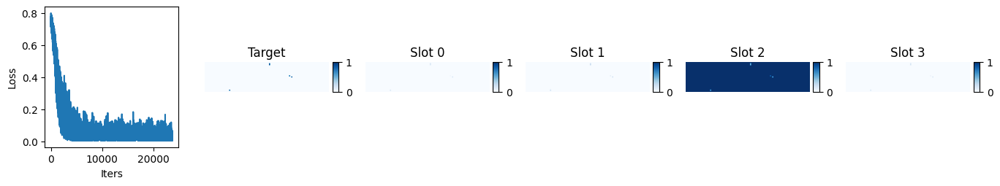

iter 23700 , loss 0.036768552 , lr 0.00010702131709083025


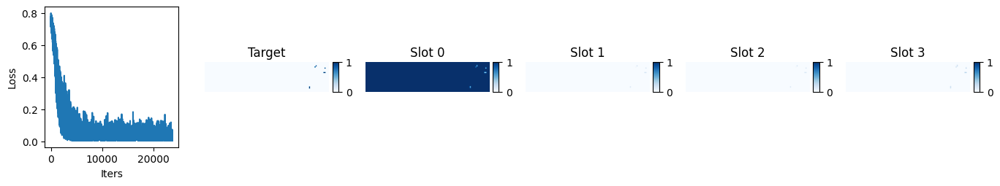

iter 23750 , loss 0.0039355718 , lr 0.00010645729841183066


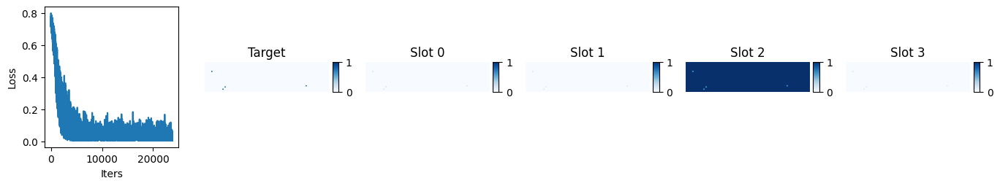

iter 23800 , loss 0.004023161 , lr 0.00010589395121515438


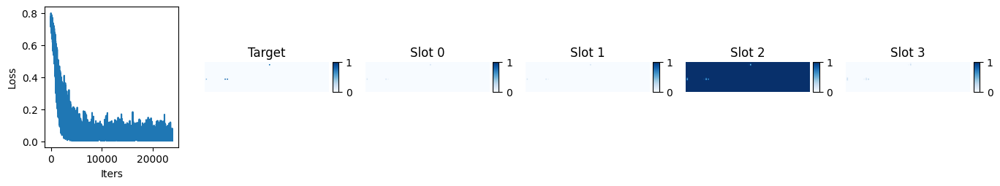

iter 23850 , loss 0.03494478 , lr 0.00010533128418831223


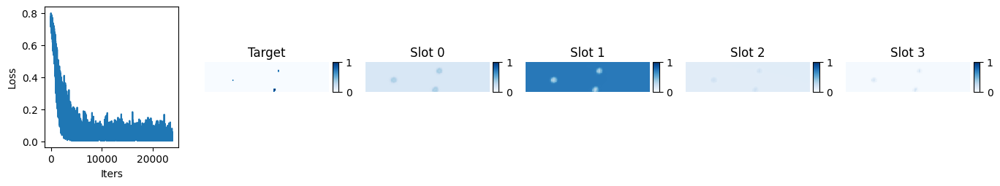

iter 23900 , loss 0.0041968226 , lr 0.00010476930600832565


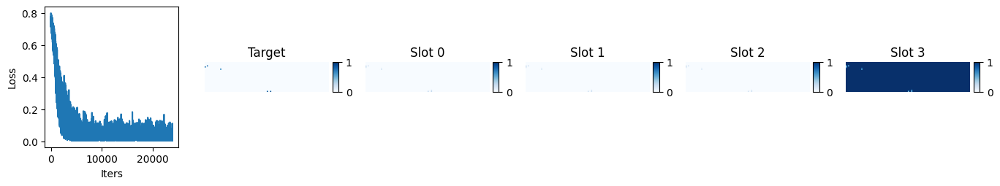

iter 23950 , loss 0.017449819 , lr 0.0001042080253415935


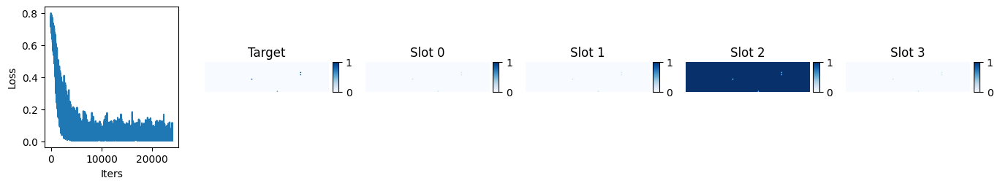

iter 24000 , loss 0.004642968 , lr 0.0001036474508437579


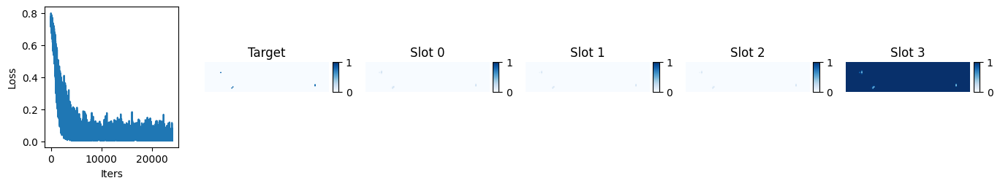

iter 24050 , loss 0.006809503 , lr 0.00010308759115957111


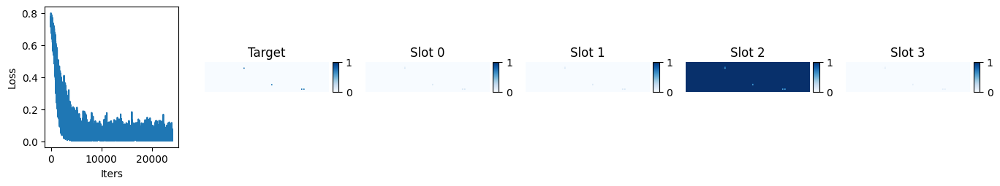

iter 24100 , loss 0.0050287265 , lr 0.00010252845492276209


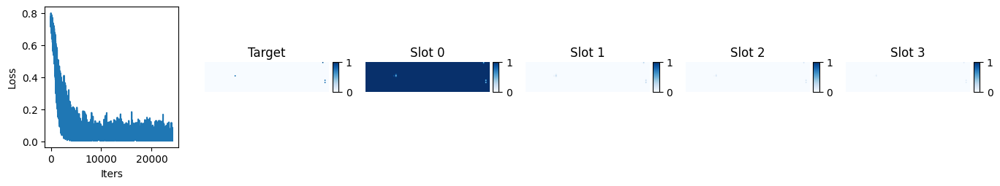

iter 24150 , loss 0.0045953603 , lr 0.00010197005075590324


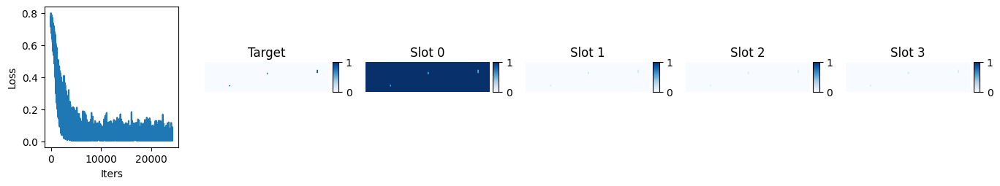

iter 24200 , loss 0.02652005 , lr 0.00010141238727027757


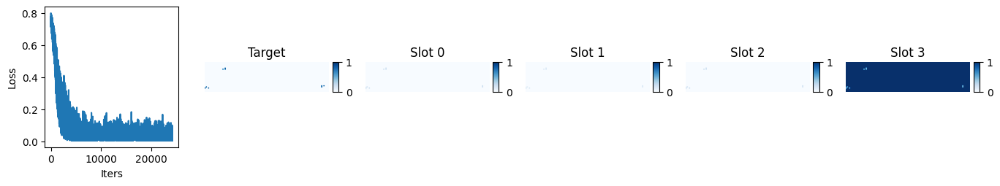

iter 24250 , loss 0.012838871 , lr 0.00010085547306574598


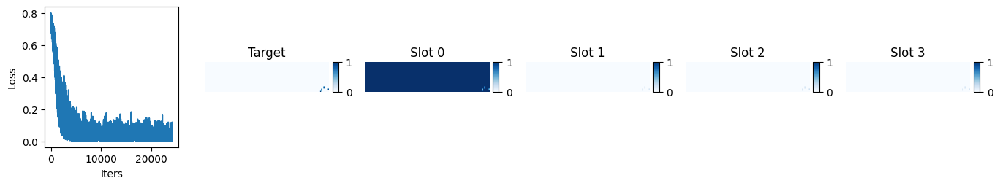

iter 24300 , loss 0.0054147206 , lr 0.00010029931673061433


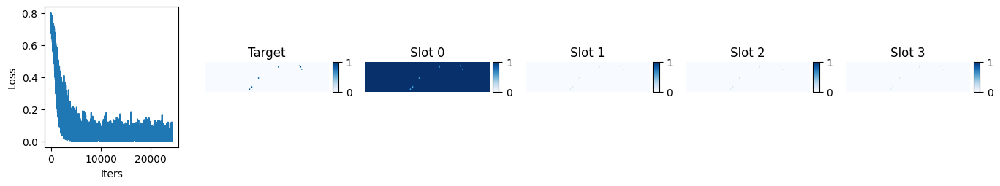

iter 24350 , loss 0.016667457 , lr 9.974392684150143e-05


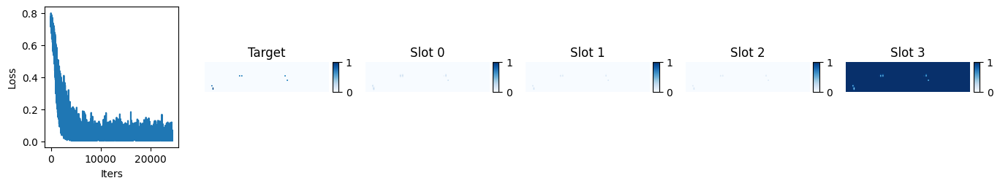

iter 24400 , loss 0.004530067 , lr 9.918931196320629e-05


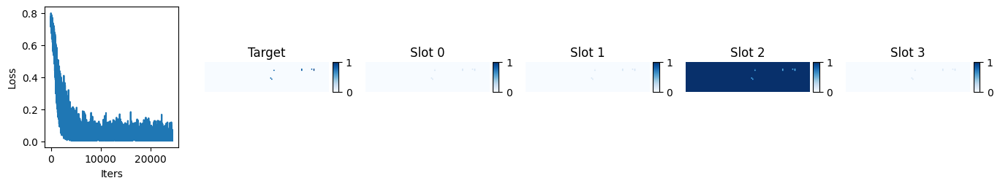

iter 24450 , loss 0.052926347 , lr 9.863548064857647e-05


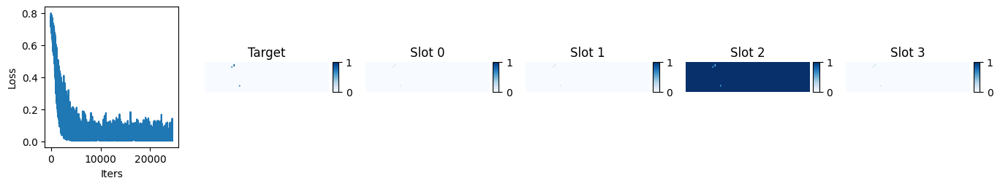

iter 24500 , loss 0.0042608804 , lr 9.808244143837605e-05


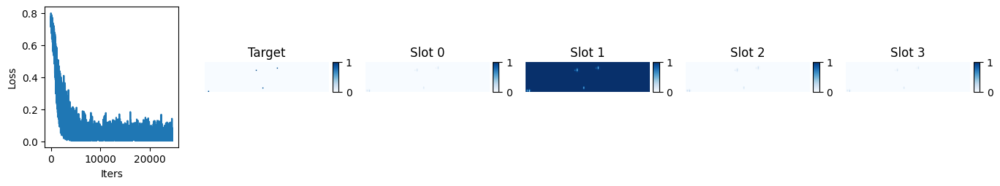

iter 24550 , loss 0.011139182 , lr 9.753020286115368e-05


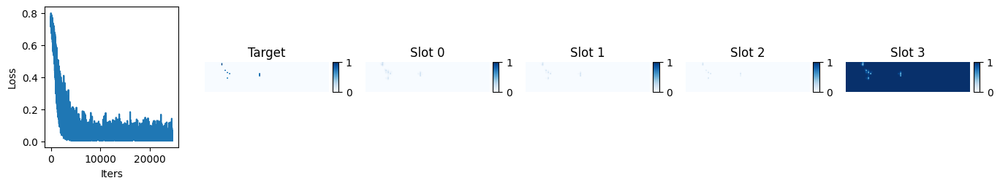

iter 24600 , loss 0.0066726296 , lr 9.697877343311148e-05


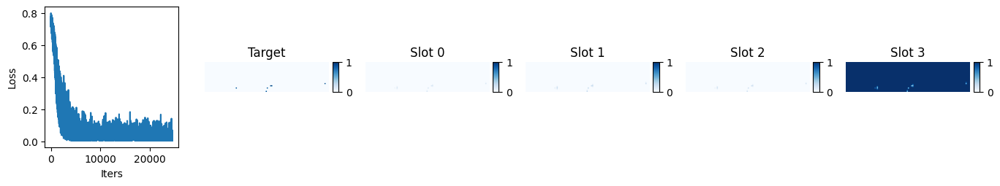

iter 24650 , loss 0.030635731 , lr 9.642816165797323e-05


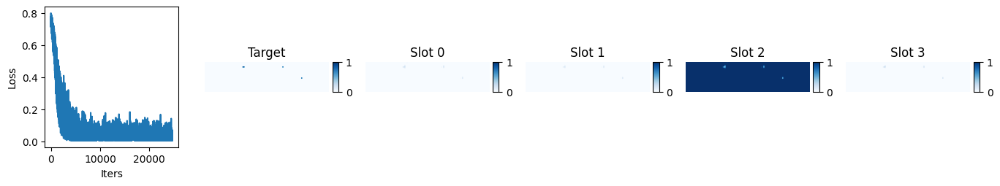

iter 24700 , loss 0.008217793 , lr 9.587837602685372e-05


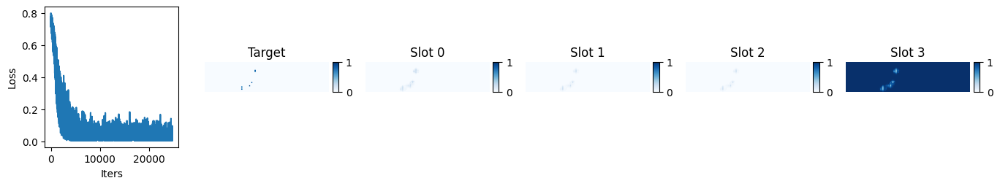

iter 24750 , loss 0.0045658234 , lr 9.532942501812757e-05


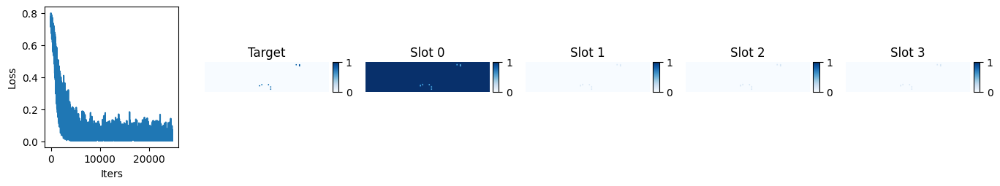

iter 24800 , loss 0.12518424 , lr 9.47813170972983e-05


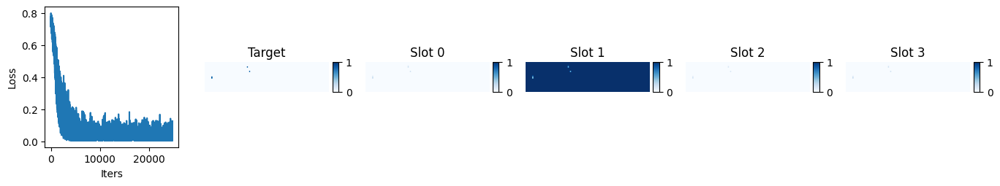

iter 24850 , loss 0.0250527 , lr 9.423406071686817e-05


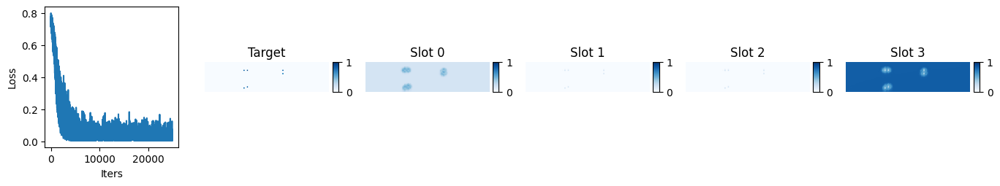

iter 24900 , loss 0.0059451307 , lr 9.368766431620754e-05


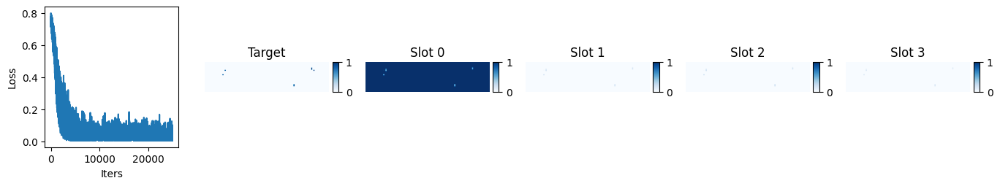

iter 24950 , loss 0.0076755187 , lr 9.314213632142482e-05


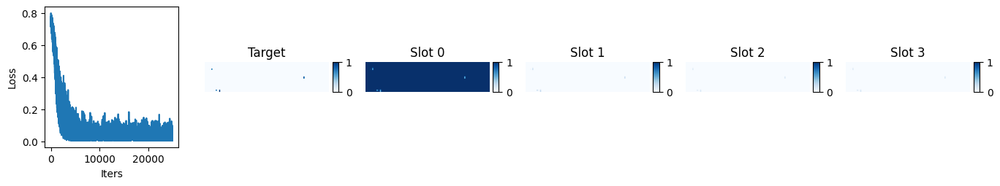

iter 25000 , loss 0.005457654 , lr 9.259748514523656e-05


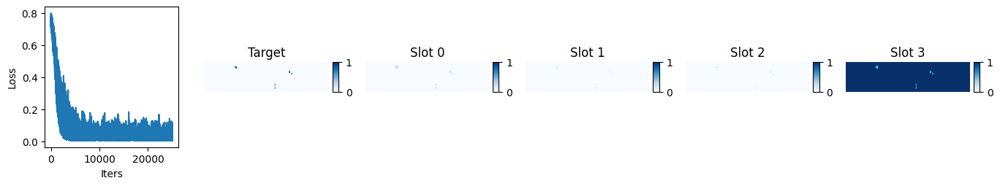

iter 25050 , loss 0.004890378 , lr 9.205371918683761e-05


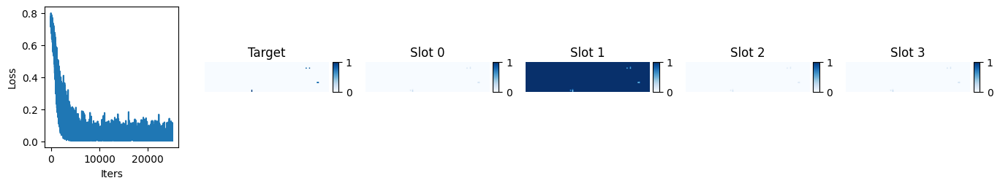

iter 25100 , loss 0.00572773 , lr 9.151084683177175e-05


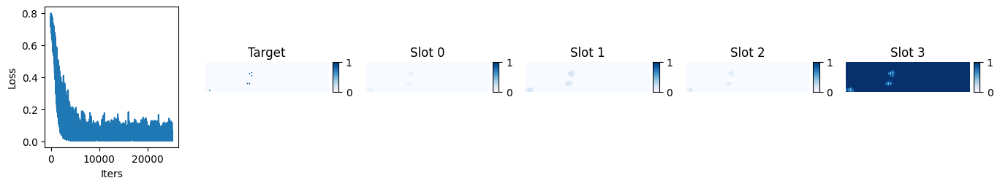

iter 25150 , loss 0.024497606 , lr 9.09688764518023e-05


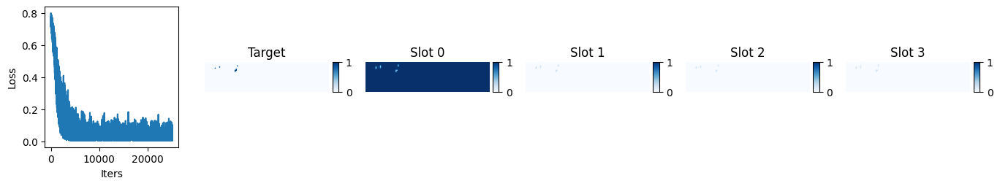

iter 25200 , loss 0.0056660385 , lr 9.042781640478288e-05


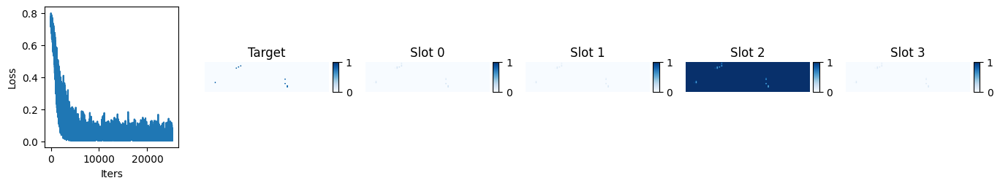

iter 25250 , loss 0.0065260595 , lr 8.988767503452887e-05


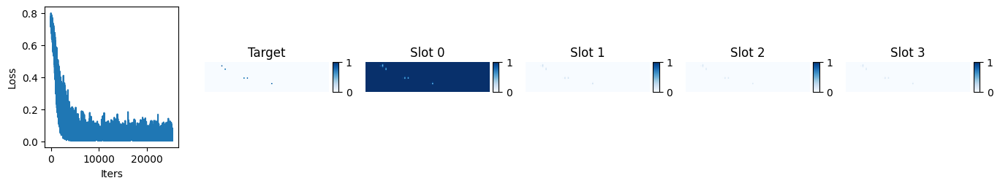

iter 25300 , loss 0.0046905237 , lr 8.934846067068825e-05


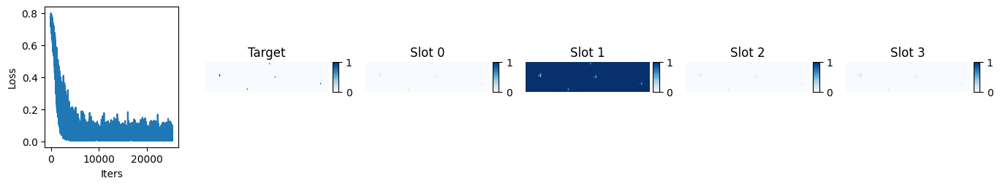

iter 25350 , loss 0.0051373537 , lr 8.881018162861362e-05


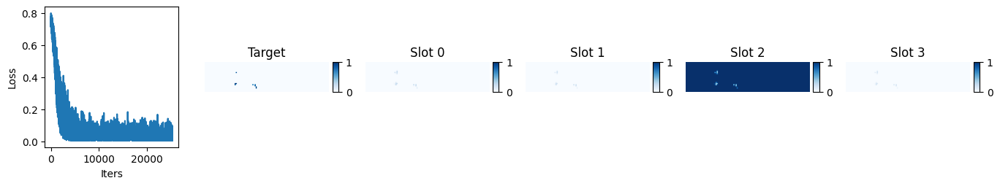

iter 25400 , loss 0.004587337 , lr 8.82728462092337e-05


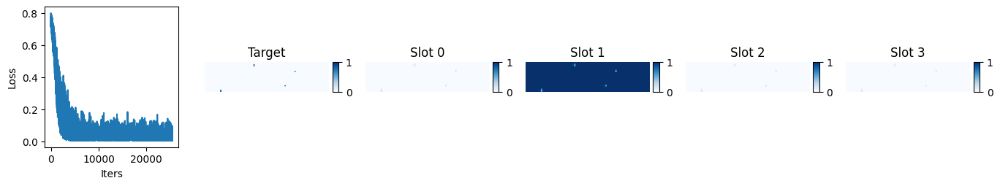

iter 25450 , loss 0.0043977425 , lr 8.773646269892532e-05


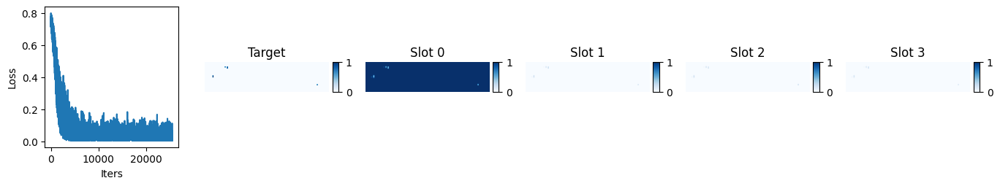

iter 25500 , loss 0.026845273 , lr 8.720103936938576e-05


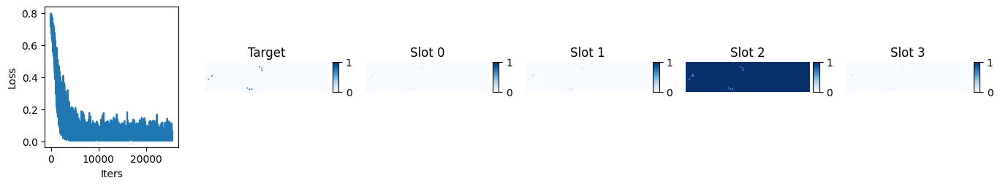

iter 25550 , loss 0.023989113 , lr 8.666658447750519e-05


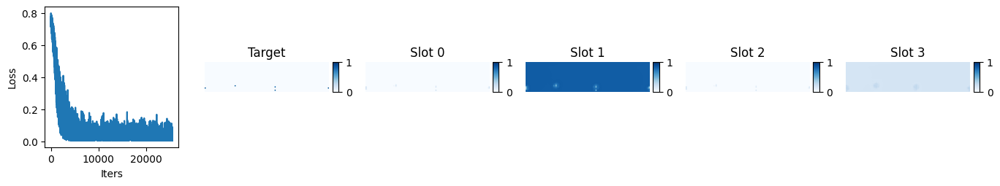

iter 25600 , loss 0.005386567 , lr 8.613310626523909e-05


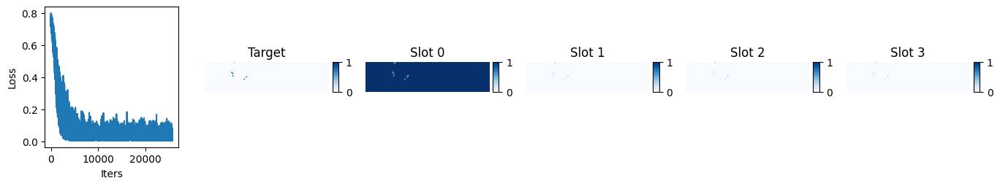

iter 25650 , loss 0.005785985 , lr 8.560061295948153e-05


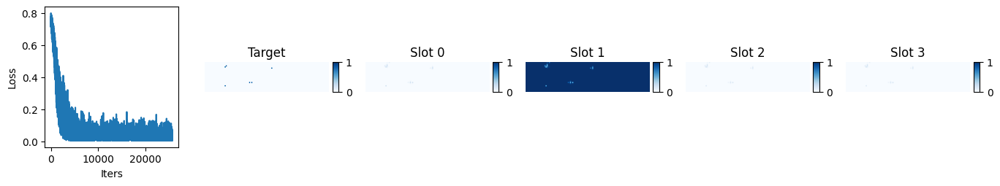

iter 25700 , loss 0.004657536 , lr 8.50691127719379e-05


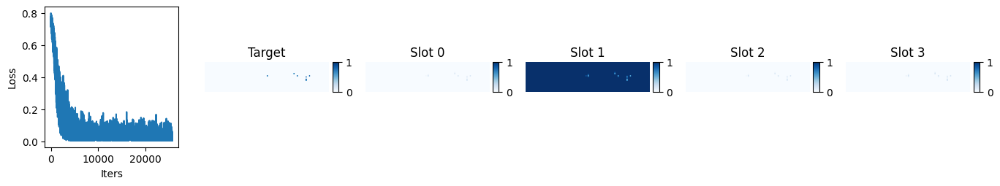

iter 25750 , loss 0.005578129 , lr 8.453861389899865e-05


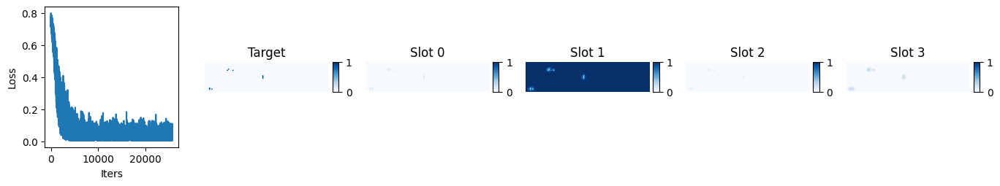

iter 25800 , loss 0.0147706745 , lr 8.400912452161271e-05


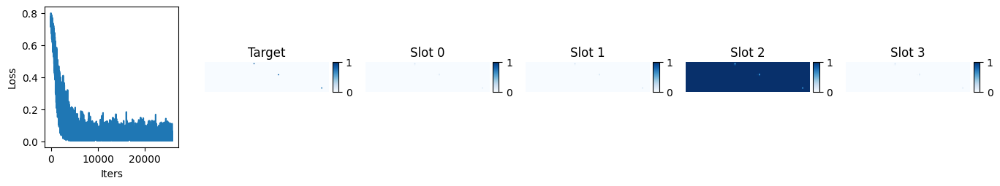

iter 25850 , loss 0.004998254 , lr 8.348065280516125e-05


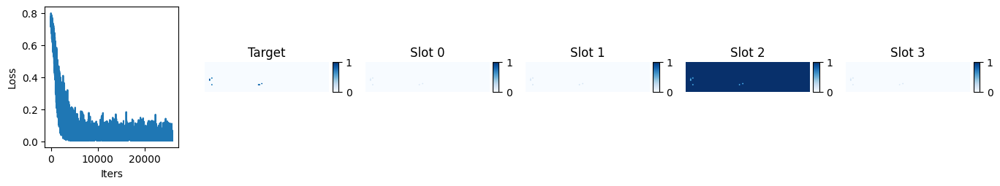

iter 25900 , loss 0.0048446367 , lr 8.295320689933183e-05


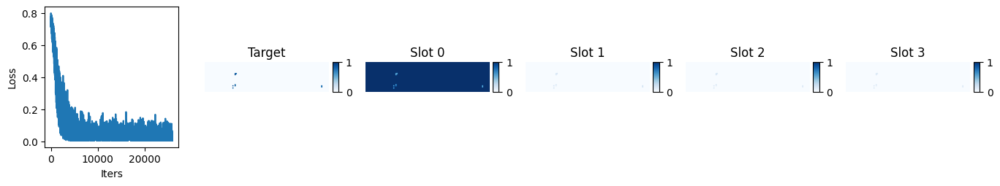

iter 25950 , loss 0.0041838274 , lr 8.24267949379929e-05


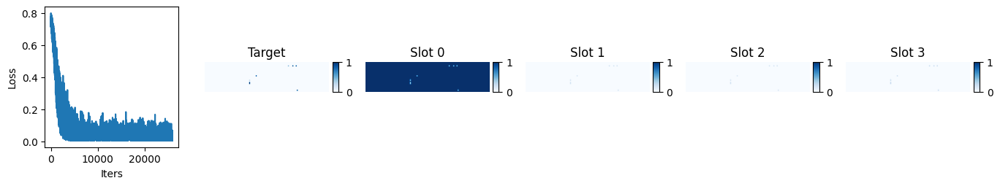

iter 26000 , loss 0.0123539325 , lr 8.190142503906798e-05


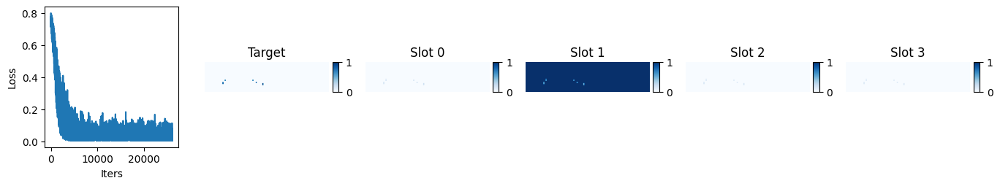

iter 26050 , loss 0.0051299627 , lr 8.137710530441096e-05


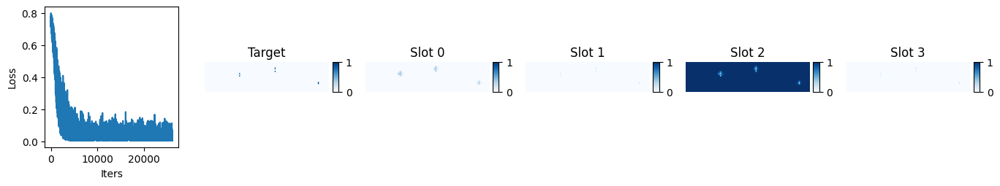

iter 26100 , loss 0.010464118 , lr 8.085384381968067e-05


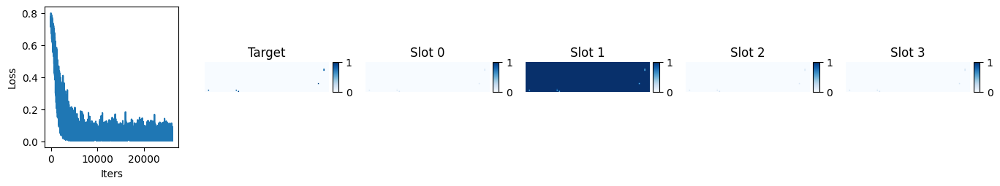

iter 26150 , loss 0.0059314007 , lr 8.033164865421651e-05


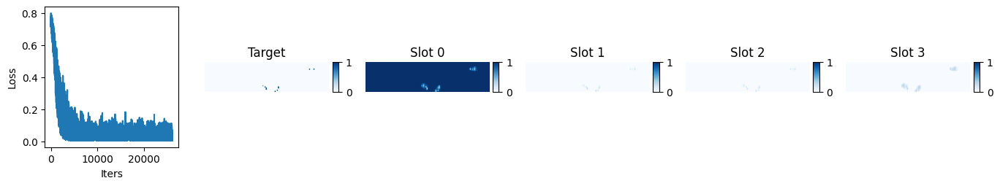

iter 26200 , loss 0.014820522 , lr 7.9810527860914e-05


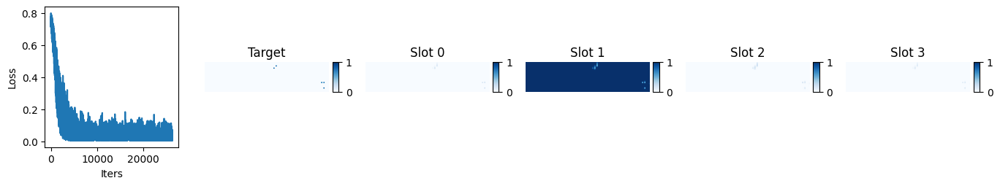

iter 26250 , loss 0.008287399 , lr 7.929048947610034e-05


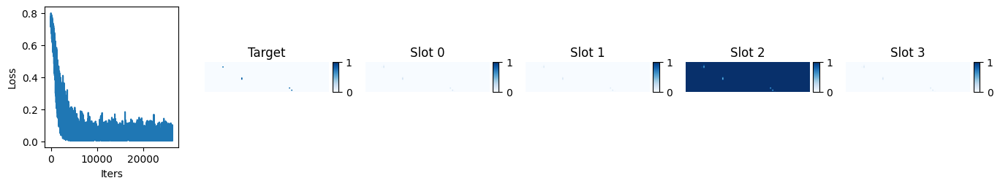

iter 26300 , loss 0.0050698775 , lr 7.877154151941082e-05


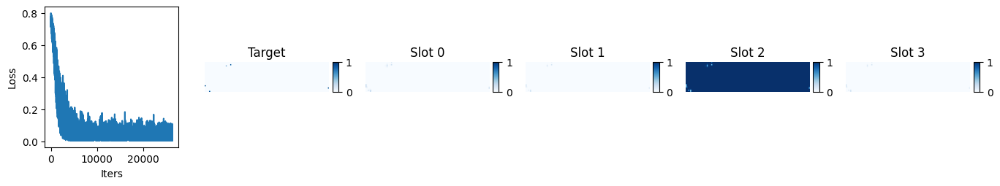

iter 26350 , loss 0.0070031756 , lr 7.825369199366483e-05


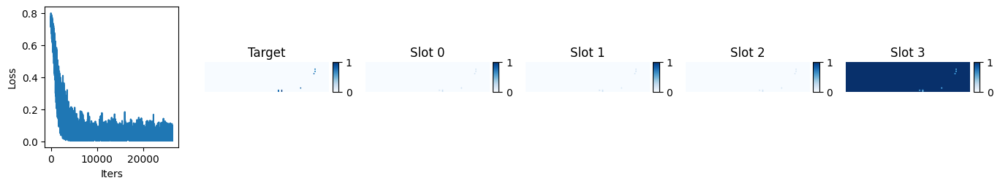

iter 26400 , loss 0.025529003 , lr 7.773694888474267e-05


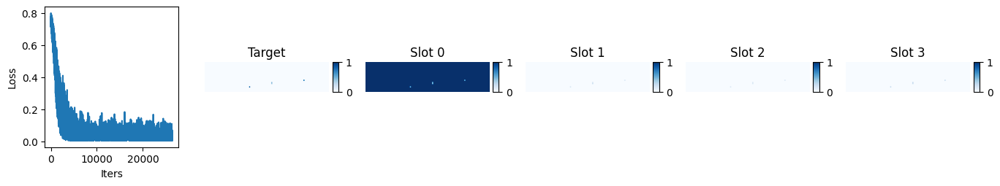

iter 26450 , loss 0.0047711036 , lr 7.722132016146243e-05


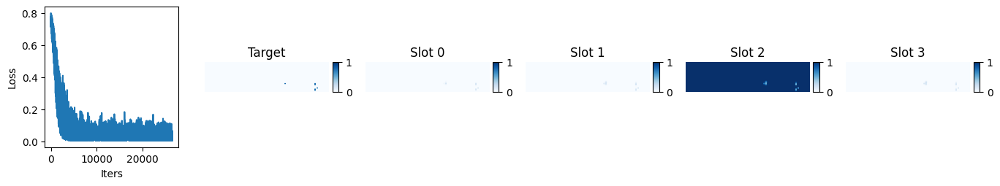

iter 26500 , loss 0.00872269 , lr 7.670681377545674e-05


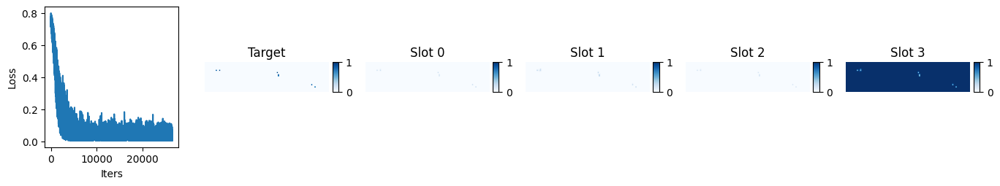

iter 26550 , loss 0.006311092 , lr 7.619343766105065e-05


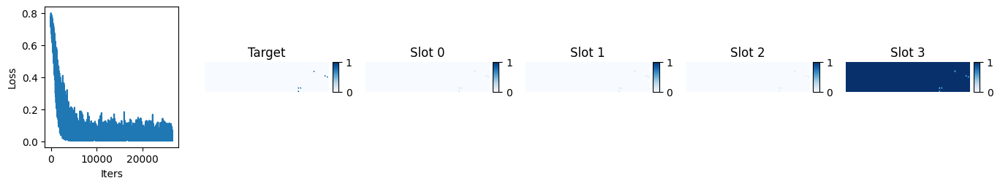

iter 26600 , loss 0.0042264056 , lr 7.568119973513885e-05


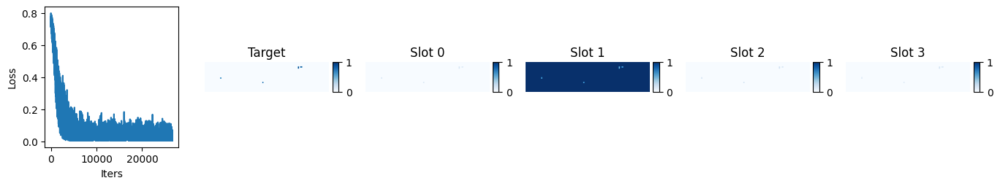

iter 26650 , loss 0.03399563 , lr 7.517010789706391e-05


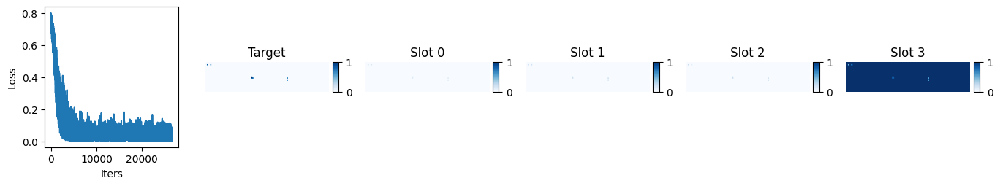

iter 26700 , loss 0.0050399923 , lr 7.466017002849417e-05


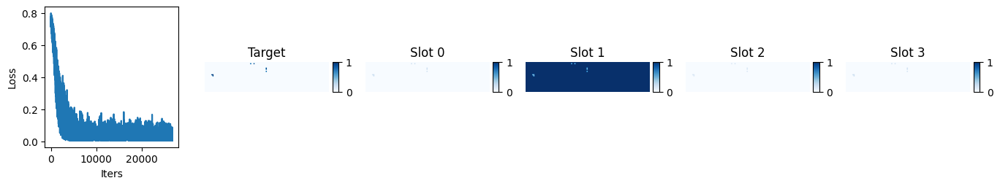

iter 26750 , loss 0.00417303 , lr 7.415139399330233e-05


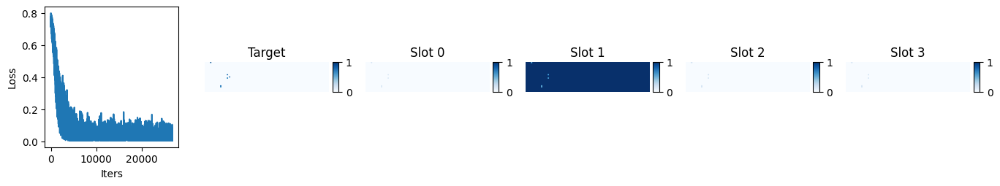

iter 26800 , loss 0.0041418145 , lr 7.364378763744429e-05


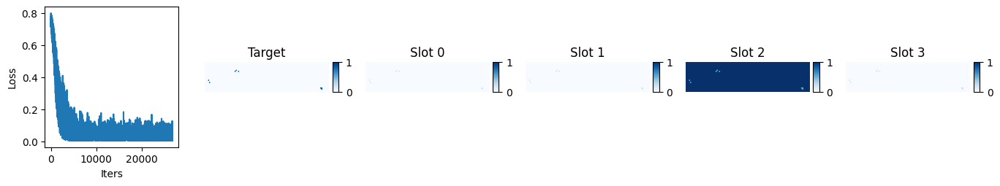

iter 26850 , loss 0.008645657 , lr 7.313735878883809e-05


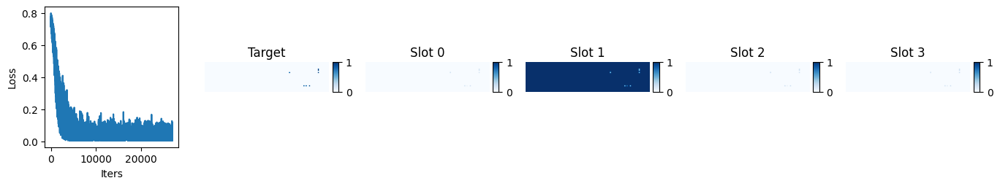

iter 26900 , loss 0.005280092 , lr 7.263211525724288e-05


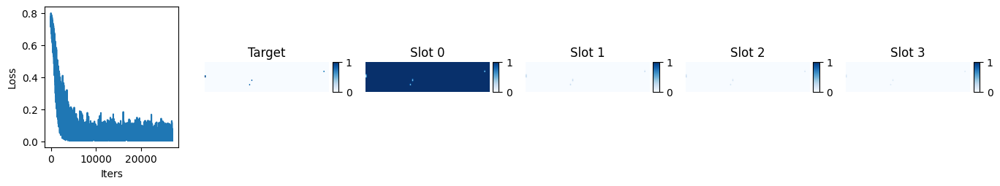

iter 26950 , loss 0.004262105 , lr 7.21280648341391e-05


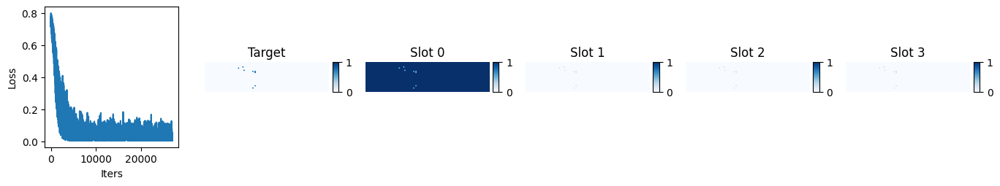

iter 27000 , loss 0.0069368575 , lr 7.162521529260767e-05


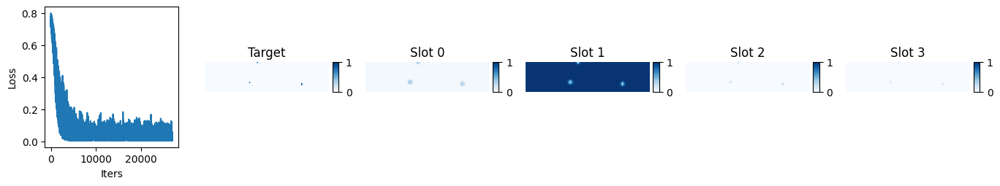

iter 27050 , loss 0.0065823505 , lr 7.112357438721065e-05


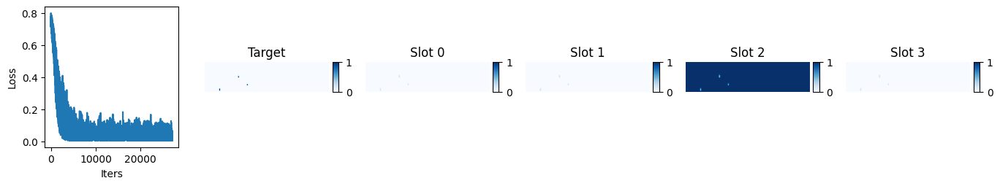

iter 27100 , loss 0.0044426834 , lr 7.062314985387142e-05


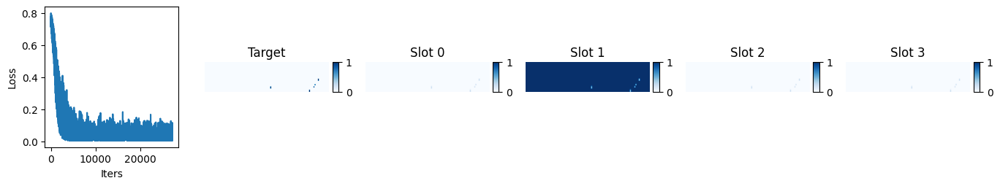

iter 27150 , loss 0.09914278 , lr 7.012394940975522e-05


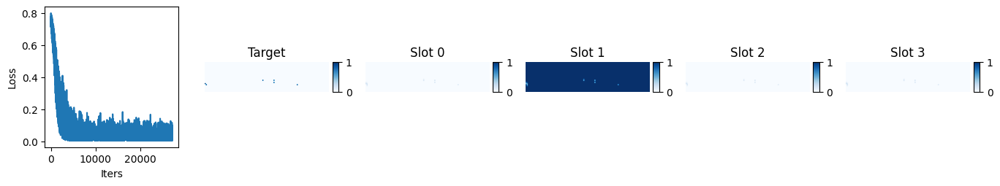

iter 27200 , loss 0.015597605 , lr 6.962598075315052e-05


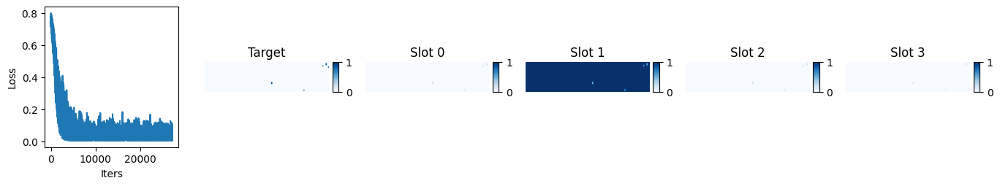

iter 27250 , loss 0.0076883603 , lr 6.912925156334995e-05


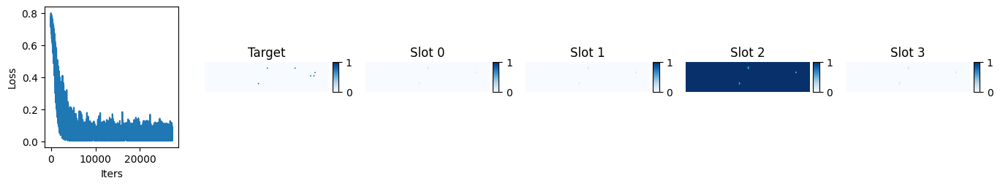

iter 27300 , loss 0.0050372123 , lr 6.863376950053216e-05


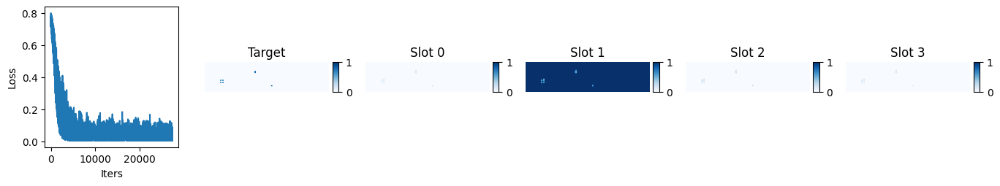

iter 27350 , loss 0.0044632093 , lr 6.813954220564351e-05


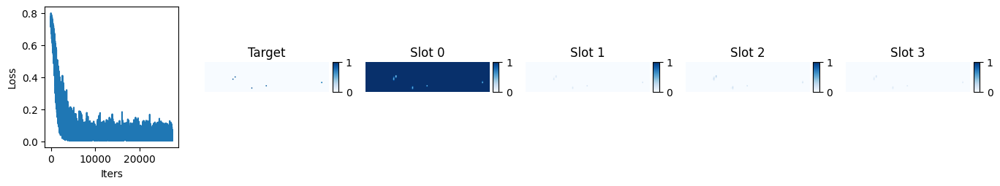

iter 27400 , loss 0.0055651157 , lr 6.764657730028026e-05


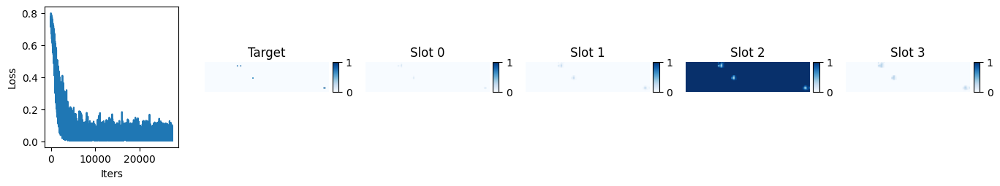

iter 27450 , loss 0.015152589 , lr 6.715488238657101e-05


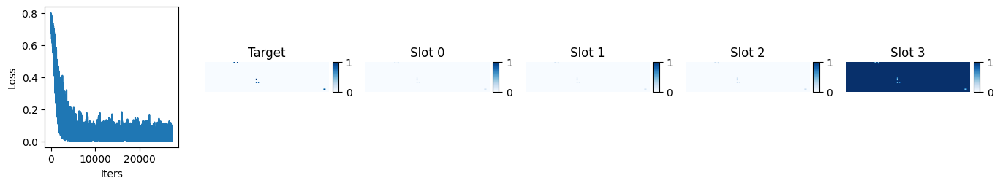

iter 27500 , loss 0.005610207 , lr 6.66644650470597e-05


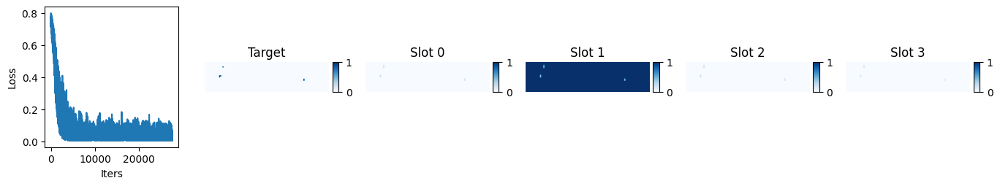

iter 27550 , loss 0.006401731 , lr 6.617533284458826e-05


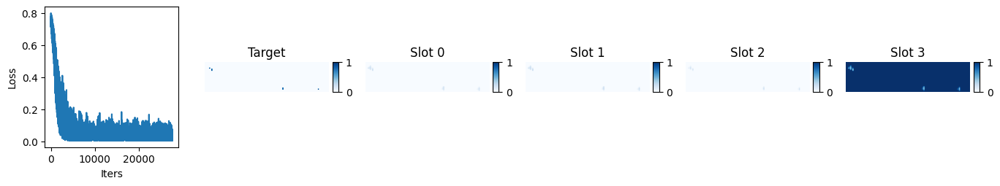

iter 27600 , loss 0.0038546084 , lr 6.568749332218044e-05


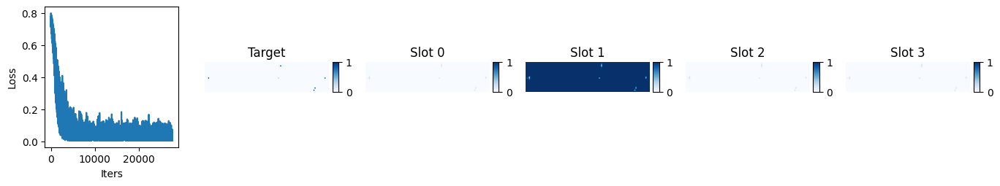

iter 27650 , loss 0.050262596 , lr 6.520095400292508e-05


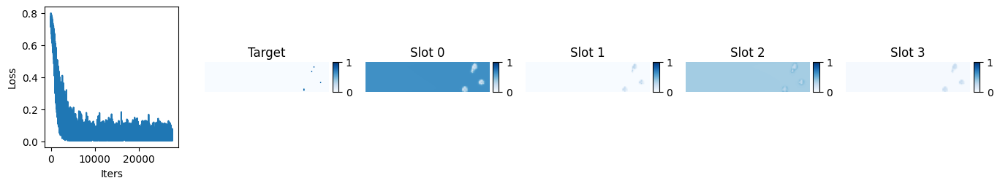

iter 27700 , loss 0.0083897365 , lr 6.47157223898604e-05


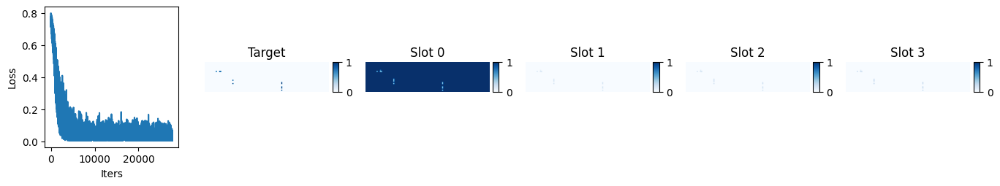

iter 27750 , loss 0.027737444 , lr 6.423180596585817e-05


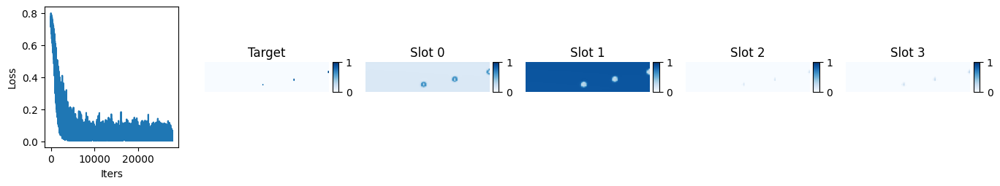

iter 27800 , loss 0.0043113315 , lr 6.374921219350821e-05


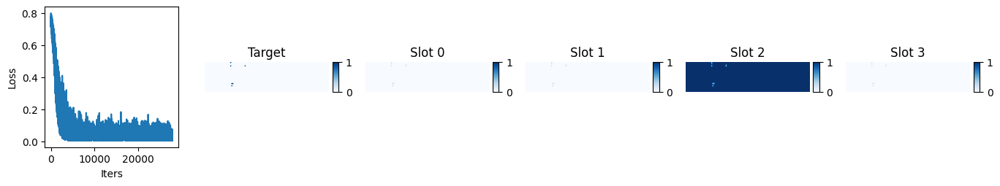

iter 27850 , loss 0.045499235 , lr 6.326794851500356e-05


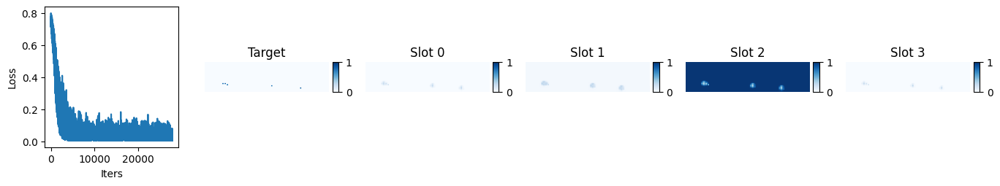

iter 27900 , loss 0.006648888 , lr 6.27880223520254e-05


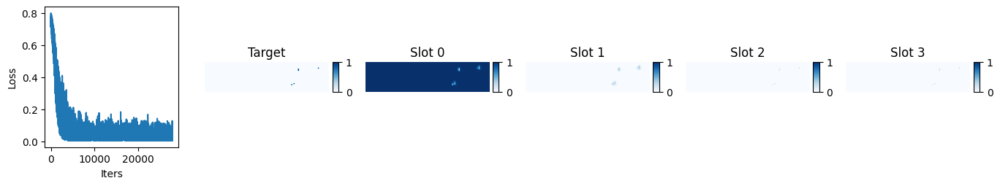

iter 27950 , loss 0.0048715547 , lr 6.230944110562893e-05


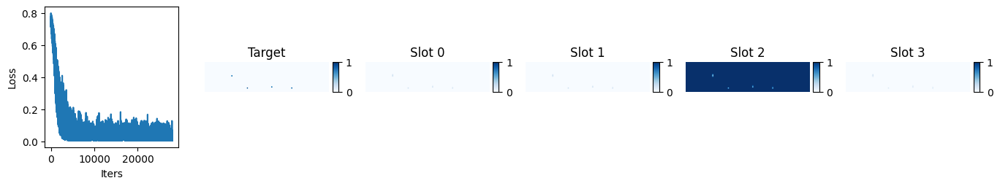

iter 28000 , loss 0.037834756 , lr 6.183221215612904e-05


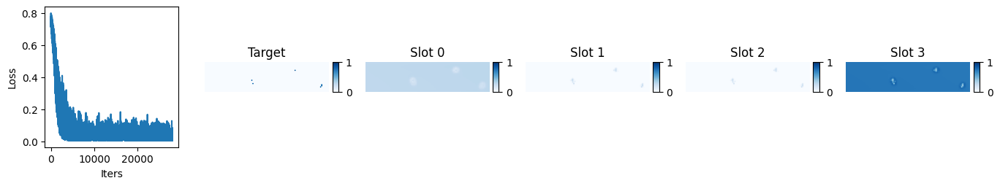

iter 28050 , loss 0.006484418 , lr 6.135634286298637e-05


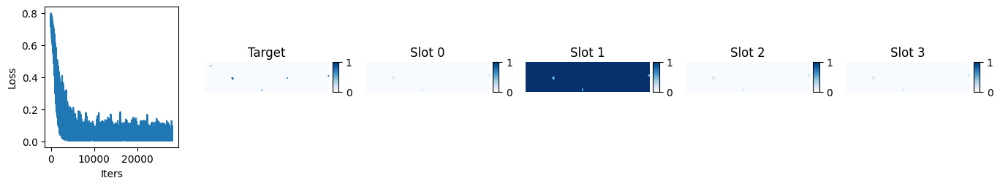

iter 28100 , loss 0.0044483673 , lr 6.0881840564694226e-05


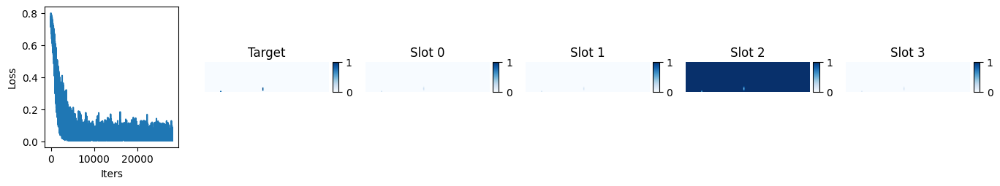

iter 28150 , loss 0.05010462 , lr 6.040871257866493e-05


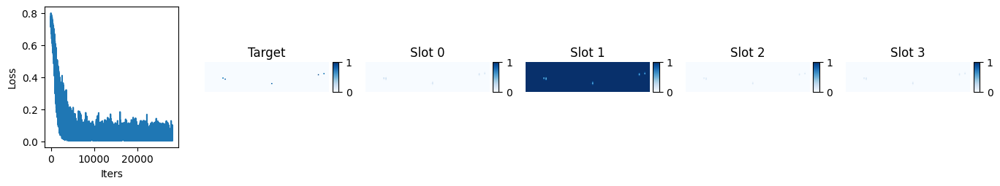

iter 28200 , loss 0.006574224 , lr 5.993696620111741e-05


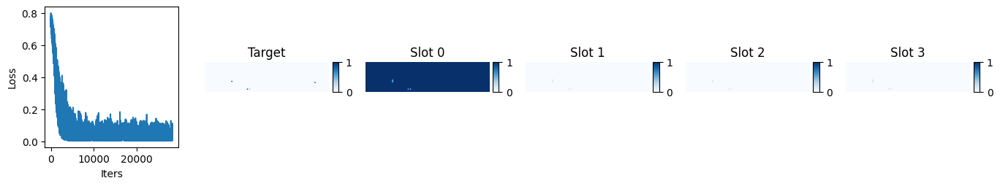

iter 28250 , loss 0.0063892356 , lr 5.946660870696433e-05


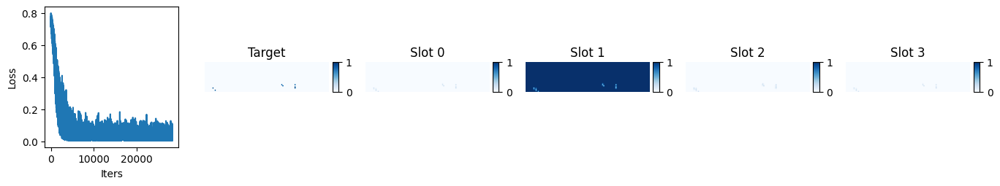

iter 28300 , loss 0.007013462 , lr 5.899764734970007e-05


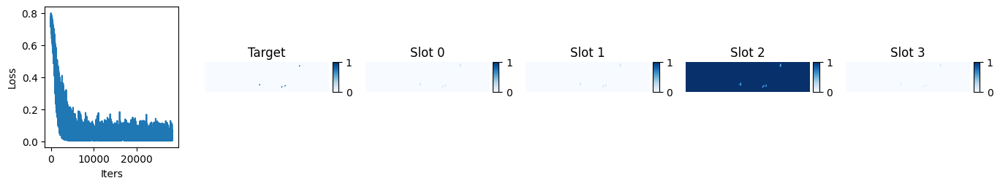

iter 28350 , loss 0.005228039 , lr 5.853008936128893e-05


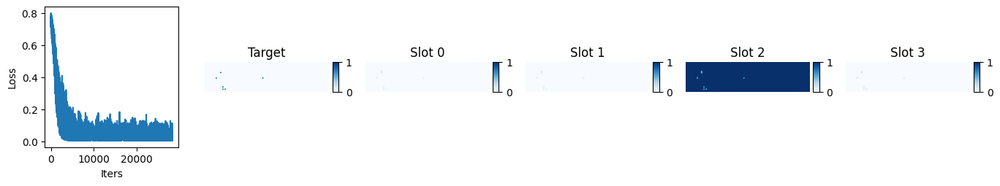

iter 28400 , loss 0.0074675353 , lr 5.806394195205356e-05


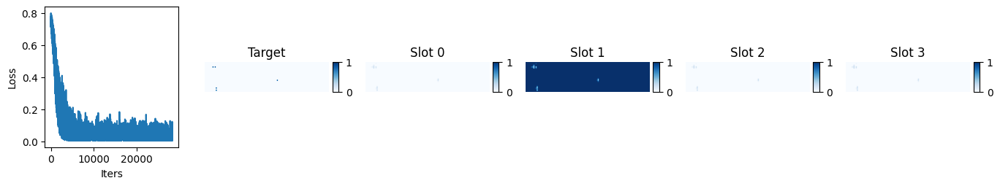

iter 28450 , loss 0.02008291 , lr 5.7599212310563534e-05


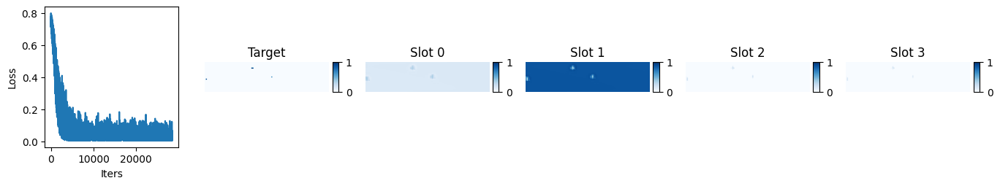

iter 28500 , loss 0.006450957 , lr 5.7135907603524936e-05


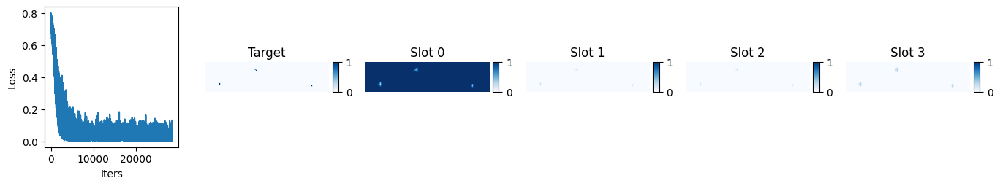

iter 28550 , loss 0.0054219305 , lr 5.667403497566939e-05


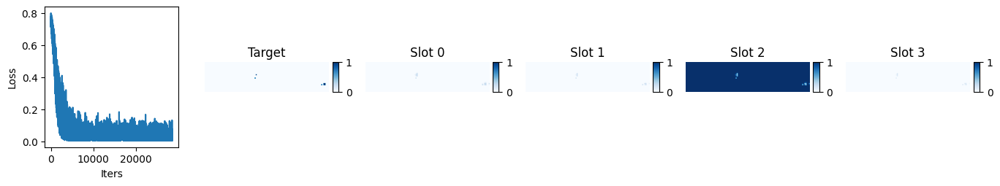

iter 28600 , loss 0.017523363 , lr 5.6213601549644216e-05


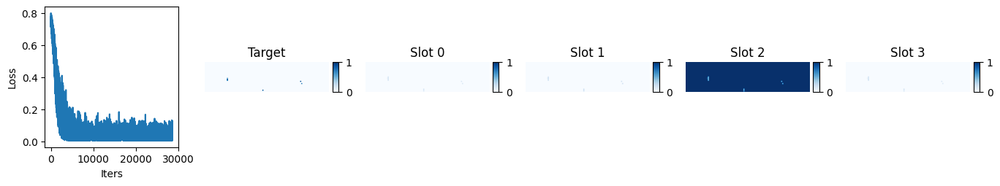

iter 28650 , loss 0.0063594743 , lr 5.5754614425902486e-05


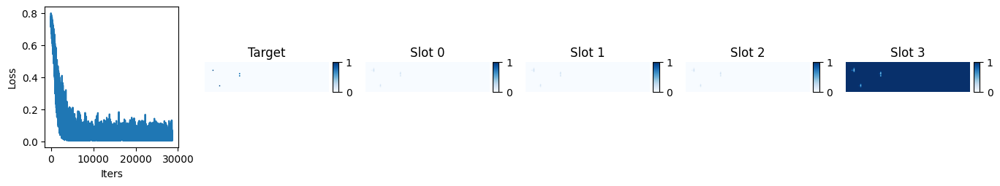

iter 28700 , loss 0.005463593 , lr 5.5297080682593333e-05


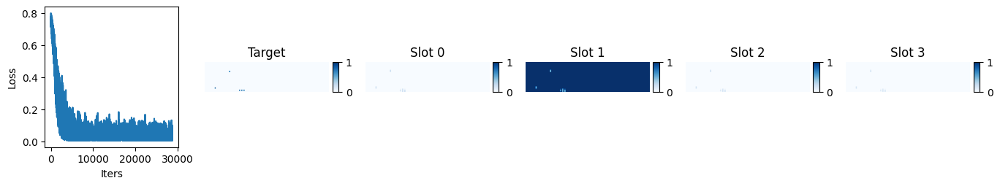

iter 28750 , loss 0.008654236 , lr 5.4841007375453186e-05


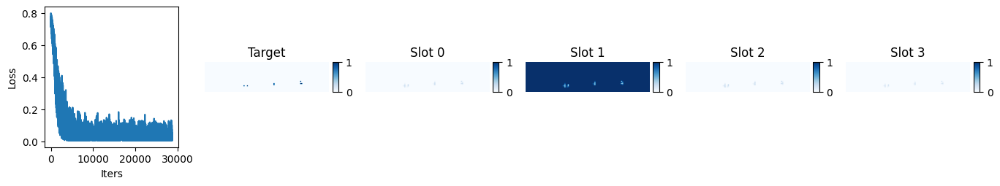

iter 28800 , loss 0.0053165727 , lr 5.4386401537696536e-05


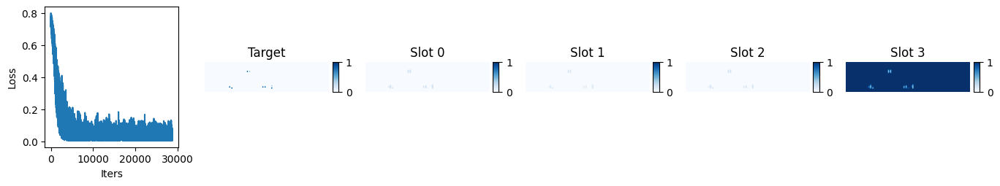

iter 28850 , loss 0.0063145338 , lr 5.393327017990782e-05


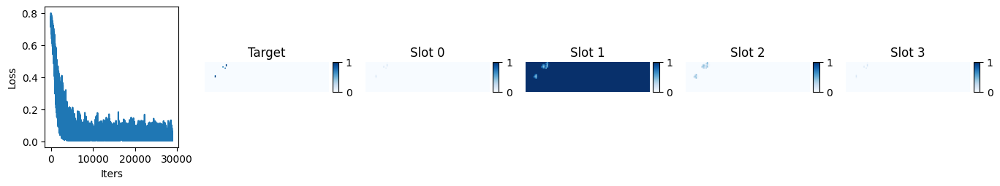

iter 28900 , loss 0.005836411 , lr 5.348162028993316e-05


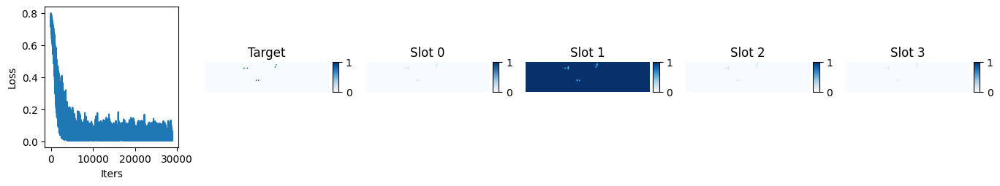

iter 28950 , loss 0.006558124 , lr 5.3031458832772484e-05


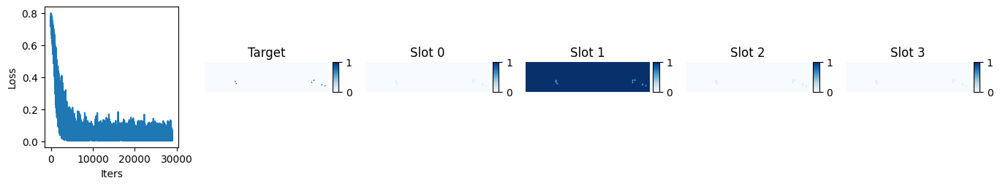

iter 29000 , loss 0.0054323487 , lr 5.2582792750472464e-05


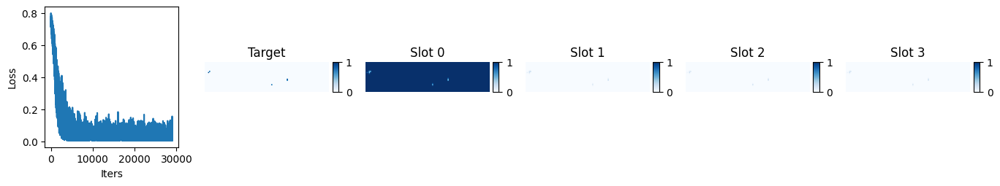

iter 29050 , loss 0.047070142 , lr 5.213562896201902e-05


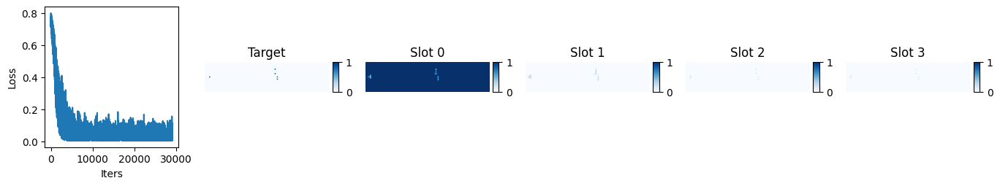

iter 29100 , loss 0.005742442 , lr 5.168997436323093e-05


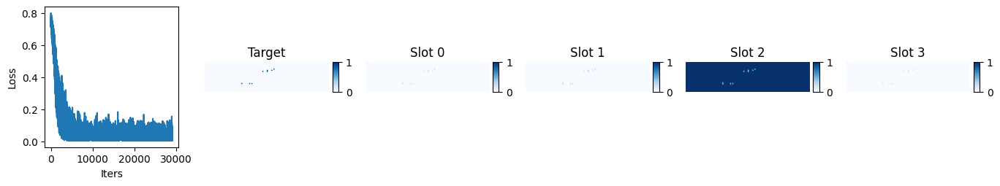

iter 29150 , loss 0.0060025794 , lr 5.124583582665347e-05


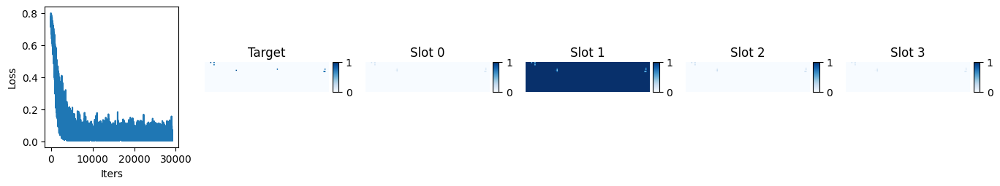

iter 29200 , loss 0.0055342307 , lr 5.080322020145224e-05


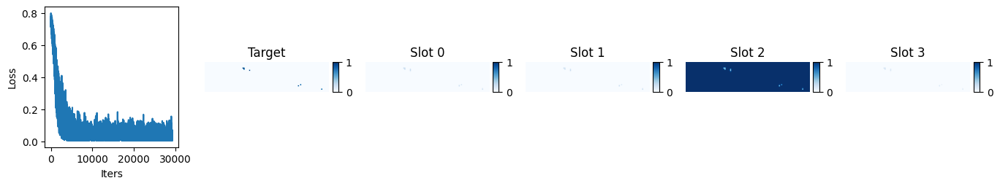

iter 29250 , loss 0.0051219207 , lr 5.036213431330773e-05


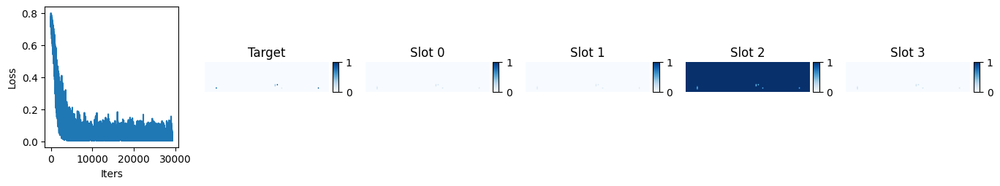

iter 29300 , loss 0.005095007 , lr 4.9922584964310065e-05


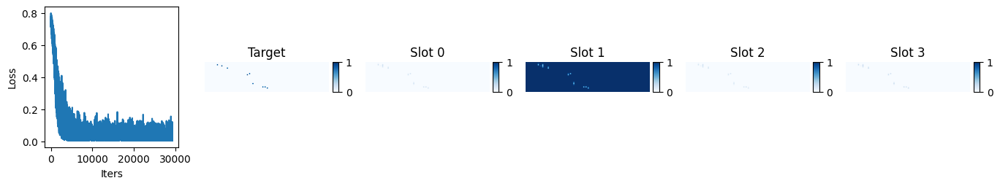

iter 29350 , loss 0.0059175347 , lr 4.9484578932853855e-05


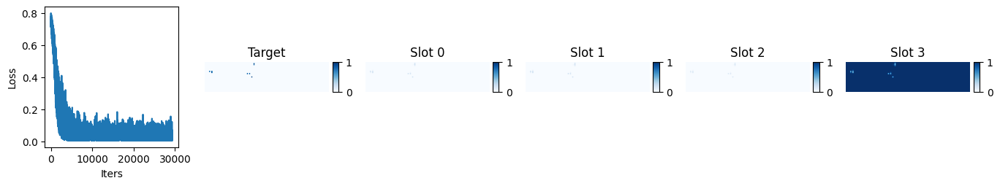

iter 29400 , loss 0.0052469773 , lr 4.9048122973534034e-05


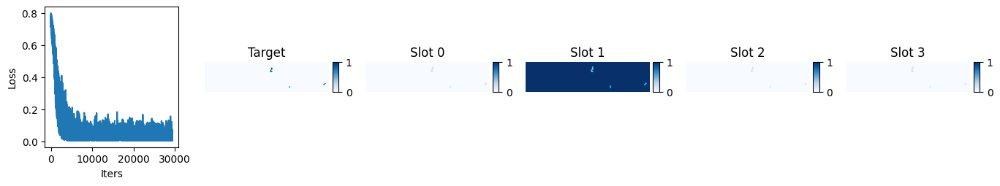

iter 29450 , loss 0.010837312 , lr 4.8613223817041307e-05


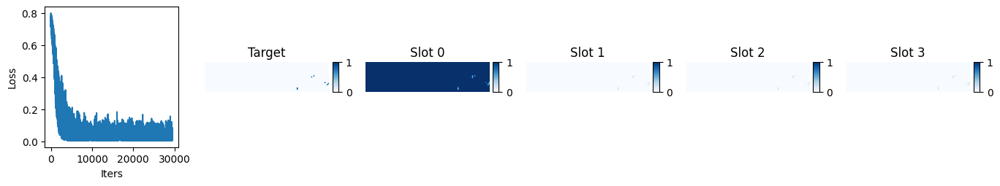

iter 29500 , loss 0.029329242 , lr 4.817988817005873e-05


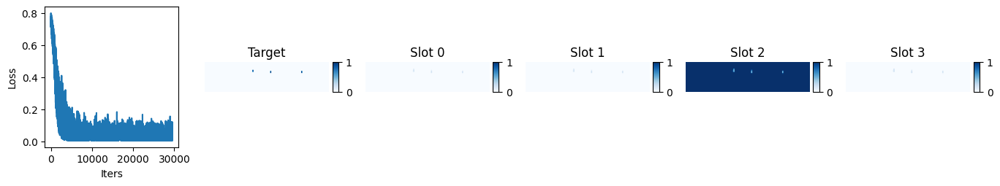

iter 29550 , loss 0.006721456 , lr 4.7748122715158074e-05


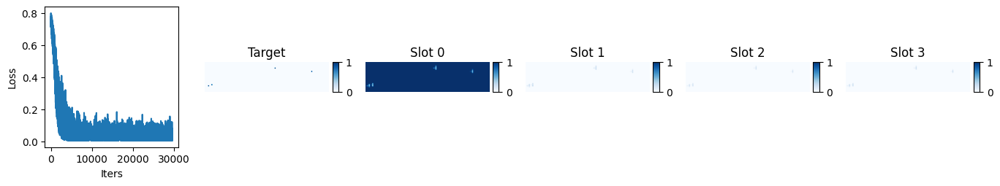

iter 29600 , loss 0.0059391614 , lr 4.7317934110696685e-05


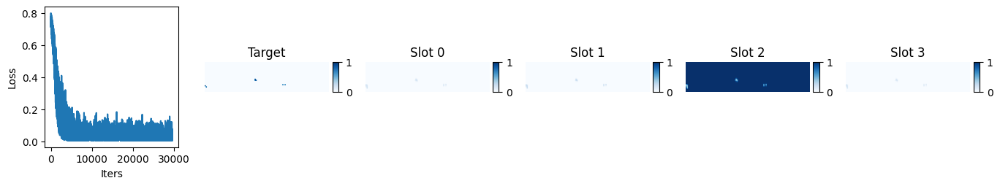

iter 29650 , loss 0.007022218 , lr 4.688932899071506e-05


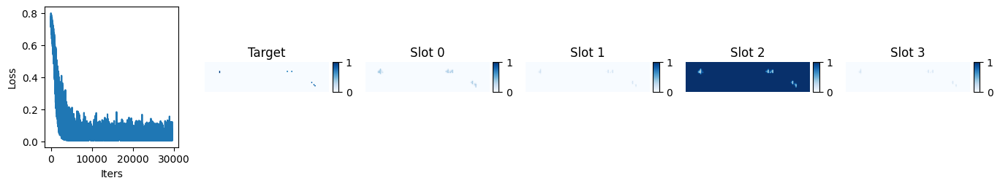

iter 29700 , loss 0.009644477 , lr 4.646231396483442e-05


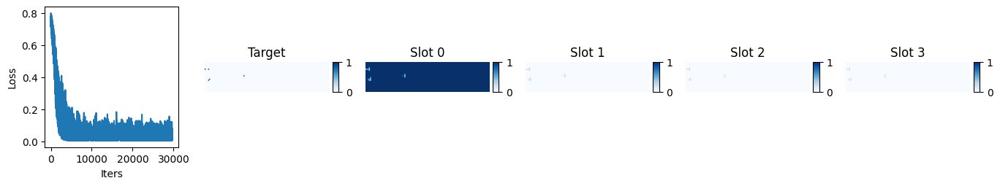

iter 29750 , loss 0.00888443 , lr 4.6036895618154636e-05


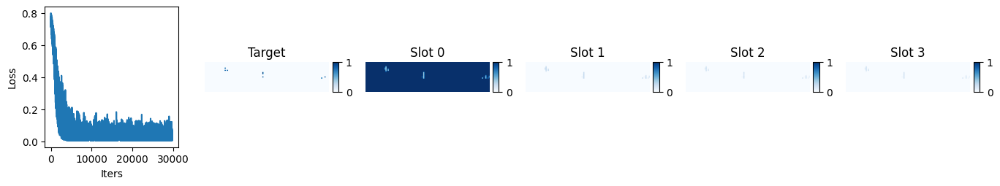

iter 29800 , loss 0.006828403 , lr 4.56130805111529e-05


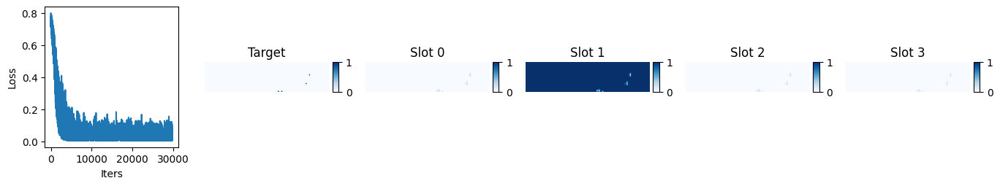

iter 29850 , loss 0.007511976 , lr 4.519087517958239e-05


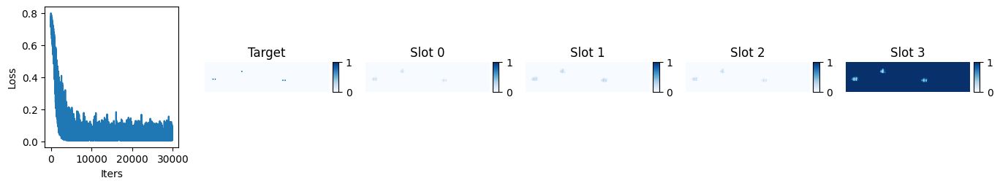

iter 29900 , loss 0.029971918 , lr 4.477028613437164e-05


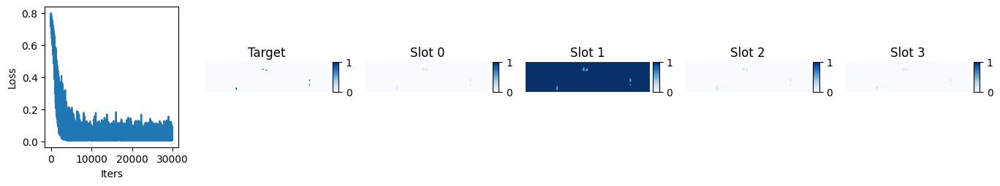

iter 29950 , loss 0.02055684 , lr 4.43513198615241e-05


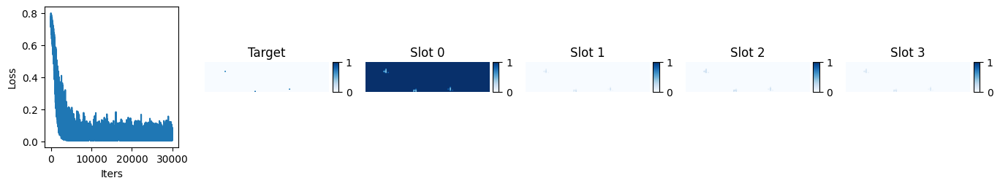

iter 30000 , loss 0.0064082104 , lr 4.3933982822017876e-05


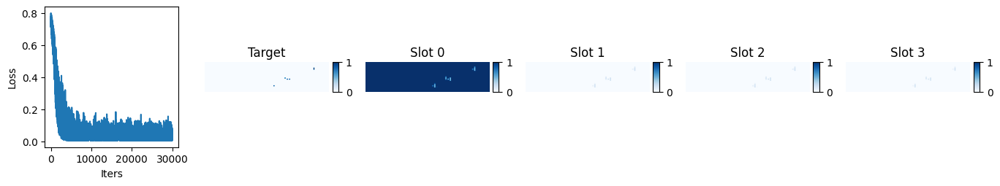

iter 30050 , loss 0.013379689 , lr 4.3518281451706477e-05


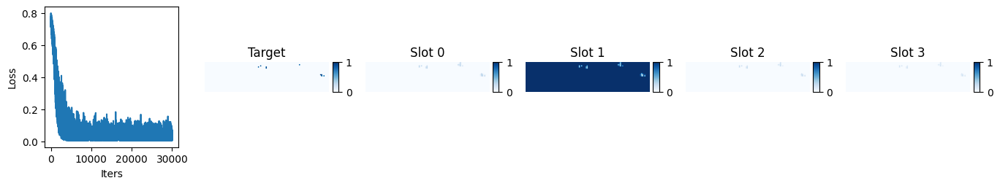

iter 30100 , loss 0.0066439086 , lr 4.3104222161219196e-05


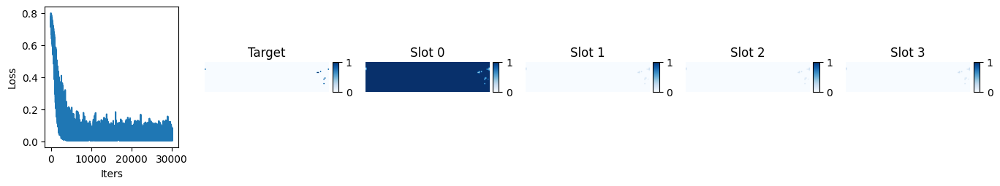

iter 30150 , loss 0.006184091 , lr 4.269181133586256e-05


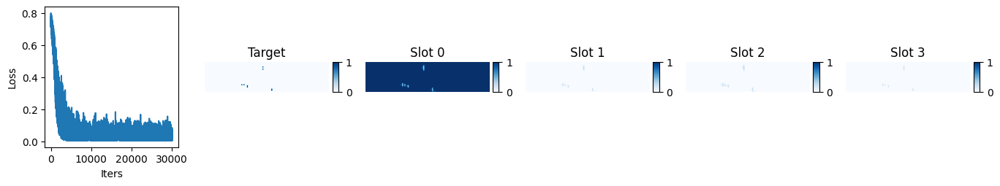

iter 30200 , loss 0.0062306854 , lr 4.228105533552169e-05


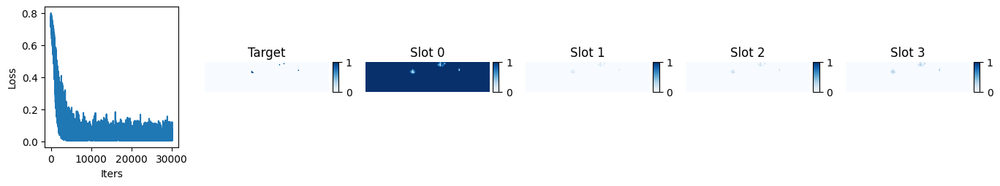

iter 30250 , loss 0.0067336285 , lr 4.1871960494562174e-05


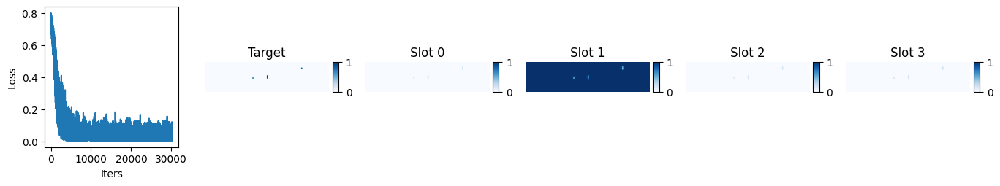

iter 30300 , loss 0.0052877055 , lr 4.146453312173258e-05


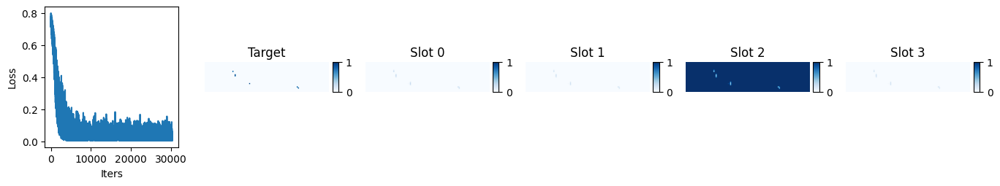

iter 30350 , loss 0.006574117 , lr 4.105877950006703e-05


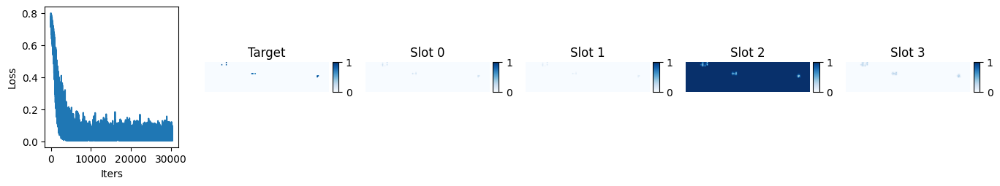

iter 30400 , loss 0.0049015195 , lr 4.0654705886788245e-05


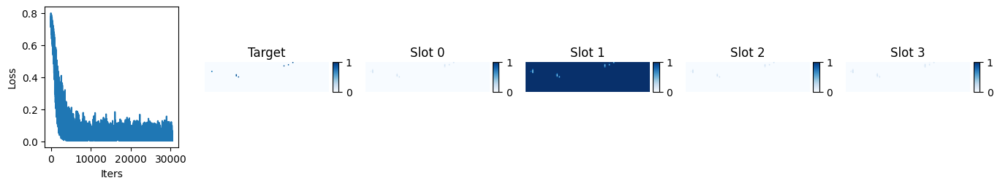

iter 30450 , loss 0.07103693 , lr 4.0252318513211296e-05


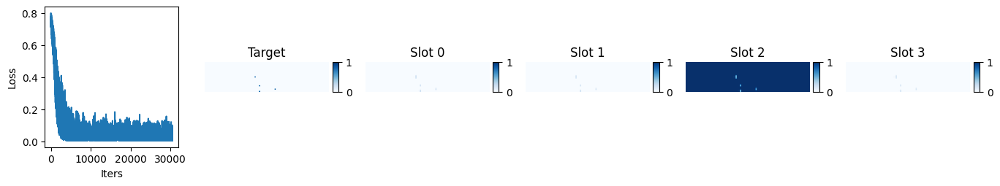

iter 30500 , loss 0.05763507 , lr 3.9851623584647144e-05


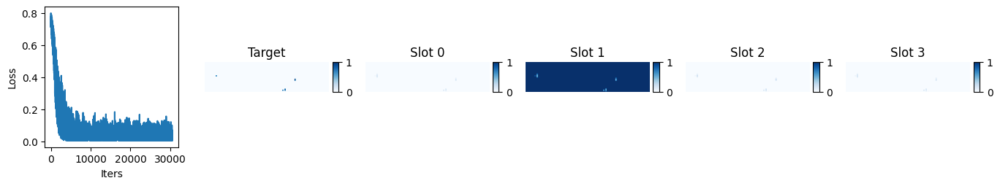

iter 30550 , loss 0.0047051716 , lr 3.945262728030739e-05


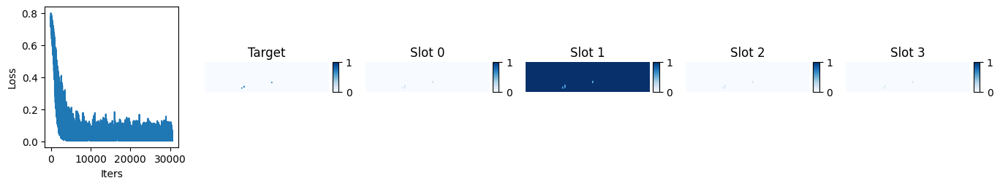

iter 30600 , loss 0.0057304893 , lr 3.905533575320858e-05


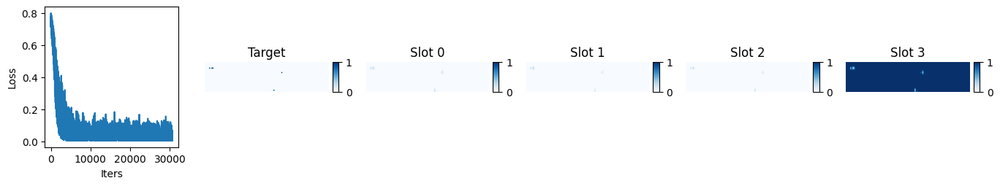

iter 30650 , loss 0.05641955 , lr 3.865975513007746e-05


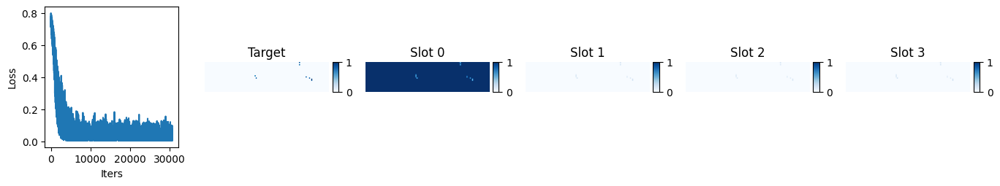

iter 30700 , loss 0.1197364 , lr 3.826589151125673e-05


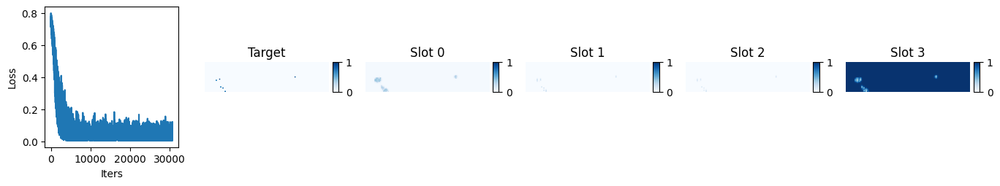

iter 30750 , loss 0.0056375954 , lr 3.787375097061051e-05


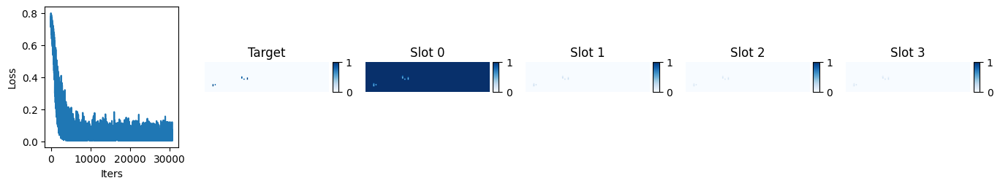

iter 30800 , loss 0.007722929 , lr 3.7483339555431055e-05


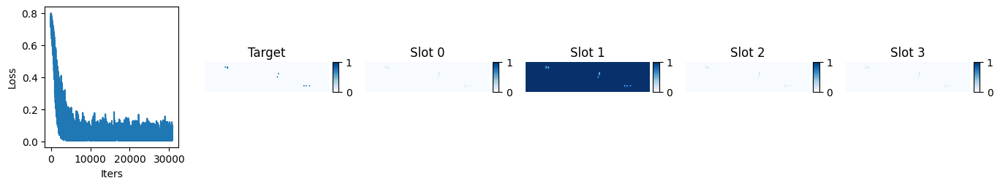

iter 30850 , loss 0.0073753293 , lr 3.709466328634545e-05


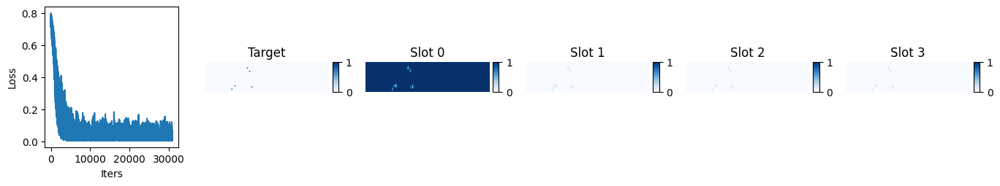

iter 30900 , loss 0.040906172 , lr 3.6707728157222465e-05


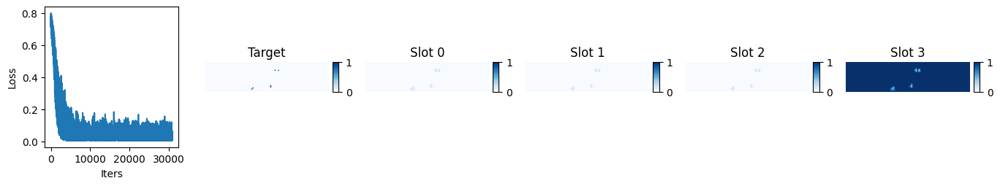

iter 30950 , loss 0.0058363657 , lr 3.6322540135080484e-05


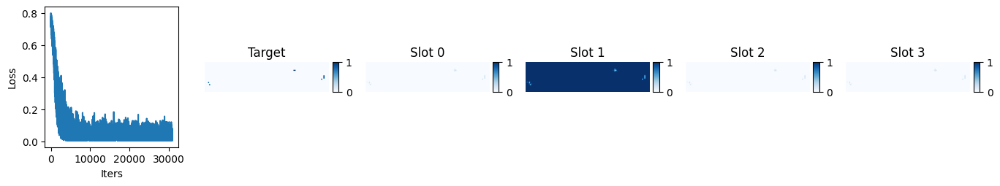

iter 31000 , loss 0.031176982 , lr 3.593910515999536e-05


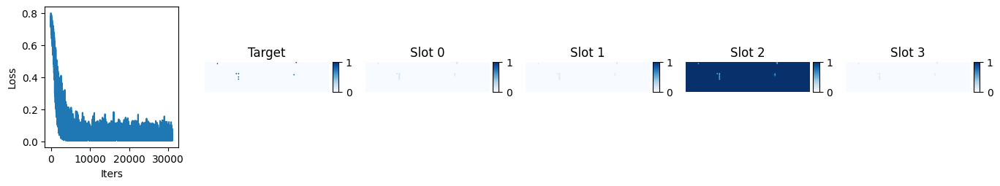

iter 31050 , loss 0.016456412 , lr 3.555742914500867e-05


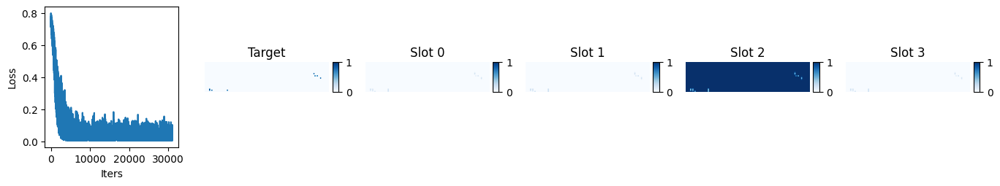

iter 31100 , loss 0.005325238 , lr 3.51775179760368e-05


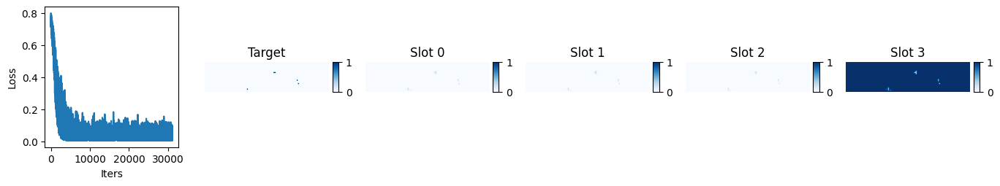

iter 31150 , loss 0.0067762616 , lr 3.479937751177982e-05


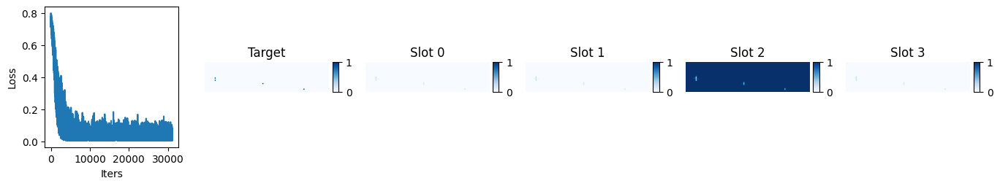

iter 31200 , loss 0.0052861455 , lr 3.4423013583631594e-05


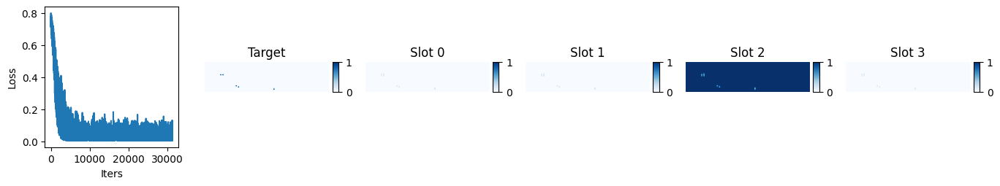

iter 31250 , loss 0.0129901655 , lr 3.404843199558945e-05


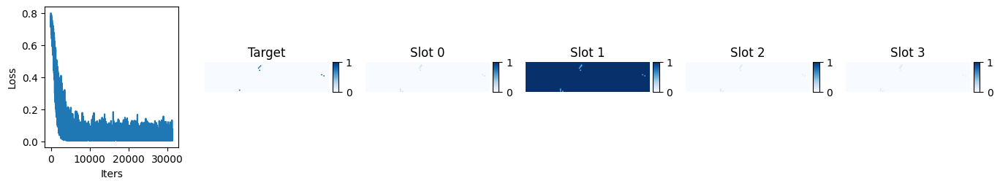

iter 31300 , loss 0.007570014 , lr 3.367563852416484e-05


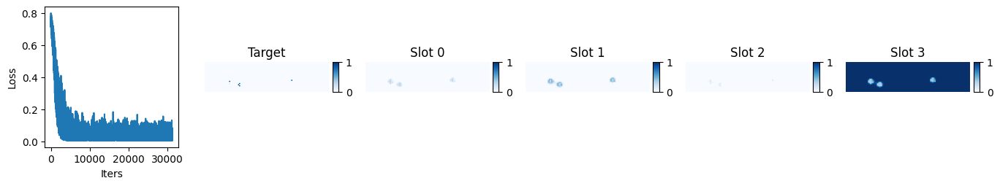

iter 31350 , loss 0.0057132603 , lr 3.330463891829427e-05


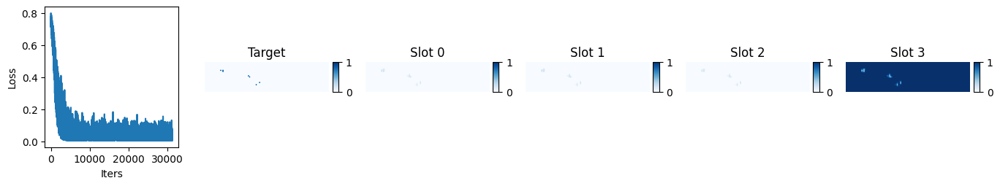

iter 31400 , loss 0.006801514 , lr 3.293543889925056e-05


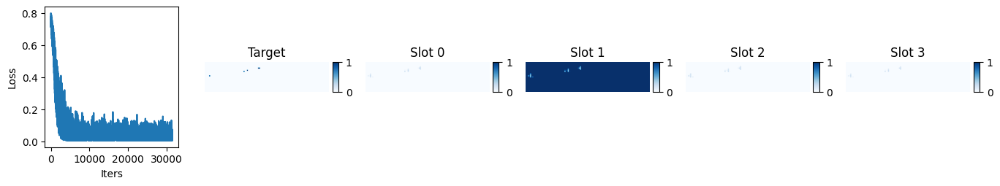

iter 31450 , loss 0.0052363584 , lr 3.2568044160554774e-05


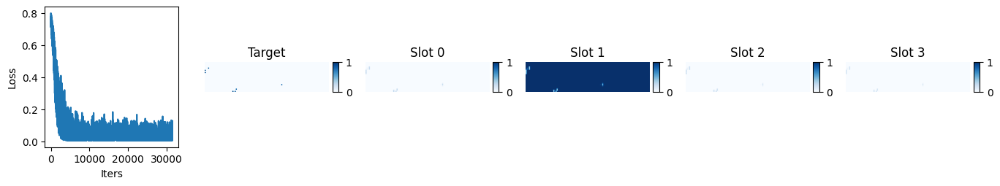

iter 31500 , loss 0.006446114 , lr 3.220246036788829e-05


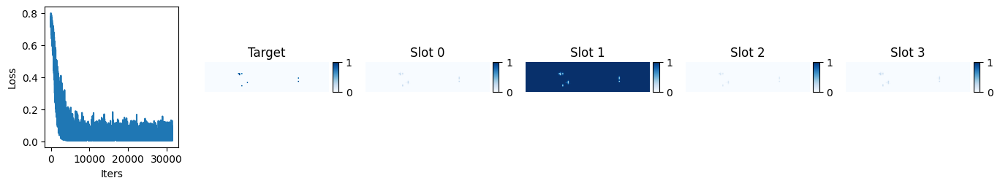

iter 31550 , loss 0.005717143 , lr 3.183869315900537e-05


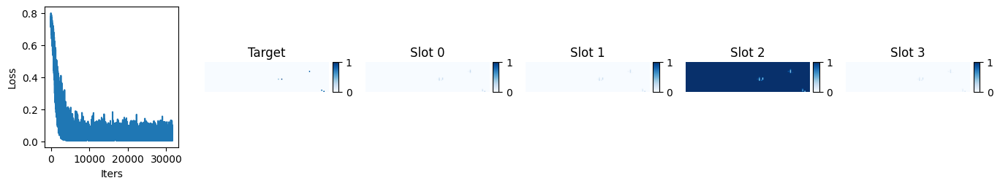

iter 31600 , loss 0.004742689 , lr 3.1476748143646435e-05


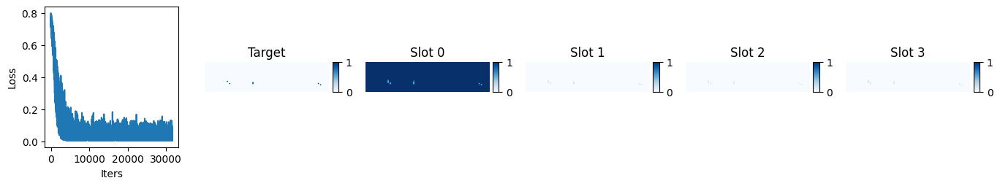

iter 31650 , loss 0.0048137037 , lr 3.111663090345139e-05


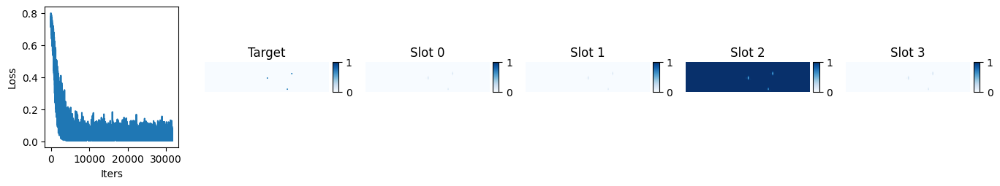

iter 31700 , loss 0.0058124787 , lr 3.075834699187349e-05


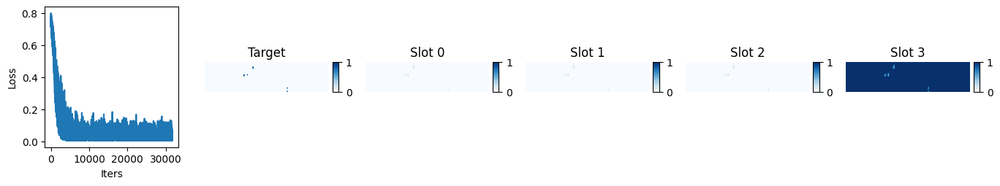

iter 31750 , loss 0.0067182286 , lr 3.040190193409395e-05


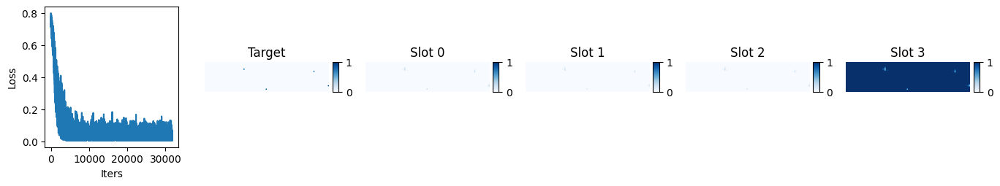

iter 31800 , loss 0.005540723 , lr 3.004730122693641e-05


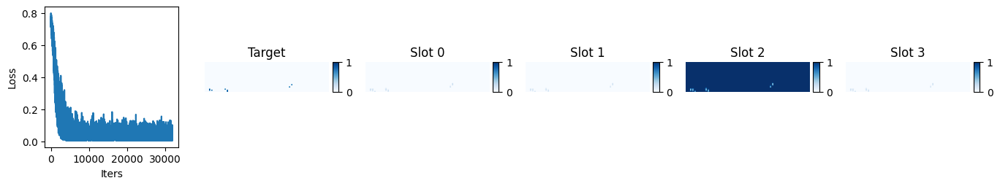

iter 31850 , loss 0.035638623 , lr 2.9694550338782515e-05


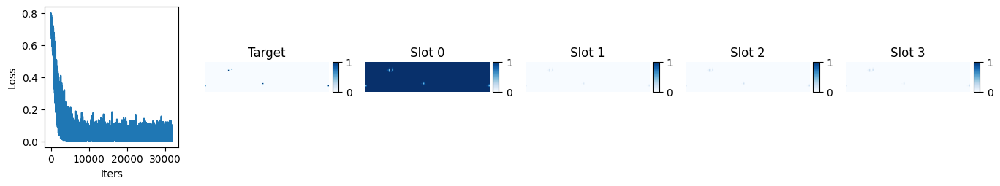

iter 31900 , loss 0.005762389 , lr 2.9343654709487325e-05


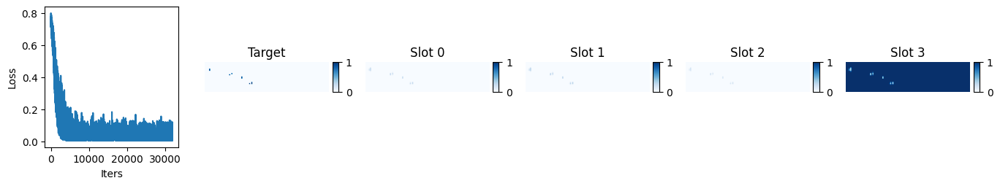

iter 31950 , loss 0.007432714 , lr 2.8994619750295476e-05


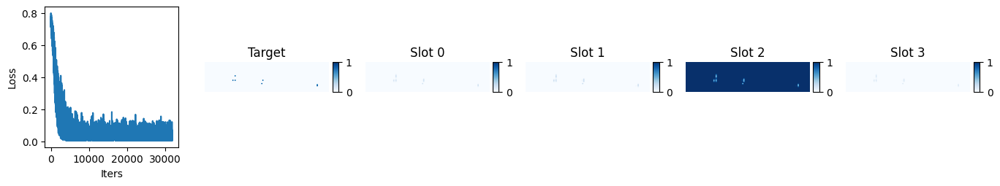

iter 32000 , loss 0.0071396427 , lr 2.8647450843757897e-05


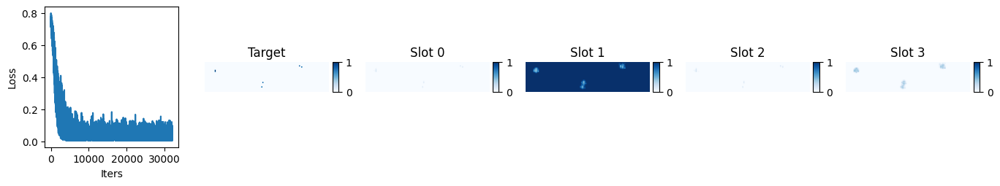

iter 32050 , loss 0.0073083076 , lr 2.8302153343648486e-05


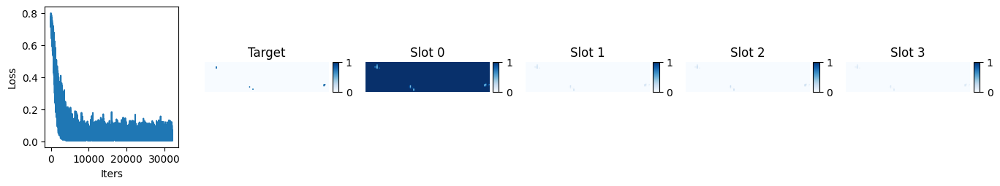

iter 32100 , loss 0.022111176 , lr 2.795873257488196e-05


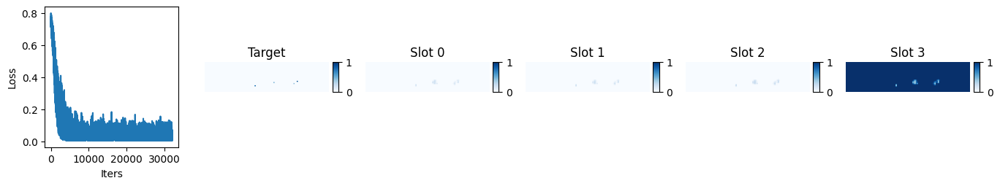

iter 32150 , loss 0.0047907373 , lr 2.7617193833431338e-05


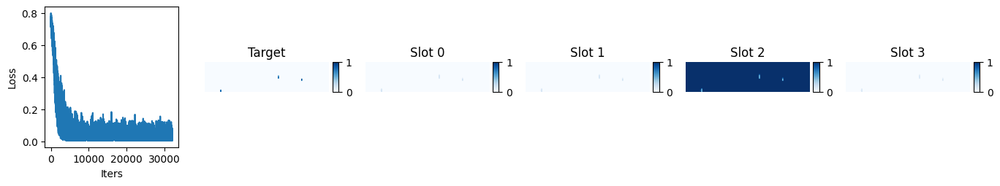

iter 32200 , loss 0.0056373156 , lr 2.7277542386246505e-05


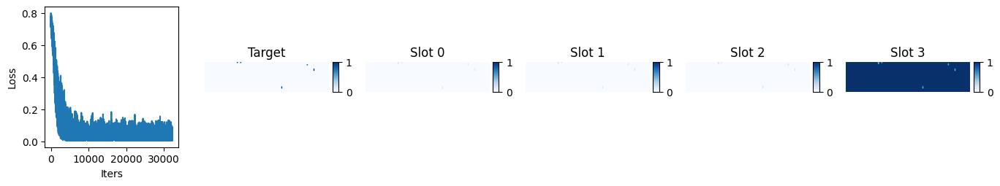

iter 32250 , loss 0.055250518 , lr 2.693978347117296e-05


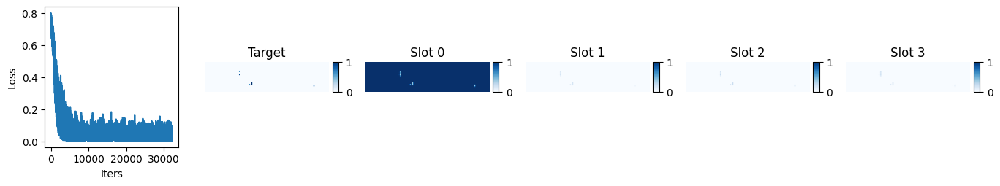

iter 32300 , loss 0.005584202 , lr 2.6603922296871043e-05


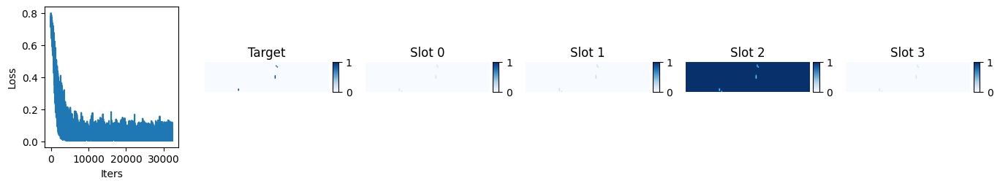

iter 32350 , loss 0.008054985 , lr 2.6269964042735488e-05


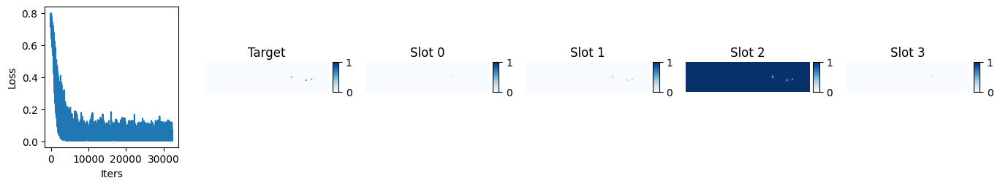

iter 32400 , loss 0.044968244 , lr 2.593791385881574e-05


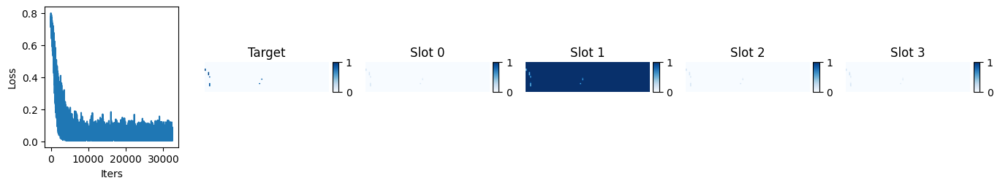

iter 32450 , loss 0.028285732 , lr 2.5607776865736363e-05


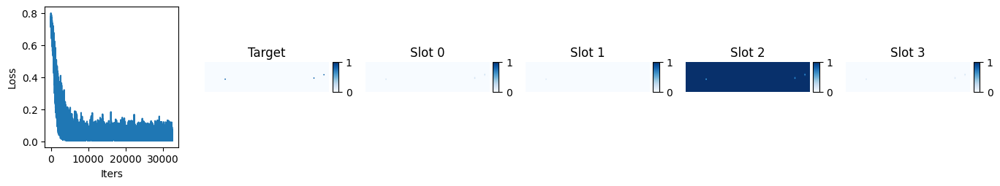

iter 32500 , loss 0.005585173 , lr 2.5279558154618197e-05


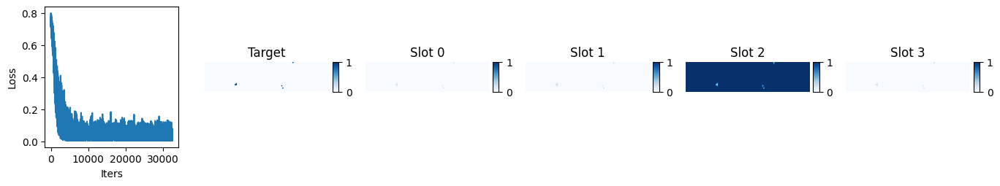

iter 32550 , loss 0.005221367 , lr 2.4953262786999846e-05


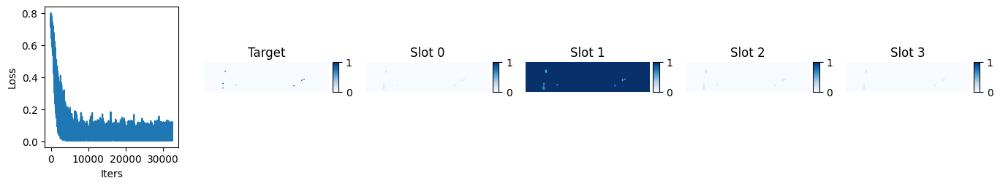

iter 32600 , loss 0.05642569 , lr 2.4628895794759458e-05


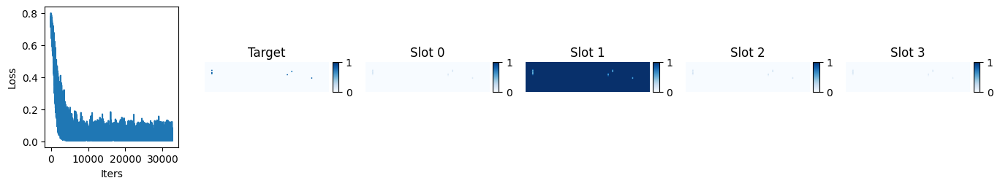

iter 32650 , loss 0.0055530844 , lr 2.4306462180037366e-05


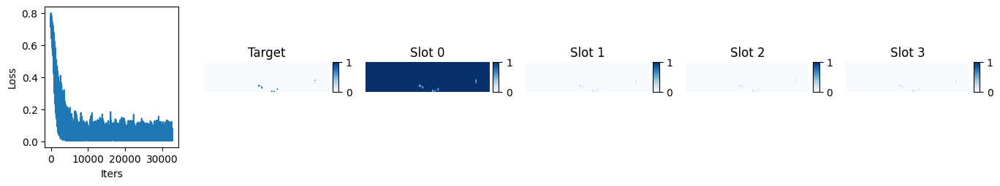

iter 32700 , loss 0.0059631197 , lr 2.398596691515871e-05


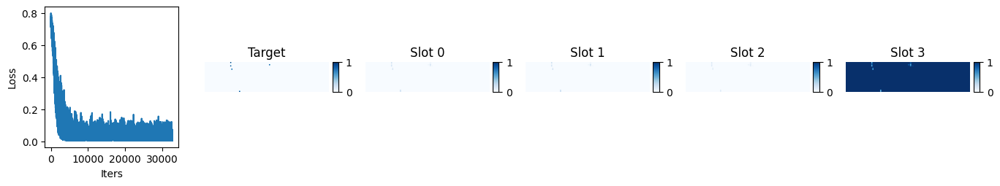

iter 32750 , loss 0.005314307 , lr 2.3667414942557e-05


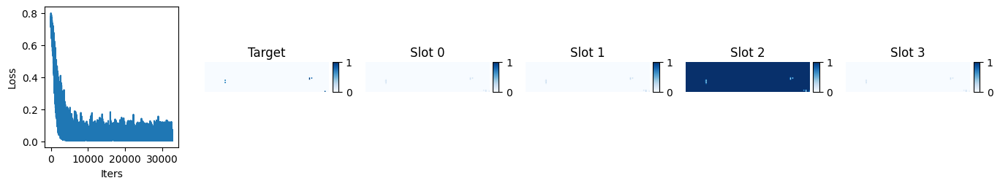

iter 32800 , loss 0.0057386984 , lr 2.3350811174697737e-05


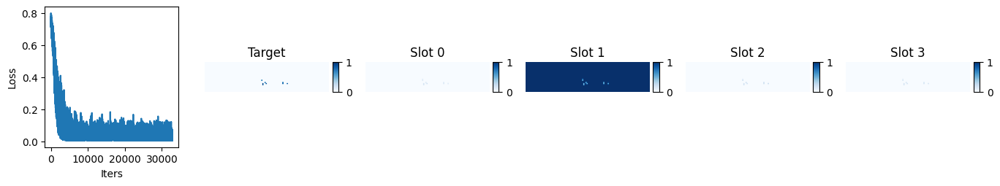

iter 32850 , loss 0.0046633566 , lr 2.3036160494002654e-05


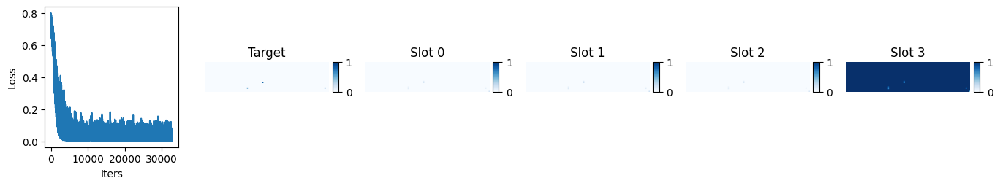

iter 32900 , loss 0.0049960124 , lr 2.272346775277446e-05


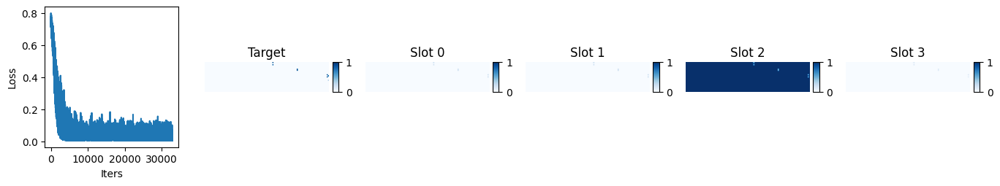

iter 32950 , loss 0.004989747 , lr 2.2412737773122087e-05


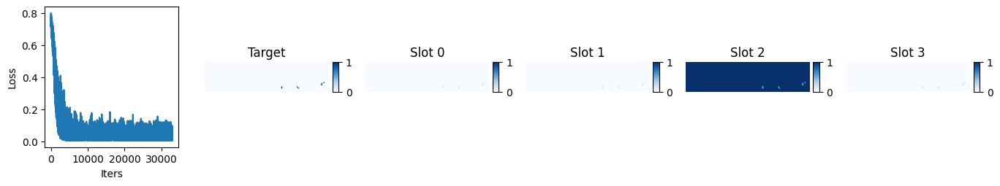

iter 33000 , loss 0.0046510156 , lr 2.210397534688617e-05


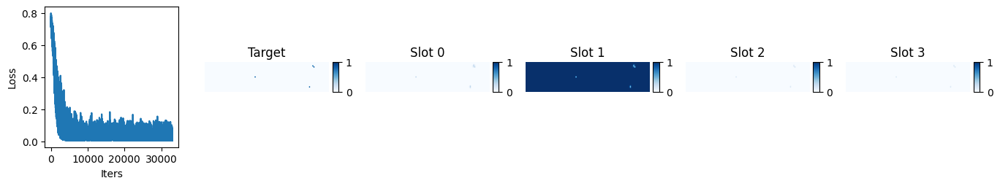

iter 33050 , loss 0.044227455 , lr 2.1797185235565346e-05


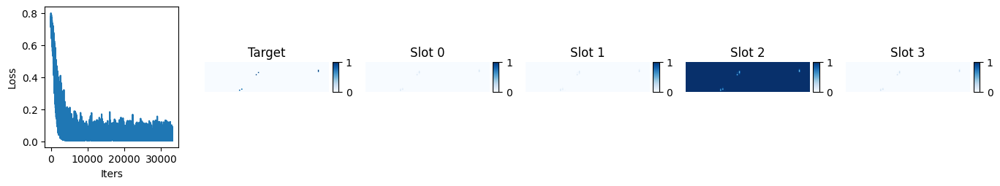

iter 33100 , loss 0.026748443 , lr 2.1492372170242568e-05


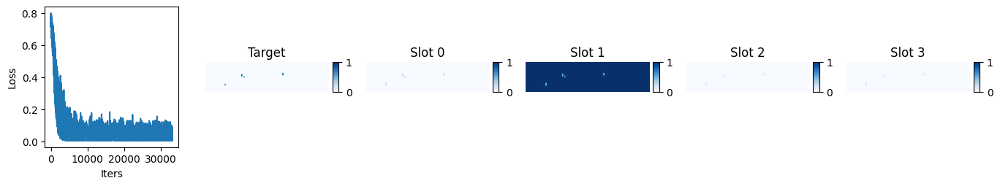

iter 33150 , loss 0.069342785 , lr 2.1189540851512417e-05


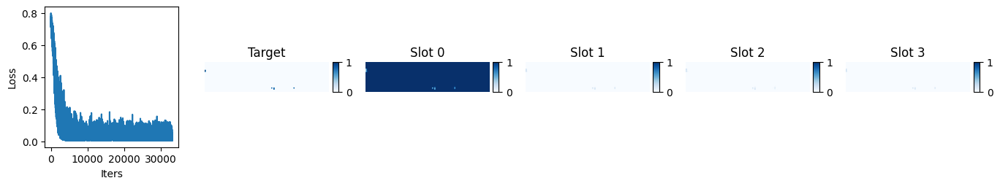

iter 33200 , loss 0.039667588 , lr 2.0888695949408468e-05


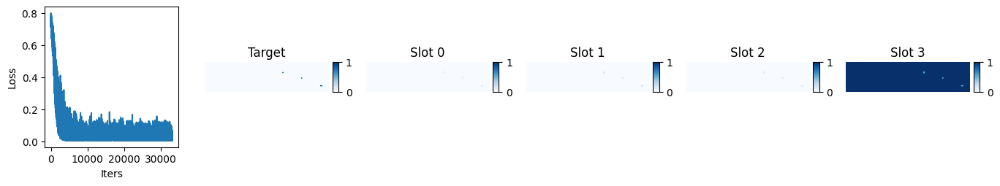

iter 33250 , loss 0.0073762243 , lr 2.0589842103331222e-05


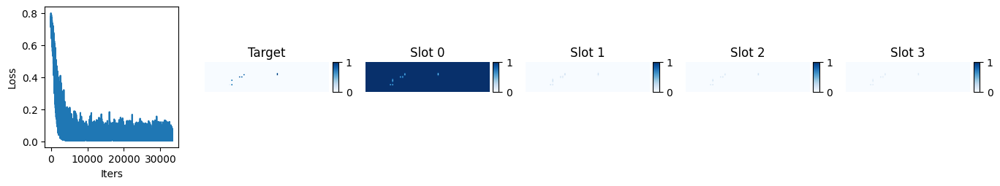

iter 33300 , loss 0.004196652 , lr 2.0292983921976753e-05


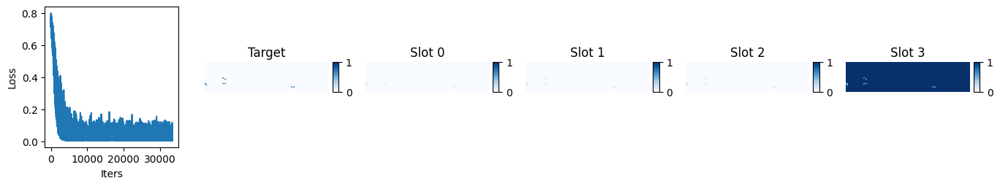

iter 33350 , loss 0.0041326424 , lr 1.9998125983265386e-05


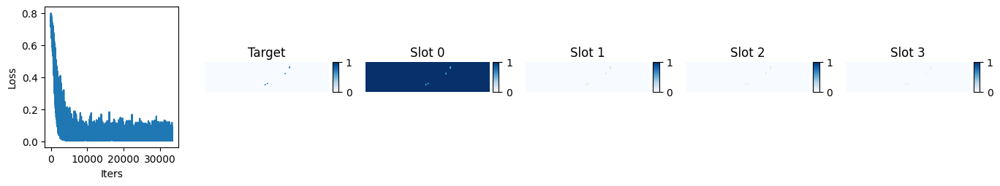

iter 33400 , loss 0.0054608285 , lr 1.97052728342713e-05


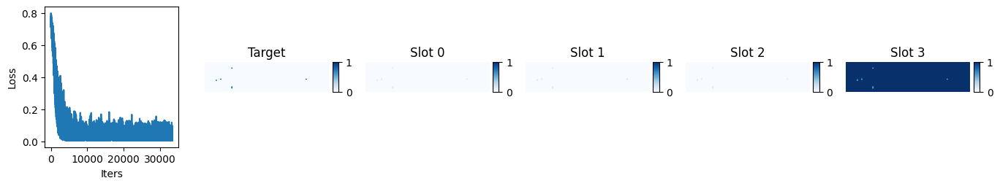

iter 33450 , loss 0.036278393 , lr 1.9414428991152386e-05


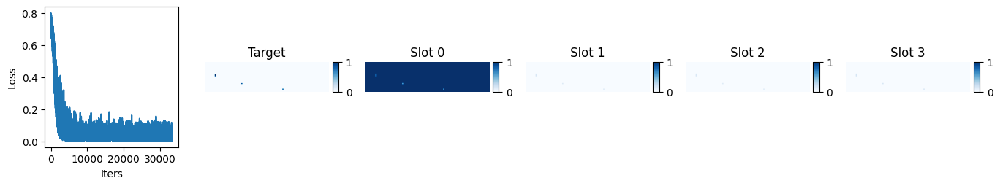

iter 33500 , loss 0.003994132 , lr 1.912559893908042e-05


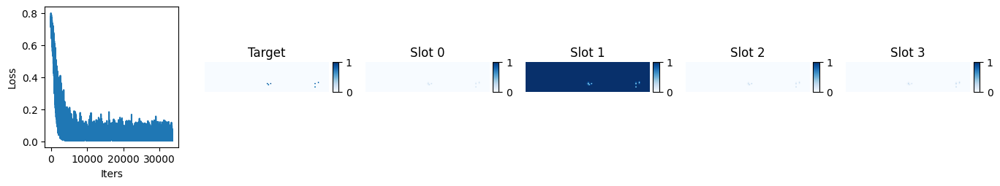

iter 33550 , loss 0.020066893 , lr 1.8838787132172184e-05


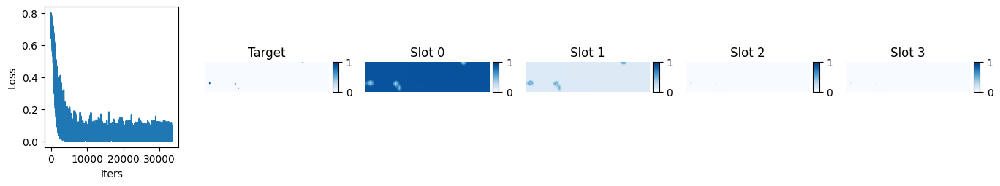

iter 33600 , loss 0.005041864 , lr 1.855399799342046e-05


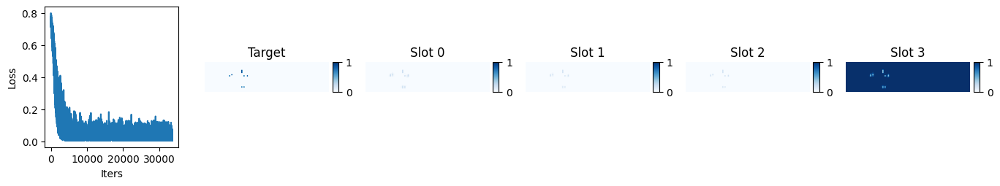

iter 33650 , loss 0.05249763 , lr 1.8271235914626144e-05


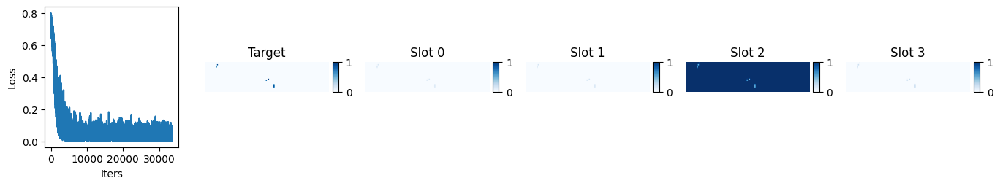

iter 33700 , loss 0.0049795103 , lr 1.799050525633024e-05


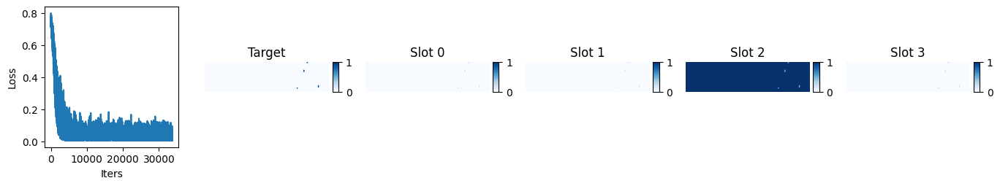

iter 33750 , loss 0.004856541 , lr 1.7711810347746757e-05


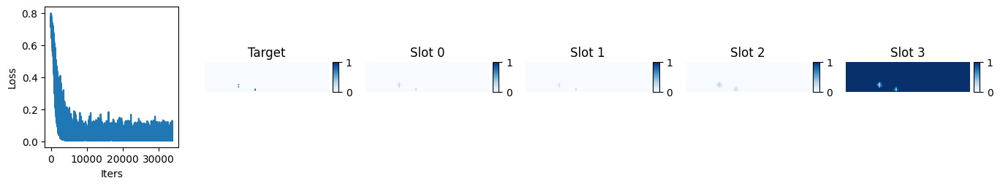

iter 33800 , loss 0.043231077 , lr 1.743515548669598e-05


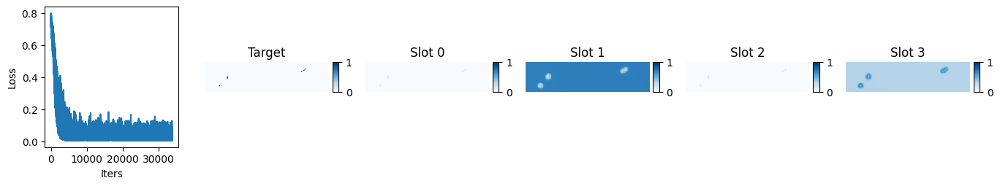

iter 33850 , loss 0.0048339833 , lr 1.716054493953815e-05


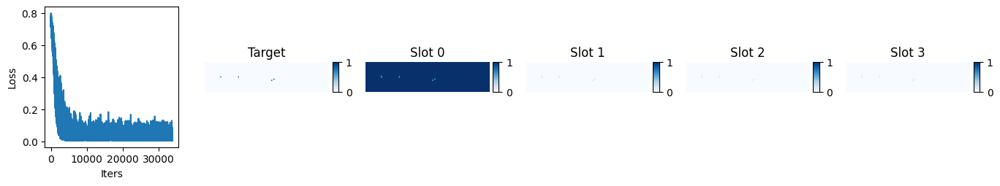

iter 33900 , loss 0.0053960164 , lr 1.6887982941107526e-05


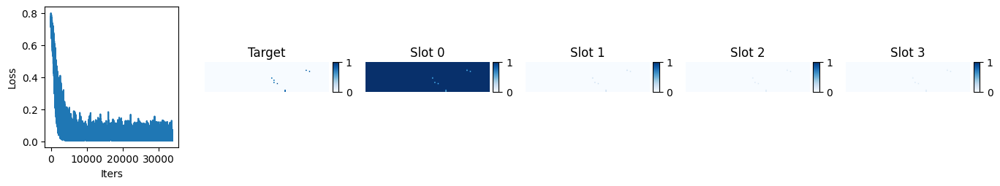

iter 33950 , loss 0.0042557376 , lr 1.6617473694647354e-05


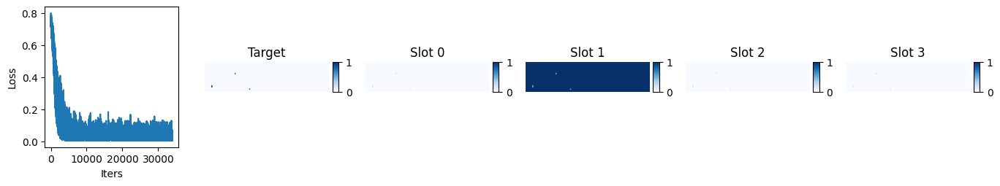

iter 34000 , loss 0.05053381 , lr 1.634902137174483e-05


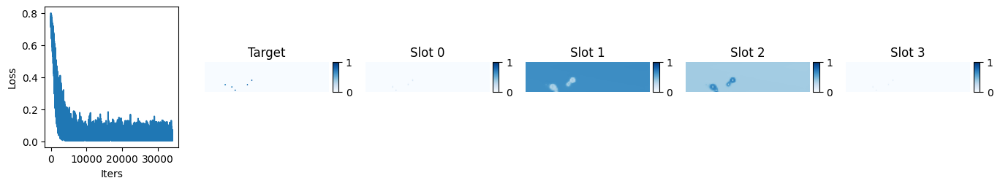

iter 34050 , loss 0.008757594 , lr 1.6082630112266854e-05


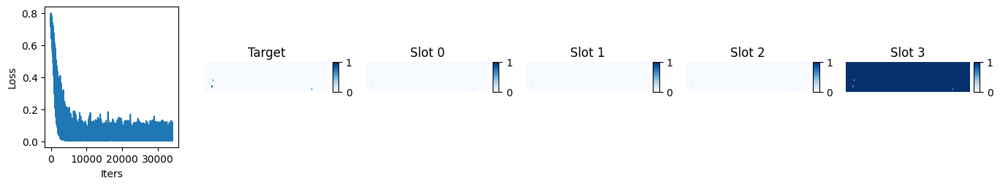

iter 34100 , loss 0.004509269 , lr 1.5818304024296247e-05


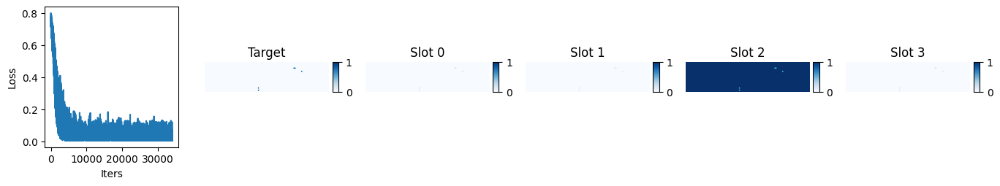

iter 34150 , loss 0.0063140295 , lr 1.5556047184068194e-05


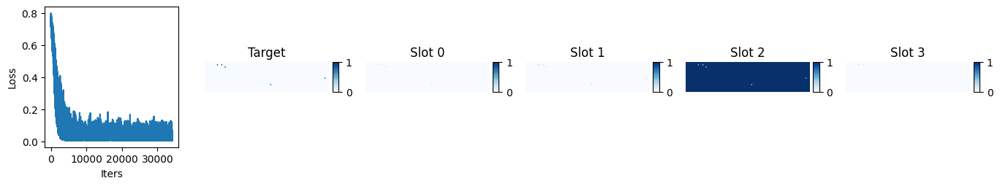

iter 34200 , loss 0.005732582 , lr 1.5295863635907667e-05


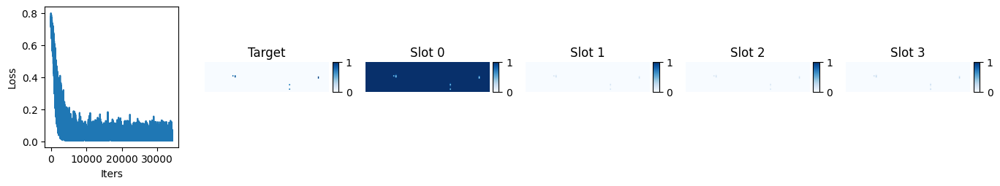

iter 34250 , loss 0.010357019 , lr 1.5037757392166772e-05


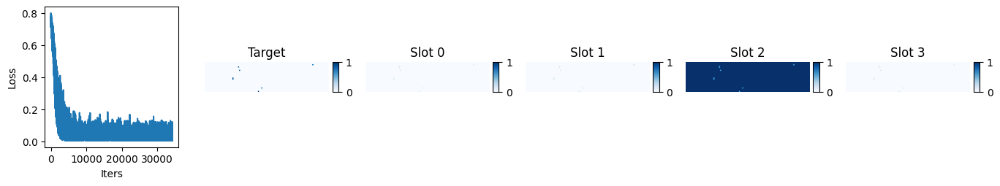

iter 34300 , loss 0.0201627 , lr 1.4781732433163129e-05


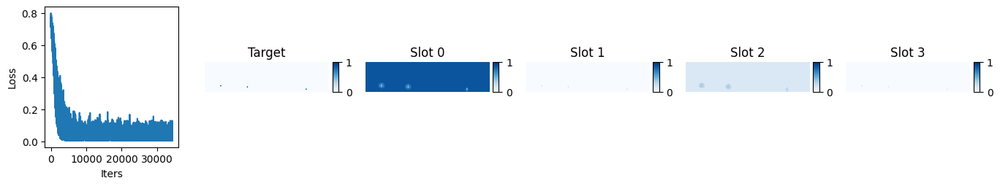

iter 34350 , loss 0.004345663 , lr 1.452779270711834e-05


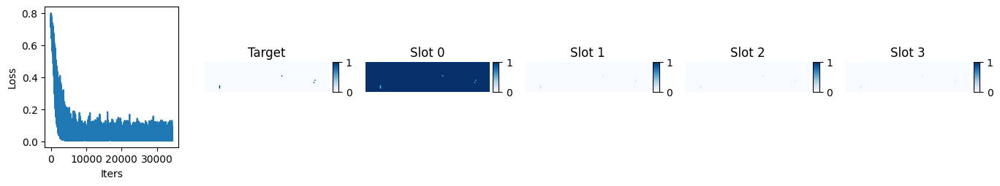

iter 34400 , loss 0.0064833765 , lr 1.4275942130097096e-05


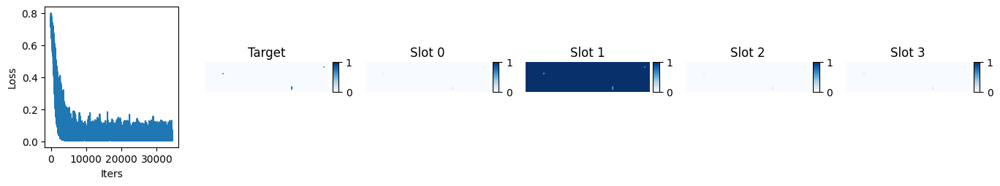

iter 34450 , loss 0.02428346 , lr 1.4026184585946804e-05


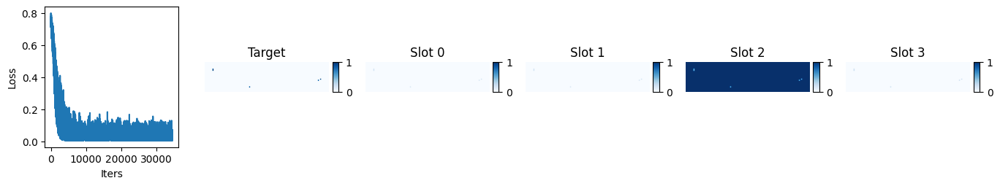

iter 34500 , loss 0.0047762925 , lr 1.3778523926237827e-05


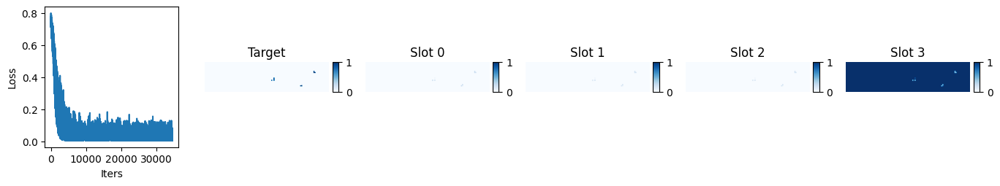

iter 34550 , loss 0.003993855 , lr 1.3532963970203848e-05


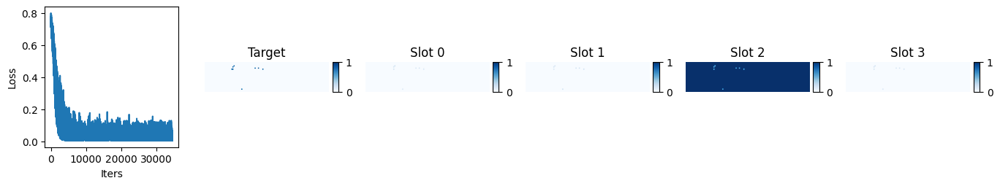

iter 34600 , loss 0.0068854913 , lr 1.3289508504683239e-05


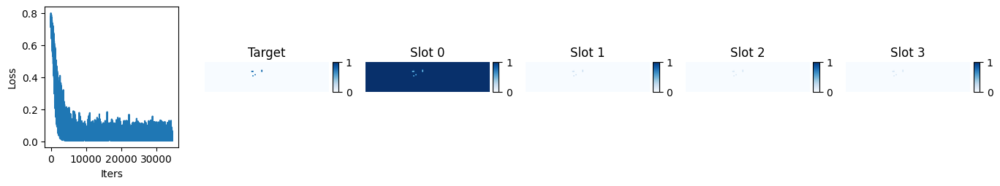

iter 34650 , loss 0.0060418597 , lr 1.3048161284060354e-05


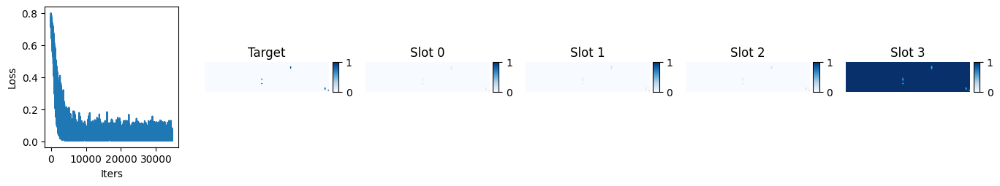

iter 34700 , loss 0.0042944117 , lr 1.2808926030207956e-05


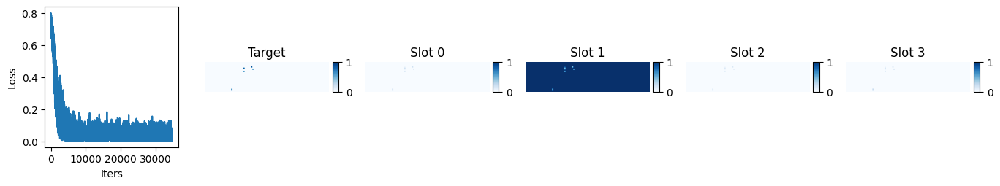

iter 34750 , loss 0.04221524 , lr 1.257180643242962e-05


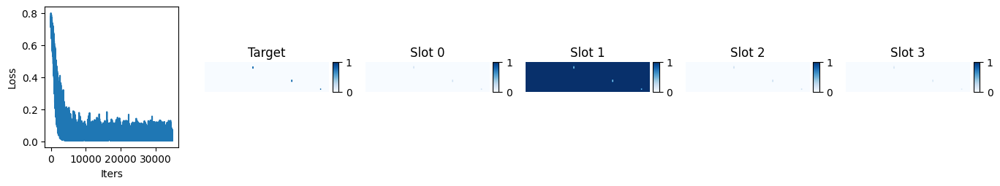

iter 34800 , loss 0.004592497 , lr 1.2336806147402828e-05


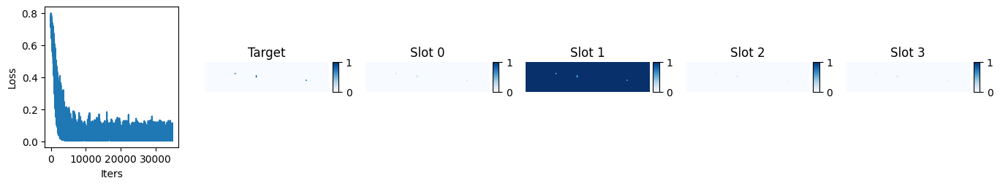

iter 34850 , loss 0.0059579755 , lr 1.210392879912273e-05


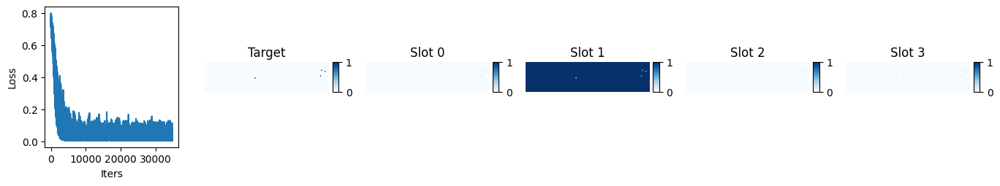

iter 34900 , loss 0.0068707163 , lr 1.1873177978846072e-05


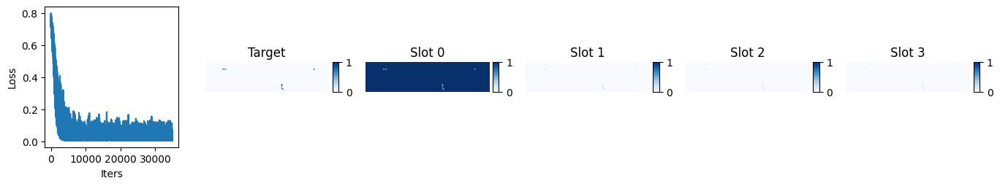

iter 34950 , loss 0.0064586424 , lr 1.1644557245035974e-05


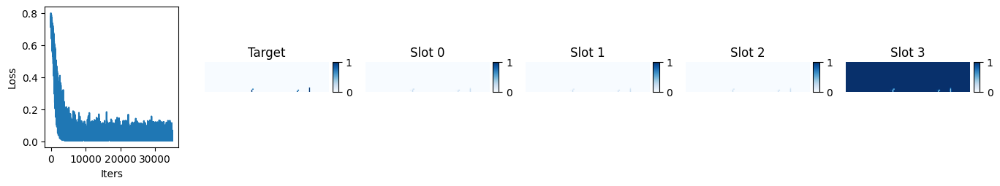

iter 35000 , loss 0.0049571022 , lr 1.1418070123306989e-05


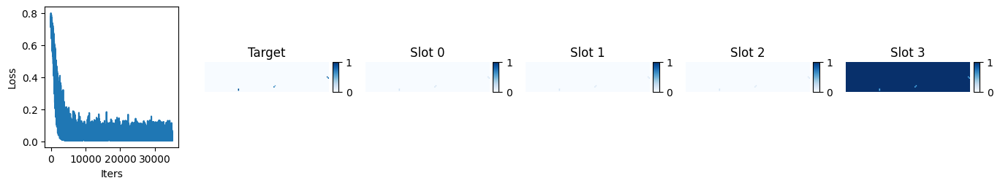

iter 35050 , loss 0.066675685 , lr 1.1193720106370684e-05


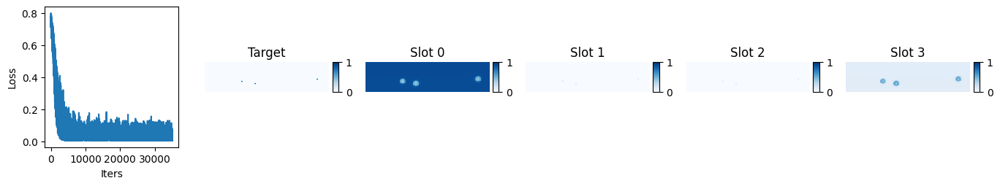

iter 35100 , loss 0.0064362916 , lr 1.097151065398188e-05


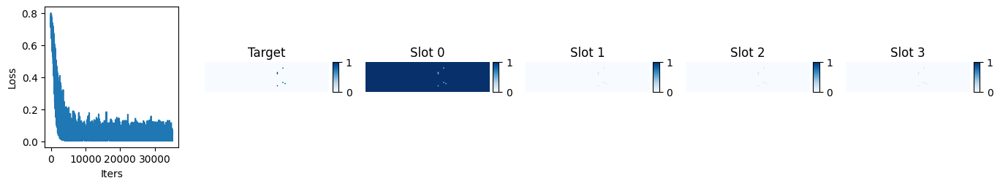

iter 35150 , loss 0.004396389 , lr 1.0751445192885194e-05


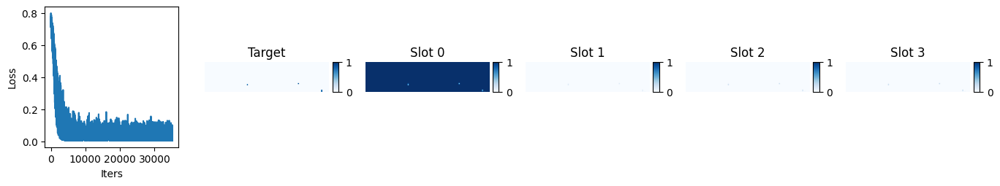

iter 35200 , loss 0.041635644 , lr 1.0533527116762296e-05


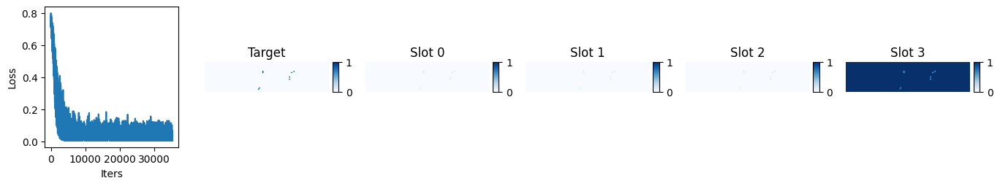

iter 35250 , loss 0.0061813616 , lr 1.0317759786179497e-05


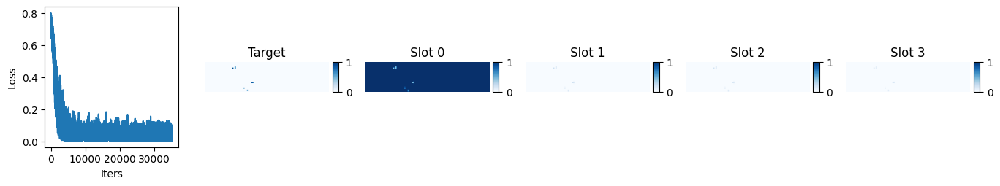

iter 35300 , loss 0.0063749305 , lr 1.01041465285359e-05


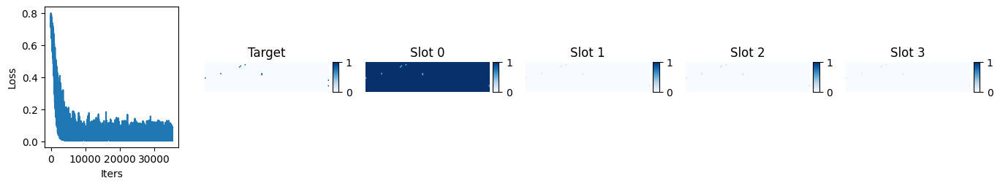

iter 35350 , loss 0.0052765906 , lr 9.892690638012218e-06


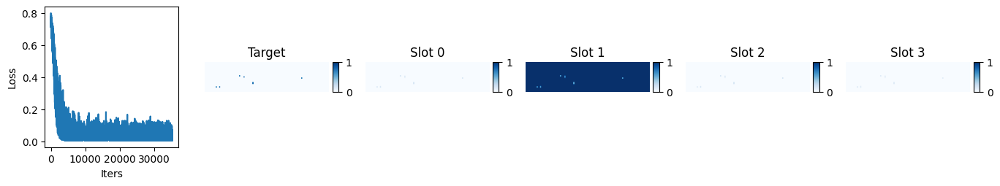

iter 35400 , loss 0.012168734 , lr 9.683395375519908e-06


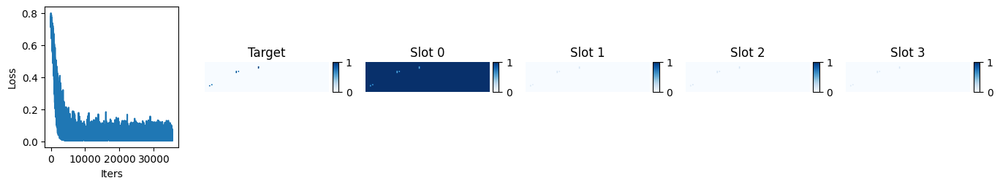

iter 35450 , loss 0.0053180084 , lr 9.476263968650783e-06


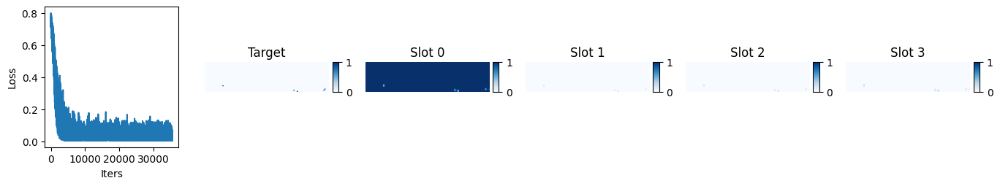

iter 35500 , loss 0.010228049 , lr 9.271299611627391e-06


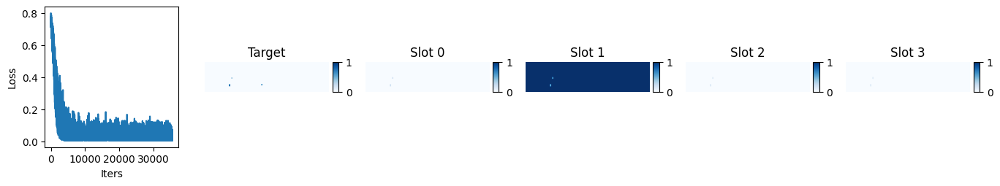

iter 35550 , loss 0.009340915 , lr 9.068505465253656e-06


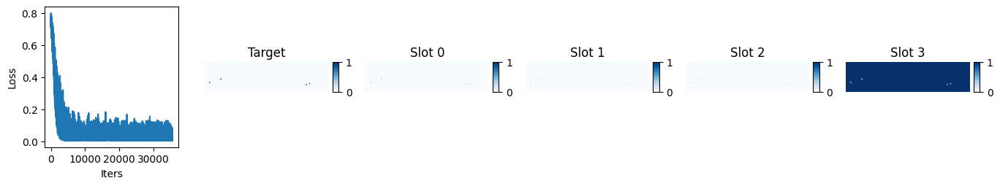

iter 35600 , loss 0.0044526 , lr 8.867884656866181e-06


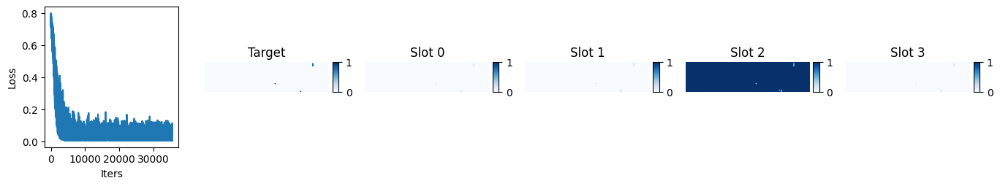

iter 35650 , loss 0.004240611 , lr 8.669440280286033e-06


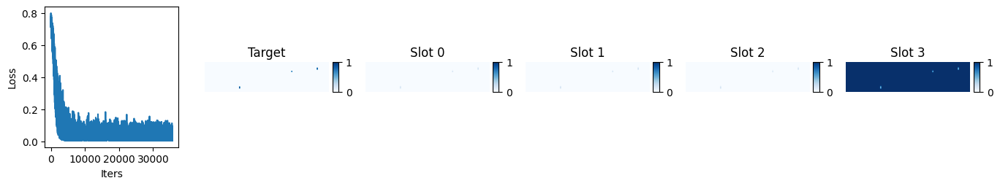

iter 35700 , loss 0.0036831337 , lr 8.47317539577096e-06


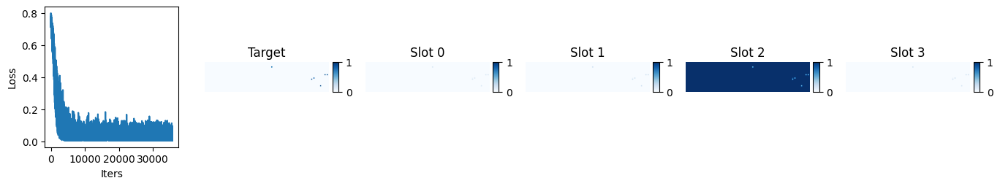

iter 35750 , loss 0.0065094344 , lr 8.279093029968293e-06


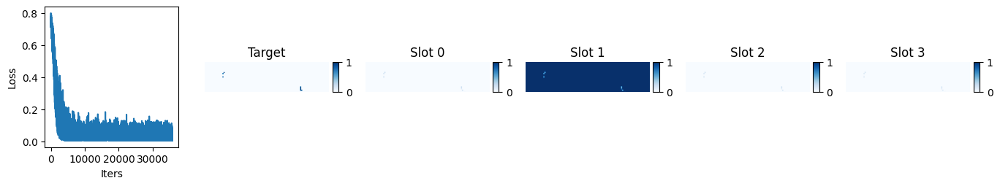

iter 35800 , loss 0.039740607 , lr 8.087196175868204e-06


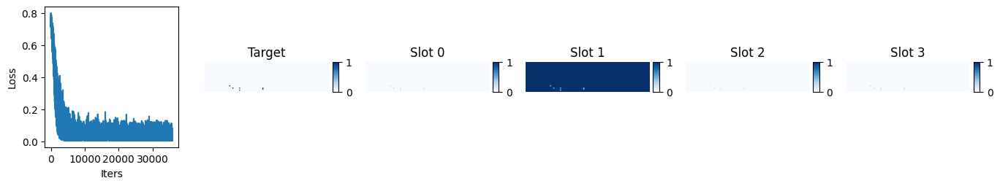

iter 35850 , loss 0.0051899375 , lr 7.897487792757546e-06


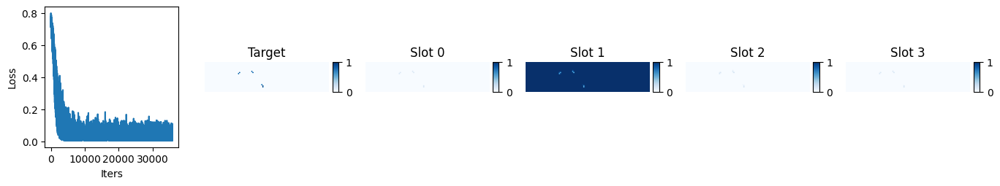

iter 35900 , loss 0.0053964434 , lr 7.70997080617431e-06


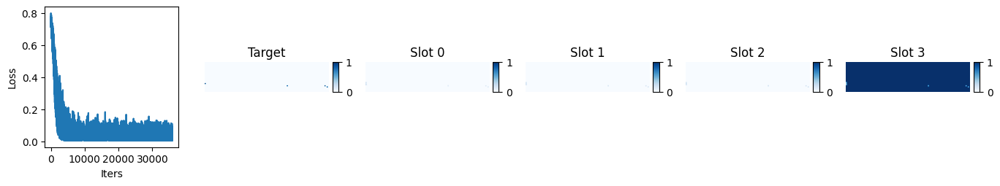

iter 35950 , loss 0.0056870524 , lr 7.5246481078623745e-06


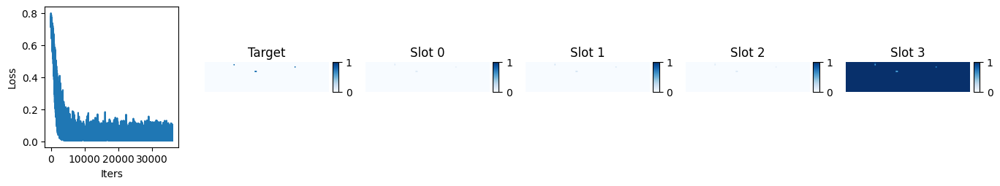

iter 36000 , loss 0.004326776 , lr 7.34152255572697e-06


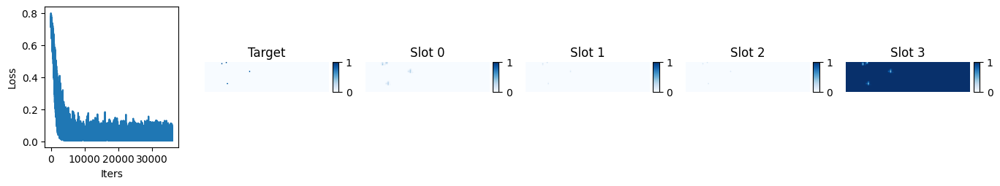

iter 36050 , loss 0.023562282 , lr 7.160596973790711e-06


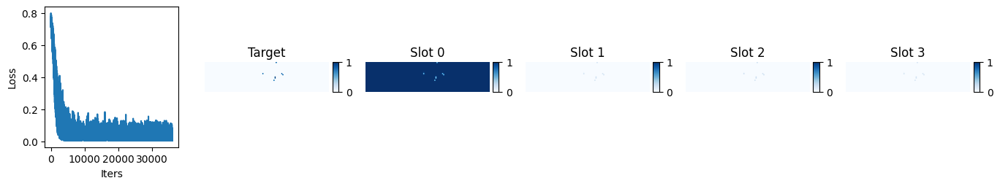

iter 36100 , loss 0.0069370023 , lr 6.981874152149819e-06


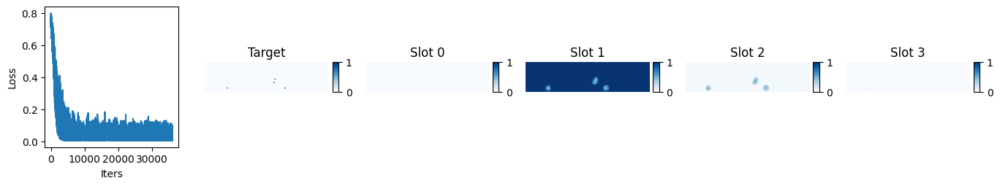

iter 36150 , loss 0.0051823957 , lr 6.805356846931354e-06


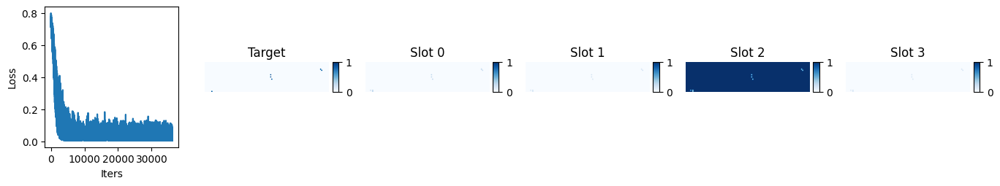

iter 36200 , loss 0.008082659 , lr 6.631047780250481e-06


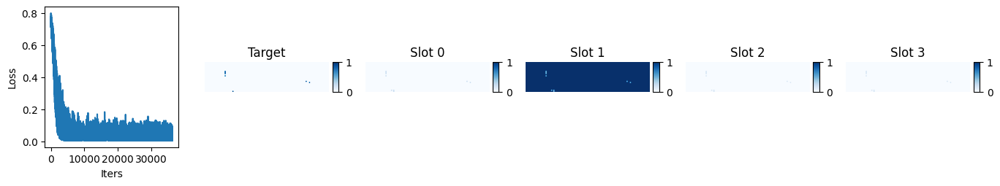

iter 36250 , loss 0.004681937 , lr 6.458949640168675e-06


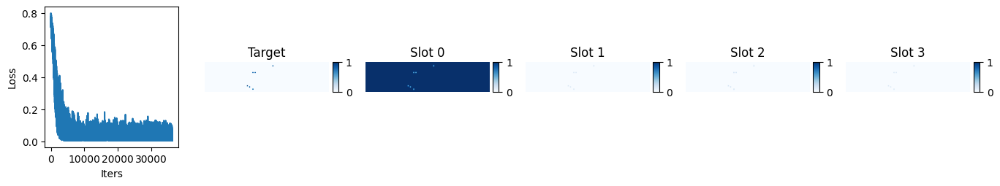

iter 36300 , loss 0.006570156 , lr 6.289065080652134e-06


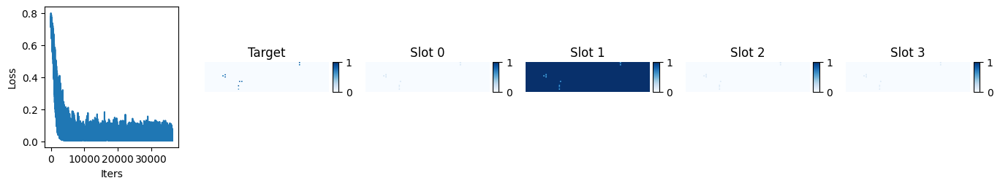

iter 36350 , loss 0.010286474 , lr 6.121396721530908e-06


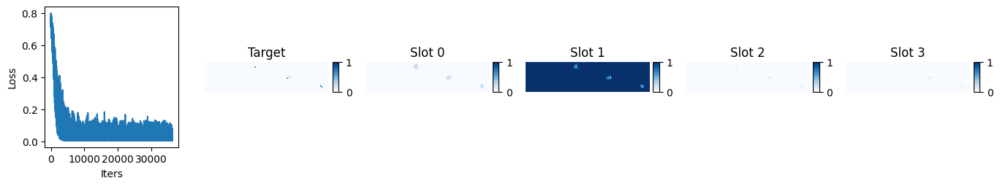

iter 36400 , loss 0.004158987 , lr 5.95594714845854e-06


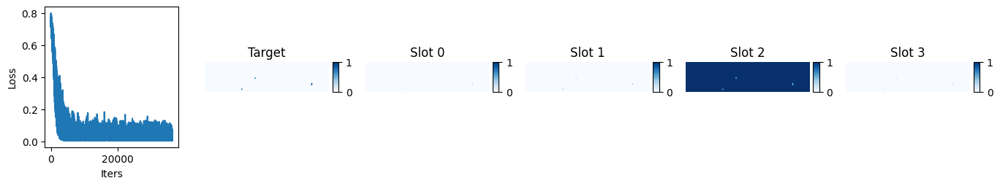

iter 36450 , loss 0.0076417727 , lr 5.792718912872107e-06


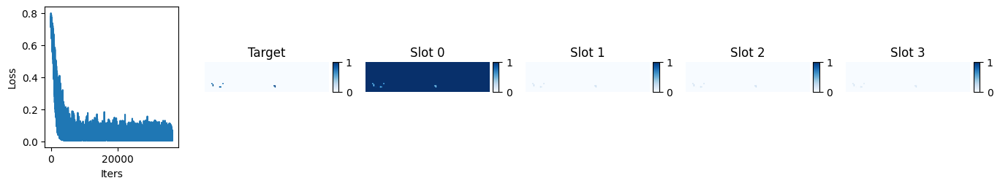

iter 36500 , loss 0.02678519 , lr 5.631714531952908e-06


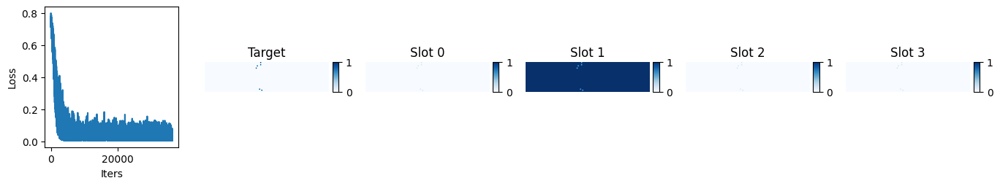

iter 36550 , loss 0.0064860824 , lr 5.472936488587687e-06


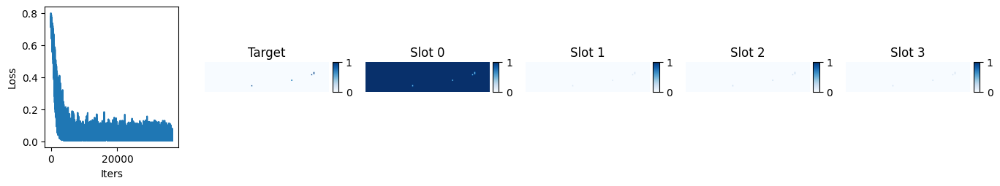

iter 36600 , loss 0.056219496 , lr 5.316387231330288e-06


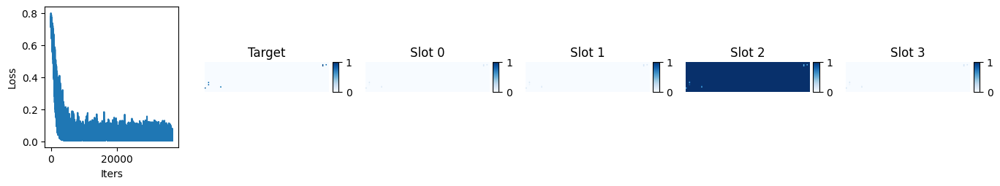

iter 36650 , loss 0.0058100843 , lr 5.1620691743639144e-06


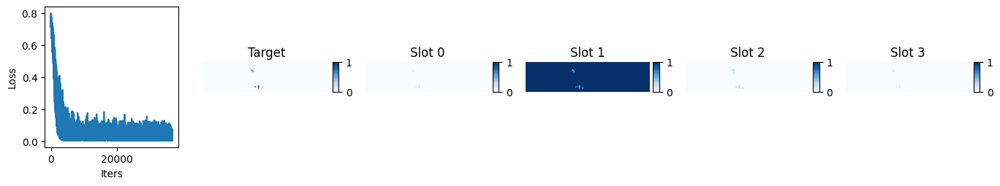

iter 36700 , loss 0.029622894 , lr 5.009984697463909e-06


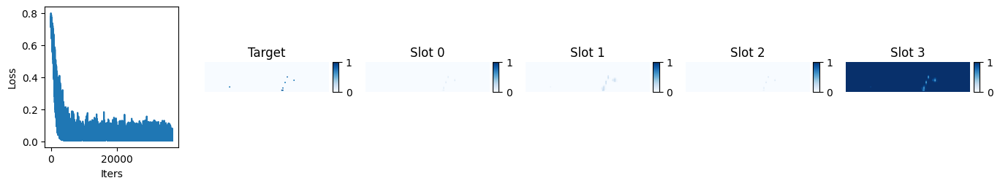

iter 36750 , loss 0.023810023 , lr 4.8601361459610355e-06


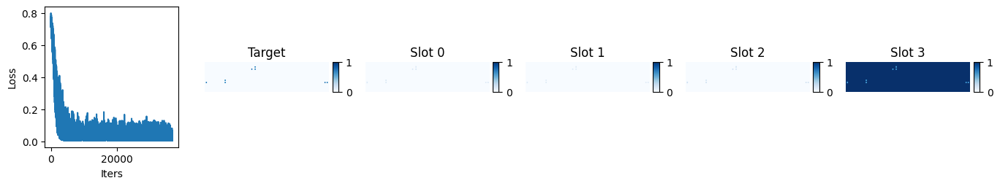

iter 36800 , loss 0.0050775837 , lr 4.712525830705355e-06


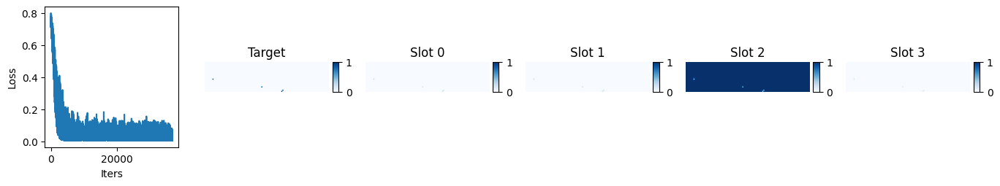

iter 36850 , loss 0.007527874 , lr 4.567156028030472e-06


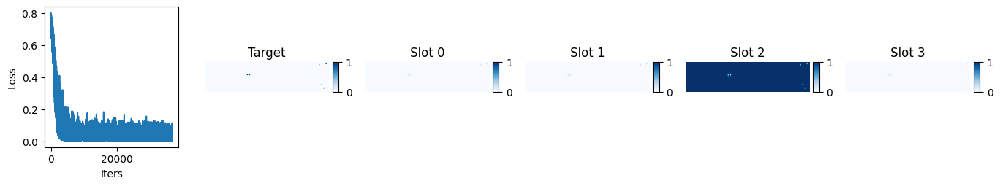

iter 36900 , loss 0.047040723 , lr 4.42402897971863e-06


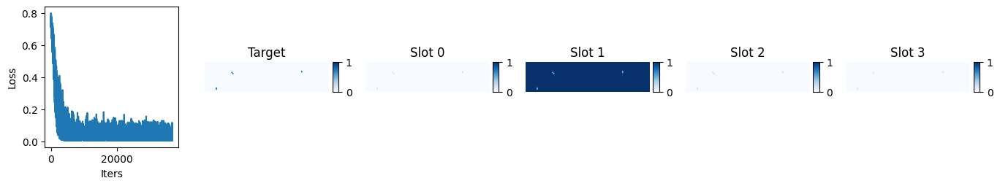

iter 36950 , loss 0.004309355 , lr 4.283146892965972e-06


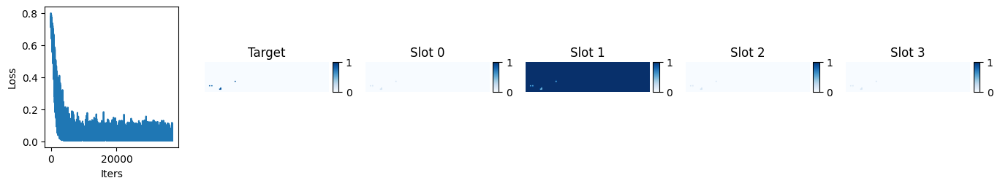

iter 37000 , loss 0.004249646 , lr 4.144511940348516e-06


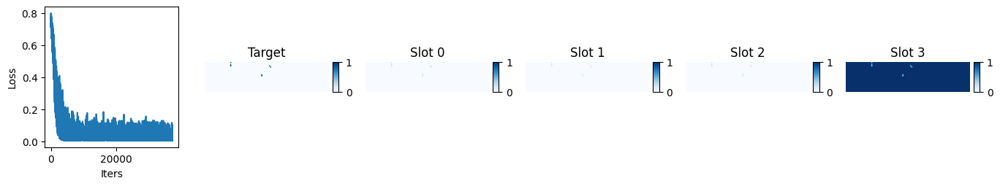

iter 37050 , loss 0.014810823 , lr 4.008126259788752e-06


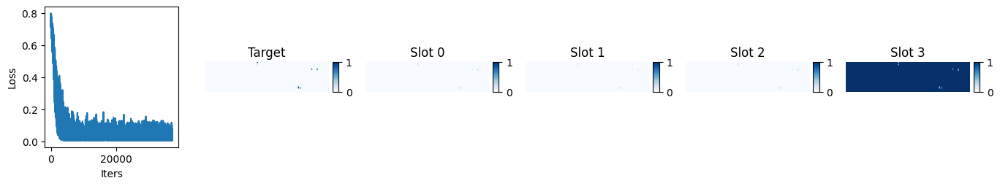

iter 37100 , loss 0.005803233 , lr 3.873991954522598e-06


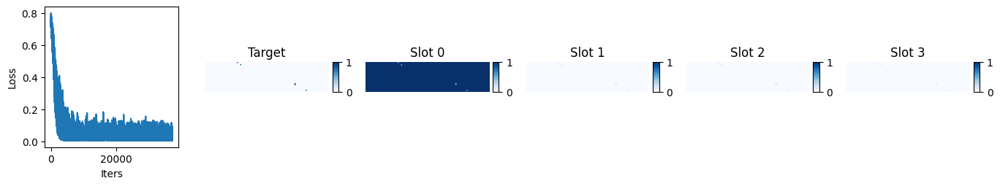

iter 37150 , loss 0.046108257 , lr 3.742111093066963e-06


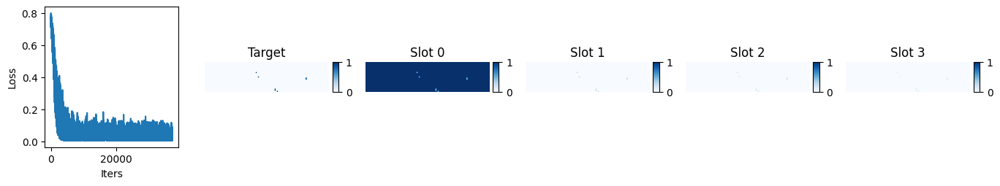

iter 37200 , loss 0.0040888553 , lr 3.612485709187901e-06


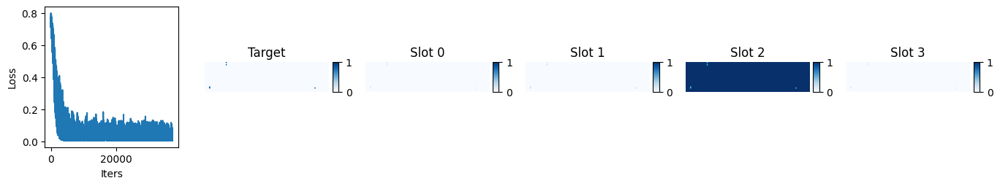

iter 37250 , loss 0.004990735 , lr 3.4851178018691418e-06


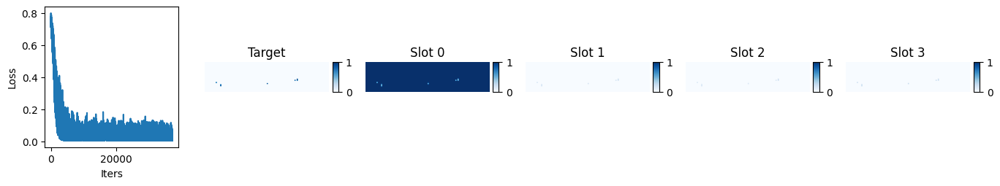

iter 37300 , loss 0.0047689644 , lr 3.3600093352813938e-06


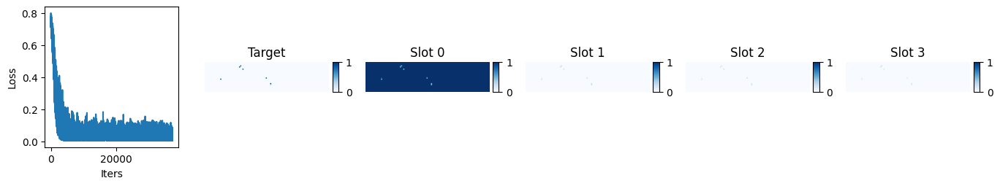

iter 37350 , loss 0.011954104 , lr 3.2371622387520057e-06


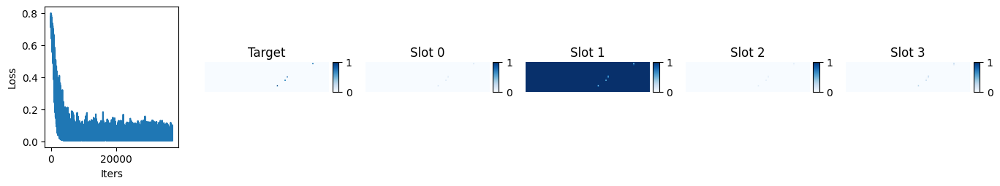

iter 37400 , loss 0.005511569 , lr 3.1165784067351206e-06


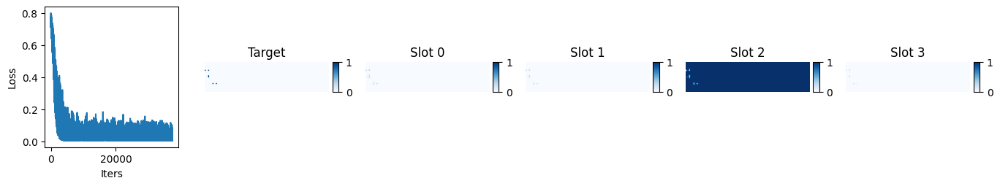

iter 37450 , loss 0.005128886 , lr 2.998259698782668e-06


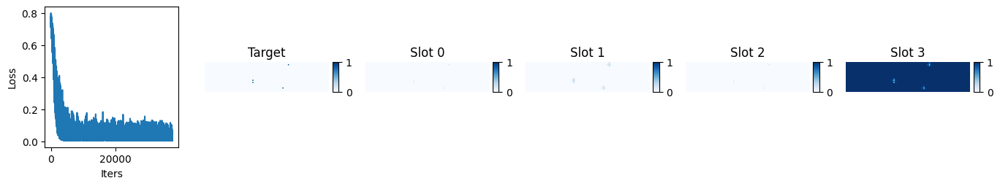

iter 37500 , loss 0.005061402 , lr 2.882207939515435e-06


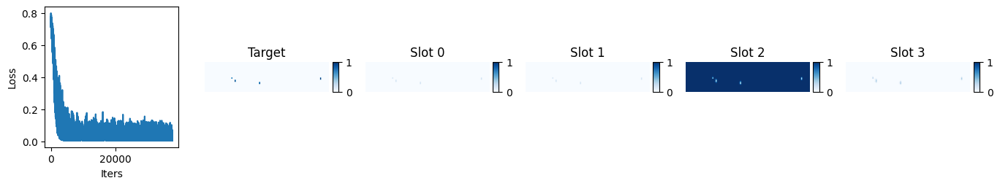

iter 37550 , loss 0.04197194 , lr 2.7684249185951415e-06


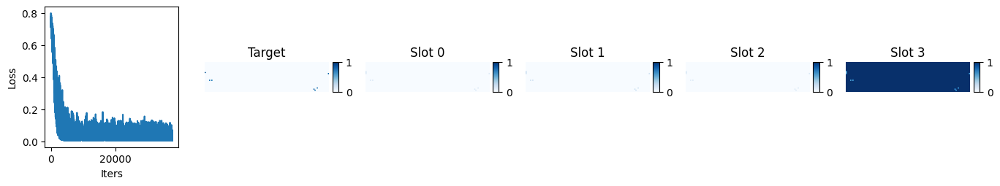

iter 37600 , loss 0.05658355 , lr 2.656912390696708e-06


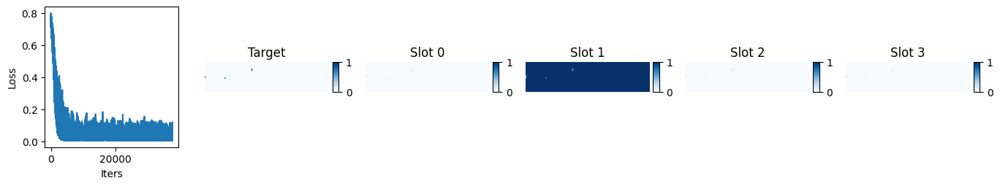

iter 37650 , loss 0.004191221 , lr 2.547672075481266e-06


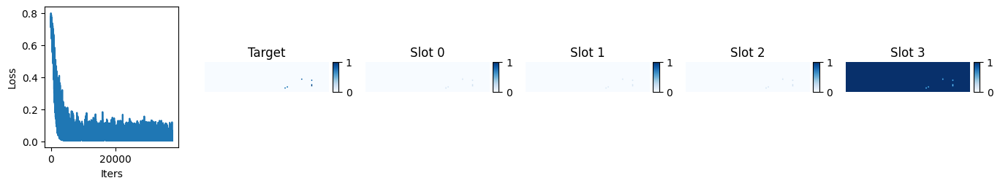

iter 37700 , loss 0.00793445 , lr 2.4407056575696083e-06


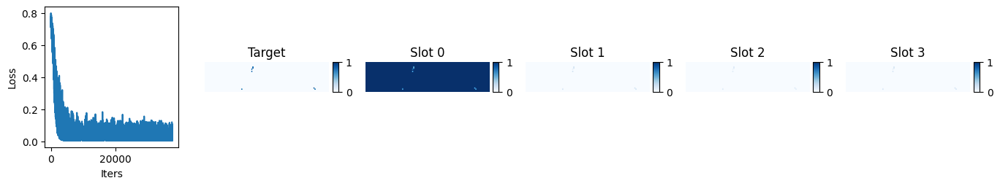

iter 37750 , loss 0.0046838983 , lr 2.3360147865162605e-06


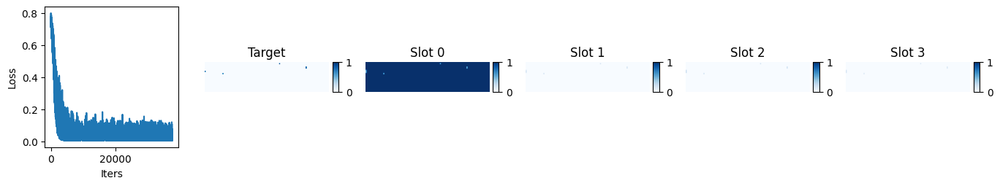

iter 37800 , loss 0.0058213514 , lr 2.2336010767839194e-06


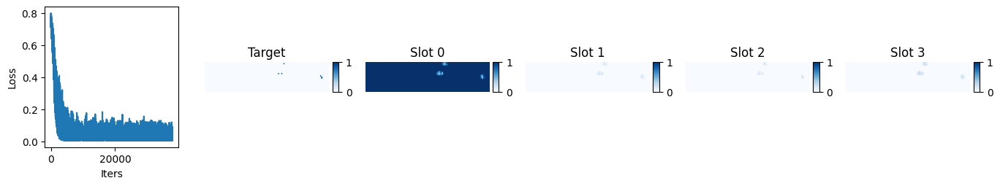

iter 37850 , loss 0.054951336 , lr 2.13346610771869e-06


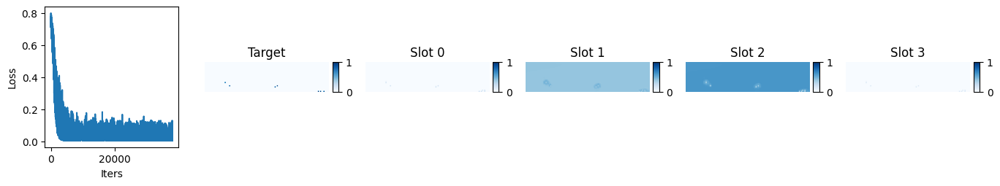

iter 37900 , loss 0.00457149 , lr 2.035611423525685e-06


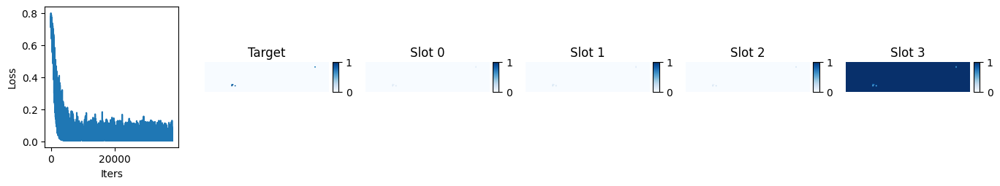

iter 37950 , loss 0.00779589 , lr 1.940038533245164e-06


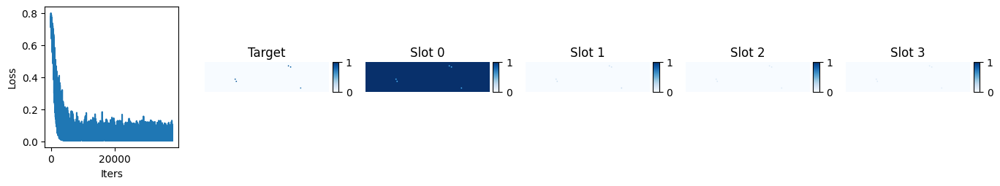

iter 38000 , loss 0.07372759 , lr 1.8467489107293509e-06


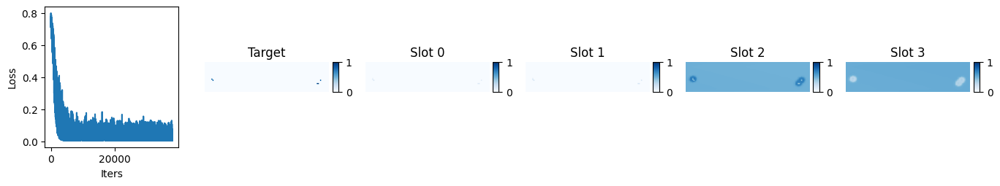

iter 38050 , loss 0.0042003985 , lr 1.7557439946196017e-06


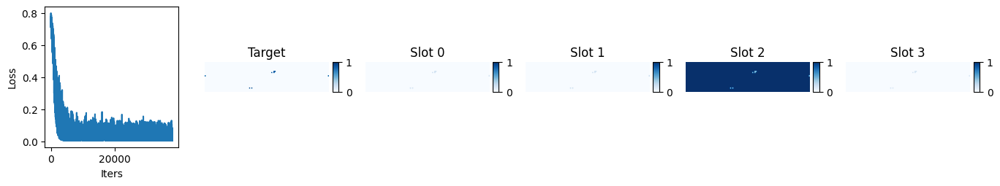

iter 38100 , loss 0.016653473 , lr 1.6670251883243223e-06


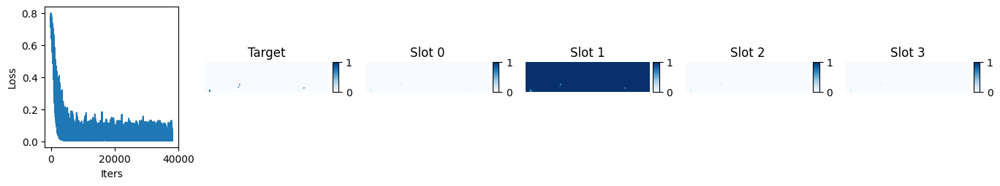

iter 38150 , loss 0.030461423 , lr 1.5805938599972367e-06


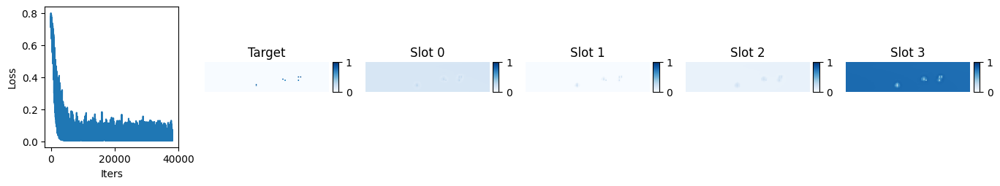

iter 38200 , loss 0.005767349 , lr 1.4964513425163694e-06


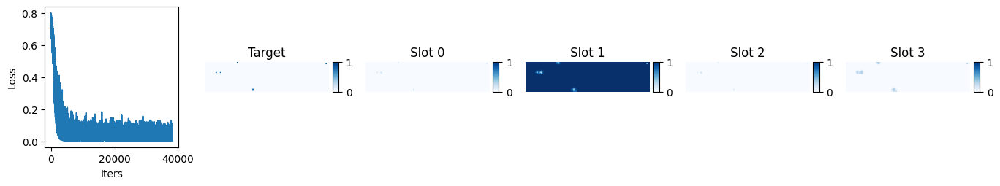

iter 38250 , loss 0.003966699 , lr 1.4145989334634122e-06


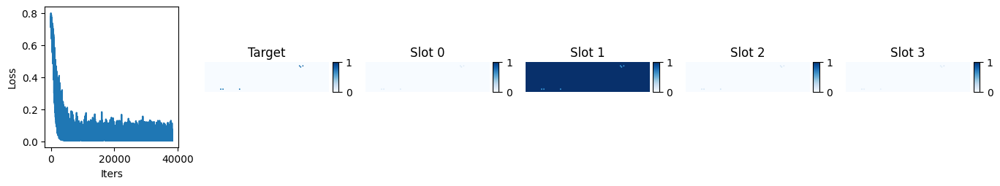

iter 38300 , loss 0.0056208065 , lr 1.335037895103791e-06


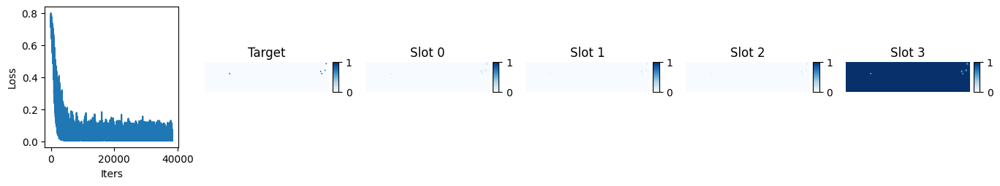

iter 38350 , loss 0.0058307303 , lr 1.2577694543671136e-06


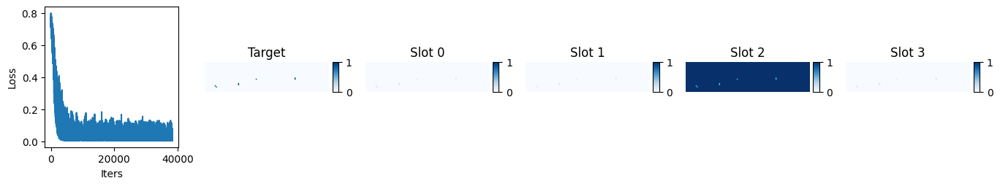

iter 38400 , loss 0.0045054513 , lr 1.1827948028283352e-06


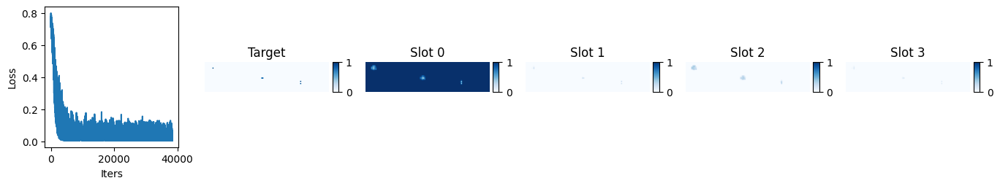

iter 38450 , loss 0.0059285504 , lr 1.1101150966893236e-06


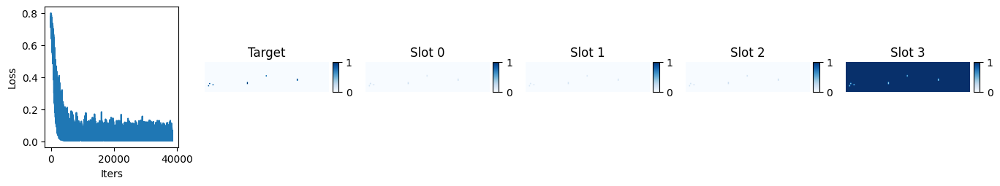

iter 38500 , loss 0.0041091884 , lr 1.0397314567610559e-06


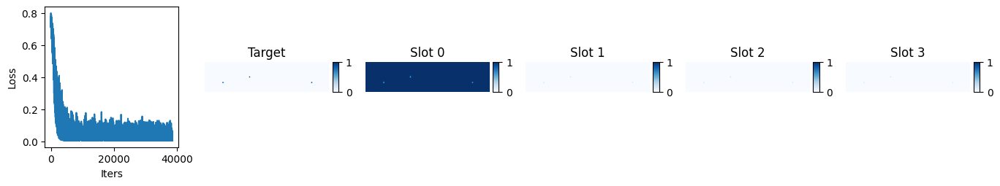

iter 38550 , loss 0.006966706 , lr 9.716449684463502e-07


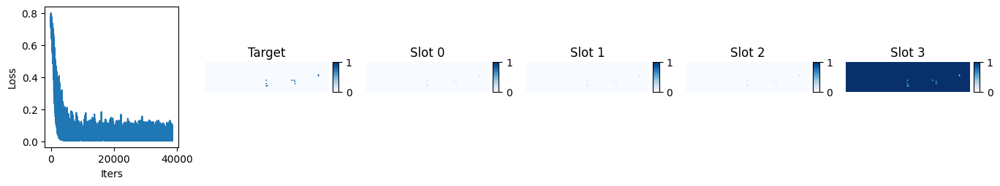

iter 38600 , loss 0.0039969413 , lr 9.058566817230439e-07


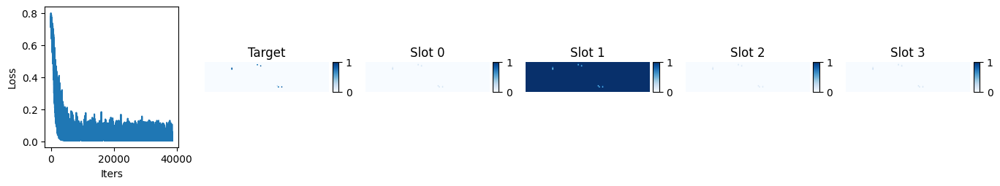

iter 38650 , loss 0.052487805 , lr 8.42367611127942e-07


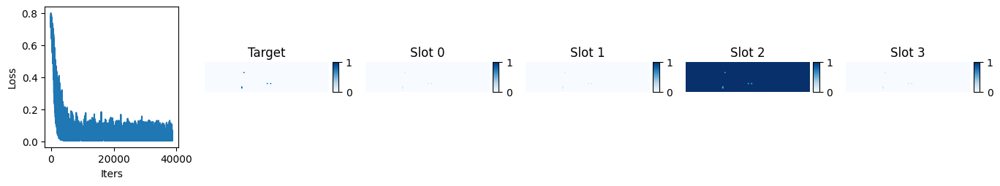

iter 38700 , loss 0.035113 , lr 7.811787357410282e-07


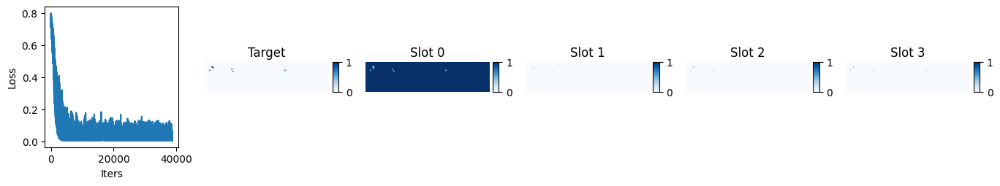

iter 38750 , loss 0.0063692564 , lr 7.222909991704773e-07


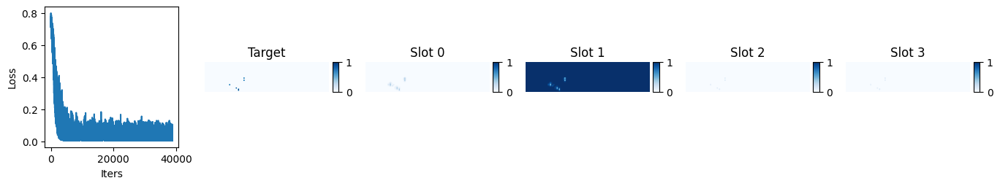

iter 38800 , loss 0.0038433666 , lr 6.657053095380005e-07


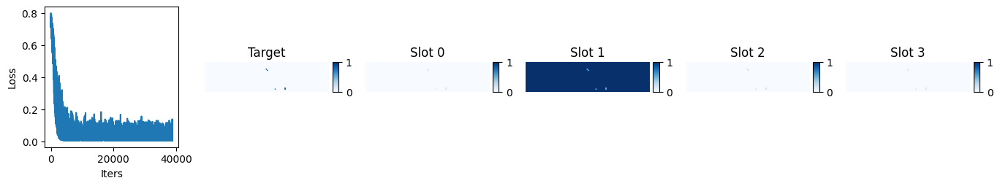

iter 38850 , loss 0.03849649 , lr 6.114225394649563e-07


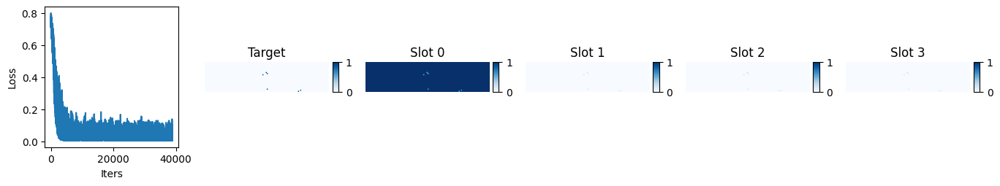

iter 38900 , loss 0.016438311 , lr 5.594435260588115e-07


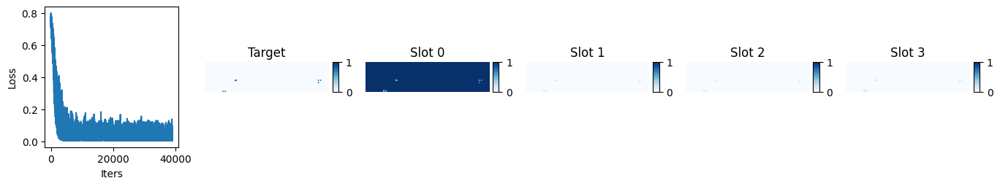

iter 38950 , loss 0.0060012774 , lr 5.097690709002345e-07


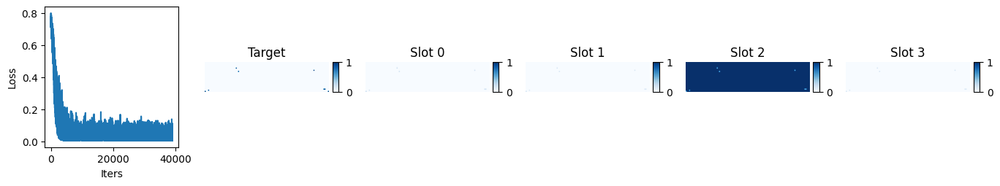

iter 39000 , loss 0.0035553977 , lr 4.623999400308054e-07


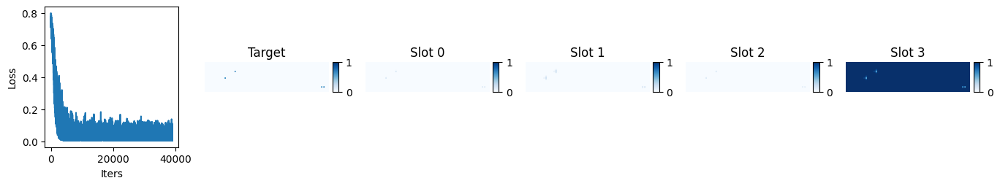

iter 39050 , loss 0.02422155 , lr 4.1733686394109236e-07


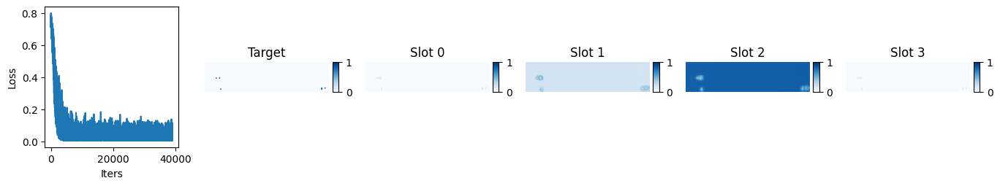

iter 39100 , loss 0.029742053 , lr 3.745805375594935e-07


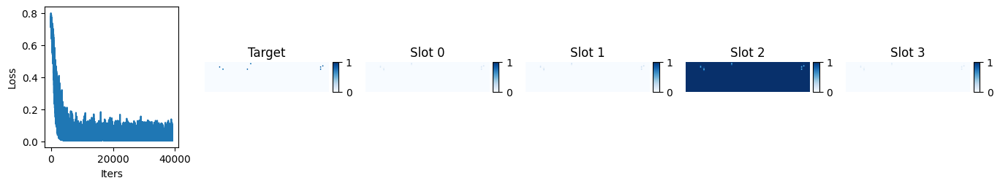

iter 39150 , loss 0.036947843 , lr 3.3413162024142905e-07


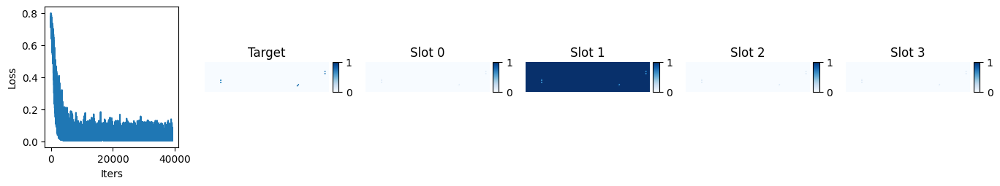

iter 39200 , loss 0.0051599843 , lr 2.959907357592661e-07


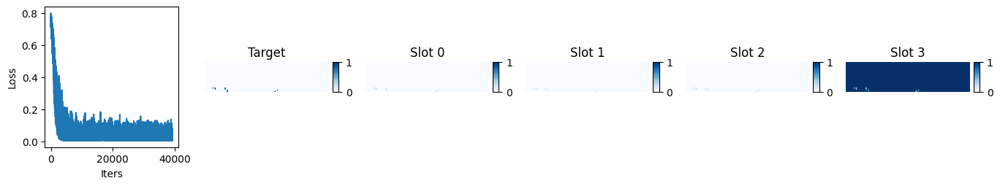

iter 39250 , loss 0.08577158 , lr 2.601584722926098e-07


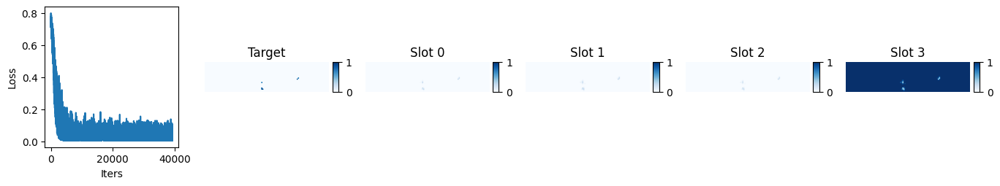

iter 39300 , loss 0.017070707 , lr 2.266353824193101e-07


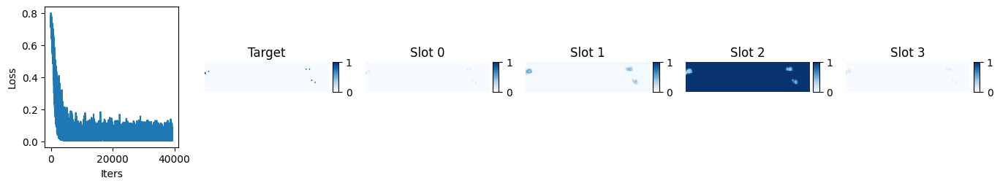

iter 39350 , loss 0.058975127 , lr 1.954219831068693e-07


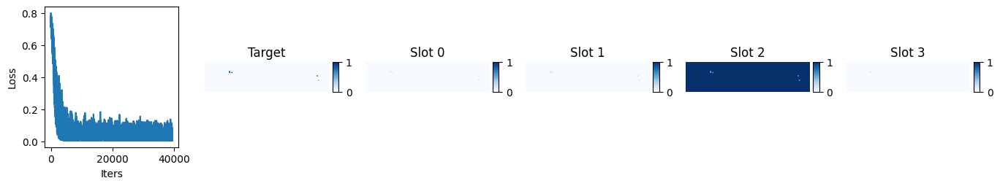

iter 39400 , loss 0.011394974 , lr 1.6651875570451446e-07


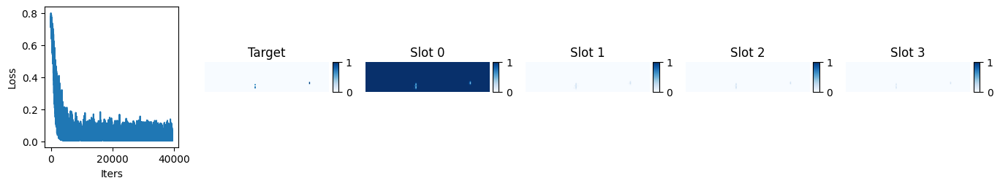

iter 39450 , loss 0.0040598963 , lr 1.399261459357537e-07


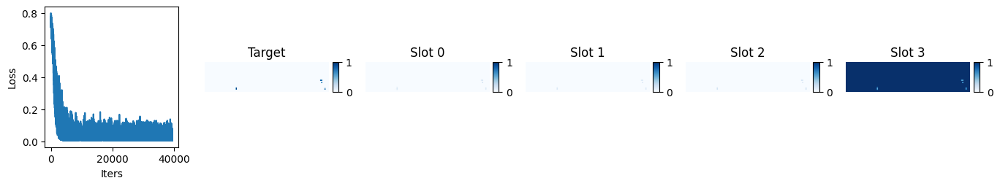

iter 39500 , loss 0.0054853912 , lr 1.1564456389156485e-07


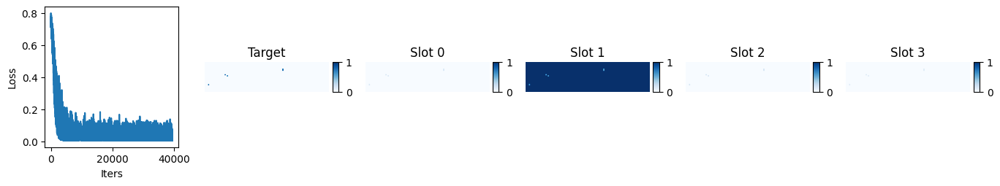

iter 39550 , loss 0.004824469 , lr 9.367438402395066e-08


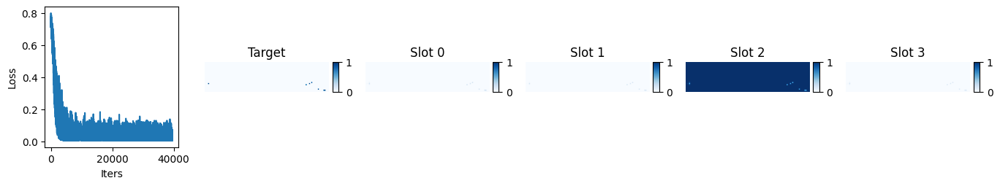

iter 39600 , loss 0.0057736556 , lr 7.401594514025999e-08


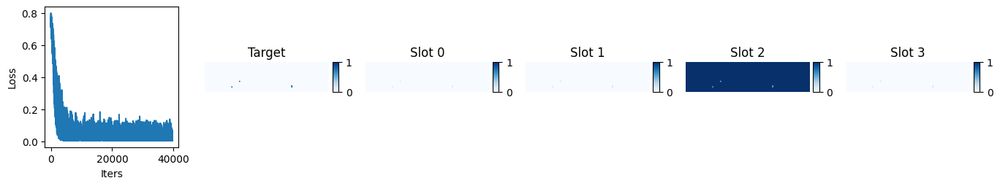

iter 39650 , loss 0.0067098546 , lr 5.666955039797527e-08


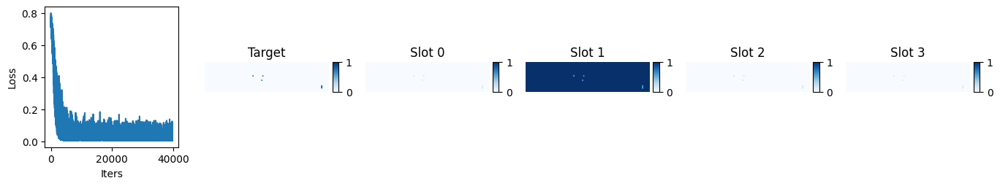

iter 39700 , loss 0.006537774 , lr 4.16354672999164e-08


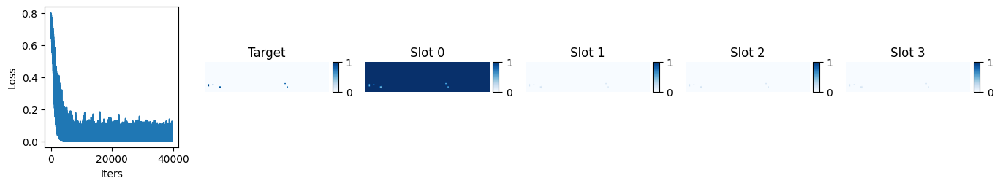

iter 39750 , loss 0.0040224483 , lr 2.8913927690277228e-08


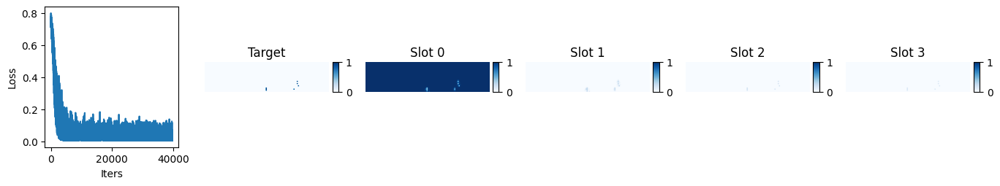

iter 39800 , loss 0.0047789505 , lr 1.850512775091184e-08


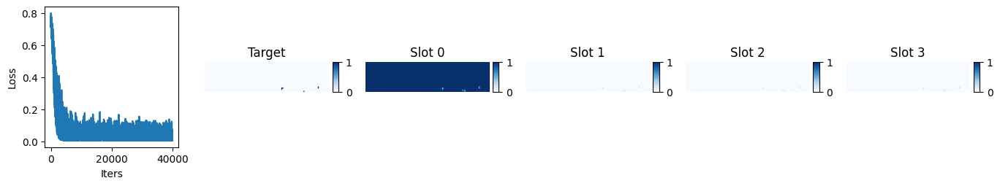

iter 39850 , loss 0.005763651 , lr 1.0409227998403602e-08


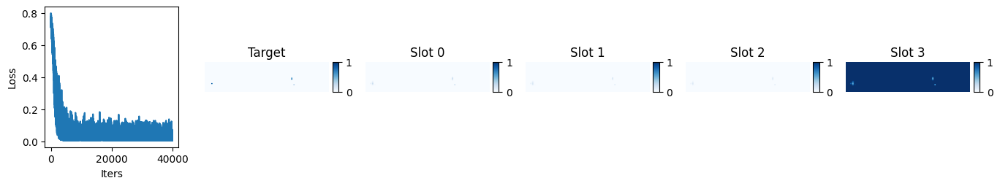

iter 39900 , loss 0.0056489487 , lr 4.6263532815504764e-09


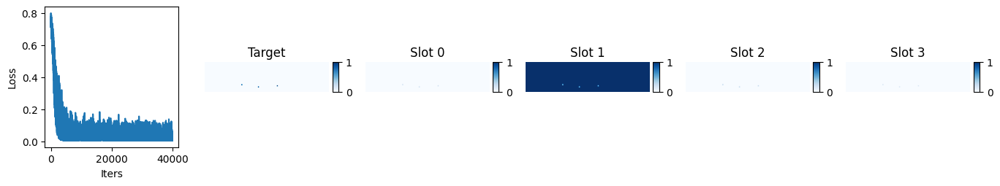

iter 39950 , loss 0.0041302107 , lr 1.1565927794165986e-09


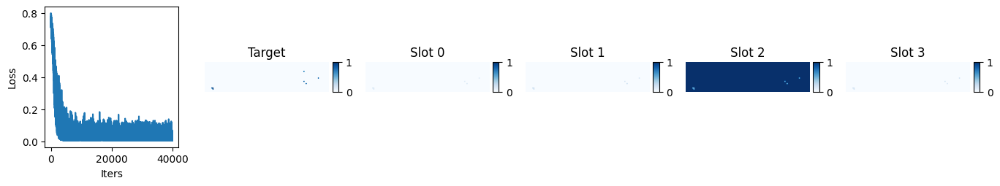

In [13]:
losses=[]

out = train_ISA(m,Ntrain=40_000,bs=bs,device=device,
                modelDir=modelDir,figDir=figDir,plot_every=50)

In [14]:
model, X,Y,mask, init_q, init_pos = out

ValueError: not enough values to unpack (expected 6, got 2)

In [ ]:
queries, pos_scale, att, wts = model(X)

In [ ]:
att[4]

**Ideas:**
1. I could see if an L2 regularization would help
- Plot the min and max of the model parameters over time
2. Would gradient clipping help?
- I feel like it seems more sus smth else in the opt pipeline rn

In [ ]:
encoded_data

In [ ]:
i_fail = 0

In [ ]:
encoded_data = model.CNN_encoder(X) # Apply the CNN encoder
encoded_data = torch.permute(encoded_data,(0,2,3,1)) # Put channel dim at the end
encoded_data = torch.flatten(encoded_data,1,2) # flatten pixel dims
encoded_data = model.dataN(encoded_data)

# Use the init Q from the failure mode
queries = copy(init_q)
pos_scale = copy(init_pos)

'''
Step 3: Iterate through the reconstruction
'''
for i in range(model.n_iter):
    # queries, pos_scale = model.iterate(queries, pos_scale, encoded_data)    

    print('t=',i)
    
    # Get the keys and values in the ref ref frame
    keys, vals = model.get_keys_vals(encoded_data,pos_scale)

    print('keys',keys[i_fail].isnan().sum().item(),f'max {keys[i_fail].max().item():.2f},min {keys[i_fail].min().item():.2f}')
    print('vals',vals[i_fail].isnan().sum().item(),f'max {vals[i_fail].max().item():.2f},min {vals[i_fail].min().item():.2f}')
    
    # att,wts: (bs, k_slots, img_dim)
    att,wts = model.attention_and_weights(model.queryN(queries),keys)   

    print('att',att[i_fail].isnan().sum().item(),f'max {att[i_fail].max().item():.2f},min {att[i_fail].min().item():.2f}')
    print('wts',wts[i_fail].isnan().sum().item(),f'max {wts[i_fail].max().item():.2f},min {wts[i_fail].min().item():.2f}')

    new_pos_scale = model.update_frames(wts)

    # Update the queries with the recurrent block
    updates = torch.einsum('bsd,bsde->bse',wts,vals) # bs, n_slots, query_dim

    updates = model.gru(
        updates.reshape(-1,model.query_dim),
        queries.reshape(-1,model.query_dim),
    )

    queries,pos_scale = updates.reshape(queries.shape), new_pos_scale
    
    
    print(i,queries[i_fail],pos_scale[i_fail])
    
    break
    
    
# # With the final query vector, calc the attn, weights, + rel ref frames
# keys, vals = model.get_keys_vals(encoded_data,pos_scale)
# att, wts = model.attention_and_weights(model.queryN(queries),keys)   
# new_pos_scale = model.update_frames(wts)

In [ ]:
X2, Y2, mask2 = make_batch(N_events=2,device=device, **{'isRing': True, 'N_clusters':2})
        

In [ ]:
# m_cpu = model.to(device)

In [ ]:
model(X2)

In [ ]:
plt.hist(encoded_data.flatten().detach().cpu().numpy())

In [ ]:
# Get the relative position embedding
rel_grid = model.abs_grid.unsqueeze(1) - init_pos[:,:,:2].unsqueeze(2)
rel_grid /= init_pos[:,:,-1].unsqueeze(2).unsqueeze(-1)

# Embed it in the same space as the query dimension 
embed_grid = model.pixel_mult * model.dense( rel_grid )

# keys, vals: (bs, img_dim, query_dim)
k0 = model.toK(encoded_data).unsqueeze(1) + embed_grid
v0 = model.toV(encoded_data).unsqueeze(1) + embed_grid

k0 = model.init_mlp(k0)
v0 = model.init_mlp(v0)

In [ ]:
nb=100
r=(-5,5)
plt.hist(k0.flatten().detach().cpu().numpy(),nb,r,label='keys',
         color='g',histtype='step',lw=2)
plt.hist(v0.flatten().detach().cpu().numpy(),nb,r,label='values',
         color='b',histtype='step',lw=2)

plt.xlabel('features')
plt.ylabel('entries')
plt.legend()
plt.show()

In [ ]:
nb=100
r=(-5,5)
plt.hist(k0[i_fail].flatten().detach().cpu().numpy(),nb,r,label='keys',
         color='g',histtype='step',lw=2)
plt.hist(v0[i_fail].flatten().detach().cpu().numpy(),nb,r,label='values',
         color='b',histtype='step',lw=2)

plt.xlabel('features')
plt.ylabel('entries')
plt.title(f'Event {i_fail} (evt with nans)')
plt.legend()
plt.show()

In [ ]:
k0[i_fail].shape

In [ ]:
k0[i_fail][abs(k0[i_fail])>100]

In [ ]:
v0[i_fail][abs(v0[i_fail])>100]

In [ ]:
for p in model.parameters():
    print(p.shape,p)
    # plt.hist(p.detach().cpu().numpy(),histtype='step')

In [ ]:
losses

In [ ]:
att.isnan().sum()

In [ ]:
for i, att_i in enumerate(att):
    if att_i.isnan().sum() > 0:
        print(i)

In [ ]:
i_fail = 23

In [ ]:
init_q[i_fail]

In [ ]:
init_pos[i_fail]

In [ ]:
np.prod(att.shape)

In [ ]:
init_q

In [ ]:
init_pos

In [ ]:
copy(att)

In [ ]:
att.shape

In [ ]:
m,losses = out

In [ ]:
model, X,Y,mask = out

In [ ]:
queries, pos_scale, att, wts = m(X)
        
print( torch.isnan(att).sum() >0 )

In [ ]:
losses

In [ ]:
# att_img = att[iEvt].reshape(model.k_slots,*resolution)
# plot_kslots(losses, 
#             mask[iEvt].sum(axis=0).detach().cpu().numpy(), 
#             att_img.detach().cpu().numpy(),
#             k_slots, color=color,cmap=cmap,
#             figname=f'{figDir}/loss-slots-iter{i}-evt{iEvt}.jpg',showImg=showImg)
